In [81]:
# Notebook analysising the results of Exp-00
# classic models vs fully trained FGNs from scratch
# how do they compare over random noise

In [82]:
from __future__ import print_function

In [83]:
import matplotlib as mpl
# set this 'backend' when using jupyter; do this before importing pyplot
mpl.use('nbagg')
import matplotlib.pyplot as plt

In [84]:
import torch
import GPUtil
import time

import numpy as np
from scipy import stats

import os
import re
import pickle

import sys
sys.path.append('/home/felix/Research/Adversarial Research/FGN---Research/')
import Finite_Gaussian_Network_lib as fgnl
import Finite_Gaussian_Network_lib.fgn_helper_lib as fgnh

In [85]:
!gpustat

crescent  Tue Apr  7 16:28:48 2020
[0] GeForce RTX 2080 Ti | 35'C,   0 % |  1043 / 10989 MB | felix(1033M)
[1] GeForce RTX 2080 Ti | 38'C,   0 % |   913 / 10989 MB | felix(903M)


In [86]:
# Define what device we are using
print("CUDA Available: ",torch.cuda.is_available())
use_cuda = True
device = torch.device("cuda" if (use_cuda and torch.cuda.is_available()) else "cpu")
print("Using device:", device)

# manualy set cuda device
torch.cuda.set_device(0)

CUDA Available:  True
Using device: cuda


In [87]:
# directory Exp-00
exp_dir = '/home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/'

In [88]:
# Part 0 - stats
# checking what kinds of FGN have been trained

In [89]:
# stats
classic_model_list = []
fgn_model_list = []
converted_fgn_model_list = []
for path, dir,files in os.walk(exp_dir):
    for file in files:
        if 'trained_classic_model_full.pth' in file:
            classic_model_list.append((path,file))
        if 'trained_fgn_model_full.pth' in file:
            fgn_model_list.append((path,file))
        if 'trained_converted_fgn_model_full.pth' in file:
            converted_fgn_model_list.append((path,file))

In [90]:
print('number of trained classic models:', len(classic_model_list))
print('number of trained FGN models:', len(fgn_model_list))
print('number of trained converted FGN models:', len(converted_fgn_model_list))

number of trained classic models: 185
number of trained FGN models: 10104
number of trained converted FGN models: 10360


In [91]:
def extract_params_from_path(path):
    # extracts classic and fgn params from a path, to rebuild from state dict
    # 3 cases: classic model, from scratch model, converted model
    
    results_dict = {}
    
    # get params
    # s1 = last directory
    s1 = re.split('/', path)[-1]
    
    s2 = re.split('_|\[|\]', s1)
    
    # to align with other cases
    if s2[0] == 'converted':
        s2 = s2[1:]
    
    s3 = re.split(',', s2[2])
    if s3==['']:
        number = 0 
        size = 0
    else:
        number = len(re.split(',', s2[2]))
        size = int(re.split(',', s2[2])[0])
    
    results_dict['hidden_layers_sizes'] = [size for _ in range(number)]
    
    drop_prob = float(s2[4][2:])
    results_dict['drop_p'] = drop_prob
    
    # fgn specific
    try:
        covar_type = s2[5]
        if covar_type in ['sphere', 'diag']:
            results_dict['covar_type'] = covar_type
    except:
        pass
    try:
        ordinal = float(s2[6][3:])
        if ordinal in [0.5, 1.0, 2.0, 5.0]:
            results_dict['ordinal'] = ordinal
    except:
        pass
    try:
        ls = float(s2[7][2:])
        if ls in [8e-08, 8e-07, 4e-06, 8e-06, 1.6e-05, 8e-05, 0.0008]:
            results_dict['lmbda_sigma'] = ls
    except:
        pass

    return results_dict

In [92]:
# test
extract_params_from_path(converted_fgn_model_list[0][0])

{'covar_type': 'sphere',
 'drop_p': 0.4,
 'hidden_layers_sizes': [1024],
 'lmbda_sigma': 8e-06,
 'ordinal': 1.0}

In [93]:
hidden_layer_sizes = [0, 16, 64, 256, 1024]
hidden_layer_numbers  = [0, 1, 2, 3]
dropout_probs = [0.0, 0.1, 0.4]

In [94]:
# classic network counts
# count all params
layer_number_counts = {key:0 for key in hidden_layer_numbers}
layer_sizes_counts = {key:0 for key in hidden_layer_sizes}
dp_counts = {key:0  for key in dropout_probs}

# for each path
for path,_ in classic_model_list:
    
    params = extract_params_from_path(path)
    hl_number = len(params['hidden_layers_sizes'])
    if hl_number > 0:
        hl_size = params['hidden_layers_sizes'][0]
    else:
        hl_size = 0
    drop_p = params['drop_p']
    
    
    # add to dicts
    layer_number_counts[hl_number]+=1
    layer_sizes_counts[hl_size]+=1
    dp_counts[drop_p]+=1

In [95]:
for number in layer_number_counts.keys():
    print('{} classic networks with {} hidden layers'.format(layer_number_counts[number],number))
    
for size in layer_sizes_counts.keys():
    print('{} classic networks with size {} hidden layers'.format(layer_sizes_counts[size],size))

for dp in dp_counts.keys():
    print('{} classic networks with drop prob {}'.format(dp_counts[dp],dp))

5 classic networks with 0 hidden layers
60 classic networks with 1 hidden layers
60 classic networks with 2 hidden layers
60 classic networks with 3 hidden layers
5 classic networks with size 0 hidden layers
45 classic networks with size 16 hidden layers
45 classic networks with size 1024 hidden layers
45 classic networks with size 64 hidden layers
45 classic networks with size 256 hidden layers
65 classic networks with drop prob 0.0
60 classic networks with drop prob 0.4
60 classic networks with drop prob 0.1


In [96]:
# FGN specific params
covar_types = ['sphere', 'diag']
ordinals = [0.5, 1.0, 2.0, 5.0]
lmbda_sigmas = [8e-08, 8e-07, 4e-06, 8e-06, 1.6e-05, 8e-05, 0.0008]

In [97]:
# fgn network counts
# count all params
layer_number_counts = {key:0 for key in hidden_layer_numbers}
layer_sizes_counts = {key:0 for key in hidden_layer_sizes}
dp_counts = {key:0  for key in dropout_probs}
covar_types_count = {key:0  for key in covar_types}
ordinals_counts = {key:0  for key in ordinals}
lmbda_sigmas_count = {key:0  for key in lmbda_sigmas}

# for each path
for path,_ in fgn_model_list:
    # get params
    params = extract_params_from_path(path)
    hl_number = len(params['hidden_layers_sizes'])
    if hl_number > 0:
        hl_size = params['hidden_layers_sizes'][0]
    else:
        hl_size = 0
    drop_p = params['drop_p']
    covar_type = params['covar_type']
    ordinal = params['ordinal']
    lmbda_sigma = params['lmbda_sigma']
    
    # add to dicts
    layer_number_counts[hl_number]+=1
    layer_sizes_counts[hl_size]+=1
    dp_counts[drop_p]+=1
    covar_types_count[covar_type]+=1
    ordinals_counts[ordinal]+=1
    lmbda_sigmas_count[lmbda_sigma]+=1

In [98]:
for number in layer_number_counts.keys():
    print('{} fgn networks with {} hidden layers'.format(layer_number_counts[number],number))
    
for size in layer_sizes_counts.keys():
    print('{} fgn networks with size {} hidden layers'.format(layer_sizes_counts[size],size))

for dp in dp_counts.keys():
    print('{} fgn networks with drop prob {}'.format(dp_counts[dp],dp))
    
for covar in covar_types_count.keys():
    print('{} fgn networks with {} covariance matrix'.format(covar_types_count[covar],covar))
    
for ordinal in ordinals_counts.keys():
    print('{} fgn networks with {} ordinal '.format(ordinals_counts[ordinal],ordinal))

for ls in lmbda_sigmas_count.keys():
    print('{} fgn networks with lmbda_sigma of {}'.format(lmbda_sigmas_count[ls],ls))

280 fgn networks with 0 hidden layers
3360 fgn networks with 1 hidden layers
3348 fgn networks with 2 hidden layers
3116 fgn networks with 3 hidden layers
280 fgn networks with size 0 hidden layers
2520 fgn networks with size 16 hidden layers
2264 fgn networks with size 1024 hidden layers
2520 fgn networks with size 64 hidden layers
2520 fgn networks with size 256 hidden layers
3558 fgn networks with drop prob 0.0
3279 fgn networks with drop prob 0.4
3267 fgn networks with drop prob 0.1
5096 fgn networks with sphere covariance matrix
5008 fgn networks with diag covariance matrix
2530 fgn networks with 0.5 ordinal 
2524 fgn networks with 1.0 ordinal 
2526 fgn networks with 2.0 ordinal 
2524 fgn networks with 5.0 ordinal 
1440 fgn networks with lmbda_sigma of 4e-06
1445 fgn networks with lmbda_sigma of 8e-05
1446 fgn networks with lmbda_sigma of 1.6e-05
1444 fgn networks with lmbda_sigma of 8e-08
1441 fgn networks with lmbda_sigma of 8e-07
1444 fgn networks with lmbda_sigma of 0.0008
144

In [99]:
# converted networks count
# fgn network counts
# count all params
layer_number_counts = {key:0 for key in hidden_layer_numbers}
layer_sizes_counts = {key:0 for key in hidden_layer_sizes}
dp_counts = {key:0  for key in dropout_probs}
covar_types_count = {key:0  for key in covar_types}
ordinals_counts = {key:0  for key in ordinals}
lmbda_sigmas_count = {key:0  for key in lmbda_sigmas}

# for each path
for path,_ in converted_fgn_model_list:
    # get params
    params = extract_params_from_path(path)
    hl_number = len(params['hidden_layers_sizes'])
    if hl_number > 0:
        hl_size = params['hidden_layers_sizes'][0]
    else:
        hl_size = 0
    drop_p = params['drop_p']
    covar_type = params['covar_type']
    ordinal = params['ordinal']
    lmbda_sigma = params['lmbda_sigma']
    
    # add to dicts
    layer_number_counts[hl_number]+=1
    layer_sizes_counts[hl_size]+=1
    dp_counts[drop_p]+=1
    covar_types_count[covar_type]+=1
    ordinals_counts[ordinal]+=1
    lmbda_sigmas_count[lmbda_sigma]+=1

In [100]:
for number in layer_number_counts.keys():
    print('{} converted networks with {} hidden layers'.format(layer_number_counts[number],number))
    
for size in layer_sizes_counts.keys():
    print('{} converted networks with size {} hidden layers'.format(layer_sizes_counts[size],size))

for dp in dp_counts.keys():
    print('{} converted networks with drop prob {}'.format(dp_counts[dp],dp))
    
for covar in covar_types_count.keys():
    print('{} converted networks with {} covariance matrix'.format(covar_types_count[covar],covar))
    
for ordinal in ordinals_counts.keys():
    print('{} converted networks with {} ordinal '.format(ordinals_counts[ordinal],ordinal))

for ls in lmbda_sigmas_count.keys():
    print('{} converted networks with lmbda_sigma of {}'.format(lmbda_sigmas_count[ls],ls))


280 converted networks with 0 hidden layers
3360 converted networks with 1 hidden layers
3360 converted networks with 2 hidden layers
3360 converted networks with 3 hidden layers
280 converted networks with size 0 hidden layers
2520 converted networks with size 16 hidden layers
2520 converted networks with size 1024 hidden layers
2520 converted networks with size 64 hidden layers
2520 converted networks with size 256 hidden layers
3640 converted networks with drop prob 0.0
3360 converted networks with drop prob 0.4
3360 converted networks with drop prob 0.1
5180 converted networks with sphere covariance matrix
5180 converted networks with diag covariance matrix
2590 converted networks with 0.5 ordinal 
2590 converted networks with 1.0 ordinal 
2590 converted networks with 2.0 ordinal 
2590 converted networks with 5.0 ordinal 
1480 converted networks with lmbda_sigma of 4e-06
1480 converted networks with lmbda_sigma of 8e-05
1480 converted networks with lmbda_sigma of 1.6e-05
1480 conve

In [101]:
# Part 0 - comparison of performance
# how do FGNs trained from scratch perform in accuracy over MNIST compared to classic NN
# and how do converted ones do?

In [102]:
classic_models_test_acc = []
classic_models_train_acc = []

for classic_model_path, filename  in classic_model_list:
    print('Working on {}'.format(classic_model_path))
    
    # load train history
    train_history = pickle.load(open(classic_model_path + '/train_histories.pckl', 'rb')) 
    # add to list for histogram
    classic_models_test_acc.append(train_history['test_acc_hist'])
    classic_models_train_acc.append(train_history['train_acc_hist'])
    

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.4_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.4_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.4_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.0_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.1_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.4_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.1_ite2
Working on /home/fe

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.1_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.0_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.4_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.1_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.0_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.4_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.0_ite3
Working on /home/fel

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.4_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.0_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.0_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.4_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.0_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.1_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.4_ite4
Working o

In [103]:
stats.describe(classic_models_test_acc)

DescribeResult(nobs=185, minmax=(array([77.97, 84.16, 87.39, 87.54, 88.84]), array([95.47, 96.91, 97.35, 97.57, 97.73])), mean=array([92.48448649, 94.44718919, 95.25048649, 95.66      , 95.91048649]), variance=array([7.08361074, 4.88505945, 4.32415574, 4.24490217, 3.93656552]), skewness=array([-2.77793195, -1.66250966, -1.52370141, -1.57805983, -1.55031889]), kurtosis=array([10.73110734,  3.71702205,  2.29337137,  2.23866032,  1.82877212]))

In [104]:
fgn_models_test_acc = []
fgn_models_train_acc = []

for fgn_model_path, filename  in fgn_model_list:
    print('Working on {}'.format(fgn_model_path))
    
    # load train history
    train_history = pickle.load(open(fgn_model_path + '/train_histories.pckl', 'rb')) 
    # add to list for histogram
    fgn_models_test_acc.append(train_history['test_acc_hist'])
    fgn_models_train_acc.append(train_history['train_acc_hist'])
    

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_diag_ord5.0_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_diag_ord5.0_ls8e-08_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.1_diag_ord1.0_ls1.6e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_diag_ord0.5_ls8e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.4_diag_ord2.0_ls8e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_sphere_ord1.0_ls8e-07_ite4
Working on /home/felix/Research

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_diag_ord0.5_ls4e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.1_sphere_ord5.0_ls8e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_sphere_ord5.0_ls4e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_sphere_ord0.5_ls1.6e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.0_diag_ord5.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_sphere_ord0.5_ls0.0008_ite1
Working on /home/

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_sphere_ord1.0_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_sphere_ord0.5_ls8e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_sphere_ord2.0_ls8e-07_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_diag_ord5.0_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_sphere_ord2.0_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_diag_ord5.0_ls8e-06_ite2
Working on

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_sphere_ord2.0_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_sphere_ord2.0_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_diag_ord1.0_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_sphere_ord2.0_ls1.6e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_diag_ord5.0_ls4e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_sphere_ord0.5_ls8e-05_ite3
Working on /ho

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_sphere_ord0.5_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_diag_ord1.0_ls8e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.0_diag_ord1.0_ls8e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_diag_ord5.0_ls4e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.1_sphere_ord1.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_diag_ord1.0_ls8e-07_ite3
Working on /home/felix/Resear

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_sphere_ord5.0_ls8e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_diag_ord2.0_ls0.0008_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.1_diag_ord0.5_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.4_sphere_ord0.5_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.1_sphere_ord0.5_ls8e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_diag_ord2.0_ls8e-05_ite2
Working on 

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.1_sphere_ord0.5_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.4_diag_ord5.0_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_diag_ord0.5_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.0_diag_ord0.5_ls4e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_diag_ord5.0_ls8e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_sphere_ord1.0_ls4e-06_ite3
Working on /home/felix/Research/Adversar

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.1_diag_ord1.0_ls8e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_sphere_ord0.5_ls8e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_diag_ord0.5_ls0.0008_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord1.0_ls4e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_sphere_ord5.0_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.0_sphere_ord0.5_ls1.6e-05_ite2
Working on /hom

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_diag_ord1.0_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord1.0_ls8e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.0_diag_ord0.5_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_sphere_ord2.0_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.1_diag_ord0.5_ls8e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_diag_ord2.0_ls8e-07_ite3
Working on /home/felix/Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_diag_ord0.5_ls4e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.1_diag_ord1.0_ls8e-07_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_sphere_ord0.5_ls4e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.0_sphere_ord2.0_ls8e-08_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_diag_ord0.5_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_diag_ord5.0_ls1.6e-05_ite3
Working on /home/fe

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_diag_ord1.0_ls4e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.1_diag_ord2.0_ls8e-07_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_sphere_ord5.0_ls1.6e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.1_diag_ord0.5_ls8e-08_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_diag_ord5.0_ls1.6e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.4_diag_ord2.0_ls0.0008_ite1
Working on /home/felix/Resear

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_diag_ord2.0_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_diag_ord0.5_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_diag_ord2.0_ls4e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_sphere_ord2.0_ls8e-07_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.4_diag_ord1.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_sphere_ord0.5_ls1.6e-05_ite3
Working on /home/felix/Research/

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.1_diag_ord2.0_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.0_diag_ord2.0_ls8e-07_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_sphere_ord2.0_ls8e-08_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.0_diag_ord1.0_ls0.0008_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_diag_ord1.0_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.1_sphere_ord0.5_ls8e-07_ite4
Working on /ho

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_diag_ord1.0_ls1.6e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_diag_ord5.0_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_sphere_ord5.0_ls8e-08_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_diag_ord1.0_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.1_diag_ord1.0_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_diag_ord5.0_ls1.6e-05_ite0
Working on /

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_sphere_ord1.0_ls8e-07_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.1_sphere_ord2.0_ls8e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.1_sphere_ord5.0_ls8e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_diag_ord1.0_ls8e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_diag_ord2.0_ls8e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_sphere_ord5.0_ls8e-07_ite2
Working on

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.4_sphere_ord0.5_ls8e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_diag_ord0.5_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.4_sphere_ord2.0_ls8e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_sphere_ord5.0_ls0.0008_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_sphere_ord1.0_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_sphere_ord0.5_ls8e-08_ite1
Working on /home/felix/R

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_sphere_ord1.0_ls1.6e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.1_diag_ord1.0_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_sphere_ord2.0_ls8e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_diag_ord5.0_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_diag_ord5.0_ls4e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_diag_ord2.0_ls1.6e-05_ite3
Working on /home/felix/R

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_sphere_ord0.5_ls8e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_sphere_ord0.5_ls8e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_diag_ord5.0_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.1_diag_ord5.0_ls8e-07_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_sphere_ord2.0_ls0.0008_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_sphere_ord2.0_ls8e-06_ite3
Working on /home/felix/Rese

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.1_sphere_ord2.0_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_sphere_ord1.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.1_sphere_ord0.5_ls1.6e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_sphere_ord0.5_ls8e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.1_diag_ord1.0_ls8e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.0_diag_ord2.0_ls8e-08_ite2
Working on

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_sphere_ord5.0_ls8e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_sphere_ord0.5_ls8e-08_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord5.0_ls4e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_diag_ord1.0_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_diag_ord0.5_ls8e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_sphere_ord1.0_ls8e-07_ite3
Working on /home/felix/Res

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_diag_ord1.0_ls4e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_sphere_ord1.0_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_diag_ord1.0_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.0_sphere_ord1.0_ls8e-07_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.4_diag_ord1.0_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_diag_ord2.0_ls4e-06_ite4
Working on /home/felix/Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_diag_ord2.0_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.0_sphere_ord0.5_ls0.0008_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_diag_ord5.0_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_diag_ord0.5_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.1_diag_ord2.0_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.1_diag_ord0.5_ls8e-07_ite2
Working

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_sphere_ord0.5_ls8e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_diag_ord5.0_ls8e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_sphere_ord5.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_diag_ord1.0_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_sphere_ord0.5_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_diag_ord1.0_ls4e-06_ite2
Working on /home/felix/Resea

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_diag_ord1.0_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_sphere_ord0.5_ls0.0008_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_sphere_ord2.0_ls1.6e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.1_sphere_ord2.0_ls8e-07_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_sphere_ord2.0_ls8e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_diag_ord5.0_ls8e-05_ite1
Working on /home/

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.0_sphere_ord2.0_ls8e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_sphere_ord2.0_ls1.6e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_sphere_ord2.0_ls8e-07_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_diag_ord5.0_ls8e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.1_sphere_ord2.0_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_diag_ord0.5_ls1.6e-05_ite4

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_sphere_ord2.0_ls8e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_sphere_ord5.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_diag_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_sphere_ord1.0_ls1.6e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.0_diag_ord1.0_ls0.0008_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.0_sphere_ord2.0_ls4e-06_ite1
Working on /home/fe

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_diag_ord0.5_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_diag_ord5.0_ls0.0008_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_sphere_ord0.5_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_sphere_ord2.0_ls8e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.4_sphere_ord1.0_ls0.0008_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_diag_ord2.0_ls4e-06_ite1
Working on /ho

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_sphere_ord0.5_ls1.6e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.1_diag_ord1.0_ls8e-08_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_diag_ord2.0_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_diag_ord1.0_ls8e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_sphere_ord0.5_ls1.6e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_diag_ord1.0_ls8e-06_ite4
Working on /home/felix

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_sphere_ord5.0_ls1.6e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.4_sphere_ord0.5_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_sphere_ord1.0_ls8e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_diag_ord5.0_ls8e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_sphere_ord1.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.1_diag_ord0.5_ls8e-07_ite1
Working on /home/felix/Research/Advers

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_sphere_ord5.0_ls4e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_diag_ord2.0_ls1.6e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_diag_ord0.5_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_sphere_ord2.0_ls8e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.1_sphere_ord0.5_ls0.0008_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.1_diag_ord1.0_ls8e-06_ite2
Working on /hom

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_diag_ord2.0_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_diag_ord5.0_ls8e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_diag_ord0.5_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.1_sphere_ord2.0_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.1_sphere_ord2.0_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_diag_ord2.0_ls8e-06_ite1
Working on /home/felix/Research

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_diag_ord2.0_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.1_sphere_ord0.5_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.4_sphere_ord5.0_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_sphere_ord1.0_ls0.0008_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_diag_ord1.0_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_sphere_ord0.5_ls8e-07_ite4
Working on /home/feli

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.4_sphere_ord1.0_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.1_sphere_ord1.0_ls0.0008_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_diag_ord0.5_ls4e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_sphere_ord5.0_ls4e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_sphere_ord5.0_ls8e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_diag_ord5.0_ls8e-08_ite4


Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_diag_ord5.0_ls1.6e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_sphere_ord5.0_ls8e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_diag_ord5.0_ls4e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_sphere_ord0.5_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord5.0_ls8e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_sphere_ord5.0_ls0.0008_ite3
Working on /home

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.0_sphere_ord5.0_ls4e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_sphere_ord5.0_ls8e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_sphere_ord1.0_ls4e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_diag_ord5.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.4_diag_ord5.0_ls0.0008_ite1
Working on /home/fe

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_diag_ord5.0_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_sphere_ord0.5_ls0.0008_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord0.5_ls8e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_sphere_ord1.0_ls4e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_sphere_ord1.0_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.0_diag_ord2.0_ls8e-06_ite3
Working on /home/felix/R

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.0_sphere_ord2.0_ls8e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_diag_ord5.0_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_diag_ord0.5_ls1.6e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.0_diag_ord2.0_ls4e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_sphere_ord5.0_ls8e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_diag_ord2.0_ls8e-05_ite1
Working on /home/felix/Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_diag_ord0.5_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_diag_ord0.5_ls1.6e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_sphere_ord1.0_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_diag_ord2.0_ls8e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.4_diag_ord1.0_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_sphere_ord2.0_ls4e-06_ite2
Working on /home/feli

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_diag_ord1.0_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_sphere_ord5.0_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_sphere_ord0.5_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_diag_ord2.0_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.1_diag_ord5.0_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.1_diag_ord2.0_ls8e-05_ite3
Working on /home/felix

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_diag_ord5.0_ls8e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_diag_ord0.5_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord5.0_ls8e-07_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.1_diag_ord1.0_ls8e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_diag_ord0.5_ls4e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_sphere_ord5.0_ls8e-07_ite4
Working on /home/felix/R

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_diag_ord5.0_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_diag_ord0.5_ls8e-08_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_sphere_ord1.0_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.1_diag_ord2.0_ls0.0008_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_diag_ord0.5_ls8e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_sphere_ord2.0_ls8e-06_ite2
Working 

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_sphere_ord1.0_ls8e-08_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_diag_ord2.0_ls1.6e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_diag_ord5.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.0_diag_ord0.5_ls8e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_diag_ord2.0_ls8e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_diag_ord5.0_ls8e-08_ite3
Working on /home/felix/Res

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_diag_ord5.0_ls8e-07_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_sphere_ord2.0_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_diag_ord5.0_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_sphere_ord0.5_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_diag_ord5.0_ls8e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_sphere_ord1.0_ls8e-06_ite1
Working on /home/felix/Researc

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_diag_ord5.0_ls4e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_diag_ord2.0_ls8e-07_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.1_sphere_ord2.0_ls4e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_sphere_ord2.0_ls8e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_diag_ord1.0_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_sphere_ord5.0_ls8e-08_ite0
Working on /home/felix/Res

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_diag_ord0.5_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.0_sphere_ord2.0_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_diag_ord1.0_ls1.6e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_sphere_ord0.5_ls8e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_diag_ord5.0_ls8e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_diag_ord2.0_ls4e-06_ite2
Working on /home/felix/Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_sphere_ord5.0_ls1.6e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_sphere_ord0.5_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.1_diag_ord1.0_ls8e-07_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_sphere_ord2.0_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_sphere_ord2.0_ls1.6e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_sphere_ord1.0_ls8e-08_ite0
Working on /home/felix/Resear

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_diag_ord0.5_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_diag_ord1.0_ls1.6e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_diag_ord2.0_ls8e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_diag_ord0.5_ls4e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.0_diag_ord1.0_ls8e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.1_sphere_ord5.0_ls4e-06_ite2
Working on

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls0.0008_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_sphere_ord0.5_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.0_diag_ord1.0_ls8e-07_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_diag_ord2.0_ls1.6e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_sphere_ord5.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.4_diag_ord1.0_ls8e-05_ite2
Working on /home/felix/Research/Adver

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_diag_ord0.5_ls8e-08_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_sphere_ord2.0_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_sphere_ord1.0_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.4_sphere_ord2.0_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_diag_ord1.0_ls8e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_sphere_ord1.0_ls8e-05_ite1
Working on /home/fe

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_sphere_ord1.0_ls8e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_diag_ord1.0_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_diag_ord2.0_ls8e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_diag_ord0.5_ls8e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.0_diag_ord2.0_ls1.6e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.0_diag_ord5.0_ls8e-08_ite3
Working on /home/felix/Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_diag_ord1.0_ls8e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.0_diag_ord5.0_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_diag_ord2.0_ls1.6e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_diag_ord2.0_ls8e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_sphere_ord1.0_ls8e-07_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.1_diag_ord0.5_ls8e-08_ite0
Working on /home/felix/Resear

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.1_sphere_ord2.0_ls0.0008_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_diag_ord0.5_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_sphere_ord0.5_ls8e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_diag_ord2.0_ls0.0008_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.1_diag_ord0.5_ls8e-08_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_diag_ord2.0_ls0.0008_ite1
Working on /home/felix/Resea

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_sphere_ord0.5_ls4e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_diag_ord5.0_ls4e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_diag_ord0.5_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.0_sphere_ord2.0_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_sphere_ord0.5_ls8e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_sphere_ord5.0_ls1.6e-05_ite0
Working on 

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_sphere_ord5.0_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_diag_ord0.5_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_sphere_ord0.5_ls1.6e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_sphere_ord1.0_ls8e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_diag_ord5.0_ls8e-07_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.4_diag_ord0.5_ls8e-08_ite4
Working on /home/felix/Resear

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.1_sphere_ord2.0_ls8e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_diag_ord0.5_ls8e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.0_sphere_ord2.0_ls8e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_diag_ord1.0_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.1_diag_ord0.5_ls1.6e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_sphere_ord1.0_ls4e-06_ite3
Working on /home/fe

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_diag_ord1.0_ls8e-08_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.0_sphere_ord0.5_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_sphere_ord0.5_ls4e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_diag_ord1.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_diag_ord2.0_ls4e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.1_sphere_ord1.0_ls4e-06_ite3

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.4_diag_ord1.0_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_sphere_ord5.0_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_sphere_ord0.5_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_diag_ord5.0_ls8e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_diag_ord1.0_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_diag_ord0.5_ls8e-05_ite0
Working on /home/felix/Research/Adve

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_diag_ord5.0_ls8e-07_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_diag_ord0.5_ls8e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.1_diag_ord2.0_ls1.6e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.0_diag_ord2.0_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_sphere_ord2.0_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_diag_ord5.0_ls8e-06_ite0
Working on /hom

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_sphere_ord2.0_ls8e-08_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_diag_ord5.0_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_sphere_ord0.5_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_sphere_ord5.0_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_sphere_ord5.0_ls4e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_sphere_ord2.0_ls8e-07_ite0
Working on /hom

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_diag_ord0.5_ls8e-07_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_sphere_ord5.0_ls4e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.4_sphere_ord5.0_ls0.0008_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_diag_ord1.0_ls0.0008_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_diag_ord1.0_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_diag_ord1.0_ls8e-05_ite1
Working on /home/felix/Resear

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.1_diag_ord0.5_ls8e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_diag_ord2.0_ls4e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_diag_ord5.0_ls8e-07_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.1_diag_ord5.0_ls8e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_diag_ord0.5_ls8e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_diag_ord1.0_ls1.6e-05_ite4
Working on /home/feli

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_diag_ord1.0_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_diag_ord2.0_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_diag_ord2.0_ls8e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.0_sphere_ord0.5_ls8e-08_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_sphere_ord5.0_ls8e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.0_diag_ord2.0_ls8e-08_ite1
Working on /home/felix/Resear

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_sphere_ord0.5_ls4e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_diag_ord0.5_ls8e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_diag_ord5.0_ls8e-07_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_diag_ord5.0_ls8e-07_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.4_sphere_ord2.0_ls1.6e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_sphere_ord2.0_ls1.6e-05_ite4
Working on /home/felix/

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_diag_ord0.5_ls8e-07_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_diag_ord5.0_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_diag_ord5.0_ls8e-07_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_sphere_ord2.0_ls8e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_sphere_ord1.0_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_diag_ord2.0_ls4e-06_ite4
Working on /home/fe

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_sphere_ord2.0_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.1_sphere_ord0.5_ls8e-07_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_sphere_ord0.5_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_diag_ord1.0_ls8e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.4_sphere_ord5.0_ls8e-07_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.1_sphere_ord1.0_ls4e-06_ite3


Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_diag_ord2.0_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_sphere_ord2.0_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_diag_ord0.5_ls8e-07_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_diag_ord5.0_ls8e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_sphere_ord0.5_ls8e-05_ite0
Working on /home/feli

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.0_diag_ord2.0_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_diag_ord5.0_ls0.0008_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.4_sphere_ord5.0_ls8e-07_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_diag_ord1.0_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.4_diag_ord5.0_ls8e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_sphere_ord2.0_ls4e-06_ite0
Working on /home/felix/Resear

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_diag_ord2.0_ls8e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.0_diag_ord5.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_diag_ord2.0_ls1.6e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_diag_ord1.0_ls0.0008_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_diag_ord2.0_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_sphere_ord0.5_ls0.0008_ite2
Working on /home/felix/Res

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_sphere_ord2.0_ls0.0008_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_sphere_ord5.0_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.1_diag_ord1.0_ls8e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.0_sphere_ord2.0_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_sphere_ord5.0_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_sphere_ord2.0_ls8e-07_ite4
Working on

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_sphere_ord5.0_ls8e-08_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_sphere_ord1.0_ls8e-07_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_sphere_ord2.0_ls1.6e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_diag_ord2.0_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_diag_ord0.5_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.1_sphere_ord5.0_ls8e-05_ite1
Working on /home/f

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_diag_ord0.5_ls1.6e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_sphere_ord1.0_ls0.0008_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_diag_ord5.0_ls8e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.1_sphere_ord2.0_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_sphere_ord1.0_ls8e-07_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_diag_ord1.0_ls1.6e-05_ite1
Working on /h

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_sphere_ord1.0_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.4_diag_ord1.0_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_diag_ord1.0_ls0.0008_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_sphere_ord5.0_ls8e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_diag_ord1.0_ls4e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_diag_ord5.0_ls0.0008_ite1
Working on /home/felix/R

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_diag_ord0.5_ls8e-07_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.1_sphere_ord0.5_ls8e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_diag_ord2.0_ls8e-08_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.0_sphere_ord1.0_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_sphere_ord1.0_ls8e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_diag_ord1.0_ls8e-06_ite3
Working 

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_sphere_ord5.0_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_sphere_ord1.0_ls4e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.1_diag_ord2.0_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_sphere_ord1.0_ls8e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_diag_ord1.0_ls4e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.1_sphere_ord5.0_ls1.6e-05_ite3
Work

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_diag_ord2.0_ls0.0008_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_sphere_ord0.5_ls1.6e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_diag_ord2.0_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_sphere_ord0.5_ls8e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_sphere_ord0.5_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_diag_ord1.0_ls8e-08_ite1
Working on /

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.0_sphere_ord5.0_ls8e-07_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_sphere_ord0.5_ls8e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_sphere_ord0.5_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_diag_ord1.0_ls8e-07_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_sphere_ord2.0_ls8e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.0_sphere_ord0.5_ls8e-05_ite2
Working on /home/felix/

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_diag_ord0.5_ls8e-08_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_diag_ord5.0_ls8e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_sphere_ord0.5_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_diag_ord5.0_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.1_diag_ord5.0_ls8e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_sphere_ord1.0_ls8e-05_ite2
Working on /home/felix/Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_sphere_ord2.0_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.0_sphere_ord1.0_ls8e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_diag_ord5.0_ls8e-07_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_sphere_ord2.0_ls8e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_diag_ord5.0_ls8e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_sphere_ord5.0_ls1.6e-05_ite3
Wor

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.1_sphere_ord1.0_ls1.6e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.1_diag_ord0.5_ls0.0008_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.4_sphere_ord1.0_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_diag_ord0.5_ls4e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_sphere_ord5.0_ls8e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_sphere_ord5.0_ls8e-05_ite0
Working on /home/felix/Resea

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_sphere_ord1.0_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.4_diag_ord2.0_ls8e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.1_sphere_ord2.0_ls1.6e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.1_sphere_ord5.0_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_diag_ord1.0_ls8e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.4_sphere_ord2.0_ls8e-07_ite4
Working on /home

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.4_diag_ord0.5_ls8e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.0_sphere_ord0.5_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_sphere_ord5.0_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_diag_ord2.0_ls8e-07_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.1_sphere_ord0.5_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_sphere_ord2.0_ls8e-07_ite3
Working on /home/f

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.0_sphere_ord5.0_ls0.0008_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_diag_ord5.0_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_sphere_ord2.0_ls8e-08_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.1_diag_ord2.0_ls8e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_diag_ord5.0_ls4e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_sphere_ord2.0_ls8e-07_ite1
Working on /home/felix/Res

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_sphere_ord1.0_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_diag_ord0.5_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_sphere_ord2.0_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_sphere_ord0.5_ls8e-08_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.0_diag_ord0.5_ls8e-07_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_sphere_ord1.0_ls8e-07_ite2
Working on /home/felix/Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_diag_ord2.0_ls8e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.1_sphere_ord1.0_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_sphere_ord0.5_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_sphere_ord1.0_ls1.6e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_sphere_ord5.0_ls8e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_sphere_ord2.0_ls8e-06_ite1
Working on /home/felix/Resear

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_diag_ord1.0_ls8e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord5.0_ls8e-07_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_diag_ord5.0_ls8e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_diag_ord0.5_ls8e-08_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.4_diag_ord5.0_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.4_sphere_ord5.0_ls0.0008_ite0
Working on /home/felix/R

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_sphere_ord1.0_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_sphere_ord0.5_ls4e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_sphere_ord5.0_ls8e-07_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.4_diag_ord1.0_ls8e-07_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.0_sphere_ord1.0_ls8e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.4_sphere_ord1.0_ls4e-06_ite4
Working on /home/felix/Research/

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_diag_ord0.5_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_diag_ord5.0_ls8e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_diag_ord1.0_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_sphere_ord0.5_ls8e-08_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_sphere_ord1.0_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.1_sphere_ord2.0_ls8e-07_ite1
Working on /home/felix/

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_diag_ord2.0_ls8e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_sphere_ord2.0_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_diag_ord2.0_ls8e-07_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_sphere_ord2.0_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_sphere_ord1.0_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_diag_ord1.0_ls8e-07_ite1
Work

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_sphere_ord2.0_ls8e-07_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_sphere_ord5.0_ls1.6e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.4_sphere_ord1.0_ls8e-07_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_diag_ord5.0_ls8e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_sphere_ord5.0_ls8e-08_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_sphere_ord1.0_ls8e

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_sphere_ord1.0_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_sphere_ord0.5_ls1.6e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.0_diag_ord0.5_ls8e-08_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.4_diag_ord2.0_ls8e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.4_diag_ord2.0_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_diag_ord2.0_ls0.0008_ite4
Working on /home/fe

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_diag_ord2.0_ls8e-07_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_sphere_ord0.5_ls4e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_sphere_ord1.0_ls8e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.1_diag_ord5.0_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.0_diag_ord1.0_ls8e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_sphere_ord0.5_ls8e-06_ite1
Working on /home/felix/Researc

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_diag_ord5.0_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_diag_ord1.0_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_diag_ord5.0_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_sphere_ord2.0_ls8e-08_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.4_sphere_ord2.0_ls0.0008_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_diag_ord2.0_ls8e-05_ite2
Wo

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.4_sphere_ord5.0_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_sphere_ord1.0_ls8e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_diag_ord5.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_diag_ord2.0_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.4_diag_ord0.5_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_diag_ord0.5_ls8e-05_ite0
Working on /home/felix/Research/Adversa

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.0_sphere_ord2.0_ls8e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_diag_ord0.5_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.4_diag_ord2.0_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_diag_ord5.0_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.1_diag_ord5.0_ls8e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.4_sphere_ord0.5_ls4e-06_ite1
Working on /home/fe

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_sphere_ord1.0_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_sphere_ord1.0_ls0.0008_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.1_sphere_ord2.0_ls8e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_diag_ord5.0_ls8e-08_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_diag_ord1.0_ls8e-07_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_sphere_ord5.0_ls8e-07_ite2
Worki

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_sphere_ord1.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.1_diag_ord2.0_ls1.6e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.1_diag_ord1.0_ls0.0008_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_sphere_ord2.0_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.1_diag_ord2.0_ls8e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_sphere_ord2.0_ls8e-07_ite3
Working on /home/fe

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_sphere_ord2.0_ls8e-07_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_diag_ord0.5_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_sphere_ord1.0_ls8e-07_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_diag_ord1.0_ls8e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_diag_ord0.5_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_sphere_ord5.0_ls8e-06_ite0
Working on /home/felix/Research

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_diag_ord1.0_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_diag_ord5.0_ls1.6e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_sphere_ord5.0_ls8e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.1_sphere_ord5.0_ls1.6e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_diag_ord1.0_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_diag_ord5.0_ls8e-05_ite2
Working on /home/fe

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_sphere_ord2.0_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_diag_ord0.5_ls8e-08_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord0.5_ls1.6e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_diag_ord0.5_ls0.0008_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_diag_ord5.0_ls0.0008_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_sphere_ord1.0_ls8e-08_ite3
Working on /home/felix/Resea

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_diag_ord0.5_ls8e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_diag_ord1.0_ls4e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_diag_ord5.0_ls1.6e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.1_sphere_ord2.0_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_sphere_ord5.0_ls1.6e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_diag_ord1.0_ls0.0008_ite2
Working on /ho

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_sphere_ord2.0_ls1.6e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_diag_ord0.5_ls8e-07_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_diag_ord5.0_ls8e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_diag_ord2.0_ls8e-08_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_sphere_ord2.0_ls4e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_diag_ord5.0_ls1.6e-05_ite4
Working on /home/felix/Rese

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.0_sphere_ord1.0_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_sphere_ord1.0_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.0_sphere_ord5.0_ls8e-08_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_diag_ord2.0_ls8e-08_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_sphere_ord0.5_ls8e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_diag_ord5.0_ls8e-05_ite2
Working on /home/felix/Research/

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_diag_ord1.0_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_sphere_ord5.0_ls8e-08_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_diag_ord0.5_ls8e-07_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_sphere_ord5.0_ls1.6e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_sphere_ord1.0_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Researc

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_sphere_ord0.5_ls4e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_diag_ord1.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_diag_ord1.0_ls8e-08_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_sphere_ord0.5_ls0.0008_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.4_sphere_ord0.5_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_diag_ord0.5_ls4e-06_ite4
Working on /home/felix/Research/Adve

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.0_sphere_ord2.0_ls8e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_diag_ord5.0_ls8e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_sphere_ord5.0_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.4_diag_ord1.0_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_diag_ord2.0_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_diag_ord1.0_ls0.0008_ite1
Working on /home/felix/Resea

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord0.5_ls8e-08_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_sphere_ord5.0_ls4e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_diag_ord5.0_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_diag_ord2.0_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_sphere_ord1.0_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_diag_ord1.0_ls1.6e-05_ite3
Working on /home/felix/Researc

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_diag_ord2.0_ls8e-08_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_sphere_ord2.0_ls8e-07_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_sphere_ord0.5_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_sphere_ord1.0_ls8e-08_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.0_sphere_ord1.0_ls8e-07_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_diag_ord1.0_ls1.6e-05_ite4
Working on /home

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_diag_ord1.0_ls0.0008_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.4_diag_ord1.0_ls8e-08_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_sphere_ord5.0_ls8e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_diag_ord1.0_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_diag_ord5.0_ls0.0008_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_diag_ord2.0_ls1.6e-05_ite4
Working on /home/felix/R

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_sphere_ord1.0_ls8e-07_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_sphere_ord0.5_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_diag_ord1.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_sphere_ord1.0_ls0.0008_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_diag_ord0.5_ls1.6e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_diag_ord0.5_ls8e-05_ite2
Working on /home/felix/Resea

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_sphere_ord0.5_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.4_sphere_ord5.0_ls1.6e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.4_diag_ord1.0_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.1_sphere_ord2.0_ls1.6e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_sphere_ord5.0_ls8e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_diag_ord2.0_ls0.0008_ite1
Working on /home/felix/Research

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_sphere_ord5.0_ls8e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_diag_ord5.0_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_sphere_ord0.5_ls4e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_sphere_ord5.0_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_sphere_ord2.0_ls8e-07_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_diag_ord1.0_ls8e-06_ite3
Working on /home/

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_sphere_ord5.0_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_diag_ord0.5_ls8e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.0_sphere_ord2.0_ls8e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_diag_ord1.0_ls4e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_sphere_ord1.0_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.1_diag_ord0.5_ls1.6e-05_ite3
Working on /home/felix

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_sphere_ord2.0_ls8e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_sphere_ord5.0_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.1_sphere_ord0.5_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_sphere_ord0.5_ls0.0008_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.0_sphere_ord5.0_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.4_sphere_ord2.0_ls8e-05_ite3
Working on /home/

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_sphere_ord1.0_ls8e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.0_diag_ord0.5_ls8e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_diag_ord0.5_ls1.6e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_diag_ord5.0_ls1.6e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_sphere_ord5.0_ls8e-07_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_sphere_ord0.5_ls8e-06_ite0
Working on /home/fe

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.1_sphere_ord5.0_ls8e-08_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_diag_ord2.0_ls8e-08_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_diag_ord2.0_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_sphere_ord5.0_ls8e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_diag_ord1.0_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_sphere_ord0.5_ls8e-05_ite0
Working on /hom

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_diag_ord1.0_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_diag_ord0.5_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.4_sphere_ord5.0_ls8e-07_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.0_diag_ord2.0_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_diag_ord5.0_ls0.0008_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_diag_ord5.0_ls0.0008_ite3
Working on /home/felix/Resea

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_diag_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_sphere_ord2.0_ls1.6e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_sphere_ord0.5_ls8e-08_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_diag_ord2.0_ls8e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_diag_ord1.0_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_diag_ord2.0_ls8e-08_ite3
Working on /home/felix/Res

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord5.0_ls4e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_sphere_ord0.5_ls8e-08_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_sphere_ord1.0_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_sphere_ord1.0_ls8e-07_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_sphere_ord5.0_ls4e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_diag_ord5.0_ls8e-05_ite4
Working on /home/fe

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_diag_ord2.0_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_diag_ord2.0_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.1_sphere_ord0.5_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_diag_ord0.5_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_sphere_ord2.0_ls1.6e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_diag_ord0.5_ls0.0008_ite0
Working 

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_diag_ord1.0_ls1.6e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_sphere_ord1.0_ls0.0008_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_sphere_ord0.5_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_sphere_ord2.0_ls4e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.4_sphere_ord5.0_ls1.6e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_diag_ord5.0_ls4e-06

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.1_sphere_ord5.0_ls8e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_diag_ord0.5_ls4e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_diag_ord2.0_ls8e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_sphere_ord0.5_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_sphere_ord0.5_ls1.6e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.1_sphere_ord2.0_ls8e-07_ite1
Working on /home

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.0_sphere_ord5.0_ls1.6e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_sphere_ord5.0_ls4e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_diag_ord1.0_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_diag_ord0.5_ls8e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.0_sphere_ord2.0_ls8e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.1_sphere_ord1.0_ls0.0008_ite2
Working o

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_diag_ord1.0_ls8e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_sphere_ord0.5_ls8e-07_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_diag_ord0.5_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.1_diag_ord5.0_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_diag_ord0.5_ls4e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_diag_ord0.5_ls8e-07_ite3
Working on /home/felix/Res

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_diag_ord2.0_ls8e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_diag_ord1.0_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_diag_ord1.0_ls8e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_diag_ord1.0_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.1_diag_ord0.5_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_sphere_ord2.0_ls8e-08_ite4
Working on /home/felix/Research/Ad

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_sphere_ord0.5_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_sphere_ord0.5_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_diag_ord0.5_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_sphere_ord2.0_ls8e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_diag_ord5.0_ls0.0008_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.0_diag_ord0.5_ls1.6e-05_ite0
Working 

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.0_sphere_ord0.5_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls8e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_diag_ord2.0_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_diag_ord0.5_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_sphere_ord2.0_ls8e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.1_sphere_ord1.0_ls0.0008_ite1
Working on /ho

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_diag_ord2.0_ls1.6e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_sphere_ord1.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_diag_ord5.0_ls4e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_sphere_ord2.0_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_diag_ord0.5_ls1.6e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_sphere_ord0.5_ls1.6e-05_ite2
Working on /home

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_diag_ord2.0_ls1.6e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.4_diag_ord2.0_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.1_diag_ord0.5_ls8e-08_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_diag_ord5.0_ls1.6e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.1_sphere_ord0.5_ls8e-07_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_diag_ord1.0_ls1.6e-05_ite0
Working on /home/felix

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_sphere_ord0.5_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.0_sphere_ord5.0_ls8e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_sphere_ord1.0_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_sphere_ord0.5_ls8e-07_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_sphere_ord5.0_ls8e-07_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_sphere_ord2.0_ls8e-05_ite2
Wo

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.4_diag_ord0.5_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_sphere_ord2.0_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_diag_ord1.0_ls8e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_diag_ord0.5_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_sphere_ord1.0_ls8e-07_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_sphere_ord0.5_ls0.0008_ite4
Working on /home/felix/Res

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_diag_ord5.0_ls8e-07_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_sphere_ord2.0_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_diag_ord0.5_ls1.6e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.1_diag_ord5.0_ls8e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_sphere_ord1.0_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_sphere_ord1.0_ls8e-05_ite3
Working on /home/felix/Rese

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_diag_ord5.0_ls4e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_sphere_ord5.0_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.1_sphere_ord1.0_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_sphere_ord0.5_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_diag_ord1.0_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_sphere_ord2.0_ls8e-05_ite0
Working on /home/feli

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_diag_ord5.0_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord1.0_ls0.0008_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_diag_ord1.0_ls8e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_diag_ord0.5_ls4e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.0_diag_ord2.0_ls8e-07_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.0_diag_ord5.0_ls8e-06_ite2
Working on 

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.1_sphere_ord5.0_ls8e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_sphere_ord5.0_ls1.6e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_sphere_ord1.0_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.0_diag_ord5.0_ls4e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_sphere_ord1.0_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_diag_ord0.5_ls4e-06_ite2
Working on /home/felix/Res

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_diag_ord2.0_ls1.6e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.1_sphere_ord2.0_ls8e-07_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_diag_ord5.0_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_diag_ord1.0_ls0.0008_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_sphere_ord0.5_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_sphere_ord1.0_ls8e-06_ite3
Working on /home/fel

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_sphere_ord1.0_ls8e-07_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.0_diag_ord1.0_ls1.6e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.4_sphere_ord1.0_ls1.6e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_sphere_ord5.0_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_diag_ord5.0_ls8e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.0_diag_ord0.5_ls4e-06_ite1
Working on /home/felix/Researc

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_diag_ord5.0_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_diag_ord2.0_ls8e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_sphere_ord2.0_ls8e-07_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.4_diag_ord1.0_ls8e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_diag_ord5.0_ls8e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_sphere_ord2.0_ls8e-07_ite0
Working on /home/felix/Research/A

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_sphere_ord2.0_ls4e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_diag_ord2.0_ls1.6e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_diag_ord1.0_ls8e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.0_diag_ord0.5_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_diag_ord0.5_ls0.0008_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_diag_ord1.0_ls8e-05_ite3
Working on /home/felix/Resea

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_diag_ord2.0_ls8e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.4_sphere_ord0.5_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_sphere_ord1.0_ls0.0008_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.1_diag_ord5.0_ls4e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_diag_ord1.0_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_diag_ord0.5_ls8e-06_ite1
Working on /home/felix/Resea

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_sphere_ord1.0_ls1.6e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_diag_ord0.5_ls8e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_sphere_ord5.0_ls8e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_sphere_ord1.0_ls8e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_diag_ord0.5_ls8e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_diag_ord0.5_ls4e-06_ite4
Working on /hom

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_diag_ord2.0_ls8e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.1_sphere_ord2.0_ls0.0008_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.4_diag_ord5.0_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_diag_ord1.0_ls0.0008_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_sphere_ord2.0_ls4e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_diag_ord0.5_ls4e-06_ite1
Working on /home/fel

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_sphere_ord1.0_ls4e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.0_sphere_ord1.0_ls0.0008_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.0_sphere_ord5.0_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_diag_ord2.0_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_sphere_ord2.0_ls8e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.1_diag_ord5.0_ls8e-07_ite4
Working on /home/felix/Research/

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.1_sphere_ord1.0_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_diag_ord0.5_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_sphere_ord5.0_ls0.0008_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_diag_ord1.0_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_sphere_ord1.0_ls0.0008_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_diag_ord2.0_ls8e-06_ite1
Working on /home/felix

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_sphere_ord0.5_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_sphere_ord2.0_ls1.6e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_diag_ord0.5_ls0.0008_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_sphere_ord5.0_ls8e-08_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_diag_ord2.0_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.1_sphere_ord0.5_ls8e-08_ite4


Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_diag_ord0.5_ls4e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_diag_ord0.5_ls8e-07_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_sphere_ord1.0_ls1.6e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.0_sphere_ord2.0_ls8e-07_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.1_diag_ord1.0_ls8e-08_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_sphere_ord0.5_ls4e-06_ite3
Working on /home/f

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.4_diag_ord2.0_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_diag_ord1.0_ls4e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.1_sphere_ord2.0_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.4_sphere_ord1.0_ls8e-08_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_diag_ord2.0_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_sphere_ord0.5_ls1.6e-05_ite0
Working on /home/felix/Research

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_sphere_ord0.5_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_sphere_ord1.0_ls8e-08_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_sphere_ord1.0_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.1_diag_ord2.0_ls0.0008_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_diag_ord2.0_ls1.6e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_sphere_ord0.5_ls1.6e-05_ite3
Working on /

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_diag_ord5.0_ls8e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.1_diag_ord2.0_ls4e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_diag_ord1.0_ls8e-08_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_sphere_ord2.0_ls8e-07_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_sphere_ord5.0_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_diag_ord2.0_ls8e-08_ite0
Working on /home/felix/Resear

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.0_sphere_ord2.0_ls8e-07_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_sphere_ord2.0_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_diag_ord1.0_ls1.6e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.0_diag_ord1.0_ls8e-07_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.1_diag_ord2.0_ls8e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_diag_ord5.0_ls4e-06_ite3
Working on /home/felix/Researc

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.0_diag_ord5.0_ls8e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_diag_ord0.5_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_diag_ord0.5_ls8e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.4_sphere_ord2.0_ls8e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.0_sphere_ord2.0_ls8e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_diag_ord5.0_ls8e-05_ite2
Working on /home/felix/Research/Adversarial Rese

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_sphere_ord0.5_ls0.0008_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_diag_ord1.0_ls4e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_sphere_ord1.0_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_sphere_ord5.0_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.0_sphere_ord2.0_ls8e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.1_sphere_ord5.0_ls1.6e-05_ite2
Working on /home/

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.1_sphere_ord0.5_ls8e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_sphere_ord0.5_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.1_diag_ord2.0_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_diag_ord0.5_ls8e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_sphere_ord5.0_ls0.0008_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_sphere_ord5.0_ls8e-05_ite3
Working o

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_sphere_ord0.5_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_diag_ord1.0_ls0.0008_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.0_sphere_ord5.0_ls8e-08_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_sphere_ord0.5_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_sphere_ord5.0_ls8e-07_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_sphere_ord0.5_ls8e-05_ite3
Working on /ho

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.4_sphere_ord1.0_ls4e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_sphere_ord2.0_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.1_sphere_ord0.5_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_diag_ord2.0_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.0_sphere_ord1.0_ls8e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_diag_ord2.0_ls1.6e-05_ite4
Wor

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_diag_ord2.0_ls8e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.1_sphere_ord5.0_ls8e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_sphere_ord0.5_ls8e-07_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_diag_ord5.0_ls0.0008_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.4_diag_ord2.0_ls4e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_sphere_ord5.0_ls8e-06_ite4
Working on /hom

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_sphere_ord1.0_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_sphere_ord5.0_ls8e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_sphere_ord2.0_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.1_sphere_ord0.5_ls8e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_sphere_ord0.5_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_diag_ord5.0_ls8e-05_ite0
W

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_diag_ord0.5_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_sphere_ord1.0_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_sphere_ord0.5_ls8e-08_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_diag_ord5.0_ls8e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_sphere_ord1.0_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_diag_ord5.0_ls4e-06_ite4
Working on /home/felix

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_sphere_ord5.0_ls1.6e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.4_sphere_ord2.0_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_diag_ord0.5_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.0_sphere_ord2.0_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_sphere_ord2.0_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_diag_ord0.5_ls8e-07_ite2

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_sphere_ord0.5_ls1.6e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_sphere_ord2.0_ls8e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.1_sphere_ord1.0_ls8e-07_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_sphere_ord2.0_ls0.0008_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.1_sphere_ord5.0_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_sphere_ord0.5_ls8e-07_ite4
Work

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_sphere_ord2.0_ls8e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_diag_ord5.0_ls8e-07_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_diag_ord5.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_sphere_ord5.0_ls4e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_diag_ord2.0_ls1.6e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_diag_ord5.0_ls0.0008_ite0
Working on /home/f

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_sphere_ord5.0_ls8e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_sphere_ord2.0_ls4e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_diag_ord5.0_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_diag_ord5.0_ls8e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_diag_ord1.0_ls0.0008_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_sphere_ord2.0_ls8e-06_ite4
Working on /hom

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.0_sphere_ord5.0_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.1_diag_ord5.0_ls0.0008_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_sphere_ord1.0_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.0_diag_ord0.5_ls8e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls8e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_sphere_ord2.0_ls8e-06_ite3
Working on /home/felix/Research/Adv

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_diag_ord0.5_ls1.6e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_sphere_ord0.5_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_diag_ord5.0_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_diag_ord1.0_ls8e-07_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.4_sphere_ord2.0_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_diag_ord1.0_ls1.6e-05_ite1
Working on /home/feli

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_sphere_ord5.0_ls8e-07_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_diag_ord0.5_ls4e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord5.0_ls8e-07_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_sphere_ord0.5_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_diag_ord1.0_ls8e-05_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_diag_ord5.0_ls8e-06_ite4
Working on /home/felix/Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.4_sphere_ord1.0_ls1.6e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.0_sphere_ord5.0_ls4e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_diag_ord5.0_ls8e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.0_diag_ord1.0_ls1.6e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_sphere_ord1.0_ls8e-07_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.1_sphere_ord2.0_ls1.6e-05_ite1
Working on /home/felix/Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.0_diag_ord0.5_ls8e-06_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord1.0_ls8e-08_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_sphere_ord5.0_ls4e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.0_diag_ord1.0_ls8e-07_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.1_sphere_ord0.5_ls8e-07_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_diag_ord0.5_ls4e-06_ite4
Working on /home/felix/Research/Adve

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord0.5_ls8e-07_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_diag_ord0.5_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_diag_ord5.0_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_sphere_ord1.0_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_diag_ord0.5_ls1.6e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_diag_ord5.0_ls4e-06_ite0
Working on /home/felix

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.4_sphere_ord0.5_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_sphere_ord0.5_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_diag_ord5.0_ls1.6e-05_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_diag_ord1.0_ls1.6e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.4_diag_ord5.0_ls8e-08_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_diag_ord2.0_ls8e-05_ite2
Working on /home/felix/Res

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.1_diag_ord5.0_ls0.0008_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.4_sphere_ord1.0_ls0.0008_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.1_sphere_ord5.0_ls0.0008_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.0_diag_ord0.5_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.0_diag_ord2.0_ls1.6e-05_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_diag_ord2.0_ls8e-05_ite2
Working on /home/

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_diag_ord2.0_ls1.6e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_sphere_ord1.0_ls4e-06_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.1_diag_ord0.5_ls8e-08_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.1_diag_ord5.0_ls1.6e-05_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.4_diag_ord2.0_ls0.0008_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.1_diag_ord2.0_ls0.0008_ite4
Working on /h

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_sphere_ord5.0_ls8e-06_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.0_diag_ord5.0_ls0.0008_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_sphere_ord1.0_ls8e-05_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_sphere_ord2.0_ls0.0008_ite0
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_diag_ord0.5_ls8e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024]_dp0.4_sphere_ord5.0_ls1.6e-05

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.4_diag_ord0.5_ls8e-08_ite4
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_sphere_ord2.0_ls8e-07_ite1
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_diag_ord5.0_ls8e-08_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_sphere_ord5.0_ls8e-08_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_diag_ord0.5_ls8e-06_ite3
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_diag_ord1.0_ls8e-07_ite1
Working on /home/fel

In [105]:
stats.describe(fgn_models_test_acc)

DescribeResult(nobs=10104, minmax=(array([32.14, 45.31, 53.3 , 59.94, 62.19]), array([95.78, 97.21, 97.6 , 97.95, 97.98])), mean=array([91.26275337, 93.32554533, 94.22098872, 94.69937451, 94.99303444]), variance=array([18.05420295, 11.74649292,  9.32280323,  8.03443225,  7.31187625]), skewness=array([-3.86591669, -3.15966543, -2.61774378, -2.34153418, -2.15258821]), kurtosis=array([28.41189   , 23.67920761, 16.77789415, 12.859276  , 10.19045255]))

In [106]:
converted_fgn_models_test_acc = []
converted_fgn_models_train_acc = []

for converted_fgn_model_path, filename  in converted_fgn_model_list:
    print('Working on {}'.format(fgn_model_path))
    
    # load train history
    train_history = pickle.load(open(converted_fgn_model_path + '/train_histories.pckl', 'rb')) 
    # add to list for histogram
    converted_fgn_models_test_acc.append(train_history['test_acc_hist'])
    converted_fgn_models_train_acc.append(train_history['train_acc_hist'])
    

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls4e-06_ite2
Working on /home/felix/Research/Adversarial Re

In [107]:
stats.describe(converted_fgn_models_test_acc)

DescribeResult(nobs=10360, minmax=(array([70.9]), array([98.03])), mean=array([94.89494112]), variance=array([9.15445599]), skewness=array([-1.86546398]), kurtosis=array([5.54634715]))

<IPython.core.display.Javascript object>


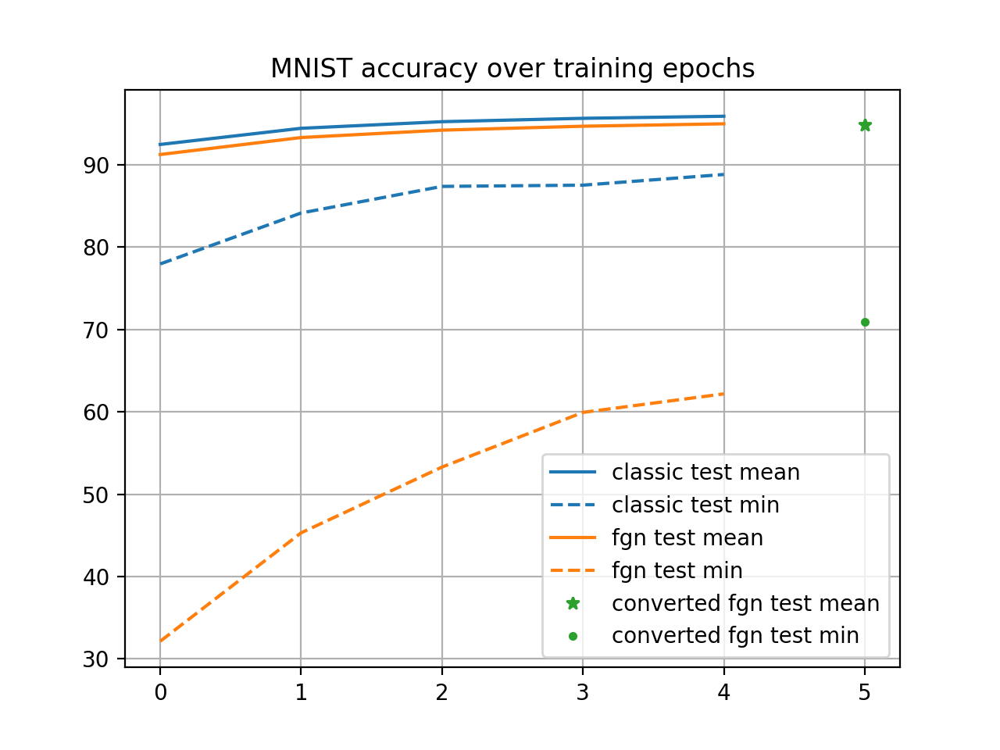

In [112]:
# plot means and minimums
x = [0,1,2,3,4]
y = stats.describe(classic_models_test_acc).mean
plt.plot(x,y, label='classic test mean', c='C0')
y = stats.describe(classic_models_test_acc)[1][0]
plt.plot(x,y, label='classic test min', linestyle='--', c='C0')
# for y in classic_models_test_acc:
#     plt.plot(x,y, linestyle='', marker='.', alpha=0.1, c='C0')


y = stats.describe(fgn_models_test_acc)[2]
plt.plot(x,y, label='fgn test mean', c='C1')
y = stats.describe(fgn_models_test_acc)[1][0]
plt.plot(x,y, label='fgn test min', linestyle='--', c='C1')
# for y in fgn_models_test_acc:
#     plt.plot(x,y, linestyle='', marker='.', alpha=0.01, c='C1')


y = stats.describe(converted_fgn_models_test_acc)[2]
plt.plot([5],y, label='converted fgn test mean', marker='*',  linestyle='', c='C2')
y = stats.describe(converted_fgn_models_test_acc)[1][0]
plt.plot([5],y, label='converted fgn test min', marker='.', linestyle='', c='C2')
# for y in fgn_models_test_acc:
#     plt.plot(x,y, linestyle='', marker='.', alpha=0.01, c='C2')

plt.title('MNIST accuracy over training epochs')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
### Part 3 vs random noise

In [ ]:
# generate some random noise
num_samples = 1
white_noise_dataloader = fgnh.mnist_random_dataloader(num_samples=num_samples, batch_size=10000)
shuffled_noise_dataloader = fgnh.mnist_random_shuffled_dataloader(num_samples=num_samples, batch_size=10000)

In [ ]:
# show examples
x = white_noise_dataloader.dataset.tensors[0][0]
plt.imshow(x, cmap=plt.cm.get_cmap('Greys'))
plt.title('Fully Random Image')
plt.colorbar()
plt.show()

x = shuffled_noise_dataloader.dataset.tensors[0][0]
plt.imshow(x, cmap=plt.cm.get_cmap('Greys'))
plt.title('Random from Real Image Shuffled Pixels')
plt.colorbar()
plt.show()

In [24]:
def get_histogram_of_preds(model, dataloader, device, verbose=False):
    # given model
    # and a dataloader
    # returns a np.hist of the predictions
    
    # send model to device and eval mode
    model.to(device)
    model.eval()
    
    preds_maxes = np.array([])
    with torch.no_grad():
        for x_data in dataloader:
            # in case the dataloader returns a x,y pair
#             print(len(x_data))
#             if len(x_data)==2:
            x_data = x_data[0]
            preds = model(x_data.to(device))
            # apply softmax for probs
            preds_softmax = np.array([np.exp(x)/sum(np.exp(x)) for x in preds.cpu().detach().numpy()])
            # only save max
            preds_maxes = np.concatenate((preds_maxes, np.max(preds_softmax, axis=1)))


    # quick description of the maxes
    stat = stats.describe(preds_maxes)
    if verbose: print(stat)
    # % of maxes above 0.5
    if verbose: print("percentage of confident (>0.5) predictions:",float(len([x for x in preds_maxes if x>=0.5])/float(len(preds_maxes))))

    # histogram
    hist = np.histogram(preds_maxes, bins=(np.arange(100)+1)/100.0)
    # to replot the original: plt.hist(hist[1][:-1], weights=hist[0], bins=hist[1])
    
    return(stat, hist)

In [40]:
model_path, filename = classic_model_list[0]
print(model_path, filename)
model = torch.load(model_path+'/'+filename)
with torch.cuda.device(1):
    model.to( torch.device('cpu'))
white_noise_dataloader = fgnh.mnist_random_dataloader(num_samples=10000, batch_size=10000)
stat, hist = get_histogram_of_preds(model, white_noise_dataloader, device, verbose=True)


/home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.4_ite4 trained_classic_model_full.pth
DescribeResult(nobs=10000, minmax=(0.22565464675426483, 0.9982638955116272), mean=0.5908223644554615, variance=0.027044613794333094, skewness=0.419884474328789, kurtosis=-0.6545787166975168)
percentage of confident (>0.5) predictions: 0.6572


In [53]:
def get_histograms_from_list(model_list, num_samples, verbose=False):
    # given a (path,name) list, applies the model to random noise (white and shuffled) 
    # and returns 2 ist of histograms
    
    # first the classic nets
    hist_list_white_noise = []
    hist_list_shuffled_noise = []

    for idx, (model_path, filename) in enumerate(model_list):
        if verbose: print('Working on {}'.format(model_path))
        if verbose: print('file #{} out of {}'.format(idx, len(model_list)-1))
            

        # load model
        #try loading directly (will send to GPU it was trained on?)
        try:
            model = torch.load(model_path+'/'+filename)
            if verbose: print('Loaded model directly')
        except Exception as e:
            if verbose: print(e)
            if verbose: print('loading model directly failed, rebuilding from state dict')
            params = extract_params_from_path(model_path)
            if verbose: print(params)
            if not 'covar_type' in params.keys():
                # build classic model
                model = fgnl.Feedforward_net(in_feats=28*28, 
                                                             out_feats = 10,
                                                             hidden_layer_sizes=params['hidden_layers_sizes'],
                                                             drop_p = params['drop_p']
                                                             )
                # load state_dict on CPU
                model.load_state_dict(torch.load(model_path+'/trained_model_state_dict.pth'))
            else :
                # build fgn model
                model = fgnl.Feedforward_FGN_net(in_feats=28*28, 
                                                     out_feats = 10,
                                                     hidden_layer_sizes=params['hidden_layers_sizes'],
                                                     drop_p = params['drop_p'],
                                                     covar_type=params['covar_type'],
                                                     non_lin=True)
                if not 'converted' in filename:
                    # load state_dict on CPU
                    model.load_state_dict(torch.load(fgn_model_path+'/trained_fgn_model_state_dict.pth'))
                else:
                    model.load_state_dict(torch.load(fgn_model_path+'/trained_converted_fgn_model_state_dict.pth'))
                    
                
        # send to most free device
        # attempt to sent to GPU, else train over CPU
        model_sent_to_device = False
        sleep_time = 30
        while not model_sent_to_device and sleep_time<4800:
            # get free device
            device = torch.device('cuda')
            try:
                device_id = GPUtil.getFirstAvailable(order='memory', maxLoad=1.0, maxMemory=0.8, verbose=False)[0]
                # send to least used GPU
                if verbose: print('Using GPU:', device_id)
                with torch.cuda.device(device_id):
                    model.to(device)
                    model_sent_to_device=True

            except Exception as e:
                if verbose: print(e)
                sleep_time = 1.66*sleep_time
                if verbose: print('GPU error. Wait {}s and continue'.format(sleep_time))
                time.sleep(sleep_time)

        if not model_sent_to_device:
            if verbose: print('Failed to send to GPU, using CPU')
            devise = torch.device('cpu')
            model.to(device)    

        # get new noise
        white_noise_dataloader = fgnh.mnist_random_dataloader(num_samples=num_samples, batch_size=10000)
        shuffled_noise_dataloader = fgnh.mnist_random_shuffled_dataloader(num_samples=num_samples, batch_size=10000)

        # get preds over white noise
        # ~4kb per 
        stat, hist = get_histogram_of_preds(model, white_noise_dataloader, device, verbose=verbose)
        hist_list_white_noise.append((model_path, hist, stat))

        # get preds over shuffled noise
        stat, hist = get_histogram_of_preds(model, shuffled_noise_dataloader, device, verbose=verbose)
        hist_list_shuffled_noise.append((model_path, hist, stat))
        
        if verbose: print()
                
    return hist_list_white_noise, hist_list_shuffled_noise


In [54]:
# Part 1 - Analysis 

In [56]:
classic_hist_list_white_noise, classic_hist_list_shuffled_noise = get_histograms_from_list(classic_model_list, 
                                                                                           num_samples=1000, 
                                                                                           verbose=True)

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.4_ite4
file #0 out of 185
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2662460505962372, 0.9994187951087952), mean=0.586884577125311, variance=0.025633626285433374, skewness=0.5144878734175583, kurtosis=-0.5180468301839634)
percentage of confident (>0.5) predictions: 0.645
DescribeResult(nobs=1000, minmax=(0.19067472219467163, 0.9999980330467224), mean=0.7550394964367151, variance=0.05126843899205988, skewness=-0.6136975585722756, kurtosis=-0.8715021863660284)
percentage of confident (>0.5) predictions: 0.829

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.4_ite4
file #1 out of 185
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.21475720405578613, 0.7800647616386414), mean=0.41775676849484444, variance=0.019887732180628868, 

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.323640912771225, 1.0), mean=0.8786031593978405, variance=0.024464681293214344, skewness=-1.239612754642102, kurtosis=0.31394262941901685)
percentage of confident (>0.5) predictions: 0.98
DescribeResult(nobs=1000, minmax=(0.29496583342552185, 1.0), mean=0.9044331254661083, variance=0.025434879322722936, skewness=-1.8054958293020165, kurtosis=2.281959265398916)
percentage of confident (>0.5) predictions: 0.963

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.1_ite2
file #13 out of 185
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3299224376678467, 0.9889705777168274), mean=0.6794465980827809, variance=0.04129714222304228, skewness=0.03957946898200696, kurtosis=-1.4546542345147584)
percentage of confident (>0.5) predictions: 0.733
DescribeResult(nobs=1000, minmax=(0.2306126058101654, 0.9999911785125732), mean

/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in divide


Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2768794894218445, 0.9763011336326599), mean=0.8209620976448059, variance=0.019025343608623527, skewness=-1.370795750397244, kurtosis=1.2445191628422032)
percentage of confident (>0.5) predictions: 0.956
DescribeResult(nobs=1000, minmax=(0.21831415593624115, 1.0), mean=0.8093430705219508, variance=0.039137854446194636, skewness=-0.8969738219764156, kurtosis=-0.35573796387659185)
percentage of confident (>0.5) predictions: 0.904

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.0_ite4
file #18 out of 185
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2786484956741333, 0.9997004270553589), mean=0.7272110834121704, variance=0.04400346281213101, skewness=-0.2311321801227073, kurtosis=-1.2995298295532427)
percentage of confident (>0.5) predictions: 0.755
DescribeResult(nobs=1000, minmax=(0.22103506326675415, 0.9999774694442749), mean=0.8

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9696119427680969, 0.9933624863624573), mean=0.9872717269062996, variance=1.1082411127954719e-05, skewness=-1.353983366493848, kurtosis=2.796238920435444)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.883

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.0_ite1
file #31 out of 185
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.27721738815307617, 0.999718427658081), mean=0.739685271859169, variance=0.03834428333684685, skewness=-0.3107682207174401, kurtosis=-1.1744605794365586)
percentage of confident (>0.5) predictions: 0.849
DescribeResult(nobs=1000, minmax=(0.27154985070228577, 1.0), mean=0.8170204054415225, variance=0.028245972624424357, skewness=-0.6252557369049142, kurtosis=-0.584616

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2922914922237396, 0.9845169186592102), mean=0.831487926363945, variance=0.01895865829174676, skewness=-1.6634738225434884, kurtosis=2.53058186237907)
percentage of confident (>0.5) predictions: 0.956
DescribeResult(nobs=1000, minmax=(0.24796955287456512, 0.9998114109039307), mean=0.7655310616344213, variance=0.035790815682747425, skewness=-0.543495680929422, kurtosis=-0.8195018367770048)
percentage of confident (>0.5) predictions: 0.886

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.0_ite0
file #44 out of 185
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7023628950119019, 0.7023628950119019), mean=0.7023628950119019, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.33304616808891296, 0.9995189309120178), mean=0.7330645798146724, variance=0.0170571

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.32502859830856323, 0.997886061668396), mean=0.7791568547189236, variance=0.030011896221181392, skewness=-0.7907027617200857, kurtosis=-0.5380148049012301)
percentage of confident (>0.5) predictions: 0.897
DescribeResult(nobs=1000, minmax=(0.21734850108623505, 0.9998494386672974), mean=0.7674606830179691, variance=0.049071812186594795, skewness=-0.6210603972086646, kurtosis=-1.060307140858368)
percentage of confident (>0.5) predictions: 0.817

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.1_ite1
file #57 out of 185
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.251556932926178, 0.9930392503738403), mean=0.7048809079527855, variance=0.03305968980595865, skewness=-0.35495773444661544, kurtosis=-1.0232553049685458)
percentage of confident (>0.5) predictions: 0.829
DescribeResult(nobs=1000, minmax=(0.23891209065914154, 0.9999954104

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.24385182559490204, 0.9992830753326416), mean=0.7935485085397959, variance=0.04001892982547154, skewness=-0.7653214432806623, kurtosis=-0.6092445314288168)
percentage of confident (>0.5) predictions: 0.883
DescribeResult(nobs=1000, minmax=(0.2500225305557251, 0.9997246265411377), mean=0.7959952670335769, variance=0.033400938019199675, skewness=-0.8135945108206549, kurtosis=-0.38305892684534193)
percentage of confident (>0.5) predictions: 0.916

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.4_ite1
file #70 out of 185
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.28716543316841125, 0.9998146891593933), mean=0.6805356741547585, variance=0.0316396767416514, skewness=0.02629080543476808, kurtosis=-1.0697515082497657)
percentage of confident (>0.5) predictions: 0.81
DescribeResult(nobs=1000, minmax=(0.21249064803123474, 0.999998867511749

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3267976939678192, 0.9992098808288574), mean=0.8374493399560452, variance=0.0225886188617684, skewness=-0.965027002906563, kurtosis=0.004573807954896925)
percentage of confident (>0.5) predictions: 0.966
DescribeResult(nobs=1000, minmax=(0.2159772515296936, 0.9999443888664246), mean=0.6807806573659182, variance=0.04814475066197191, skewness=-0.1858934396876635, kurtosis=-1.1450301050036424)
percentage of confident (>0.5) predictions: 0.747

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.4_ite2
file #83 out of 185
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2839154899120331, 0.9609900116920471), mean=0.6432788128852844, variance=0.02527657724186655, skewness=-0.0731854881690307, kurtosis=-1.1387023960177323)
percentage of confident (>0.5) predictions: 0.745
DescribeResult(nobs=1000, minmax=(0.18148958683013916, 0.99643296003

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2590819299221039, 0.9955022931098938), mean=0.6930400145053863, variance=0.03754903739352533, skewness=-0.2274528301104514, kurtosis=-0.9048418290536278)
percentage of confident (>0.5) predictions: 0.799
DescribeResult(nobs=1000, minmax=(0.2655482888221741, 0.9997046589851379), mean=0.7992288377583027, variance=0.02531061753121957, skewness=-0.9030567761461421, kurtosis=0.22888610482137617)
percentage of confident (>0.5) predictions: 0.938

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.4_ite2
file #96 out of 185
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.31365102529525757, 0.9998780488967896), mean=0.8070031713545323, variance=0.03139060416477015, skewness=-0.7394587090427401, kurtosis=-0.6944841246120927)
percentage of confident (>0.5) predictions: 0.928
DescribeResult(nobs=1000, minmax=(0.23724450170993805, 0.999

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2632957398891449, 0.9742560386657715), mean=0.6567386498749256, variance=0.028182705788573664, skewness=-0.22101307152945757, kurtosis=-0.9292936313316233)
percentage of confident (>0.5) predictions: 0.782
DescribeResult(nobs=1000, minmax=(0.22718439996242523, 0.9990467429161072), mean=0.712315599411726, variance=0.0419175458574479, skewness=-0.23300046049680426, kurtosis=-1.1836762012248014)
percentage of confident (>0.5) predictions: 0.801

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.4_ite2
file #109 out of 185
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5109436511993408, 0.8787714242935181), mean=0.8638028225302696, variance=0.003160048369531549, skewness=-4.38720369862044, kurtosis=20.40055000676114)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.18207426369190216, 0.9943404793739319

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9992497563362122, 0.9998993873596191), mean=0.9997395620942116, variance=7.827946358993966e-09, skewness=-1.4173269060612215, kurtosis=3.1982402609270544)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2877955138683319, 0.9999537467956543), mean=0.8790436367988587, variance=0.031080823738154933, skewness=-1.1925520728552264, kurtosis=-0.010721792344627001)
percentage of confident (>0.5) predictions: 0.971

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.0_ite2
file #122 out of 185
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2679184377193451, 0.99973464012146), mean=0.8262370546460152, variance=0.04429371514668349, skewness=-1.351128270795433, kurtosis=0.3546624247614987)
percentage of confident (>0.5) predictions: 0.849
DescribeResult(nobs=1000, minmax=(0.26245445013046

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.18335171043872833, 0.9240485429763794), mean=0.6725231376886368, variance=0.02604642915021142, skewness=-0.6875876595590389, kurtosis=-0.29601660822204323)
percentage of confident (>0.5) predictions: 0.834
DescribeResult(nobs=1000, minmax=(0.1879572570323944, 0.997264564037323), mean=0.5692190710008145, variance=0.04085798707692711, skewness=0.2897790059985671, kurtosis=-0.8792175517448642)
percentage of confident (>0.5) predictions: 0.576

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.1_ite3
file #135 out of 185
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9195083975791931, 0.9999497532844543), mean=0.9986263592839241, variance=1.2258072076738915e-05, skewness=-13.516815982001521, kurtosis=270.5505840126727)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2554396986961365, 0.99994

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.24723054468631744, 0.9969239830970764), mean=0.7729182042330504, variance=0.0334226352483187, skewness=-0.6728961614279801, kurtosis=-0.7332133556379068)
percentage of confident (>0.5) predictions: 0.889
DescribeResult(nobs=1000, minmax=(0.22592206299304962, 0.9985986948013306), mean=0.7142515173256397, variance=0.03862105455389939, skewness=-0.3087512758633019, kurtosis=-1.0855220629584215)
percentage of confident (>0.5) predictions: 0.809

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.4_ite1
file #148 out of 185
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3056142032146454, 0.9930804967880249), mean=0.6643783631622792, variance=0.030018905809549388, skewness=0.04061363612124703, kurtosis=-1.0758347332125253)
percentage of confident (>0.5) predictions: 0.753
DescribeResult(nobs=1000, minmax=(0.20077666640281677, 0.99837499856

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9659937620162964, 0.9961192607879639), mean=0.9892868357896805, variance=1.5793646584177014e-05, skewness=-1.6297104082053115, kurtosis=3.9618545215739855)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.824

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.0_ite1
file #161 out of 185
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22431927919387817, 0.9982864260673523), mean=0.6906848580539227, variance=0.03408463986436115, skewness=0.21232724892736518, kurtosis=-1.2323754158464966)
percentage of confident (>0.5) predictions: 0.894
DescribeResult(nobs=1000, minmax=(0.2536807954311371, 0.9995077252388), mean=0.6771446880102158, variance=0.04673944893568888, skewness=-0.23506640537399268, kurt

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.21005234122276306, 0.9360125660896301), mean=0.5317342365086078, variance=0.030507220771376232, skewness=0.18561960921158824, kurtosis=-1.0366581127487016)
percentage of confident (>0.5) predictions: 0.576
DescribeResult(nobs=1000, minmax=(0.20297622680664062, 0.9992718696594238), mean=0.6234714272618294, variance=0.0431522653771514, skewness=0.004796559063228685, kurtosis=-1.0728213541506353)
percentage of confident (>0.5) predictions: 0.678

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.1_ite2
file #174 out of 185
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3864235281944275, 0.9982749223709106), mean=0.9055672590136528, variance=0.015754073160645247, skewness=-2.0374904366745326, kurtosis=3.5762535375082365)
percentage of confident (>0.5) predictions: 0.984
DescribeResult(nobs=1000, minmax=(0.2945690155029297, 0.9999998

In [ ]:
def recursive_getsizeof(x, seen=set(), verbose=False):
    if id(x) in seen:
        return 0
    else:
        s = sys.getsizeof(x)
        if verbose: print(x,s)
        seen.add(id(x))
        # rec call
        try:
            for y in x:
                s += recursive_getsizeof(y, seen, verbose=verbose)
        except Exception as e:
            if verbose: print(e)
                
        return s

In [57]:
# # save for future use
# # 1.12 MP for 185 histograms
# pickle.dump(classic_hist_list_white_noise,
#             open('../Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hist_list_white_noise.pckl', 'wb'))
# pickle.dump(classic_hist_list_shuffled_noise,
#             open('../Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hist_list_shuffled_noise.pckl', 'wb'))



<IPython.core.display.Javascript object>


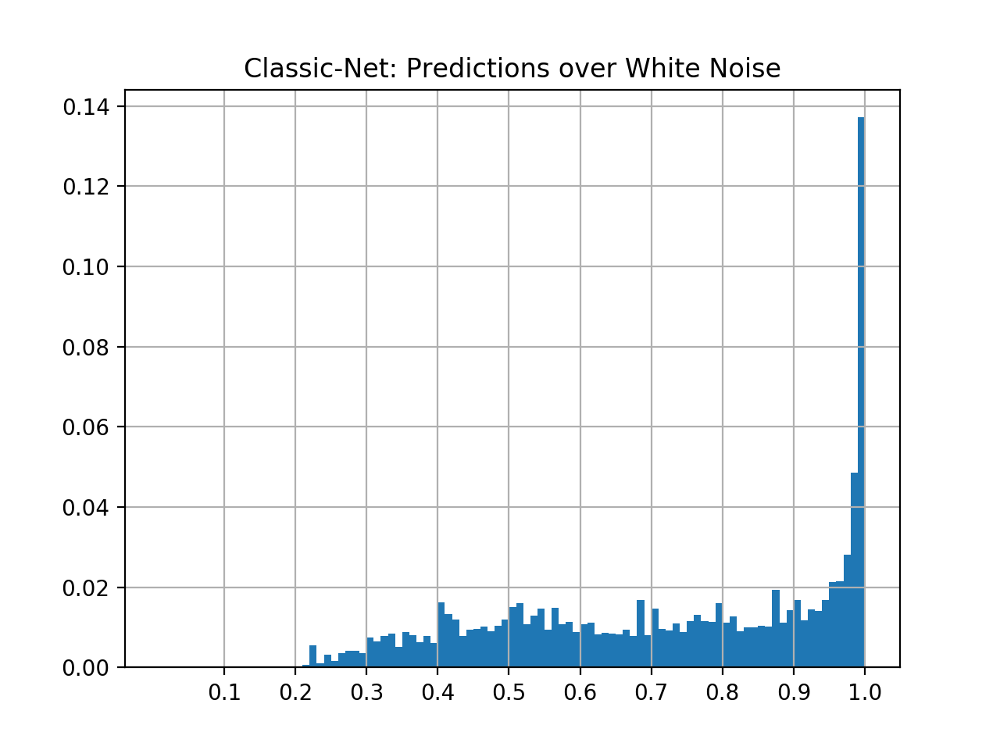

percentage of confident (>0.5) predictions: 0.789162095603625


In [58]:
# overall histogram - white noise
bins = classic_hist_list_white_noise[0][1][1] #will be the same for all
weights=[]
for path, hist, stat in classic_hist_list_white_noise:
    #weights
    w = hist[0]
    if len(weights) == 0:
        weights=w
    else:
        weights+=w
    
s = float(np.sum(weights))
weights = [w/s for w in weights]

plt.hist(bins[:-1], weights=weights, bins=bins)
plt.xticks((np.arange(10)+1)/10.0)
plt.grid(True)
plt.title("Classic-Net: Predictions over White Noise")
plt.show()
# % above 0.5
print("percentage of confident (>0.5) predictions:", np.sum(weights[49:]))

<IPython.core.display.Javascript object>


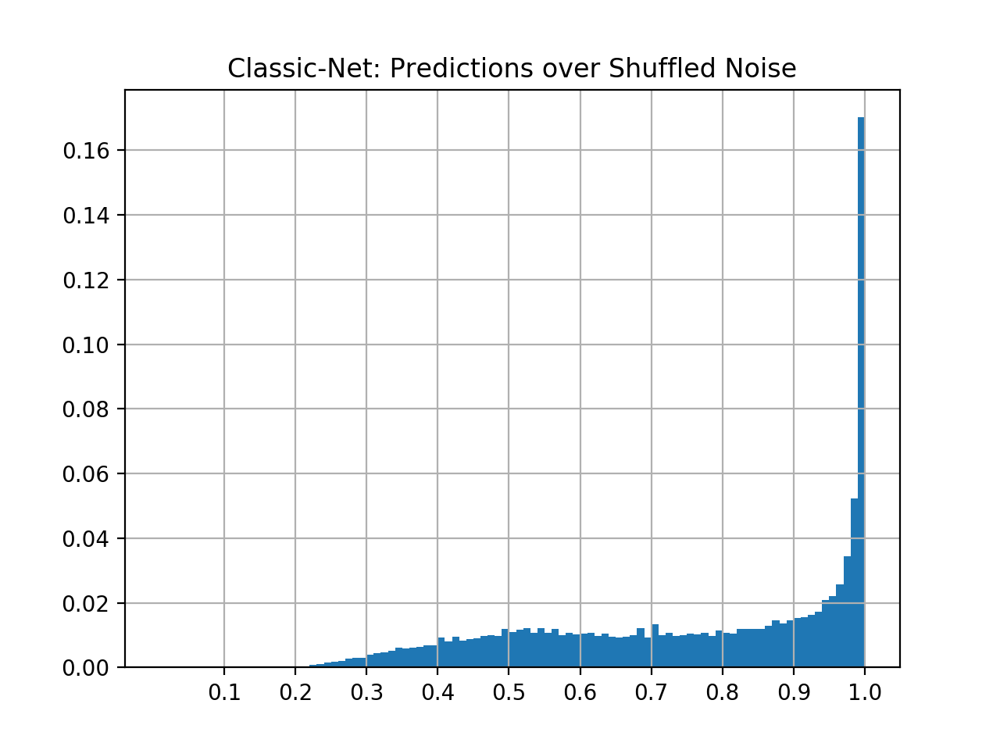

percentage of confident (>0.5) predictions: 0.8328105204339622


In [75]:
# overall histogram - shuffled noise
bins = classic_hist_list_shuffled_noise[0][1][1] #will be the same for all
weights=[]
for path, hist, stat in classic_hist_list_shuffled_noise:
    #weights
    w = hist[0]
    if len(weights) == 0:
        weights=w
    else:
        weights+=w
    
s = float(np.sum(weights))
weights = [w/s for w in weights]

plt.hist(bins[:-1], weights=weights, bins=bins)
plt.xticks((np.arange(10)+1)/10.0)
plt.grid(True)
plt.title("Classic-Net: Predictions over Shuffled Noise")
plt.show()
# % above 0.5
print("percentage of confident (>0.5) predictions:", np.sum(weights[49:]))

In [ ]:
# histogram per param
# overall histogram - white noise
bins = classic_hist_list_shuffled_noise[0][1][1] #will be the same for all

for hl_size in hidden_layer_sizes:
    weights=[]
    for path, hist, stat in classic_hist_list_white_noise:
        if str(hl_size) in path:
            #weights
            w = hist[0]
            if len(weights) == 0:
                weights=w
            else:
                weights+=w

    s = float(np.sum(weights))
    weights = [w/s for w in weights]



    plt.hist(bins[:-1], weights=weights, bins=bins)
    plt.xticks((np.arange(10)+1)/10.0)
    plt.grid(True)
    plt.title("Classic-Net {} layer size: Predictions over White Noise".format(hl_size))
    plt.show()
    # % above 0.5
    print("percentage of confident (>0.5) predictions:", np.sum(weights[49:]))

In [ ]:
### FGNs

In [ ]:
fgn_hist_list_white_noise, fgn_hist_list_shuffled_noise = get_histograms_from_list(fgn_model_list, 
                                                                                           num_samples=1000, 
                                                                                           verbose=True)

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_diag_ord5.0_ls8e-06_ite0
file #0 out of 10104
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22619272768497467, 0.22619272768497467), mean=0.22619272768497467, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.22619272768497467, 0.22619272768497467), mean=0.22619272768497467, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.0_diag_ord5.0_ls8e-08_ite3
file #1 out of 10104
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.23293857276439667, 0.23293857276439667), mean=0.23293857276439667, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.

/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in divide


DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.882

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_sphere_ord2.0_ls8e-08_ite0
file #10 out of 10104
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3489690124988556, 0.3489690124988556), mean=0.3489690124988556, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3489690124988556, 0.3489690124988556), mean=0.3489690124988556, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.1_sphere_ord0.5_ls4e-06_ite3
file #11 out of 10104
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, min

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.24624080955982208, 0.24624080955982208), mean=0.24624080955982208, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.24624080955982208, 0.24624080955982208), mean=0.24624080955982208, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.4_sphere_ord2.0_ls1.6e-05_ite3
file #24 out of 10104
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7367242574691772, 0.7367242574691772), mean=0.7367242574691772, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.7367242574691772, 0.7367242574691772), mean=0.7367242574691772, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.40216997265815735, 0.8663671016693115), mean=0.7317288176715374, variance=0.014568499385127175, skewness=-0.9743119699497345, kurtosis=-0.2990922060205383)
percentage of confident (>0.5) predictions: 0.921
DescribeResult(nobs=1000, minmax=(0.24501892924308777, 0.9973530173301697), mean=0.6955536213219166, variance=0.03314432705715546, skewness=-0.3393650469412707, kurtosis=-0.9143473751934161)
percentage of confident (>0.5) predictions: 0.823

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.0_sphere_ord5.0_ls8e-06_ite3
file #37 out of 10104
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3782096803188324, 0.3782096803188324), mean=0.3782096803188324, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3782096803188324, 0.3782096803188324), mean=0.37820968

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2398621290922165, 0.2398621290922165), mean=0.2398621290922165, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2398621290922165, 0.2398621290922165), mean=0.2398621290922165, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.4_diag_ord5.0_ls4e-06_ite1
file #50 out of 10104
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1886933147907257, 0.1886933147907257), mean=0.1886933147907257, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.1886933147907257, 0.1886933147907257), mean=0.1886933147907257, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0


DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.951

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.1_sphere_ord5.0_ls8e-05_ite0
file #63 out of 10104
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2207937091588974, 0.2207937091588974), mean=0.2207937091588974, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2207937091588974, 0.2207937091588974), mean=0.2207937091588974, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_sphere_ord5.0_ls4e-06_ite4
file #64 out of 10104
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2969513535499573, 0.9438847303390503), mean=0.5220160018503666, variance=0.0387679940987215, skewness=0.8990628882972148, kurtosis=-0.8581685339112952)
percentage of confident (>0.5) predictions: 0.31
DescribeResult(nobs=1000, minmax=(0.2694095969200134, 0.9984821081161499), mean=0.6219323585033417, variance=0.03741864856624335, skewness=0.5223437619395473, kurtosis=-1.0860026669424643)
percentage of confident (>0.5) predictions: 0.568

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_diag_ord1.0_ls8e-07_ite1
file #76 out of 10104
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7474225759506226, 0.7474265694618225), mean=0.7474243234992027, variance=3.180060650356245e-13, skewness=0.4799197057906655, kurtosis=0.7331100001431903)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, mi

DescribeResult(nobs=1000, minmax=(0.27199608087539673, 0.27199608087539673), mean=0.27199608087539673, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.1_sphere_ord5.0_ls1.6e-05_ite1
file #88 out of 10104
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.21409277617931366, 0.21409277617931366), mean=0.21409277617931366, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.21409277617931366, 0.21409277617931366), mean=0.21409277617931366, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_sphere_ord1.0_ls8e-07_ite3
file #89 out of 10104
Loaded 

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.38995790481567383, 0.8605453372001648), mean=0.6298765051662922, variance=0.00736415456718648, skewness=0.0010816284685290524, kurtosis=-0.46615055781314885)
percentage of confident (>0.5) predictions: 0.936
DescribeResult(nobs=1000, minmax=(0.2601251006126404, 0.9973396062850952), mean=0.6302220881283284, variance=0.0351994713736906, skewness=0.3644473816486699, kurtosis=-1.0630665443817624)
percentage of confident (>0.5) predictions: 0.683

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64]_dp0.4_diag_ord0.5_ls0.0008_ite3
file #102 out of 10104
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.24326783418655396, 0.4831385016441345), mean=0.33844292533397674, variance=0.0018035832887529114, skewness=0.3516347410824031, kurtosis=-0.330463819311257)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.174523502588

DescribeResult(nobs=1000, minmax=(0.8652654886245728, 0.9992157816886902), mean=0.9840775514245034, variance=3.0071122459162237e-05, skewness=-12.597329075711992, kurtosis=240.1436639386793)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.1_sphere_ord5.0_ls4e-06_ite1
file #114 out of 10104
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7378551959991455, 0.7378551959991455), mean=0.7378551959991455, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.7378551959991455, 0.7378551959991455), mean=0.7378551959991455, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.0_diag_o

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.21960479021072388, 0.6040732264518738), mean=0.3740929679274559, variance=0.002446464615992222, skewness=0.9964772328486201, kurtosis=2.2377505634551094)
percentage of confident (>0.5) predictions: 0.026
DescribeResult(nobs=1000, minmax=(0.18158887326717377, 0.9935539364814758), mean=0.5738482621908187, variance=0.03654950214260911, skewness=0.28926764392718657, kurtosis=-0.847454426381538)
percentage of confident (>0.5) predictions: 0.603

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256]_dp0.4_sphere_ord2.0_ls8e-07_ite2
file #127 out of 10104
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5262818932533264, 0.5262818932533264), mean=0.5262818932533264, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5262811183929443, 0.5262818932533264), mean=0.5262818924

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2989555299282074, 0.2989555299282074), mean=0.2989555299282074, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2989555299282074, 0.2989555299282074), mean=0.2989555299282074, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16, 16]_dp0.0_sphere_ord1.0_ls8e-08_ite3
file #140 out of 10104
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9384139776229858, 0.940424919128418), mean=0.9395684753656387, variance=1.1387145290338904e-07, skewness=-0.12577294704268638, kurtosis=-0.2570574776557937)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.3176109790802002, 0.9693168997764587), mean=0.8853726154863835, variance=0.00703

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.28996923565864563, 0.28996923565864563), mean=0.28996923565864563, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.28996923565864563, 0.28996923565864563), mean=0.28996923565864563, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256, 256, 256]_dp0.4_diag_ord0.5_ls8e-06_ite2
file #153 out of 10104
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3121567964553833, 0.7794884443283081), mean=0.6117877972424031, variance=0.006588997078765762, skewness=-0.7846834075665031, kurtosis=0.4086216649143948)
percentage of confident (>0.5) predictions: 0.889
DescribeResult(nobs=1000, minmax=(0.22190465033054352, 0.9957762360572815), mean=0.6264863896518945, variance=

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4738932251930237, 0.4738932251930237), mean=0.4738932251930237, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.4738932251930237, 0.4738932251930237), mean=0.4738932251930237, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64, 64]_dp0.1_diag_ord0.5_ls4e-06_ite2
file #166 out of 10104
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5900866389274597, 0.8112215399742126), mean=0.7463259531259536, variance=0.0010586418262208113, skewness=-1.7909516025584957, kurtosis=4.006602210470004)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.22045208513736725, 0.9982760548591614), mean=0.6424919349849224, variance=0.036729821776282395, skewness=0.

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5976628661155701, 0.5976628661155701), mean=0.5976628661155701, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5976628661155701, 0.5976628661155701), mean=0.5976628661155701, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[64, 64]_dp0.1_diag_ord1.0_ls8e-07_ite3
file #179 out of 10104
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4204259216785431, 0.4204283058643341), mean=0.42042648285627365, variance=9.504940489445712e-14, skewness=1.1895647123827784, kurtosis=2.3851747766059495)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2876606583595276, 0.6616777777671814), mean=0.42210917127132414, variance=0.000432992000

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6737768054008484, 0.6737768054008484), mean=0.6737768054008484, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6737768054008484, 0.6737768054008484), mean=0.6737768054008484, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[256]_dp0.4_diag_ord2.0_ls8e-06_ite3
file #192 out of 10104
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4233054518699646, 0.4233054518699646), mean=0.4233054518699646, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.4233054518699646, 0.4233054518699646), mean=0.4233054518699646, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Worki

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3466356098651886, 1.0), mean=0.8600486338436604, variance=0.02860403789706117, skewness=-0.9886066036786626, kurtosis=-0.3298858434784204)
percentage of confident (>0.5) predictions: 0.97
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.866

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16, 16]_dp0.0_diag_ord2.0_ls8e-07_ite3
file #205 out of 10104
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.43608275055885315, 0.43608275055885315), mean=0.43608275055885315, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.43608275055885315, 0.43608275055885315), mean=0.43608275055885315, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.32676899433135986, 0.32676899433135986), mean=0.32676899433135986, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.32676899433135986, 0.32676899433135986), mean=0.32676899433135986, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_diag_ord0.5_ls1.6e-05_ite3
file #219 out of 10104
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.17557211220264435, 0.552638053894043), mean=0.2951380870044231, variance=0.0053754019918461704, skewness=1.0637853250017761, kurtosis=1.0923905670549248)
percentage of confident (>0.5) predictions: 0.027
DescribeResult(nobs=1000, minmax=(0.2022743672132492, 0.9997395873069763), mean=0.5522981047034263, variance=0.03880479

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9707738757133484, 0.9707857370376587), mean=0.9707816638350487, variance=2.4993871717027566e-12, skewness=-0.5279783545548722, kurtosis=0.8612945985905895)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5356919169425964, 0.9829576015472412), mean=0.9688207330107689, variance=0.00026950908638950316, skewness=-20.264564330015318, kurtosis=498.156976133102)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[16]_dp0.1_sphere_ord0.5_ls8e-06_ite2
file #232 out of 10104
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.23754984140396118, 0.7528430819511414), mean=0.43119872207939625, variance=0.008814376896546603, skewness=0.3357483492040138, kurtosis=0.20639543332159382)
percentage of confident (>0.5) predictions: 0.139
DescribeResult(nobs=1000, minmax=(0.2038522362709

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.30411720275878906, 0.3041277825832367), mean=0.3041239836812019, variance=1.2970206379273955e-12, skewness=-0.9433530440193025, kurtosis=3.215194512348755)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.24659650027751923, 0.6252238154411316), mean=0.3094011924117804, variance=0.0004546070811831943, skewness=6.620788065011137, kurtosis=66.92233224406229)
percentage of confident (>0.5) predictions: 0.001

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024, 1024, 1024]_dp0.0_diag_ord1.0_ls8e-05_ite0
file #245 out of 10104
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8133468627929688, 0.8133478164672852), mean=0.8133475453853607, variance=3.3370956092998546e-14, skewness=-0.6090344182390341, kurtosis=0.5563221089747512)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.53

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.23742951452732086, 0.23742951452732086), mean=0.23742951452732086, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.23742951452732086, 0.23742951452732086), mean=0.23742951452732086, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[]_dp0.0_diag_ord0.5_ls8e-07_ite2
file #258 out of 10104
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.653
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.479

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/202

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2220279574394226, 0.2220279574394226), mean=0.2220279574394226, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2220279574394226, 0.2220279574394226), mean=0.2220279574394226, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/FGNs/fgn_hl[1024]_dp0.1_diag_ord0.5_ls8e-08_ite0
file #271 out of 10104
Loaded model directly
Using GPU: 1


In [63]:
# # save for future use
# pickle.dump(fgn_hist_list_white_noise,
#             open('../Experiments/Exp-00/2020_01_07_at_23:28:46/fgn_hist_list_white_noise.pckl', 'wb'))
# pickle.dump(fgn_hist_list_shuffled_noise,
#             open('../Experiments/Exp-00/2020_01_07_at_23:28:46/fgn_hist_list_shuffled_noise.pckl', 'wb'))

<IPython.core.display.Javascript object>


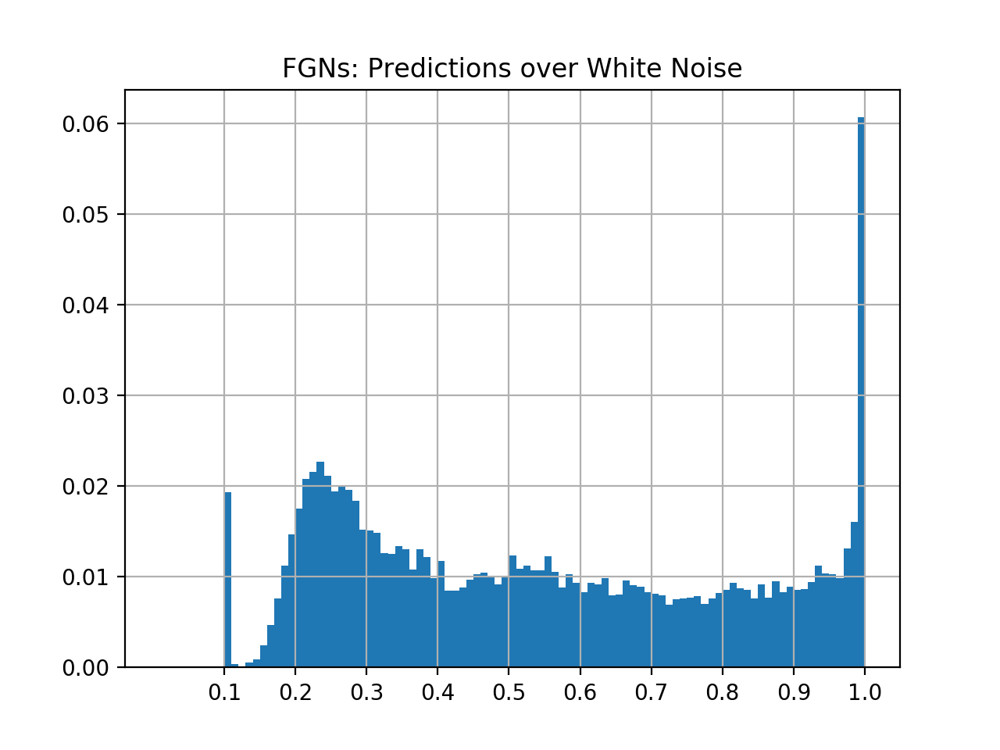

percentage of confident (>0.5) predictions: 0.5168605748814079


In [65]:
# overall histogram - white noise
bins = fgn_hist_list_white_noise[0][1][1] #will be the same for all
weights=[]
for path, hist, stat in fgn_hist_list_white_noise:
    #weights
    w = hist[0]
    if len(weights) == 0:
        weights=w
    else:
        weights+=w
    
s = float(np.sum(weights))
weights = [w/s for w in weights]

plt.hist(bins[:-1], weights=weights, bins=bins)
plt.xticks((np.arange(10)+1)/10.0)
plt.grid(True)
plt.title("FGNs: Predictions over White Noise")
plt.show()
# % above 0.5
print("percentage of confident (>0.5) predictions:", np.sum(weights[49:]))

<IPython.core.display.Javascript object>


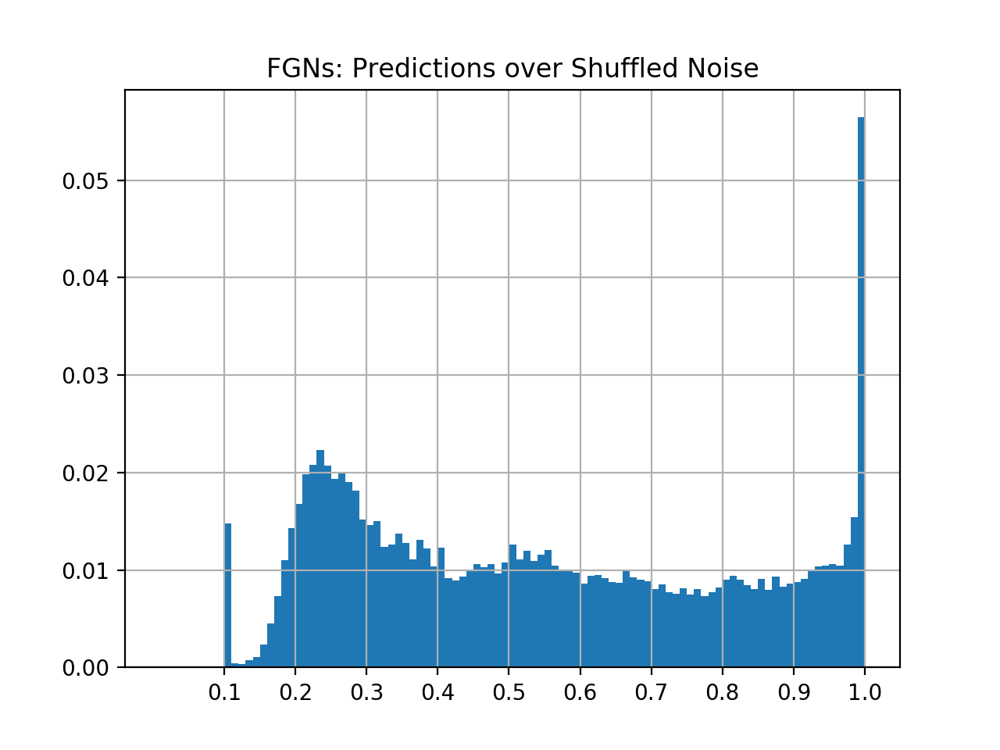

percentage of confident (>0.5) predictions: 0.5214276574022816


In [66]:
# overall histogram - shuffled noise
weights=[]
for path, hist, stat in fgn_hist_list_shuffled_noise:
    #weights
    w = hist[0]
    if len(weights) == 0:
        weights=w
    else:
        weights+=w
    
s = float(np.sum(weights))
weights = [w/s for w in weights]

plt.hist(bins[:-1], weights=weights, bins=bins)
plt.xticks((np.arange(10)+1)/10.0)
plt.grid(True)
plt.title("FGNs: Predictions over Shuffled Noise")
plt.show()
# % above 0.5
print("percentage of confident (>0.5) predictions:", np.sum(weights[49:]))

<IPython.core.display.Javascript object>


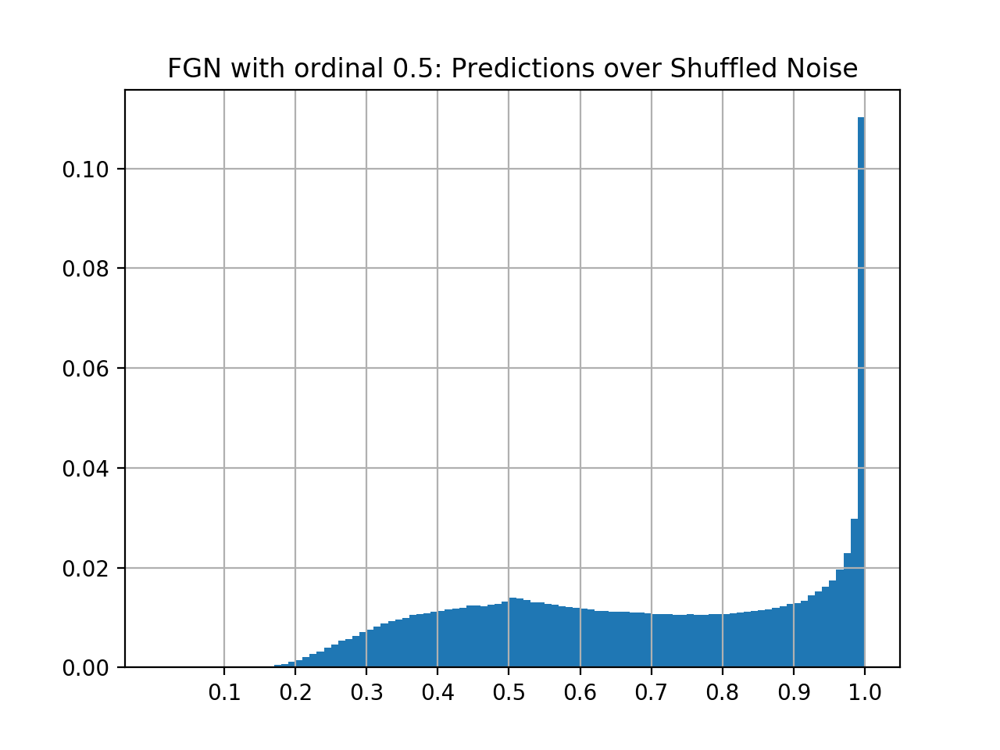

percentage of confident (>0.5) predictions: 0.7354803563957194


<IPython.core.display.Javascript object>


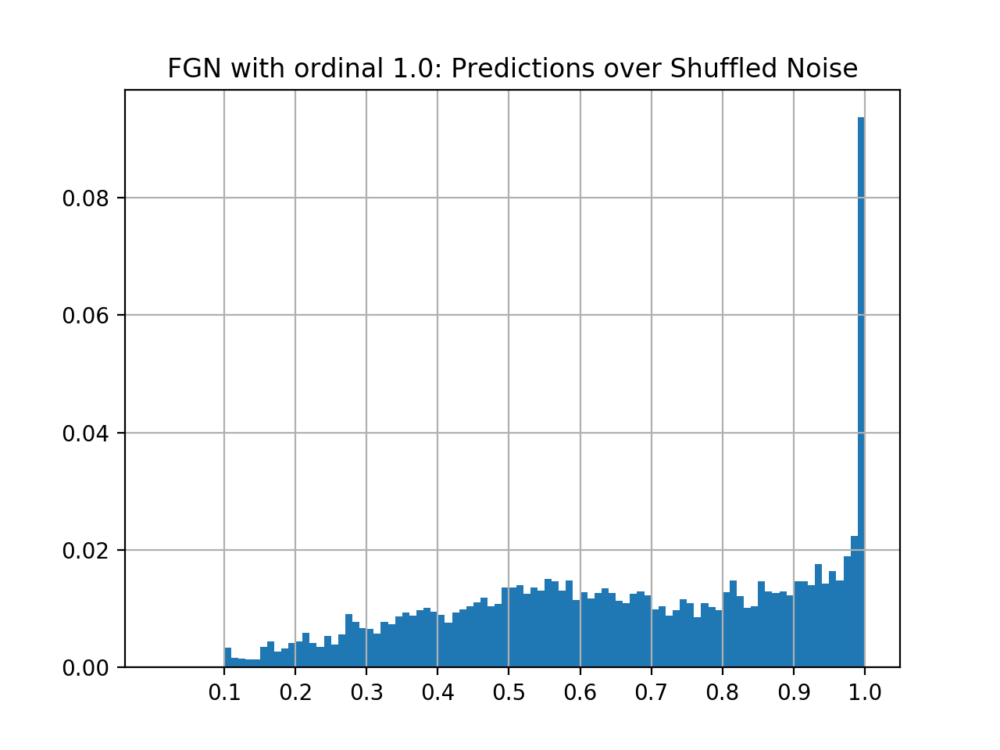

percentage of confident (>0.5) predictions: 0.7282094930087465


<IPython.core.display.Javascript object>


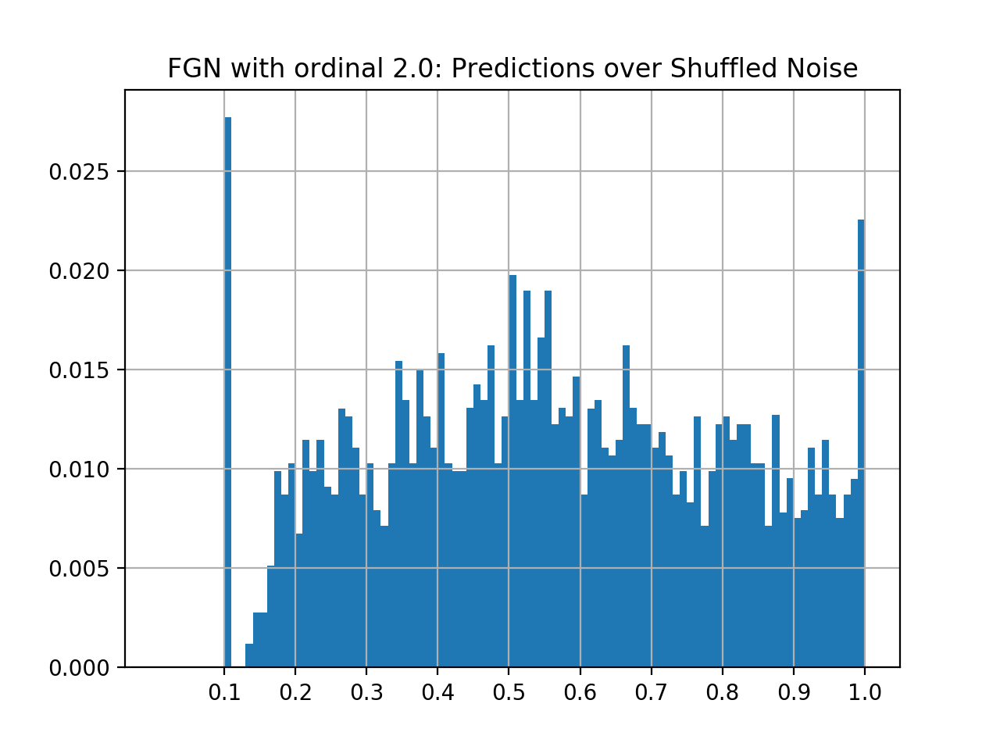

percentage of confident (>0.5) predictions: 0.5890736342042755


<IPython.core.display.Javascript object>


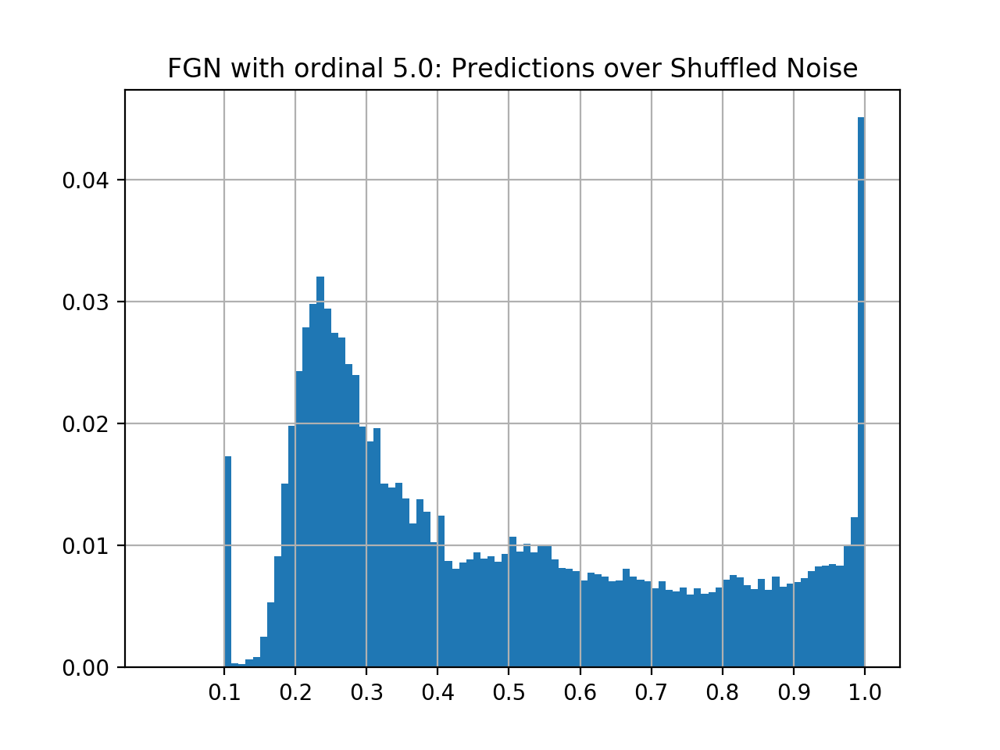

percentage of confident (>0.5) predictions: 0.4240708635821866


In [67]:
# histogram per param - shuffled noise

for ordinal in ordinals:
    weights=[]
    for path, hist, stat in fgn_hist_list_shuffled_noise:
        if str(ordinal) in path:
            #weights
            w = hist[0]
            if len(weights) == 0:
                weights=w
            else:
                weights+=w

    s = float(np.sum(weights))
    weights = [w/s for w in weights]

    plt.hist(bins[:-1], weights=weights, bins=bins)
    plt.xticks((np.arange(10)+1)/10.0)
    plt.grid(True)
    plt.title("FGN with ordinal {}: Predictions over Shuffled Noise".format(ordinal))
    plt.show()
    # % above 0.5
    print("percentage of confident (>0.5) predictions:", np.sum(weights[49:]))

<IPython.core.display.Javascript object>


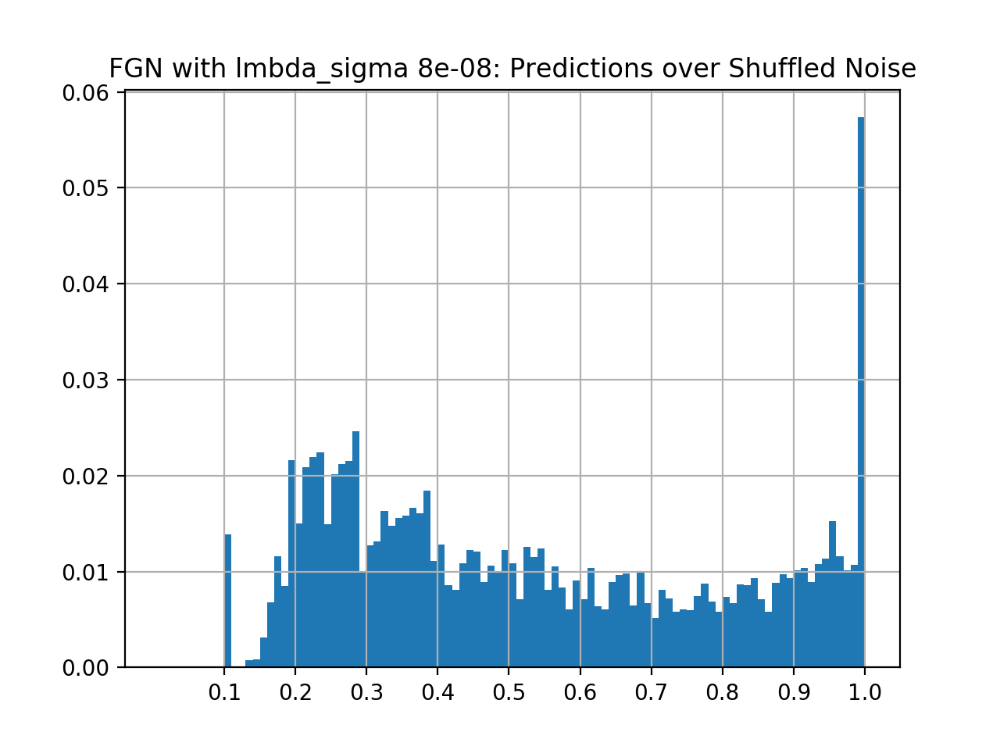

percentage of confident (>0.5) predictions: 0.4832679576621771


<IPython.core.display.Javascript object>


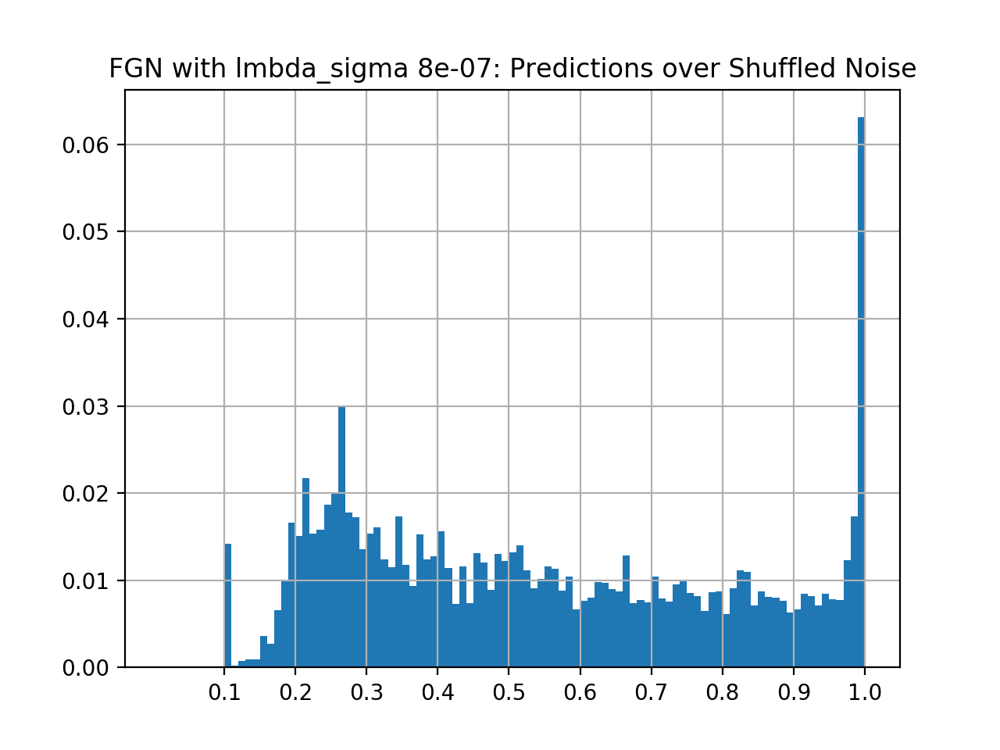

percentage of confident (>0.5) predictions: 0.5114354617420868


<IPython.core.display.Javascript object>


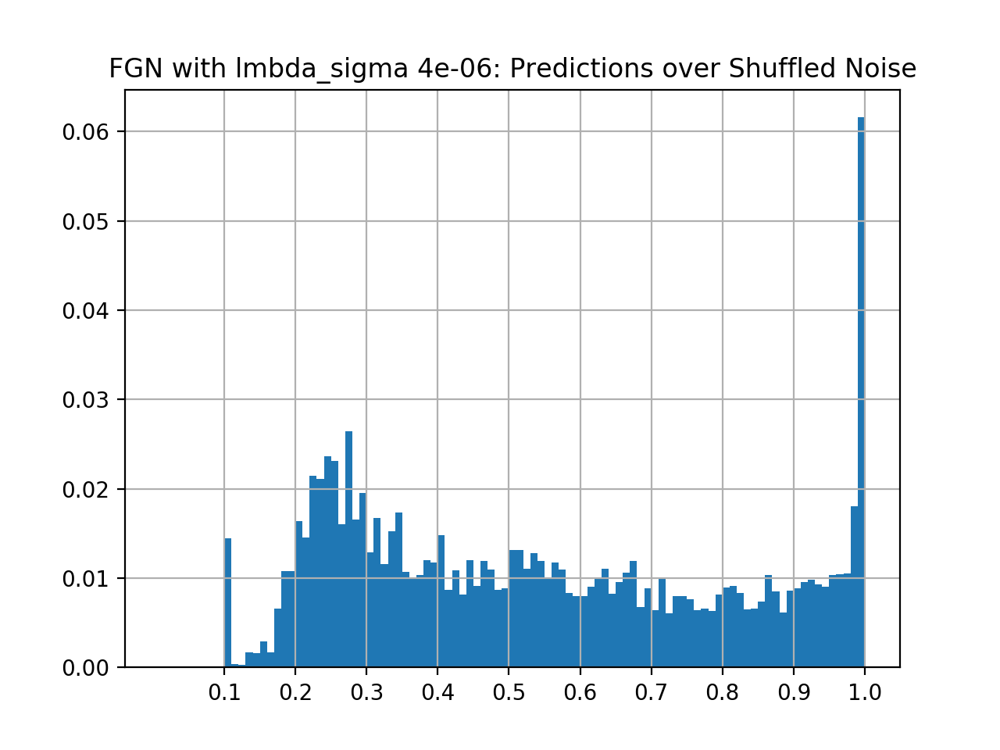

percentage of confident (>0.5) predictions: 0.5173197506368632


<IPython.core.display.Javascript object>


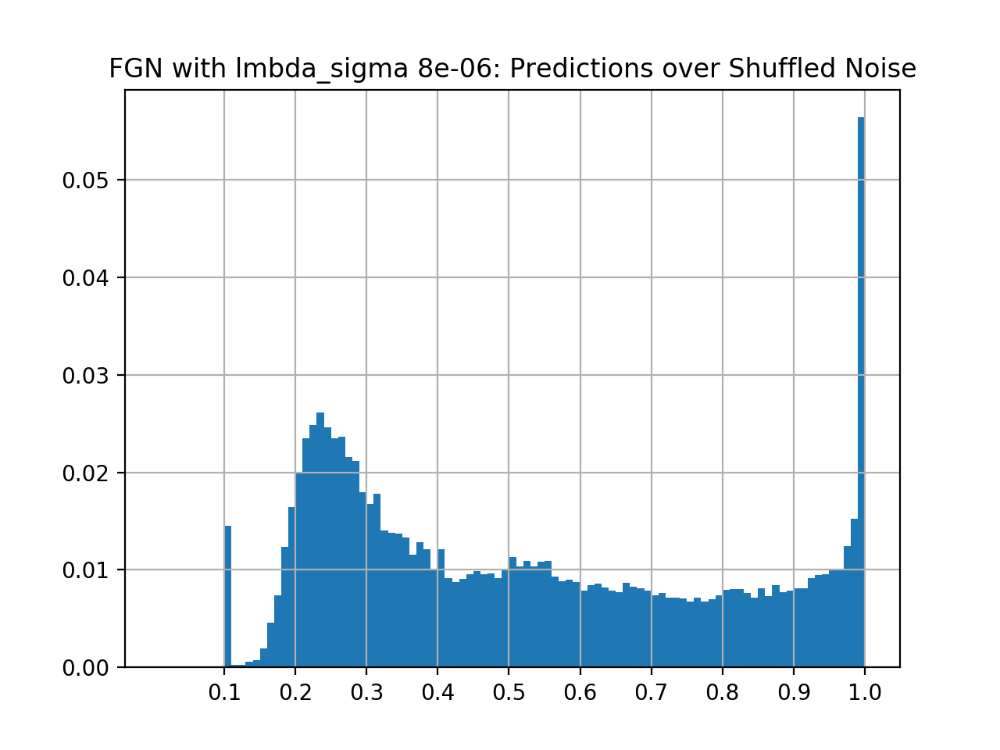

percentage of confident (>0.5) predictions: 0.480884979207333


<IPython.core.display.Javascript object>


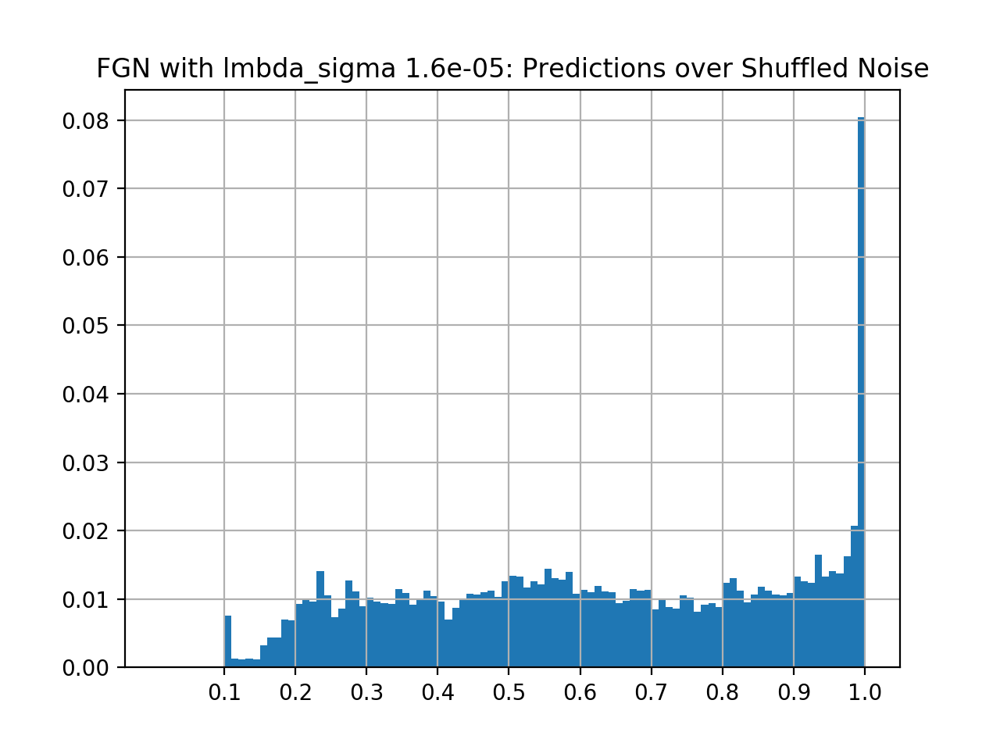

percentage of confident (>0.5) predictions: 0.6555505185303351


<IPython.core.display.Javascript object>


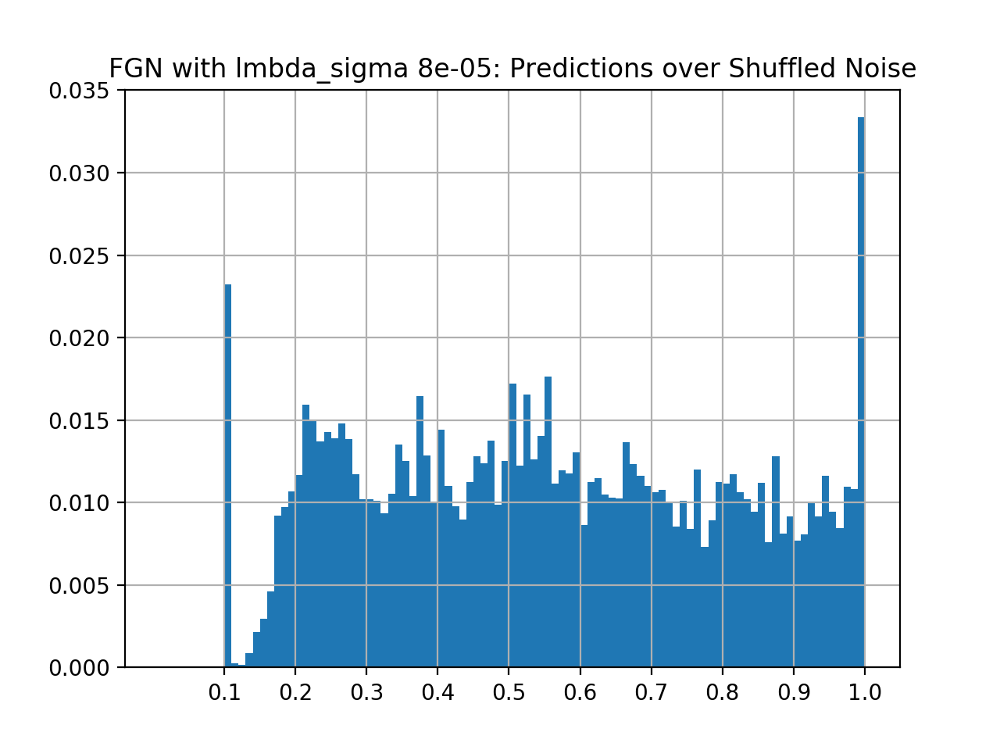

percentage of confident (>0.5) predictions: 0.5684838005899773


<IPython.core.display.Javascript object>


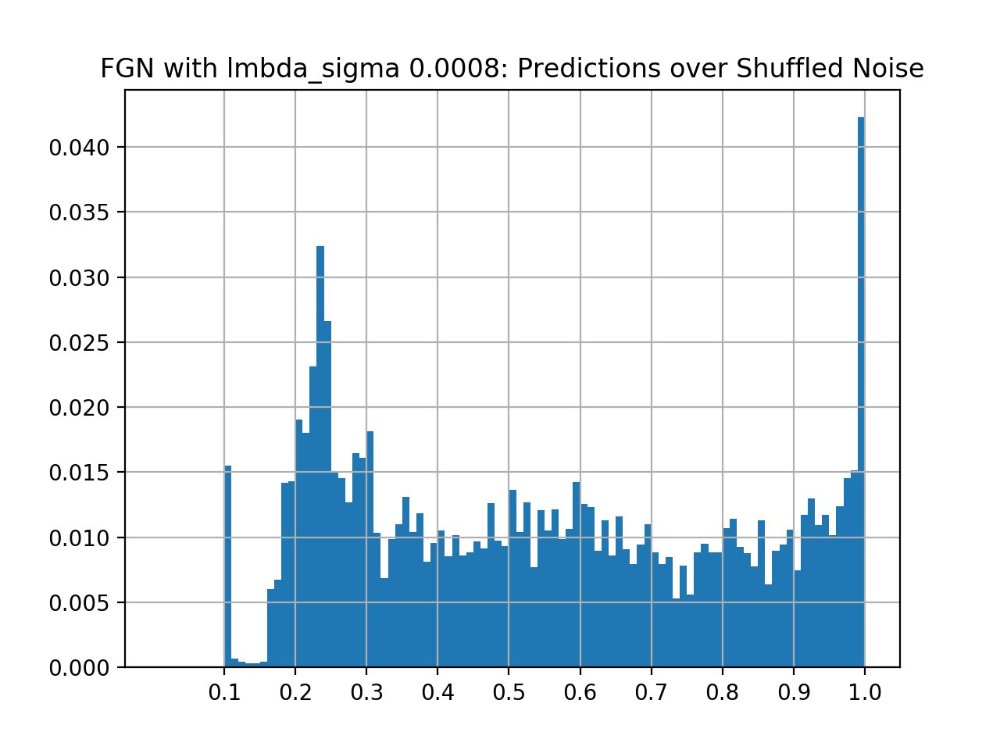

percentage of confident (>0.5) predictions: 0.5406828814248056


In [68]:
# histogram per param - shuffled noise

for ls in lmbda_sigmas:
    weights=[]
    for path, hist, stat in fgn_hist_list_shuffled_noise:
        if str(ls) in path:
            #weights
            w = hist[0]
            if len(weights) == 0:
                weights=w
            else:
                weights+=w

    s = float(np.sum(weights))
    weights = [w/s for w in weights]

    plt.hist(bins[:-1], weights=weights, bins=bins)
    plt.xticks((np.arange(10)+1)/10.0)
    plt.grid(True)
    plt.title("FGN with lmbda_sigma {}: Predictions over Shuffled Noise".format(ls))
    plt.show()
    # % above 0.5
    print("percentage of confident (>0.5) predictions:", np.sum(weights[49:]))

<IPython.core.display.Javascript object>


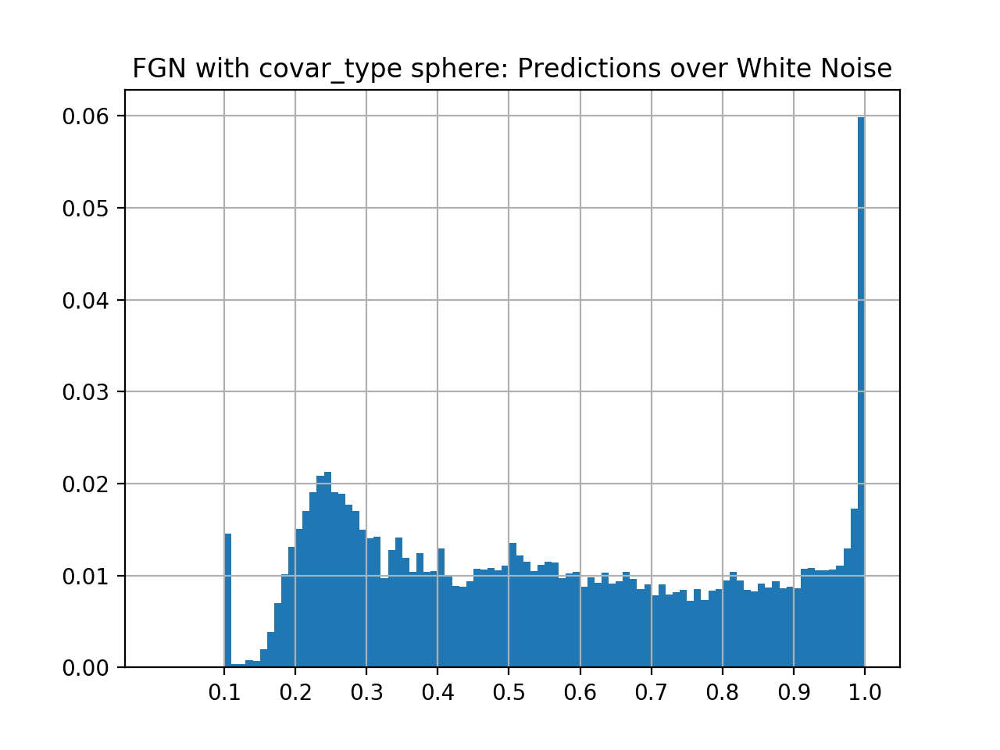

percentage of confident (>0.5) predictions: 0.5420050936453502


<IPython.core.display.Javascript object>


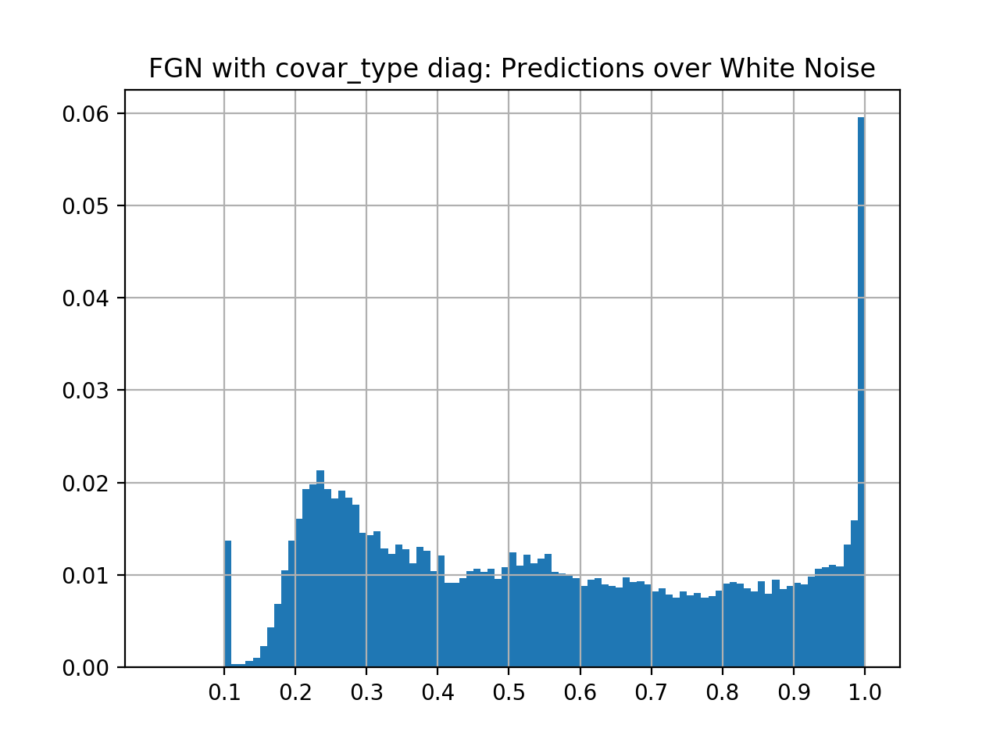

percentage of confident (>0.5) predictions: 0.5316982612239404


In [69]:
# histogram per param - shuffled noise

for covar_type in covar_types:
    weights=[]
    for path, hist, stat in fgn_hist_list_shuffled_noise:
        if str(covar_type) in path:
            #weights
            w = hist[0]
            if len(weights) == 0:
                weights=w
            else:
                weights+=w

    s = float(np.sum(weights))
    weights = [w/s for w in weights]

    plt.hist(bins[:-1], weights=weights, bins=bins)
    plt.xticks((np.arange(10)+1)/10.0)
    plt.grid(True)
    plt.title("FGN with covar_type {}: Predictions over White Noise".format(covar_type))
    plt.show()
    # % above 0.5
    print("percentage of confident (>0.5) predictions:", np.sum(weights[49:]))

In [64]:
### converted FGNs

In [70]:
converted_hist_list_white_noise, converted_hist_list_shuffled_noise = get_histograms_from_list(converted_fgn_model_list, 
                                                                                           num_samples=1000, 
                                                                                           verbose=True)

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.4_ite4/converted FGNs/converted_fgn_hl[1024]_dp0.4_sphere_ord1.0_ls8e-06
file #0 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6021079421043396, 0.9887668490409851), mean=0.8628440331220627, variance=0.004564659083066412, skewness=-0.7400101824285642, kurtosis=0.32499563551908883)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2071657031774521, 0.9999394416809082), mean=0.7425087176561356, variance=0.048080840817103176, skewness=-0.43099771630930284, kurtosis=-1.0964915852512946)
percentage of confident (>0.5) predictions: 0.818

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.4_ite4/converted FGNs/converted_fgn_hl[1024]_dp0.4_diag_ord5.0_ls8e-07
file #1 out of 10360
Loaded model directly
Using GPU: 1


Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8851670622825623, 0.8851670622825623), mean=0.8851670622825623, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.8851670622825623, 0.8851670622825623), mean=0.8851670622825623, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.4_ite4/converted FGNs/converted_fgn_hl[1024]_dp0.4_diag_ord2.0_ls8e-07
file #13 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9265416264533997, 0.9265416264533997), mean=0.9265416264533997, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9265415668487549, 0.9265416264533997), mean=0.926541626393795, variance=3.552713678800502e-18, s

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8268406391143799, 0.8268406391143799), mean=0.8268406391143799, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.8268405199050903, 0.8268479704856873), mean=0.8268406463265419, variance=5.376496578610277e-14, skewness=31.562644012283414, kurtosis=994.4735876784174)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.4_ite4/converted FGNs/converted_fgn_hl[1024]_dp0.4_diag_ord0.5_ls0.0008
file #25 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.17743994295597076, 0.9780537486076355), mean=0.4961555839031935, variance=0.03893698862153143, skewness=0.6164784473234641, kurtosis=-0.5809588355580333)
percentage of confident (>0.5) predictions: 0.414
DescribeResult(nobs=1000, minmax=(0.17050699889659882, 0.9

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9571767449378967, 0.9571767449378967), mean=0.9571767449378967, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9571753144264221, 0.9571854472160339), mean=0.9571767520308495, variance=7.78212827290181e-14, skewness=30.19059862182741, kurtosis=943.4812290002897)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.4_ite4/converted FGNs/converted_fgn_hl[1024]_dp0.4_sphere_ord0.5_ls0.0008
file #37 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.18746648728847504, 0.9947409629821777), mean=0.6354475883990526, variance=0.04602012965913941, skewness=-0.18001467493566126, kurtosis=-1.1695733104956942)
percentage of confident (>0.5) predictions: 0.691
DescribeResult(nobs=1000, minmax=(0.17260602116584778, 0

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.20475457608699799, 0.9690721035003662), mean=0.5436486227661371, variance=0.025185292741679553, skewness=0.3972269321050379, kurtosis=-0.44547041945972676)
percentage of confident (>0.5) predictions: 0.564
DescribeResult(nobs=1000, minmax=(0.20803318917751312, 0.9999748468399048), mean=0.7170743514448404, variance=0.05303400488738052, skewness=-0.335855284348106, kurtosis=-1.1960815502534947)
percentage of confident (>0.5) predictions: 0.776

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.4_ite4/converted FGNs/converted_fgn_hl[1024]_dp0.4_sphere_ord0.5_ls8e-07
file #49 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1800859421491623, 0.965718686580658), mean=0.5409154282361269, variance=0.03369287301670634, skewness=0.333819861740457, kurtosis=-0.7552197771149101)
percentage of confident (>0.5) predictions: 0.541
Descri

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.16890820860862732, 0.45917224884033203), mean=0.2230940517783165, variance=0.0002568384712879684, skewness=6.242950842844053, kurtosis=67.54228525328926)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.16230908036231995, 0.946220874786377), mean=0.42602864508330823, variance=0.030248641379208515, skewness=0.7661484237425098, kurtosis=0.09125931414574628)
percentage of confident (>0.5) predictions: 0.291

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.4_ite4/converted FGNs/converted_fgn_hl[16, 16]_dp0.4_sphere_ord0.5_ls8e-05
file #61 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1769384890794754, 0.29887375235557556), mean=0.21803222139179707, variance=0.0009883406989827901, skewness=0.7748958351451876, kurtosis=-1.2447737707301378)
percentage of confident (>0.5) predictions: 0.0
D

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.18394413590431213, 0.18394413590431213), mean=0.18394413590431213, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.18394413590431213, 0.18394413590431213), mean=0.18394413590431213, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.4_ite4/converted FGNs/converted_fgn_hl[16, 16]_dp0.4_diag_ord5.0_ls4e-06
file #73 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1527920365333557, 0.1527920365333557), mean=0.1527920365333557, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.1527920365333557, 0.1527920365333557), mean=0.1527920365333557, variance=0.0, skewness

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.21139922738075256, 0.21139922738075256), mean=0.21139922738075256, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.21139922738075256, 0.21139922738075256), mean=0.21139922738075256, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.4_ite4/converted FGNs/converted_fgn_hl[16, 16]_dp0.4_sphere_ord1.0_ls8e-07
file #86 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.24144911766052246, 0.24182339012622833), mean=0.24157762418687342, variance=7.819652694623186e-10, skewness=0.02292001989036526, kurtosis=6.445767407421513)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.19136981666088104, 0.4726010262966156), mean=0.243300130

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2176649272441864, 0.2176649272441864), mean=0.2176649272441864, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2176649272441864, 0.2176649272441864), mean=0.2176649272441864, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.4_ite4/converted FGNs/converted_fgn_hl[16, 16]_dp0.4_diag_ord5.0_ls8e-05
file #98 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.17335198819637299, 0.17335198819637299), mean=0.17335198819637299, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.17335198819637299, 0.17335198819637299), mean=0.17335198819637299, variance=0.0, skewness=0.0, kurtosis=-3.0)
p

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1871350109577179, 0.4742492437362671), mean=0.2262400122731924, variance=0.002253051926541517, skewness=2.9446817284658664, kurtosis=10.505930135917719)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.15446792542934418, 0.9714226722717285), mean=0.4201462039649487, variance=0.028858461682009343, skewness=0.708368780465217, kurtosis=-0.06918707281784453)
percentage of confident (>0.5) predictions: 0.284

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.4_ite4/converted FGNs/converted_fgn_hl[16, 16]_dp0.4_sphere_ord1.0_ls1.6e-05
file #110 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.21357795596122742, 0.21362891793251038), mean=0.21360168355703354, variance=4.988261250529004e-11, skewness=-0.31764067982464916, kurtosis=1.5245039534525509)
percentage of confident (>0.5) predictions: 0

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1636563539505005, 0.5727462768554688), mean=0.32352588576078417, variance=0.003644744010776677, skewness=0.44084723807452636, kurtosis=0.9502384384685469)
percentage of confident (>0.5) predictions: 0.005
DescribeResult(nobs=1000, minmax=(0.19816046953201294, 0.9878525733947754), mean=0.49102443128824236, variance=0.03197561661871644, skewness=0.6426280526955487, kurtosis=-0.26323530353255586)
percentage of confident (>0.5) predictions: 0.409

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.4_ite0/converted FGNs/converted_fgn_hl[16]_dp0.4_sphere_ord1.0_ls4e-06
file #122 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1727302223443985, 0.17283044755458832), mean=0.17277029469609262, variance=1.3679817058911193e-10, skewness=0.07486509139867575, kurtosis=2.300862785362)
percentage of confident (>0.5) predictions: 0.0
Describ

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.18361929059028625, 0.1837766170501709), mean=0.1837280404418707, variance=4.058422797601267e-10, skewness=-0.8525970982459892, kurtosis=1.246439027377237)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.15582275390625, 0.5143130421638489), mean=0.19009614680707454, variance=0.000801883873625626, skewness=5.036552190399137, kurtosis=36.604741098764165)
percentage of confident (>0.5) predictions: 0.001

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.4_ite0/converted FGNs/converted_fgn_hl[16]_dp0.4_diag_ord0.5_ls1.6e-05
file #134 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.14999394118785858, 0.4804175794124603), mean=0.2406879723072052, variance=0.0036861525786822755, skewness=1.2217812712091385, kurtosis=1.3648510794277797)
percentage of confident (>0.5) predictions: 0.0
DescribeResul

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.16852974891662598, 0.16852974891662598), mean=0.16852974891662598, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.16852974891662598, 0.16852974891662598), mean=0.16852974891662598, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.4_ite0/converted FGNs/converted_fgn_hl[16]_dp0.4_diag_ord1.0_ls1.6e-05
file #146 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1611844301223755, 0.16134315729141235), mean=0.16126337833702564, variance=4.76068825863543e-10, skewness=-0.11277258293886541, kurtosis=0.2303315220709492)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.14043250679969788, 0.45328575372695923), mean=0.172387656092643

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.17524310946464539, 0.17524310946464539), mean=0.17524310946464539, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.17524310946464539, 0.17524310946464539), mean=0.17524310946464539, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.4_ite0/converted FGNs/converted_fgn_hl[16]_dp0.4_sphere_ord0.5_ls8e-06
file #158 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.15833792090415955, 0.35493505001068115), mean=0.22544996581971646, variance=0.0014307440923219579, skewness=0.08385464381763448, kurtosis=-0.884330730613565)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.19841210544109344, 0.9805758595466614), mean=0.481054840549826

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.31294888257980347, 0.31294888257980347), mean=0.31294888257980347, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.31294888257980347, 0.31294888257980347), mean=0.31294888257980347, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.0_ite3/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.0_diag_ord2.0_ls8e-05
file #170 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8504342436790466, 0.8504342436790466), mean=0.8504342436790466, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.8504331707954407, 0.8528938889503479), mean=0.8504367058873177, varianc

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8086097836494446, 0.8086097836494446), mean=0.8086097836494446, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.8085778951644897, 0.8086098432540894), mean=0.8086097518205643, variance=1.016882830637198e-12, skewness=-31.57515664774677, kurtosis=994.9940275881986)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.0_ite3/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.0_diag_ord5.0_ls8e-05
file #182 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2888790965080261, 0.2888790965080261), mean=0.2888790965080261, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2888790965080261, 0.28887909650

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9545058608055115, 0.9545058608055115), mean=0.9545058608055115, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9543602466583252, 0.9545059204101562), mean=0.9545057154297829, variance=2.1203563532706745e-11, skewness=-31.575290938999622, kurtosis=994.9996672885281)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.0_ite3/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.0_sphere_ord2.0_ls8e-07
file #194 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9803572297096252, 0.9803572297096252), mean=0.9803572297096252, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9803571701049805, 0.9803572297096252), mean=0.980

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9466982483863831, 0.9845528602600098), mean=0.9798249269127846, variance=1.0779216039460186e-05, skewness=-3.4172006988702344, kurtosis=20.024876909383483)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.3652854859828949, 0.9999029040336609), mean=0.9425686992406845, variance=0.009596157115634753, skewness=-2.9609835342629567, kurtosis=8.960514247174872)
percentage of confident (>0.5) predictions: 0.996

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.0_ite3/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.0_sphere_ord2.0_ls8e-08
file #206 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8822668790817261, 0.8822668790817261), mean=0.8822668790817261, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult

DescribeResult(nobs=1000, minmax=(0.38590529561042786, 0.999192476272583), mean=0.7852134054899216, variance=0.017374749708486247, skewness=-0.32967715954549126, kurtosis=-0.5672291837335219)
percentage of confident (>0.5) predictions: 0.99

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.0_ite3/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.0_diag_ord1.0_ls8e-07
file #217 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9279071092605591, 0.9949694275856018), mean=0.9619703454375267, variance=5.770770285309424e-05, skewness=0.5032155172125825, kurtosis=0.8031076683100262)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.30496883392333984, 0.9999123811721802), mean=0.9109941579997539, variance=0.014146778330152886, skewness=-2.2719477712581555, kurtosis=5.026153893069512)
percentage of confident (>0.5) predictions: 0.991

W

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7965941429138184, 0.9440385103225708), mean=0.8873777708411217, variance=0.0003860045936275408, skewness=-0.5203045214153141, kurtosis=0.733224386258426)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.20116819441318512, 0.9999989867210388), mean=0.7096509624272584, variance=0.0510085528756645, skewness=-0.31010634558959194, kurtosis=-1.095610486108605)
percentage of confident (>0.5) predictions: 0.785

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.1_ite4/converted FGNs/converted_fgn_hl[64]_dp0.1_sphere_ord0.5_ls4e-06
file #229 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22159437835216522, 0.9737572073936462), mean=0.41394117176532746, variance=0.01641124936958156, skewness=1.200752176168676, kurtosis=1.591110119666265)
percentage of confident (>0.5) predictions: 0.25
DescribeResul

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9285321831703186, 0.9285321831703186), mean=0.9285321831703186, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9285287857055664, 0.9285321831703186), mean=0.9285321797728538, variance=1.1542766742422833e-14, skewness=-31.575322658650148, kurtosis=995.0010009989102)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.1_ite4/converted FGNs/converted_fgn_hl[64]_dp0.1_diag_ord1.0_ls8e-06
file #241 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.42657938599586487, 0.8760661482810974), mean=0.7331333751082421, variance=0.001979864929755257, skewness=-1.2102451071227165, kurtosis=5.765527861177237)
percentage of confident (>0.5) predictions: 0.998
DescribeResult(nobs=1000, minmax=(0.22

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.21834351122379303, 0.8947973847389221), mean=0.4681772713959217, variance=0.018056413388409975, skewness=0.4937354673918238, kurtosis=-0.33656522539772515)
percentage of confident (>0.5) predictions: 0.361
DescribeResult(nobs=1000, minmax=(0.23560145497322083, 1.0), mean=0.7664426182806492, variance=0.04124110107502782, skewness=-0.618179855346847, kurtosis=-0.7619537031309251)
percentage of confident (>0.5) predictions: 0.862

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.1_ite4/converted FGNs/converted_fgn_hl[64]_dp0.1_sphere_ord0.5_ls0.0008
file #253 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.20975898206233978, 0.9113063812255859), mean=0.5420446893870831, variance=0.01888566006194815, skewness=-0.2508425470723838, kurtosis=-0.47076707910045945)
percentage of confident (>0.5) predictions: 0.671
DescribeResult(nob

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.28460589051246643, 0.28460589051246643), mean=0.28460589051246643, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.28460589051246643, 0.28460589051246643), mean=0.28460589051246643, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.1_ite4/converted FGNs/converted_fgn_hl[64]_dp0.1_diag_ord5.0_ls4e-06
file #265 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.23981215059757233, 0.23981215059757233), mean=0.23981215059757233, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.23981215059757233, 0.23981215059757233), mean=0.23981215059757233, variance=0.0, skewness=0.0, kurtosis=-3.0)
pe

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8837431073188782, 0.8837431073188782), mean=0.8837431073188782, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.8837431073188782, 0.8837431073188782), mean=0.8837431073188782, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.1_ite4/converted FGNs/converted_fgn_hl[64]_dp0.1_sphere_ord5.0_ls8e-06
file #277 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.197653129696846, 0.197653129696846), mean=0.197653129696846, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.197653129696846, 0.197653129696846), mean=0.197653129696846, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of conf

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.29993200302124023, 0.6540300846099854), mean=0.454371751844883, variance=0.002967206997687762, skewness=0.05066105947806055, kurtosis=0.36993727908042073)
percentage of confident (>0.5) predictions: 0.205
DescribeResult(nobs=1000, minmax=(0.19011932611465454, 0.9733508825302124), mean=0.5241567078977823, variance=0.04007317794676802, skewness=0.5549420372509569, kurtosis=-0.8153399856406742)
percentage of confident (>0.5) predictions: 0.462

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.4_ite3/converted FGNs/converted_fgn_hl[64, 64]_dp0.4_diag_ord5.0_ls1.6e-05
file #289 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.20946261286735535, 0.20946261286735535), mean=0.20946261286735535, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.209462612

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3097638189792633, 0.5235030055046082), mean=0.4070060132145882, variance=0.0012228499458979717, skewness=0.08244366957114797, kurtosis=0.038968462246789404)
percentage of confident (>0.5) predictions: 0.008
DescribeResult(nobs=1000, minmax=(0.1751421093940735, 0.9895870685577393), mean=0.5113905183523894, variance=0.03161344635073375, skewness=0.6708209469240309, kurtosis=-0.4311977634981048)
percentage of confident (>0.5) predictions: 0.433

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.4_ite3/converted FGNs/converted_fgn_hl[64, 64]_dp0.4_diag_ord1.0_ls8e-07
file #301 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.34971457719802856, 0.590917706489563), mean=0.45164940986037255, variance=0.0012541650510242248, skewness=0.028586273782957687, kurtosis=-0.017138687670538832)
percentage of confident (>0.5) predictions: 

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.18586289882659912, 0.18586289882659912), mean=0.18586289882659912, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.18586289882659912, 0.18586289882659912), mean=0.18586289882659912, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.4_ite3/converted FGNs/converted_fgn_hl[64, 64]_dp0.4_diag_ord1.0_ls8e-05
file #313 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.31309154629707336, 0.7034319043159485), mean=0.4781712956726551, variance=0.0037206591512330476, skewness=0.10260311860794023, kurtosis=-0.49133134460539774)
percentage of confident (>0.5) predictions: 0.374
DescribeResult(nobs=1000, minmax=(0.1938672959804535, 0.9928118586540222), mean=0.53277339

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5976713299751282, 0.5976713299751282), mean=0.5976713299751282, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5976713299751282, 0.5976713299751282), mean=0.5976713299751282, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.4_ite3/converted FGNs/converted_fgn_hl[64, 64]_dp0.4_sphere_ord2.0_ls8e-07
file #325 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.663718044757843, 0.663718044757843), mean=0.663718044757843, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.663718044757843, 0.663718044757843), mean=0.663718044757843, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5685938596725464, 0.8258620500564575), mean=0.7056067268848419, variance=0.0006864029212046005, skewness=-1.0992165140700925, kurtosis=1.8539744411867582)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.259376585483551, 0.9984607696533203), mean=0.6347210310101509, variance=0.02256247451180291, skewness=0.1967182889161288, kurtosis=-0.3729077614731757)
percentage of confident (>0.5) predictions: 0.813

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.1_ite2/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.1_diag_ord5.0_ls1.6e-05
file #337 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.23483240604400635, 0.23483240604400635), mean=0.23483240604400635, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.23483

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.25267839431762695, 0.9142546057701111), mean=0.49088067504763605, variance=0.014095507560390241, skewness=0.876156489514789, kurtosis=0.7616787307328607)
percentage of confident (>0.5) predictions: 0.461
DescribeResult(nobs=1000, minmax=(0.19821645319461823, 0.9997894763946533), mean=0.7258573395907879, variance=0.036640036196494884, skewness=-0.4742869055122234, kurtosis=-0.8636671824553912)
percentage of confident (>0.5) predictions: 0.835

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.1_ite2/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.1_diag_ord1.0_ls8e-05
file #349 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7214882373809814, 0.8429849743843079), mean=0.7686180464029312, variance=0.00047047815272104943, skewness=0.6537763325549366, kurtosis=0.013689073280780395)
percentage of confident (>0.5) predicti

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.30444854497909546, 0.30444854497909546), mean=0.30444854497909546, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.30444854497909546, 0.30444854497909546), mean=0.30444854497909546, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.1_ite2/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.1_sphere_ord0.5_ls8e-05
file #361 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19800962507724762, 0.9804335832595825), mean=0.42389522850513456, variance=0.010917106569349355, skewness=1.4768175683526428, kurtosis=5.939149335617223)
percentage of confident (>0.5) predictions: 0.043
DescribeResult(nobs=1000, minmax=(0.2064630389213562, 0.9998133182525635), mean=0.70

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.23737545311450958, 0.8293302059173584), mean=0.5915833423286676, variance=0.006805516048380013, skewness=-1.008249258133983, kurtosis=2.3927239880475994)
percentage of confident (>0.5) predictions: 0.87
DescribeResult(nobs=1000, minmax=(0.21691346168518066, 0.999963641166687), mean=0.7162869085073471, variance=0.04110119096398018, skewness=-0.44887809038412035, kurtosis=-0.9491274709977602)
percentage of confident (>0.5) predictions: 0.815

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.1_ite2/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.1_diag_ord2.0_ls1.6e-05
file #373 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7038567662239075, 0.7038567662239075), mean=0.7038567662239075, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.70385

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2545253336429596, 0.2545253336429596), mean=0.2545253336429596, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2545253336429596, 0.2545253336429596), mean=0.2545253336429596, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.1_ite2/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.1_diag_ord5.0_ls8e-07
file #385 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2462315559387207, 0.2462315559387207), mean=0.2462315559387207, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2462315559387207, 0.2462315559387207), mean=0.2462315559387207, variance=0.0, skewness=0.0, kurtosis=-3.0

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.21789786219596863, 0.9999566078186035), mean=0.721533414080739, variance=0.04222832549391394, skewness=-0.4606043655799809, kurtosis=-0.9456808059984096)
percentage of confident (>0.5) predictions: 0.814
DescribeResult(nobs=1000, minmax=(0.2822839915752411, 0.9999990463256836), mean=0.8556639343202114, variance=0.03190483180554246, skewness=-1.1820211295949445, kurtosis=0.2908686416570636)
percentage of confident (>0.5) predictions: 0.946

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.1_ite0/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.1_sphere_ord2.0_ls1.6e-05
file #397 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9412478804588318, 0.9412478804588318), mean=0.9412478804588318, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9412

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8415032029151917, 0.9966225028038025), mean=0.9761556640267373, variance=0.00028558561855534544, skewness=-2.3352402190553887, kurtosis=9.031206797661788)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2414807230234146, 0.9999898076057434), mean=0.7784412198215723, variance=0.03817449493730494, skewness=-0.6220587549636796, kurtosis=-0.7970747807581282)
percentage of confident (>0.5) predictions: 0.888

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.1_ite0/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.1_sphere_ord5.0_ls4e-06
file #409 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19930310547351837, 0.19930310547351837), mean=0.19930310547351837, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.199

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7163813710212708, 0.9957127571105957), mean=0.932750320315361, variance=0.0014783685234279603, skewness=-1.367254885765579, kurtosis=3.1649309862652055)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2709634006023407, 0.9998824000358582), mean=0.7605458014011383, variance=0.0330022568825774, skewness=-0.4725608750757952, kurtosis=-0.7907122514672875)
percentage of confident (>0.5) predictions: 0.902

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.1_ite0/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.1_sphere_ord5.0_ls8e-08
file #421 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2653672993183136, 0.2653672993183136), mean=0.2653672993183136, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.265367299

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9343051910400391, 0.9343051910400391), mean=0.9343051910400391, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9343051910400391, 0.9343533515930176), mean=0.9343052394986152, variance=2.3194989463771934e-12, skewness=31.573512910366922, kurtosis=994.9245727371854)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.1_ite0/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.1_sphere_ord0.5_ls8e-08
file #433 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2326723039150238, 0.9999999403953552), mean=0.7351840414702893, variance=0.040762541688018704, skewness=-0.3307915614911244, kurtosis=-1.1513627177205308)
percentage of confident (>0.5) predictions: 0.834
DescribeResult(nobs=

DescribeResult(nobs=1000, minmax=(0.26783233880996704, 0.9999987483024597), mean=0.7952595540881157, variance=0.03445902145180404, skewness=-0.731966757511347, kurtosis=-0.5983268252928222)
percentage of confident (>0.5) predictions: 0.9

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.1_ite0/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.1_sphere_ord5.0_ls8e-06
file #444 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3825688660144806, 0.3825688660144806), mean=0.3825688660144806, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3825688660144806, 0.3825688660144806), mean=0.3825688660144806, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:

DescribeResult(nobs=1000, minmax=(0.2240888625383377, 0.9995110630989075), mean=0.6946111726909876, variance=0.039194078768747025, skewness=-0.13597168342397534, kurtosis=-1.1355052362420253)
percentage of confident (>0.5) predictions: 0.805

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.4_ite4/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.4_diag_ord2.0_ls4e-06
file #456 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2733549177646637, 0.2733549177646637), mean=0.2733549177646637, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2733549177646637, 0.2733554542064667), mean=0.2733549183011055, variance=2.8776980798284083e-16, skewness=31.575322662785677, kurtosis=995.0010011730185)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FG

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2659793496131897, 0.8802158832550049), mean=0.48827884256839754, variance=0.012714287310931468, skewness=0.6672451643510791, kurtosis=-0.008260061502832095)
percentage of confident (>0.5) predictions: 0.409
DescribeResult(nobs=1000, minmax=(0.2468051016330719, 0.9998309016227722), mean=0.7068486060798168, variance=0.04116179380006758, skewness=-0.2520725672924253, kurtosis=-1.1322737871756765)
percentage of confident (>0.5) predictions: 0.788

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.4_ite4/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.4_sphere_ord0.5_ls8e-06
file #468 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3001284897327423, 0.9775083661079407), mean=0.6054570228159427, variance=0.01880445254566793, skewness=0.2749714249311721, kurtosis=-0.6127986894673407)
percentage of conf

DescribeResult(nobs=1000, minmax=(0.21732768416404724, 0.9992340207099915), mean=0.6814617714881896, variance=0.039653530338024254, skewness=-0.06454025355459012, kurtosis=-1.1223333945776655)
percentage of confident (>0.5) predictions: 0.777

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.4_ite4/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.4_sphere_ord5.0_ls0.0008
file #479 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2523186206817627, 0.2523186206817627), mean=0.2523186206817627, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2523186206817627, 0.2523186206817627), mean=0.2523186206817627, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_

DescribeResult(nobs=1000, minmax=(0.19531655311584473, 0.9997916221618652), mean=0.6945596493780613, variance=0.039903660429703794, skewness=-0.17116079991087876, kurtosis=-1.0922400068980171)
percentage of confident (>0.5) predictions: 0.795

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.4_ite4/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.4_sphere_ord0.5_ls1.6e-05
file #491 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.256827175617218, 0.963036298751831), mean=0.6572517470419407, variance=0.030968234361846775, skewness=-0.21987130884338008, kurtosis=-1.040196746895155)
percentage of confident (>0.5) predictions: 0.768
DescribeResult(nobs=1000, minmax=(0.2377977818250656, 0.999528169631958), mean=0.7346394873112441, variance=0.03865365764610506, skewness=-0.37463270896788675, kurtosis=-1.0851756964841368)
percentage of confident (>0.5) predictions: 0.831



Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3142518997192383, 0.9206467270851135), mean=0.5397552083730698, variance=0.015707131020632013, skewness=0.6326866088075818, kurtosis=-0.2540337700203712)
percentage of confident (>0.5) predictions: 0.555
DescribeResult(nobs=1000, minmax=(0.20592357218265533, 0.9999243021011353), mean=0.7410682490319014, variance=0.03650120235633122, skewness=-0.4043237437394, kurtosis=-0.9613756566048695)
percentage of confident (>0.5) predictions: 0.864

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.4_ite4/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.4_diag_ord1.0_ls8e-08
file #503 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.36044076085090637, 0.9307959675788879), mean=0.6388177053034305, variance=0.014155294681157986, skewness=0.2705848107089999, kurtosis=-0.8065040201702809)
percentage of confident (>0.5) predictions: 0

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4963454306125641, 0.9958620071411133), mean=0.7404127131402493, variance=0.019966722594776, skewness=0.030720014385707286, kurtosis=-1.157366458885527)
percentage of confident (>0.5) predictions: 0.992
DescribeResult(nobs=1000, minmax=(0.24370983242988586, 0.9999876618385315), mean=0.8068842036426067, variance=0.02986706299002976, skewness=-0.7420066409246886, kurtosis=-0.5604924844958843)
percentage of confident (>0.5) predictions: 0.935

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.1_ite2/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.1_sphere_ord2.0_ls8e-08
file #515 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6852609515190125, 0.6852609515190125), mean=0.6852609515190125, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
Describe

DescribeResult(nobs=1000, minmax=(0.2409084588289261, 0.9999935626983643), mean=0.8193150597363711, variance=0.034138541186128225, skewness=-0.8897597284420937, kurtosis=-0.3403531910156592)
percentage of confident (>0.5) predictions: 0.923

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.1_ite2/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.1_sphere_ord0.5_ls8e-08
file #526 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3366634249687195, 0.9999025464057922), mean=0.9818684588670731, variance=0.0023974210458301967, skewness=-7.307000702782943, kurtosis=70.14259305149533)
percentage of confident (>0.5) predictions: 0.997
DescribeResult(nobs=1000, minmax=(0.2529171407222748, 0.9999712705612183), mean=0.8049175833761693, variance=0.03643639419896575, skewness=-0.6582627638377545, kurtosis=-0.8320714150835706)
percentage of confident (>0.5) predictions:

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5008160471916199, 0.9974234104156494), mean=0.8301183106899261, variance=0.01901195650070679, skewness=-0.707506187552825, kurtosis=-0.6818041260351442)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.27282214164733887, 0.9999850392341614), mean=0.810352957546711, variance=0.031851043067124156, skewness=-0.6979690428471013, kurtosis=-0.7065865001498763)
percentage of confident (>0.5) predictions: 0.942

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.1_ite2/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.1_sphere_ord0.5_ls8e-07
file #538 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3230384588241577, 0.9982978701591492), mean=0.7132677261531353, variance=0.02730332720285243, skewness=-0.11005322323382569, kurtosis=-1.0314473561853081)
percentag

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4268150329589844, 0.4268150329589844), mean=0.4268150329589844, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.4268147647380829, 0.4268150329589844), mean=0.4268150326907635, variance=7.194245199571016e-17, skewness=-31.575322662785712, kurtosis=995.0010011730201)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.1_ite2/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.1_diag_ord1.0_ls4e-06
file #549 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5076873302459717, 0.9995770454406738), mean=0.9576860539913178, variance=0.005477247495506871, skewness=-3.2757947682762207, kurtosis=11.916102745969898)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.39589089155197144, 0.5422518849372864), mean=0.4757232392728329, variance=0.0002865216767744493, skewness=-0.15494965959246484, kurtosis=2.102655170591209)
percentage of confident (>0.5) predictions: 0.075
DescribeResult(nobs=1000, minmax=(0.13804012537002563, 0.975900411605835), mean=0.40590226544439795, variance=0.0327059134029795, skewness=1.1801001088315348, kurtosis=0.866548605916408)
percentage of confident (>0.5) predictions: 0.227

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.4_ite0/converted FGNs/converted_fgn_hl[64]_dp0.4_sphere_ord0.5_ls8e-08
file #561 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.20196998119354248, 0.6121450066566467), mean=0.4214803822338581, variance=0.004776940836987452, skewness=-0.5559407308846742, kurtosis=0.06652802771730348)
percentage of confident (>0.5) predictions: 0.069
Describ

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2661360204219818, 0.2661360204219818), mean=0.2661360204219818, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2661360204219818, 0.2661360204219818), mean=0.2661360204219818, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.4_ite0/converted FGNs/converted_fgn_hl[64]_dp0.4_sphere_ord1.0_ls8e-05
file #573 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3897770941257477, 0.5382201075553894), mean=0.46205566492676736, variance=0.0003478630054991988, skewness=-0.2430303307053652, kurtosis=1.2758048564033633)
percentage of confident (>0.5) predictions: 0.016
DescribeResult(nobs=1000, minmax=(0.14720401167869568, 0.9945932030677795), mean=0.43587894147634504, va

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.304296612739563, 0.4525405466556549), mean=0.40417788514494896, variance=0.0006472988521270299, skewness=-0.6262444270796091, kurtosis=0.3196159278462436)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.14314645528793335, 0.986778736114502), mean=0.3878798169344664, variance=0.03352315488380836, skewness=1.2530117897778295, kurtosis=0.9656635945128862)
percentage of confident (>0.5) predictions: 0.215

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.4_ite0/converted FGNs/converted_fgn_hl[64]_dp0.4_sphere_ord0.5_ls8e-06
file #586 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22200387716293335, 0.6165512800216675), mean=0.43132374121248723, variance=0.0037439662725948816, skewness=-0.3931032769559729, kurtosis=0.3202670247834334)
percentage of confident (>0.5) predictions: 0.134
Describe

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4175996482372284, 0.4175996482372284), mean=0.4175996482372284, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.4175996482372284, 0.4175996482372284), mean=0.4175996482372284, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.4_ite0/converted FGNs/converted_fgn_hl[64]_dp0.4_diag_ord0.5_ls0.0008
file #598 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.20705583691596985, 0.6223018169403076), mean=0.46110619281232357, variance=0.007646909159885063, skewness=-0.09748845774475254, kurtosis=-0.7649765783345295)
percentage of confident (>0.5) predictions: 0.291
DescribeResult(nobs=1000, minmax=(0.17401617765426636, 0.9995403289794922), mean=0.5531284348368645, va

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3129674196243286, 0.4511788487434387), mean=0.3626139254570007, variance=0.0004966060537153601, skewness=0.4338508930864626, kurtosis=0.09767289375775867)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.14743945002555847, 0.982992947101593), mean=0.384469264999032, variance=0.03239809713242843, skewness=1.2009921795038903, kurtosis=0.8753604609805743)
percentage of confident (>0.5) predictions: 0.208

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.4_ite0/converted FGNs/converted_fgn_hl[64]_dp0.4_diag_ord2.0_ls8e-06
file #610 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.49190372228622437, 0.49190372228622437), mean=0.49190372228622437, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.49190372228622437, 0.491

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.392749160528183, 0.392749160528183), mean=0.392749160528183, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.392749160528183, 0.392749160528183), mean=0.392749160528183, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.1_ite4/converted FGNs/converted_fgn_hl[16]_dp0.1_diag_ord0.5_ls8e-07
file #622 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1769276261329651, 0.8051210641860962), mean=0.37549001243710517, variance=0.009196547894606198, skewness=0.7710119446626099, kurtosis=0.8480718128611913)
percentage of confident (>0.5) predictions: 0.128
DescribeResult(nobs=1000, minmax=(0.23692665994167328, 0.9982224702835083), mean=0.6194918081611395, variance=0.03

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.406211256980896, 0.406211256980896), mean=0.406211256980896, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.406211256980896, 0.406211256980896), mean=0.406211256980896, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.1_ite4/converted FGNs/converted_fgn_hl[16]_dp0.1_diag_ord2.0_ls1.6e-05
file #634 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.42995941638946533, 0.42995941638946533), mean=0.42995941638946533, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.42995941638946533, 0.42995941638946533), mean=0.42995941638946533, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage o

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.18605256080627441, 0.8801347613334656), mean=0.4484876172244549, variance=0.015123426872519977, skewness=0.4050763522250041, kurtosis=-0.35075281996439855)
percentage of confident (>0.5) predictions: 0.327
DescribeResult(nobs=1000, minmax=(0.19721439480781555, 0.9991927742958069), mean=0.6326359812319279, variance=0.03766011760247721, skewness=0.10671134146766174, kurtosis=-1.0345933973848218)
percentage of confident (>0.5) predictions: 0.709

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.1_ite4/converted FGNs/converted_fgn_hl[16]_dp0.1_diag_ord2.0_ls8e-08
file #646 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3988119959831238, 0.3988119959831238), mean=0.3988119959831238, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3988119959831238, 0.

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.18279024958610535, 0.7843097448348999), mean=0.383665089994669, variance=0.012557315942412689, skewness=0.8375104901953501, kurtosis=0.4044770119769332)
percentage of confident (>0.5) predictions: 0.129
DescribeResult(nobs=1000, minmax=(0.24111232161521912, 0.9977566003799438), mean=0.6091029578149318, variance=0.037675674994548956, skewness=0.2671897080277386, kurtosis=-1.0822399379528238)
percentage of confident (>0.5) predictions: 0.649

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.1_ite4/converted FGNs/converted_fgn_hl[16]_dp0.1_diag_ord0.5_ls8e-05
file #658 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.15908020734786987, 0.7722513675689697), mean=0.3707182403057814, variance=0.01067149214966593, skewness=0.8018202085306807, kurtosis=0.3438740430295888)
percentage of confident (>0.5) predictions: 0.097
DescribeRes

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3596879243850708, 0.35996583104133606), mean=0.3598193870484829, variance=1.5488845014485365e-09, skewness=0.637165294678467, kurtosis=0.8872486517366034)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.18201053142547607, 0.7581897974014282), mean=0.35990415404737, variance=0.0012417457184826669, skewness=1.902504847785062, kurtosis=24.35975664749308)
percentage of confident (>0.5) predictions: 0.007

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.1_ite4/converted FGNs/converted_fgn_hl[16]_dp0.1_diag_ord1.0_ls8e-06
file #671 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4494813084602356, 0.44996708631515503), mean=0.449799513310194, variance=2.7881700307553894e-09, skewness=-0.9467881314162886, kurtosis=1.935902924003308)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5001391172409058, 0.9909639954566956), mean=0.805253245472908, variance=0.01617403880521825, skewness=-0.6915218507368965, kurtosis=-0.5194875841192865)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.1752622276544571, 0.9999794960021973), mean=0.8215037514269352, variance=0.023579649802663225, skewness=-0.8977267146665621, kurtosis=0.2148448950111823)
percentage of confident (>0.5) predictions: 0.966

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.1_ite0/converted FGNs/converted_fgn_hl[1024]_dp0.1_sphere_ord2.0_ls8e-08
file #683 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9699917435646057, 0.9699917435646057), mean=0.9699917435646057, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.41889524459838867, 0.9995332360267639), mean=0.753437109708786, variance=0.0219779710976313, skewness=-0.06738141117767814, kurtosis=-1.215779171950442)
percentage of confident (>0.5) predictions: 0.997
DescribeResult(nobs=1000, minmax=(0.21431735157966614, 1.0), mean=0.8659851037859917, variance=0.028609053475083936, skewness=-1.2466522947890901, kurtosis=0.4898442142797017)
percentage of confident (>0.5) predictions: 0.961

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.1_ite0/converted FGNs/converted_fgn_hl[1024]_dp0.1_diag_ord5.0_ls4e-06
file #695 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2894323170185089, 0.2894323170185089), mean=0.2894323170185089, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.289432317018

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.23298963904380798, 0.23298963904380798), mean=0.23298963904380798, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.23298963904380798, 0.23298963904380798), mean=0.23298963904380798, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.1_ite0/converted FGNs/converted_fgn_hl[1024]_dp0.1_diag_ord0.5_ls8e-06
file #707 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3672272562980652, 1.0), mean=0.9549186601042747, variance=0.011318888217035387, skewness=-2.8763024139193534, kurtosis=7.943310861434336)
percentage of confident (>0.5) predictions: 0.994
DescribeResult(nobs=1000, minmax=(0.24559710919857025, 1.0), mean=0.8640207327455283, variance=0.03228633236972485

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3092299997806549, 0.3092299997806549), mean=0.3092299997806549, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3092299997806549, 0.3092299997806549), mean=0.3092299997806549, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.1_ite0/converted FGNs/converted_fgn_hl[1024]_dp0.1_diag_ord5.0_ls8e-06
file #719 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.27636536955833435, 0.27636536955833435), mean=0.27636536955833435, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.27636536955833435, 0.27636536955833435), mean=0.27636536955833435, variance=0.0, skewness=0.

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3189260959625244, 0.9095367193222046), mean=0.5772359191477299, variance=0.02023479831168923, skewness=0.2911908059275342, kurtosis=-0.9715529113058592)
percentage of confident (>0.5) predictions: 0.631
DescribeResult(nobs=1000, minmax=(0.2754387855529785, 0.9999991059303284), mean=0.7988786086142063, variance=0.037016169252852324, skewness=-0.7832952361388273, kurtosis=-0.5938413255529387)
percentage of confident (>0.5) predictions: 0.898

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.1_ite2/converted FGNs/converted_fgn_hl[256, 256]_dp0.1_sphere_ord5.0_ls4e-06
file #731 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.30144834518432617, 0.30144834518432617), mean=0.30144834518432617, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.18212376534938812, 0.18212376534938812), mean=0.18212376534938812, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.18212376534938812, 0.18212376534938812), mean=0.18212376534938812, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.1_ite2/converted FGNs/converted_fgn_hl[256, 256]_dp0.1_diag_ord2.0_ls4e-06
file #743 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9399635195732117, 0.9399635195732117), mean=0.9399635195732117, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9383067488670349, 0.940565824508667), mean=0.9399623295068741, variance=3.1223012

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.24913108348846436, 0.24913108348846436), mean=0.24913108348846436, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.24913108348846436, 0.24913108348846436), mean=0.24913108348846436, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.1_ite2/converted FGNs/converted_fgn_hl[256, 256]_dp0.1_sphere_ord2.0_ls8e-06
file #755 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9507545828819275, 0.9507545828819275), mean=0.9507545828819275, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9507544040679932, 0.9507545828819275), mean=0.9507545825839042, variance=4.6142

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6611779928207397, 0.9730784296989441), mean=0.8710930001139641, variance=0.0024553102731758652, skewness=-0.7133670326826244, kurtosis=0.5717662601209783)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.24960483610630035, 0.9999996423721313), mean=0.7236865375190973, variance=0.04305106809886158, skewness=-0.32397090449320187, kurtosis=-1.1336143578455051)
percentage of confident (>0.5) predictions: 0.818

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.1_ite2/converted FGNs/converted_fgn_hl[256, 256]_dp0.1_diag_ord1.0_ls0.0008
file #767 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6160630583763123, 0.972234308719635), mean=0.869135841190815, variance=0.0041603959903454765, skewness=-1.0778093770144597, kurtosis=1.0405898548935983)
percentage of confident (

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.24043720960617065, 0.905722975730896), mean=0.5527496534585953, variance=0.02620832640352748, skewness=0.23397153741863147, kurtosis=-1.0024685950120131)
percentage of confident (>0.5) predictions: 0.563
DescribeResult(nobs=1000, minmax=(0.2321946769952774, 0.9999997615814209), mean=0.7841241009682417, variance=0.04169504860065158, skewness=-0.6730696471200676, kurtosis=-0.8655576073216298)
percentage of confident (>0.5) predictions: 0.86

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.1_ite2/converted FGNs/converted_fgn_hl[256, 256]_dp0.1_diag_ord0.5_ls8e-05
file #779 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.30106115341186523, 0.9374954104423523), mean=0.5399557278156281, variance=0.017280008575022616, skewness=0.5964097608014141, kurtosis=-0.3413318496840314)
percentage of confident (>

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2325035035610199, 0.2325035035610199), mean=0.2325035035610199, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2325035035610199, 0.2325035035610199), mean=0.2325035035610199, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.1_ite0/converted FGNs/converted_fgn_hl[16, 16]_dp0.1_diag_ord0.5_ls8e-06
file #791 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.21736690402030945, 0.76695716381073), mean=0.5558544023931027, variance=0.005717466383685946, skewness=-1.9655497394627288, kurtosis=3.1820286931383723)
percentage of confident (>0.5) predictions: 0.825
DescribeResult(nobs=1000, minmax=(0.1932612955570221, 0.9986281394958496), mean=0.6443180814236402, v

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.49013960361480713, 0.4902593493461609), mean=0.490194355905056, variance=4.968271825541088e-10, skewness=0.2640381714888241, kurtosis=-1.1955013805159862)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3494650423526764, 0.9708829522132874), mean=0.499583330899477, variance=0.0014687424944700262, skewness=5.730111593989193, kurtosis=51.7693444940678)
percentage of confident (>0.5) predictions: 0.23

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.1_ite0/converted FGNs/converted_fgn_hl[16, 16]_dp0.1_diag_ord5.0_ls8e-06
file #803 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2370753288269043, 0.2370753288269043), mean=0.2370753288269043, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2370753288269043, 0.2

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.45136380195617676, 0.4642810821533203), mean=0.4594169706404209, variance=3.5231805291694057e-06, skewness=-0.5562600909568335, kurtosis=0.6571786662877983)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3389870226383209, 0.9591854810714722), mean=0.5184757048785686, variance=0.014928471451985338, skewness=1.4399452739623664, kurtosis=1.1805731384502165)
percentage of confident (>0.5) predictions: 0.328

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.1_ite0/converted FGNs/converted_fgn_hl[16, 16]_dp0.1_diag_ord1.0_ls8e-06
file #815 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6489289402961731, 0.6493148803710938), mean=0.649244391143322, variance=7.949910714597919e-10, skewness=-1.5215869055528388, kurtosis=14.842259848419808)
percentage of confident (>0.5) predictions: 1.0
Desc

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5325640439987183, 0.53324955701828), mean=0.5328230865001679, variance=1.1287759995460924e-08, skewness=0.5208250686093568, kurtosis=0.27645962233786614)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.46409866213798523, 0.9306747317314148), mean=0.5512066089510917, variance=0.0020760395997070783, skewness=2.2950511072487796, kurtosis=10.899820600779337)
percentage of confident (>0.5) predictions: 0.923

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.1_ite0/converted FGNs/converted_fgn_hl[16, 16]_dp0.1_sphere_ord1.0_ls4e-06
file #827 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5531888008117676, 0.5534335374832153), mean=0.5533975316882134, variance=3.984731452898782e-10, skewness=-2.1991662959074993, kurtosis=13.977189484269768)
percentage of confident (>0.5) predictions: 1.0
De

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5838403701782227, 0.5839309096336365), mean=0.5838934035301209, variance=1.4284335252528044e-10, skewness=-0.6227912314286947, kurtosis=1.0870432705761015)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.4204759895801544, 0.8601504564285278), mean=0.5805104013085365, variance=0.0009475711676908889, skewness=0.7097607412911643, kurtosis=13.655294211032274)
percentage of confident (>0.5) predictions: 0.98

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.1_ite0/converted FGNs/converted_fgn_hl[16, 16]_dp0.1_sphere_ord0.5_ls0.0008
file #839 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.25249192118644714, 0.6069691777229309), mean=0.5538378815948963, variance=0.007221684304267623, skewness=-1.1999981858781923, kurtosis=-0.11780847528394256)
percentage of confident (>0.5) predictions: 0.7

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.29051482677459717, 0.29051482677459717), mean=0.29051482677459717, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.29051482677459717, 0.29051482677459717), mean=0.29051482677459717, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.0_ite3/converted FGNs/converted_fgn_hl[64, 64]_dp0.0_diag_ord5.0_ls8e-08
file #851 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2578093409538269, 0.2578093409538269), mean=0.2578093409538269, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2578093409538269, 0.2578093409538269), mean=0.2578093409538269, variance=0.0, skewness=0.0, kurtosis=-3.0)


Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9825109243392944, 0.9825109243392944), mean=0.9825109243392944, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9825109243392944, 0.9825109243392944), mean=0.9825109243392944, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.0_ite3/converted FGNs/converted_fgn_hl[64, 64]_dp0.0_sphere_ord5.0_ls1.6e-05
file #863 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3376951813697815, 0.3376951813697815), mean=0.3376951813697815, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3376951813697815, 0.3376951813697815), mean=0.3376951813697815, variance=0.0, skewness=0.0, kurtosis=-3.0)
pe

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.23193904757499695, 0.9988660216331482), mean=0.6189658893793821, variance=0.05946569534307424, skewness=0.24132220819429315, kurtosis=-1.4073324969427334)
percentage of confident (>0.5) predictions: 0.559
DescribeResult(nobs=1000, minmax=(0.2598757743835449, 0.9999997615814209), mean=0.8583974854946137, variance=0.030668773725762447, skewness=-1.3475754415257257, kurtosis=0.6253665799383117)
percentage of confident (>0.5) predictions: 0.935

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.0_ite3/converted FGNs/converted_fgn_hl[64, 64]_dp0.0_sphere_ord1.0_ls8e-05
file #875 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6836027503013611, 0.9860373139381409), mean=0.9729636558890342, variance=0.0005506684804216447, skewness=-4.920937685145316, kurtosis=37.25962397263755)
percentage of confident (>0.5) predictions: 1.0
De

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9754484295845032, 0.9754484295845032), mean=0.9754484295845032, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9754484295845032, 0.9754484295845032), mean=0.9754484295845032, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.0_ite3/converted FGNs/converted_fgn_hl[64, 64]_dp0.0_diag_ord0.5_ls0.0008
file #887 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.21720977127552032, 0.974410891532898), mean=0.5835819407105446, variance=0.04331900333719957, skewness=0.2682633034095254, kurtosis=-1.3105663983279734)
percentage of confident (>0.5) predictions: 0.571
DescribeResult(nobs=1000, minmax=(0.21493931114673615, 0.9999998807907104), mean=0.8675087537914514,

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9984161853790283, 0.9989298582077026), mean=0.9986838611364365, variance=5.491205270258914e-09, skewness=-0.21391026479793696, kurtosis=0.28931236638241087)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.3136773407459259, 0.9999998211860657), mean=0.9329467540681362, variance=0.02416121852419748, skewness=-2.550275163220798, kurtosis=5.317835285833354)
percentage of confident (>0.5) predictions: 0.947

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.0_ite4/converted FGNs/converted_fgn_hl[1024]_dp0.0_sphere_ord1.0_ls4e-06
file #899 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9999998807907104, 1.0), mean=0.9999999884366989, variance=7.409986316011887e-16, skewness=-2.3281123629306255, kurtosis=4.77834853791011)
percentage of confident (>0.5) predictions: 1.0


/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in divide


DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.914

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.0_ite4/converted FGNs/converted_fgn_hl[1024]_dp0.0_sphere_ord1.0_ls8e-07
file #900 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(1.0, 1.0), mean=1.0, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.852

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.0_ite4/converted FGNs/converted_fgn_hl[1024]_dp0.0_diag_ord0.5_ls4e-06
file #901 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(1.0, 1.0), mean=1.0, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.911

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.0_ite4/converted FGNs/converted_fgn_hl[1024]_dp0.0_diag_ord1.0_ls4e-06
file #913 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(1.0, 1.0), mean=1.0, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.912

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3927921950817108, 0.3927921950817108), mean=0.3927921950817108, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3927921950817108, 0.3927921950817108), mean=0.3927921950817108, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.0_ite4/converted FGNs/converted_fgn_hl[1024]_dp0.0_diag_ord1.0_ls1.6e-05
file #926 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(1.0, 1.0), mean=1.0, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.480114221572876, 1.0), mean=0.9941163769960404, variance=0.0016758167734860537, skewness=-9.642420588393806, kurtosis=101.0427420305568)
percentage of confident

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2207445651292801, 0.2207445651292801), mean=0.2207445651292801, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2207445651292801, 0.2207445651292801), mean=0.2207445651292801, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.0_ite4/converted FGNs/converted_fgn_hl[1024]_dp0.0_sphere_ord2.0_ls8e-05
file #939 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.12025324255228043, 0.12025324255228043), mean=0.12025324255228043, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.12025322765111923, 0.12025324255228043), mean=0.1202532425224781, variance=4.43644676106469e-19, skewness=-22.29

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.28245294094085693, 0.28245294094085693), mean=0.28245294094085693, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.28245294094085693, 0.28245294094085693), mean=0.28245294094085693, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.1_ite1/converted FGNs/converted_fgn_hl[256]_dp0.1_sphere_ord1.0_ls0.0008
file #952 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5945116281509399, 0.9473357796669006), mean=0.8781021131277085, variance=0.0009159840320048083, skewness=-1.8750833669006413, kurtosis=10.216095473718173)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.20664066076278687, 1.0), mean=0.75339368

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6995022892951965, 0.9212004542350769), mean=0.8738057451844216, variance=0.0005462632305297704, skewness=-0.9508697686161193, kurtosis=3.153106481798191)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.17127002775669098, 1.0), mean=0.7744724579900503, variance=0.044278770119163396, skewness=-0.6367512003830124, kurtosis=-0.6513247365914547)
percentage of confident (>0.5) predictions: 0.885

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.1_ite1/converted FGNs/converted_fgn_hl[256]_dp0.1_diag_ord0.5_ls0.0008
file #964 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.23867706954479218, 0.7787303328514099), mean=0.5506083674877882, variance=0.010138195402996004, skewness=-0.7143001385286458, kurtosis=0.1814882478555706)
percentage of confident (>0.5) predictions: 0.745
DescribeResult(nobs=1

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.24715279042720795, 0.24715279042720795), mean=0.24715279042720795, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.24715279042720795, 0.24715279042720795), mean=0.24715279042720795, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.1_ite1/converted FGNs/converted_fgn_hl[256]_dp0.1_diag_ord2.0_ls8e-05
file #976 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7475301623344421, 0.7475301623344421), mean=0.7475301623344421, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.747529923915863, 0.7638863921165466), mean=0.7475465183258057, variance=2.6752626054891044e-07, skewness=31.57532

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2920819818973541, 0.2920819818973541), mean=0.2920819818973541, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2920819818973541, 0.2920819818973541), mean=0.2920819818973541, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.1_ite1/converted FGNs/converted_fgn_hl[256]_dp0.1_sphere_ord5.0_ls0.0008
file #988 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.30100399255752563, 0.30100399255752563), mean=0.30100399255752563, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.30100399255752563, 0.30100399255752563), mean=0.30100399255752563, variance=0.0, skewness=0.0, kurtosis=-3.0)
per

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1844622790813446, 0.5906089544296265), mean=0.3339570109397173, variance=0.0042955049824208264, skewness=0.6593852837598771, kurtosis=0.31265321170304317)
percentage of confident (>0.5) predictions: 0.015
DescribeResult(nobs=1000, minmax=(0.19962072372436523, 1.0), mean=0.747041981652379, variance=0.04496217711987721, skewness=-0.4522215844080573, kurtosis=-1.0054618791459895)
percentage of confident (>0.5) predictions: 0.828

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.1_ite1/converted FGNs/converted_fgn_hl[256]_dp0.1_diag_ord5.0_ls0.0008
file #1000 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.34230315685272217, 0.34230315685272217), mean=0.34230315685272217, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.34230315685272217, 0.342303156

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.20380116999149323, 0.20380116999149323), mean=0.20380116999149323, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.20380116999149323, 0.20380116999149323), mean=0.20380116999149323, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.0_ite4/converted FGNs/converted_fgn_hl[16, 16]_dp0.0_sphere_ord0.5_ls8e-05
file #1012 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2988336980342865, 0.9909054040908813), mean=0.6434110816717148, variance=0.03155596334562391, skewness=-0.05973112433924939, kurtosis=-0.8321289934834497)
percentage of confident (>0.5) predictions: 0.751
DescribeResult(nobs=1000, minmax=(0.27517080307006836, 0.9999951124191284), mean=0.7726186

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6450993418693542, 0.6450993418693542), mean=0.6450993418693542, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6450993418693542, 0.6450993418693542), mean=0.6450993418693542, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.0_ite4/converted FGNs/converted_fgn_hl[16, 16]_dp0.0_sphere_ord0.5_ls0.0008
file #1024 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3209972381591797, 0.9784674048423767), mean=0.674802840769291, variance=0.018746697775290148, skewness=0.02098844731798282, kurtosis=-0.4606224404534487)
percentage of confident (>0.5) predictions: 0.912
DescribeResult(nobs=1000, minmax=(0.24499623477458954, 0.9999916553497314), mean=0.7813848471492

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7017285227775574, 0.7020257711410522), mean=0.7018923360109329, variance=1.294646380002219e-09, skewness=-0.5402507743604356, kurtosis=1.5764987805662498)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.30418479442596436, 0.9181422591209412), mean=0.6917653148174285, variance=0.00291619386257652, skewness=-1.4592738882698466, kurtosis=8.036539953610191)
percentage of confident (>0.5) predictions: 0.985

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.0_ite4/converted FGNs/converted_fgn_hl[16, 16]_dp0.0_sphere_ord2.0_ls0.0008
file #1036 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6360619068145752, 0.6360619068145752), mean=0.6360619068145752, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6360619068145

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6422280669212341, 0.6422280669212341), mean=0.6422280669212341, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6422280669212341, 0.6422280669212341), mean=0.6422280669212341, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.0_ite4/converted FGNs/converted_fgn_hl[16, 16]_dp0.0_diag_ord1.0_ls8e-06
file #1048 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6156070828437805, 0.6159823536872864), mean=0.6158386454582214, variance=2.7862391363698447e-09, skewness=-0.423791003725553, kurtosis=0.3055556802415933)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.39876097440719604, 0.9595317840576172), mean=0.6183067604601383,

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6825831532478333, 0.6830629110336304), mean=0.6827855486869812, variance=3.4618453149640705e-09, skewness=0.18497406350652865, kurtosis=0.17587662648660407)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.33344656229019165, 0.9723836183547974), mean=0.6819912278950214, variance=0.003799146444569637, skewness=-0.6816378008515674, kurtosis=6.77457995895138)
percentage of confident (>0.5) predictions: 0.981

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.0_ite4/converted FGNs/converted_fgn_hl[16, 16]_dp0.0_diag_ord0.5_ls0.0008
file #1061 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.316404789686203, 0.9697304368019104), mean=0.6534642757177352, variance=0.03666785580171754, skewness=-0.1453039153148164, kurtosis=-1.1198002633136424)
percentage of confident (>0.5) predictions: 0.755
D

DescribeResult(nobs=1000, minmax=(0.20896971225738525, 0.9982629418373108), mean=0.613494642585516, variance=0.03470638099797121, skewness=0.16333252803007514, kurtosis=-0.8763873738056169)
percentage of confident (>0.5) predictions: 0.691

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.4_ite3/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.4_sphere_ord5.0_ls0.0008
file #1072 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.241215318441391, 0.241215318441391), mean=0.241215318441391, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.241215318441391, 0.241215318441391), mean=0.241215318441391, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at

DescribeResult(nobs=1000, minmax=(0.28296688199043274, 0.28296688199043274), mean=0.28296688199043274, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.4_ite3/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.4_sphere_ord1.0_ls8e-06
file #1084 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.42844158411026, 0.8445664048194885), mean=0.5741922538876534, variance=0.007080039442722851, skewness=0.6477220257137347, kurtosis=-0.23520154334649845)
percentage of confident (>0.5) predictions: 0.79
DescribeResult(nobs=1000, minmax=(0.21810854971408844, 0.99675053358078), mean=0.6347560647279024, variance=0.033382102095550106, skewness=0.14140972271200233, kurtosis=-0.9372113057528515)
percentage of confident (>0.5) predictions: 0.732

Working on /home/felix/Research/Adversarial R

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.24448086321353912, 0.9387400150299072), mean=0.7159787644594908, variance=0.017834023814187316, skewness=-1.003788195356038, kurtosis=0.8381066221148994)
percentage of confident (>0.5) predictions: 0.92
DescribeResult(nobs=1000, minmax=(0.2095649689435959, 0.999010443687439), mean=0.6788681198209524, variance=0.03613869161430967, skewness=-0.07867969428871872, kurtosis=-1.0012829149563929)
percentage of confident (>0.5) predictions: 0.788

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.4_ite3/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.4_sphere_ord0.5_ls8e-07
file #1096 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2982560992240906, 0.9926620721817017), mean=0.9211564431488514, variance=0.007431081548070556, skewness=-2.9584152013520266, kurtosis=11.823078589281415)
percentage of 

DescribeResult(nobs=1000, minmax=(0.21338647603988647, 0.9967139363288879), mean=0.666184561252594, variance=0.03861401621901582, skewness=-0.06107215347497882, kurtosis=-1.0923032122890308)
percentage of confident (>0.5) predictions: 0.758

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.4_ite3/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.4_diag_ord0.5_ls0.0008
file #1107 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.18883676826953888, 0.8143309950828552), mean=0.39056866586208344, variance=0.013274966049934356, skewness=0.8888105054980866, kurtosis=0.46459549761246555)
percentage of confident (>0.5) predictions: 0.163
DescribeResult(nobs=1000, minmax=(0.22637730836868286, 0.9937270283699036), mean=0.6571296649128199, variance=0.04011663849230139, skewness=-0.06423562593068524, kurtosis=-1.1542911996588574)
percentage of confident (>0.5) predictions: 

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.24813704192638397, 0.24813704192638397), mean=0.24813704192638397, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.24813704192638397, 0.24813704192638397), mean=0.24813704192638397, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.4_ite3/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.4_diag_ord2.0_ls8e-05
file #1119 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7805895209312439, 0.7805895209312439), mean=0.7805895209312439, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.7805824875831604, 0.780589759349823), mean=0.7805895138978958, varianc

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2652590274810791, 0.6262022852897644), mean=0.49098785704374315, variance=0.013469819564635627, skewness=0.19963317607625267, kurtosis=-1.8069193951436784)
percentage of confident (>0.5) predictions: 0.434
DescribeResult(nobs=1000, minmax=(0.2105484902858734, 0.9992825984954834), mean=0.5918310438245535, variance=0.042095893838570674, skewness=0.26099280142935843, kurtosis=-1.1020259650137478)
percentage of confident (>0.5) predictions: 0.6

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.0_ite0/converted FGNs/converted_fgn_hl[16]_dp0.0_sphere_ord0.5_ls4e-06
file #1131 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.24950549006462097, 0.6266518235206604), mean=0.3979209115207195, variance=0.002757698760460515, skewness=3.452835782305096, kurtosis=11.866586349215567)
percentage of confident (>0.5) predictions: 0.048
Describ

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3889918029308319, 0.38923579454421997), mean=0.38912107545137403, variance=1.6069822162481734e-09, skewness=0.20970130052007846, kurtosis=-0.8971293610900202)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2698442041873932, 0.8719087243080139), mean=0.39746770343184473, variance=0.0023192859564540058, skewness=4.671709097641524, kurtosis=34.0335131016596)
percentage of confident (>0.5) predictions: 0.03

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.0_ite0/converted FGNs/converted_fgn_hl[16]_dp0.0_sphere_ord5.0_ls8e-07
file #1143 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19967463612556458, 0.19967463612556458), mean=0.19967463612556458, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.19967463612556458

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.37074044346809387, 0.3711145520210266), mean=0.3709572525024414, variance=1.6485360288823484e-09, skewness=0.31060741877623, kurtosis=4.305667230685461)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.25347205996513367, 0.8462023138999939), mean=0.37586144435405733, variance=0.002073732739824387, skewness=4.401098345685115, kurtosis=33.04447074586826)
percentage of confident (>0.5) predictions: 0.022

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.0_ite0/converted FGNs/converted_fgn_hl[16]_dp0.0_diag_ord1.0_ls4e-06
file #1156 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.41248100996017456, 0.4127194881439209), mean=0.41263504105806353, variance=3.8357886994505635e-10, skewness=-3.5934480715981665, kurtosis=21.66893160396491)
percentage of confident (>0.5) predictions: 0.0
DescribeResu

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.28158748149871826, 0.6039047241210938), mean=0.44431396734714507, variance=0.0110760035479456, skewness=0.7567759896916382, kurtosis=-1.3560235316454852)
percentage of confident (>0.5) predictions: 0.318
DescribeResult(nobs=1000, minmax=(0.2053607702255249, 0.9999511241912842), mean=0.6075662102401257, variance=0.043780357440849495, skewness=0.16183855221552343, kurtosis=-1.2093907319690704)
percentage of confident (>0.5) predictions: 0.613

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.0_ite0/converted FGNs/converted_fgn_hl[16]_dp0.0_sphere_ord1.0_ls8e-06
file #1169 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.411407470703125, 0.41175681352615356), mean=0.41162809750437734, variance=2.4506567807877675e-09, skewness=-1.1648777408135709, kurtosis=1.095085176811633)
percentage of confident (>0.5) p

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5476845502853394, 0.5476845502853394), mean=0.5476845502853394, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5476845502853394, 0.5476845502853394), mean=0.5476845502853394, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.1_ite3/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.1_sphere_ord2.0_ls4e-06
file #1181 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5807111859321594, 0.5807111859321594), mean=0.5807111859321594, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5807111859321594, 0.5807111859321594), mean=0.5807111859321594, variance=0.0, skewness=0.0, kurtosis=-

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.43930232524871826, 0.43938639760017395), mean=0.43935457372665404, variance=1.6072286758163088e-10, skewness=-0.9826610002071977, kurtosis=1.323026086547296)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.28865206241607666, 0.8202994465827942), mean=0.4427590095102787, variance=0.0015902729010426663, skewness=5.220388695586999, kurtosis=38.54130365299788)
percentage of confident (>0.5) predictions: 0.038

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.1_ite3/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.1_diag_ord0.5_ls8e-08
file #1193 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4263829290866852, 0.753706157207489), mean=0.590557143419981, variance=0.019241363298199494, skewness=0.02598844490419245, kurtosis=-1.967601363620441)
percentage of confident (>0.5) predictions: 

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4722519814968109, 0.7913981080055237), mean=0.7206045331656933, variance=0.011502486866006011, skewness=-1.713525358214106, kurtosis=1.0488525429844113)
percentage of confident (>0.5) predictions: 0.849
DescribeResult(nobs=1000, minmax=(0.2518138587474823, 0.9963657855987549), mean=0.6565053390264511, variance=0.032231039460384255, skewness=0.29712505005234235, kurtosis=-1.1108220236244573)
percentage of confident (>0.5) predictions: 0.864

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.1_ite3/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.1_diag_ord0.5_ls4e-06
file #1205 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.43703827261924744, 0.8765000104904175), mean=0.6580940585434437, variance=0.030249517286177398, skewness=-0.4223690900347911, kurtosis=-1.7899007190127534)
percentage of confident (>0.5) prediction

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.40667468309402466, 0.7852503061294556), mean=0.504144395172596, variance=0.005595133424760287, skewness=0.48535621934205103, kurtosis=-0.011704687705259786)
percentage of confident (>0.5) predictions: 0.657
DescribeResult(nobs=1000, minmax=(0.21950116753578186, 0.9964762926101685), mean=0.562164531648159, variance=0.04252824071976191, skewness=0.6023090803840507, kurtosis=-0.9700431839574324)
percentage of confident (>0.5) predictions: 0.463

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.1_ite3/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.1_diag_ord5.0_ls8e-07
file #1217 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.27485355734825134, 0.27485355734825134), mean=0.27485355734825134, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3741247057914734, 0.8859700560569763), mean=0.7490398791730404, variance=0.023285592914693377, skewness=-1.1007300228714652, kurtosis=-0.09739304534120885)
percentage of confident (>0.5) predictions: 0.888
DescribeResult(nobs=1000, minmax=(0.21836768090724945, 0.9972217679023743), mean=0.6877125987708569, variance=0.030448170951908948, skewness=-0.196263315933242, kurtosis=-0.4862826797358548)
percentage of confident (>0.5) predictions: 0.841

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.1_ite3/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.1_sphere_ord2.0_ls1.6e-05
file #1229 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5621181726455688, 0.5621181726455688), mean=0.5621181726455688, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9408892393112183, 0.9602447152137756), mean=0.9537536264061928, variance=5.520355837143474e-06, skewness=-1.14804316258883, kurtosis=3.12620681227384)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.38869544863700867, 0.9997825622558594), mean=0.9194768571555615, variance=0.00998775694822795, skewness=-2.3374106860596324, kurtosis=5.250613988038399)
percentage of confident (>0.5) predictions: 0.998

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.0_ite4/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.0_sphere_ord2.0_ls8e-06
file #1241 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8670578002929688, 0.8670578002929688), mean=0.8670578002929688, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000

DescribeResult(nobs=1000, minmax=(0.46017611026763916, 0.9999722242355347), mean=0.9807686836719512, variance=0.0033497408575787766, skewness=-5.252888789669854, kurtosis=31.307170505945983)
percentage of confident (>0.5) predictions: 0.999

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.0_ite4/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.0_sphere_ord2.0_ls8e-05
file #1252 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9590763449668884, 0.9590763449668884), mean=0.9590763449668884, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9590763449668884, 0.9590776562690735), mean=0.9590763463377953, variance=1.7229096583404992e-15, skewness=31.480469699292843, kurtosis=990.8932888928309)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9050744771957397, 0.9238812327384949), mean=0.9119593831300735, variance=6.172606513287547e-06, skewness=0.331648569387497, kurtosis=0.7370144044624696)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.43149006366729736, 0.9995733499526978), mean=0.9006593612134457, variance=0.00850182376427226, skewness=-2.2929028010356087, kurtosis=5.494637194970068)
percentage of confident (>0.5) predictions: 0.997

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.0_ite4/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.0_sphere_ord2.0_ls4e-06
file #1264 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9756445288658142, 0.9756445288658142), mean=0.9756445288658142, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.97564423

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7690340876579285, 0.7690340876579285), mean=0.7690340876579285, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.7645138502120972, 0.7690341472625732), mean=0.7690295674800873, variance=2.0432547109641867e-08, skewness=-31.575322650448996, kurtosis=995.0010006539898)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.0_ite4/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.0_diag_ord5.0_ls8e-05
file #1276 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.37325823307037354, 0.37325823307037354), mean=0.37325823307037354, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.37325823307037354, 0.3732582330

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.23286375403404236, 0.23286375403404236), mean=0.23286375403404236, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.23286375403404236, 0.23286375403404236), mean=0.23286375403404236, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.0_ite0/converted FGNs/converted_fgn_hl[64]_dp0.0_sphere_ord5.0_ls1.6e-05
file #1288 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2087438702583313, 0.2087438702583313), mean=0.2087438702583313, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2087438702583313, 0.2087438702583313), mean=0.2087438702583313, variance=0.0, skewness=0

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9990973472595215, 0.9990973472595215), mean=0.9990973472595215, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9990973472595215, 0.9990973472595215), mean=0.9990973472595215, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.0_ite0/converted FGNs/converted_fgn_hl[64]_dp0.0_diag_ord2.0_ls4e-06
file #1300 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.997585117816925, 0.997585117816925), mean=0.997585117816925, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.997585117816925, 0.997585117816925), mean=0.997585117816925, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confi

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.24806630611419678, 0.24806630611419678), mean=0.24806630611419678, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.24806630611419678, 0.24806630611419678), mean=0.24806630611419678, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.0_ite0/converted FGNs/converted_fgn_hl[64]_dp0.0_sphere_ord0.5_ls8e-08
file #1312 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.31247711181640625, 0.8720782399177551), mean=0.42217119693756106, variance=0.008843570242627023, skewness=1.4185121103181713, kurtosis=2.4199663534326143)
percentage of confident (>0.5) predictions: 0.181
DescribeResult(nobs=1000, minmax=(0.24947863817214966, 1.0), mean=0.8146170827746392, variance=0.0

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9975475668907166, 0.9975475668907166), mean=0.9975475668907166, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9975475668907166, 0.9975475668907166), mean=0.9975475668907166, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.0_ite0/converted FGNs/converted_fgn_hl[64]_dp0.0_sphere_ord5.0_ls8e-06
file #1324 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.23131908476352692, 0.23131908476352692), mean=0.23131908476352692, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.23131908476352692, 0.23131908476352692), mean=0.23131908476352692, variance=0.0, skewness=0.0, kurtosis=-3.0)
perce

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.26218971610069275, 0.763739287853241), mean=0.43108661657571795, variance=0.004698400561063501, skewness=1.995014846205857, kurtosis=4.21984601617142)
percentage of confident (>0.5) predictions: 0.139
DescribeResult(nobs=1000, minmax=(0.2375800907611847, 1.0), mean=0.8086934068202972, variance=0.039463259247806005, skewness=-0.844413121479393, kurtosis=-0.48187160263284534)
percentage of confident (>0.5) predictions: 0.895

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.0_ite0/converted FGNs/converted_fgn_hl[64]_dp0.0_diag_ord5.0_ls0.0008
file #1337 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.20421819388866425, 0.20421819388866425), mean=0.20421819388866425, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.20421819388866425, 0.20421819388866

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.21067489683628082, 0.21067489683628082), mean=0.21067489683628082, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.21067489683628082, 0.21067489683628082), mean=0.21067489683628082, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.1_ite4/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.1_sphere_ord0.5_ls8e-05
file #1349 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2636680603027344, 0.6434116363525391), mean=0.43416417866945267, variance=0.0017561401775046308, skewness=-2.226734474897622, kurtosis=9.999908827965728)
percentage of confident (>0.5) predictions: 0.006
DescribeResult(nobs=1000, minmax=(0.19055083394050598, 0.9976723194122314), mean=0.

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8140649795532227, 0.8141464591026306), mean=0.8141154100298882, variance=1.532328444480495e-10, skewness=-0.7028989398253618, kurtosis=0.5326517757960234)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.33574366569519043, 0.9389817118644714), mean=0.8054792803823948, variance=0.0013424322275907207, skewness=-5.557061883266879, kurtosis=52.784087319728755)
percentage of confident (>0.5) predictions: 0.998

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.1_ite4/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.1_sphere_ord1.0_ls8e-08
file #1361 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8388686776161194, 0.840970516204834), mean=0.8403396859169007, variance=9.245115527179238e-08, skewness=-0.9844771300602186, kurtosis=1.611909119093676)
percentage of confident (>0.5) predictions

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7684789299964905, 0.7685273289680481), mean=0.768504553437233, variance=6.034231159457714e-11, skewness=-0.3434729417800546, kurtosis=-0.25013338525439055)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.39279985427856445, 0.9567080140113831), mean=0.760926637262106, variance=0.0013173752894984703, skewness=-2.601865197705191, kurtosis=24.839100208179318)
percentage of confident (>0.5) predictions: 0.998

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.1_ite4/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.1_diag_ord1.0_ls8e-06
file #1373 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7799628973007202, 0.7800342440605164), mean=0.7800119679570198, variance=8.197265049463769e-11, skewness=-0.800717735378092, kurtosis=1.4294293004274188)
percentage of confident (>0.5) predictions:

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.29969218373298645, 0.6249405145645142), mean=0.335853072732687, variance=0.0018599699789903245, skewness=2.3309541537610543, kurtosis=5.3189759064055995)
percentage of confident (>0.5) predictions: 0.002
DescribeResult(nobs=1000, minmax=(0.1744220107793808, 0.9995825886726379), mean=0.5790832629203796, variance=0.05110763488643784, skewness=0.40146056574056077, kurtosis=-1.0240577312341015)
percentage of confident (>0.5) predictions: 0.552

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.1_ite4/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.1_diag_ord2.0_ls0.0008
file #1385 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7400275468826294, 0.7400275468826294), mean=0.7400275468826294, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.74002

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2902407944202423, 0.5730670094490051), mean=0.38365232121944426, variance=0.004329617860618493, skewness=1.9776196359482534, kurtosis=2.517276290891573)
percentage of confident (>0.5) predictions: 0.118
DescribeResult(nobs=1000, minmax=(0.20123790204524994, 0.9977946877479553), mean=0.5936510380506516, variance=0.049064208955476814, skewness=0.2490377602364128, kurtosis=-1.1988505519794863)
percentage of confident (>0.5) predictions: 0.574

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.1_ite4/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.1_sphere_ord0.5_ls8e-07
file #1397 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3468743860721588, 0.6482897400856018), mean=0.376756639033556, variance=0.002834827768128803, skewness=2.0566667225508017, kurtosis=3.5431765528706585)
percentage of confident (>0.5) predictions:

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10000000149011612), mean=0.10000000149011612, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10062894225120544), mean=0.1000006304308772, variance=3.9556648095961967e-10, skewness=31.575322658700717, kurtosis=995.001001001043)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[]_dp0.0_ite2/converted FGNs/converted_fgn_hl[]_dp0.0_sphere_ord1.0_ls1.6e-05
file #1409 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.10000017285346985, 0.10001035034656525), mean=0.10000219025462866, variance=1.723485138333375e-12, skewness=1.6377778818149495, kurtosis=3.88775585219821)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.10000178217887878, 1.

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10000000149011612), mean=0.10000000149011612, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10000000149011612), mean=0.10000000149011612, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[]_dp0.0_ite2/converted FGNs/converted_fgn_hl[]_dp0.0_diag_ord0.5_ls8e-07
file #1422 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.861
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.514

Working on /home/felix/Research/Adversarial Resear

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10000000149011612), mean=0.10000000149011612, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10000000149011612), mean=0.10000000149011612, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[]_dp0.0_ite2/converted FGNs/converted_fgn_hl[]_dp0.0_sphere_ord0.5_ls4e-06
file #1435 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.986
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.58

Working on /home/felix/Research/Adversarial Resea

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10000000149011612), mean=0.10000000149011612, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10000000149011612), mean=0.10000000149011612, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[]_dp0.0_ite2/converted FGNs/converted_fgn_hl[]_dp0.0_diag_ord2.0_ls8e-05
file #1448 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10000000149011612), mean=0.10000000149011612, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10000000149011612), mean=0.10000000149011612, variance=0.0, skewness=0.0, kurtosis=-3.0)
perce

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.966116189956665, 0.9889649152755737), mean=0.9816304488778115, variance=1.0689546612032573e-05, skewness=-1.0369045302560878, kurtosis=2.0922151734472285)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2855006754398346, 0.998670220375061), mean=0.8495948823690415, variance=0.03038953668054207, skewness=-1.3176472692145214, kurtosis=0.5886388298515133)
percentage of confident (>0.5) predictions: 0.937

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.0_ite1/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.0_diag_ord1.0_ls8e-06
file #1461 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9290591478347778, 0.9944729804992676), mean=0.9917267436981201, variance=6.34548906666052e-06, skewness=-15.880379579194068, kurtosis=382.32521666135966)
percentage of confident 

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19311541318893433, 0.9946581721305847), mean=0.5282388616651297, variance=0.019883137138749982, skewness=0.24875693787214312, kurtosis=0.672646343156095)
percentage of confident (>0.5) predictions: 0.595
DescribeResult(nobs=1000, minmax=(0.263042151927948, 0.9998579621315002), mean=0.8327866621911526, variance=0.0376518340725857, skewness=-1.0913838749526583, kurtosis=-0.09777227951051959)
percentage of confident (>0.5) predictions: 0.902

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.0_ite1/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.0_diag_ord2.0_ls0.0008
file #1473 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.991576075553894, 0.991576075553894), mean=0.991576075553894, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.991576075

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2796379029750824, 0.2796379029750824), mean=0.2796379029750824, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2796379029750824, 0.2796379029750824), mean=0.2796379029750824, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.0_ite1/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.0_sphere_ord2.0_ls8e-05
file #1485 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9858959913253784, 0.9858959913253784), mean=0.9858959913253784, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9858959913253784, 0.985896110534668), mean=0.9858959914445877, variance=1.4210854715202016e-17, skewne

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2677246630191803, 0.2677246630191803), mean=0.2677246630191803, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2677246630191803, 0.2677246630191803), mean=0.2677246630191803, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.0_ite1/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.0_sphere_ord5.0_ls8e-05
file #1497 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2295546680688858, 0.2295546680688858), mean=0.2295546680688858, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2295546680688858, 0.2295546680688858), mean=0.2295546680688858, variance=0.0, skewness=0.0, kurtosis=-

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9738462567329407, 0.9938697814941406), mean=0.9868732952475547, variance=1.218580818103816e-05, skewness=-0.42330579950803104, kurtosis=-0.04657823809115147)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.22148433327674866, 0.9998189806938171), mean=0.8637088682204485, variance=0.028351367516080837, skewness=-1.5915582601114504, kurtosis=1.8858681641348634)
percentage of confident (>0.5) predictions: 0.945

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.0_ite1/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.0_diag_ord0.5_ls4e-06
file #1509 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22687198221683502, 0.9551113843917847), mean=0.5434653141051531, variance=0.02054974180516965, skewness=0.21702024384404558, kurtosis=-0.5467439364796816)
percentage of confident (>0.5) predicti

DescribeResult(nobs=1000, minmax=(0.960492730140686, 0.9964879155158997), mean=0.9856927331089973, variance=2.03526194068114e-05, skewness=-0.6926892196723364, kurtosis=1.1080634779785772)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2650994658470154, 0.9999995827674866), mean=0.8787517988979816, variance=0.028202002446385415, skewness=-1.6763183560483228, kurtosis=1.8516522983358232)
percentage of confident (>0.5) predictions: 0.943

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.0_ite3/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.0_diag_ord0.5_ls1.6e-05
file #1520 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5069125890731812, 0.9757053256034851), mean=0.8376334649920464, variance=0.00737965416817952, skewness=-1.1118652510784652, kurtosis=1.2304393967223488)
percentage of confident (>0.5) predictions: 1.0
DescribeRe

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.31186196208000183, 0.31186196208000183), mean=0.31186196208000183, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.31186196208000183, 0.31186196208000183), mean=0.31186196208000183, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.0_ite3/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.0_diag_ord0.5_ls0.0008
file #1532 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7776677012443542, 0.9901784658432007), mean=0.9547439990639687, variance=0.00048399521431808897, skewness=-2.272698460963083, kurtosis=10.031529015998725)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2037670910358429, 0.9999945

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9622098207473755, 0.9668254852294922), mean=0.9646962997913361, variance=4.753145833008746e-07, skewness=0.047754734540615414, kurtosis=0.5206558823107668)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5064290761947632, 0.9995337128639221), mean=0.9556878830194473, variance=0.004406692870335885, skewness=-4.1370120887689765, kurtosis=18.846795647299878)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.0_ite3/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.0_diag_ord5.0_ls1.6e-05
file #1544 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.41635408997535706, 0.41635408997535706), mean=0.41635408997535706, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.416

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.27962228655815125, 0.27962228655815125), mean=0.27962228655815125, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.27962228655815125, 0.27962228655815125), mean=0.27962228655815125, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.0_ite3/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.0_sphere_ord1.0_ls8e-08
file #1556 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9998711943626404, 0.9998955726623535), mean=0.9998821796178817, variance=1.4168310332326047e-11, skewness=0.09118037510343113, kurtosis=-0.008604430950076125)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6793281435966492, 0.9999971985816956), mean=

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7561392784118652, 0.9809999465942383), mean=0.9206492327451706, variance=0.001123122498935002, skewness=-1.2137577465184364, kurtosis=2.0147734600754754)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2909015119075775, 0.9999393820762634), mean=0.8844883303046227, variance=0.025949053540283047, skewness=-1.5509900074230767, kurtosis=1.3690649488846418)
percentage of confident (>0.5) predictions: 0.95

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.1_ite0/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.1_diag_ord1.0_ls8e-05
file #1568 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5202744007110596, 0.994239866733551), mean=0.8509228175282478, variance=0.003138533396433372, skewness=-0.882683087216586, kurtosis=2.4715290658229314)
percentage of confident (>0.5) predictions

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.34125664830207825, 0.9973199963569641), mean=0.697310210198164, variance=0.02386602206208782, skewness=-0.008383585861369171, kurtosis=-0.985773957792726)
percentage of confident (>0.5) predictions: 0.886
DescribeResult(nobs=1000, minmax=(0.2477947622537613, 0.9999685287475586), mean=0.8280780612081289, variance=0.032357516748950585, skewness=-0.9767794703456536, kurtosis=-0.14191514136964267)
percentage of confident (>0.5) predictions: 0.931

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.1_ite0/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.1_sphere_ord1.0_ls0.0008
file #1580 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.45799484848976135, 0.8604418635368347), mean=0.5435619599223137, variance=0.0037511882790460154, skewness=1.0806601557896678, kurtosis=1.0546074278643598)
percenta

DescribeResult(nobs=1000, minmax=(0.7732372283935547, 0.7732372283935547), mean=0.7732372283935547, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.7732372283935547, 0.7732372283935547), mean=0.7732372283935547, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.1_ite0/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.1_diag_ord2.0_ls8e-06
file #1591 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9504223465919495, 0.9504223465919495), mean=0.9504223465919495, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9504223465919495, 0.9504223465919495), mean=0.9504223465919495, variance=0.0, skewness=0.0, kurtosis=-3.0)
perc

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.42528006434440613, 0.42528006434440613), mean=0.42528006434440613, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.42528006434440613, 0.42528006434440613), mean=0.42528006434440613, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.1_ite0/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.1_diag_ord0.5_ls8e-07
file #1603 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3399149477481842, 0.993039071559906), mean=0.7950478241443634, variance=0.015499093072554558, skewness=-0.7236705624622993, kurtosis=-0.03182064841237553)
percentage of confident (>0.5) predictions: 0.982
DescribeResult(nobs=1000, minmax=(0.27772441506385803, 0

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3857150673866272, 0.9980118274688721), mean=0.919284237831831, variance=0.007753954514115505, skewness=-2.4970855193078894, kurtosis=7.866250810080853)
percentage of confident (>0.5) predictions: 0.994
DescribeResult(nobs=1000, minmax=(0.28409984707832336, 0.9998306035995483), mean=0.8121563337147236, variance=0.034441046438939346, skewness=-0.9067454260938891, kurtosis=-0.3704668957741757)
percentage of confident (>0.5) predictions: 0.908

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.1_ite0/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.1_sphere_ord0.5_ls4e-06
file #1615 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.28266316652297974, 0.9977973699569702), mean=0.9155652269124984, variance=0.008977175761416096, skewness=-3.0483562352281925, kurtosis=11.197187149770393)
percentage o

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.20657789707183838, 0.20657789707183838), mean=0.20657789707183838, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.20657789707183838, 0.20657789707183838), mean=0.20657789707183838, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.4_ite2/converted FGNs/converted_fgn_hl[256]_dp0.4_sphere_ord2.0_ls0.0008
file #1627 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7056394219398499, 0.7056394219398499), mean=0.7056394219398499, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.7056394219398499, 0.7056394219398499), mean=0.7056394219398499, variance=0.0, skewness=

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2422238141298294, 0.7497255802154541), mean=0.38966651187837126, variance=0.0051140947603550285, skewness=1.118268080975881, kurtosis=2.6483819193751037)
percentage of confident (>0.5) predictions: 0.062
DescribeResult(nobs=1000, minmax=(0.17397025227546692, 0.9999763369560242), mean=0.6280141429305076, variance=0.0582431174264063, skewness=0.1333406374302964, kurtosis=-1.328490368869302)
percentage of confident (>0.5) predictions: 0.631

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.4_ite2/converted FGNs/converted_fgn_hl[256]_dp0.4_sphere_ord5.0_ls8e-08
file #1639 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2146180272102356, 0.2146180272102356), mean=0.2146180272102356, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2146180272102356, 0.

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5934454798698425, 0.5934454798698425), mean=0.5934454798698425, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5932782888412476, 0.5934454798698425), mean=0.593445312678814, variance=2.7952840042644313e-11, skewness=-31.57532265870988, kurtosis=995.0010010014253)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.4_ite2/converted FGNs/converted_fgn_hl[256]_dp0.4_diag_ord0.5_ls8e-05
file #1651 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1900094598531723, 0.9118820428848267), mean=0.3501566067934036, variance=0.014164834242247872, skewness=1.6703904475590976, kurtosis=2.8362404028406347)
percentage of confident (>0.5) predictions: 0.108
DescribeResult(nobs=1000, minmax=(0.18

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.21646274626255035, 0.7460977435112), mean=0.3506891428232193, variance=0.007603633958916328, skewness=1.5281903815159648, kurtosis=2.270935573422922)
percentage of confident (>0.5) predictions: 0.08
DescribeResult(nobs=1000, minmax=(0.18318378925323486, 0.9982988238334656), mean=0.5950357986688614, variance=0.050006339754056675, skewness=0.22605684077872176, kurtosis=-1.1635124026664387)
percentage of confident (>0.5) predictions: 0.595

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.4_ite2/converted FGNs/converted_fgn_hl[256]_dp0.4_sphere_ord0.5_ls4e-06
file #1663 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.21438805758953094, 0.8732223510742188), mean=0.43353745293617246, variance=0.013238645301926751, skewness=0.7684072056237325, kurtosis=0.27530110843135036)
percentage of confident (>0.5) pre

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6435746550559998, 0.6435746550559998), mean=0.6435746550559998, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6435737013816833, 0.6435747146606445), mean=0.6435746541023254, variance=9.166072416704268e-16, skewness=-31.20778329930532, kurtosis=979.6029927293473)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.4_ite2/converted FGNs/converted_fgn_hl[256]_dp0.4_diag_ord2.0_ls8e-07
file #1675 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8459640741348267, 0.8459640741348267), mean=0.8459640741348267, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.8459640741348267, 0.8459641933441162), mean=0.8459

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2873915135860443, 0.2873915135860443), mean=0.2873915135860443, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2873915135860443, 0.2873915135860443), mean=0.2873915135860443, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.0_ite3/converted FGNs/converted_fgn_hl[1024]_dp0.0_diag_ord5.0_ls8e-07
file #1688 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3810172975063324, 0.3810172975063324), mean=0.3810172975063324, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3810172975063324, 0.3810172975063324), mean=0.3810172975063324, variance=0.0, skewness=0.0, ku

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1231892928481102, 0.1231892928481102), mean=0.1231892928481102, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.12318851053714752, 0.16610212624073029), mean=0.12323221031576395, variance=1.8415108820387866e-06, skewness=31.575322390876575, kurtosis=995.0009897364702)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.0_ite3/converted FGNs/converted_fgn_hl[1024]_dp0.0_sphere_ord5.0_ls0.0008
file #1702 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2620347738265991, 0.2620347738265991), mean=0.2620347738265991, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2620347738265991, 0.2620347738265991), me

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.10576671361923218, 0.10576671361923218), mean=0.10576671361923218, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.10576657205820084, 0.10594136267900467), mean=0.10576688817888498, variance=3.050234678111327e-11, skewness=31.575289282940915, kurtosis=994.9995979763825)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.0_ite3/converted FGNs/converted_fgn_hl[1024]_dp0.0_diag_ord1.0_ls8e-08
file #1715 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(1.0, 1.0), mean=1.0, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.96

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19154475629329681, 0.19154475629329681), mean=0.19154475629329681, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.19154475629329681, 0.19154475629329681), mean=0.19154475629329681, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.0_ite3/converted FGNs/converted_fgn_hl[1024]_dp0.0_sphere_ord2.0_ls8e-06
file #1728 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(1.0, 1.0), mean=1.0, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(1.0, 1.0), mean=1.0, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversaria

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2829456329345703, 0.9999399185180664), mean=0.8578064697980881, variance=0.02496130265763474, skewness=-1.6208680284898334, kurtosis=1.9119683341137987)
percentage of confident (>0.5) predictions: 0.947
DescribeResult(nobs=1000, minmax=(0.27616047859191895, 0.9999954104423523), mean=0.8240234253406524, variance=0.026475454307227416, skewness=-0.702138301817137, kurtosis=-0.5582368354143195)
percentage of confident (>0.5) predictions: 0.964

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.0_ite1/converted FGNs/converted_fgn_hl[256, 256]_dp0.0_diag_ord0.5_ls8e-08
file #1741 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.17183424532413483, 0.9997736811637878), mean=0.5367100165486336, variance=0.03615542489537642, skewness=0.5083573338463685, kurtosis=-0.5735890218165345)
percentage of confident (

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9218575954437256, 0.9218575954437256), mean=0.9218575954437256, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9218575954437256, 0.9218575954437256), mean=0.9218575954437256, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.0_ite1/converted FGNs/converted_fgn_hl[256, 256]_dp0.0_sphere_ord1.0_ls8e-08
file #1753 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5402386784553528, 0.9335941672325134), mean=0.8692869705557823, variance=0.0021175936921898186, skewness=-3.2858115611307874, kurtosis=14.716666234827855)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.21501068770885468, 0.999998211860656

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7081714272499084, 0.7081714272499084), mean=0.7081714272499084, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.7081651091575623, 0.7101014256477356), mean=0.7081733511090279, variance=3.724957489458782e-09, skewness=31.57481253676158, kurtosis=994.9795930701812)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.0_ite1/converted FGNs/converted_fgn_hl[256, 256]_dp0.0_diag_ord1.0_ls8e-05
file #1765 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5009303092956543, 0.9073976278305054), mean=0.7010437062382698, variance=0.0027624451404261083, skewness=-1.6942864009554364, kurtosis=3.1102949018087545)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.382489413022995

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.26468923687934875, 0.26468923687934875), mean=0.26468923687934875, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.26468923687934875, 0.26468923687934875), mean=0.26468923687934875, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.0_ite1/converted FGNs/converted_fgn_hl[256, 256]_dp0.0_diag_ord0.5_ls0.0008
file #1777 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19362427294254303, 0.9934417009353638), mean=0.5427503728866577, variance=0.025447411551144807, skewness=0.5537080150532386, kurtosis=-0.336058566560391)
percentage of confident (>0.5) predictions: 0.542
DescribeResult(nobs=1000, minmax=(0.32568231225013733, 0.999993443

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19778721034526825, 0.9995332956314087), mean=0.5612313804775476, variance=0.038381618344520085, skewness=0.38914964148580156, kurtosis=-0.7865220311509411)
percentage of confident (>0.5) predictions: 0.554
DescribeResult(nobs=1000, minmax=(0.21655164659023285, 0.9999999403953552), mean=0.8659160503149033, variance=0.02753554337480974, skewness=-1.543753841798959, kurtosis=1.500302953209828)
percentage of confident (>0.5) predictions: 0.938

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.0_ite1/converted FGNs/converted_fgn_hl[256, 256]_dp0.0_sphere_ord0.5_ls4e-06
file #1789 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3137083649635315, 0.9996383190155029), mean=0.818676985502243, variance=0.021347207392867436, skewness=-0.7628095647684816, kurtosis=-0.06405505084680696)
percentage of confiden

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9572868943214417, 0.9572868943214417), mean=0.9572868943214417, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9572868943214417, 0.9572868943214417), mean=0.9572868943214417, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.0_ite3/converted FGNs/converted_fgn_hl[16, 16]_dp0.0_sphere_ord1.0_ls8e-05
file #1801 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9825995564460754, 0.9826211929321289), mean=0.9826096670031548, variance=1.101796397105713e-11, skewness=0.017579384754956604, kurtosis=0.0056828558178145805)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.36837565898895264, 0.9983946681022644), mean=0.97987958163

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3932560682296753, 0.9988675117492676), mean=0.8671807604432106, variance=0.01772655677954257, skewness=-1.2604103054068778, kurtosis=0.3646156519398045)
percentage of confident (>0.5) predictions: 0.995
DescribeResult(nobs=1000, minmax=(0.22599288821220398, 0.9999613165855408), mean=0.8178212229758501, variance=0.05750706647515777, skewness=-1.1267934245802762, kurtosis=-0.19397605884294267)
percentage of confident (>0.5) predictions: 0.834

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.0_ite3/converted FGNs/converted_fgn_hl[16, 16]_dp0.0_sphere_ord1.0_ls1.6e-05
file #1813 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9706615209579468, 0.9707072377204895), mean=0.9706913498044014, variance=5.08136386043487e-11, skewness=-0.45959631915415716, kurtosis=-0.20632479719101315)
percentage of confident (>0.5) predictions:

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9874259829521179, 0.987443745136261), mean=0.9874339917898178, variance=8.515495661295853e-12, skewness=0.23378143550738156, kurtosis=-0.11734556216223524)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.4849432706832886, 0.998623788356781), mean=0.9846934953927994, variance=0.0006337877031288688, skewness=-14.129955204361085, kurtosis=230.7488606150597)
percentage of confident (>0.5) predictions: 0.999

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.0_ite3/converted FGNs/converted_fgn_hl[16, 16]_dp0.0_diag_ord2.0_ls1.6e-05
file #1825 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9529781341552734, 0.9529781341552734), mean=0.9529781341552734, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9529781341552

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9778407216072083, 0.9778667092323303), mean=0.9778509642481804, variance=1.608412827149632e-11, skewness=0.10512456498545264, kurtosis=-0.6926135707136098)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.7946186661720276, 0.9967048168182373), mean=0.9764064056277275, variance=0.00012746372320099374, skewness=-8.439781561279382, kurtosis=104.12719046286911)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.0_ite3/converted FGNs/converted_fgn_hl[16, 16]_dp0.0_sphere_ord1.0_ls8e-07
file #1837 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9900235533714294, 0.9900690317153931), mean=0.9900372331738472, variance=3.644780500189904e-11, skewness=2.412742672335384, kurtosis=6.968679613093418)
percentage of confident (>0.5) predictions: 1.0
Desc

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3071524500846863, 0.87211674451828), mean=0.5004894204139709, variance=0.007850389462771806, skewness=0.7863433137396408, kurtosis=0.5594342061570821)
percentage of confident (>0.5) predictions: 0.431
DescribeResult(nobs=1000, minmax=(0.23942993581295013, 0.9954896569252014), mean=0.6598516864329577, variance=0.03902714120258123, skewness=-0.12491574235327839, kurtosis=-1.1515466444337277)
percentage of confident (>0.5) predictions: 0.737

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.4_ite4/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.4_diag_ord1.0_ls0.0008
file #1849 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4522494077682495, 0.9796541929244995), mean=0.8090065216124058, variance=0.007366748921049289, skewness=-0.8474475824107042, kurtosis=0.9265976844933039)
percentage of c

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.24427127838134766, 0.8737142086029053), mean=0.5035976962447166, variance=0.016761143241109434, skewness=0.448029727096035, kurtosis=-0.4155470321556507)
percentage of confident (>0.5) predictions: 0.465
DescribeResult(nobs=1000, minmax=(0.21944795548915863, 0.9976375699043274), mean=0.6500627280771732, variance=0.041604523154266555, skewness=0.01273100489259599, kurtosis=-1.2047253205966755)
percentage of confident (>0.5) predictions: 0.708

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.4_ite4/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.4_sphere_ord1.0_ls8e-07
file #1861 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.28736209869384766, 0.8615623116493225), mean=0.5360289710760117, variance=0.008598492284411546, skewness=0.355855759345806, kurtosis=-0.24229356028792726)
percentage

DescribeResult(nobs=1000, minmax=(0.8672569990158081, 0.8672571182250977), mean=0.8672569991350174, variance=1.4210854715202013e-17, skewness=31.57532264314184, kurtosis=995.0010003460045)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.4_ite4/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.4_diag_ord0.5_ls8e-08
file #1872 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22113917768001556, 0.9970439672470093), mean=0.7218416816741228, variance=0.041863286952719084, skewness=-0.43121969371230523, kurtosis=-1.0788847852473724)
percentage of confident (>0.5) predictions: 0.797
DescribeResult(nobs=1000, minmax=(0.23498483002185822, 0.9986936450004578), mean=0.6738188019245863, variance=0.038006688756100304, skewness=-0.026217834665288448, kurtosis=-1.117143110923553)
percentage of confident (>0.5) predictions: 0.7

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.27128052711486816, 0.9865939617156982), mean=0.6038007333278655, variance=0.02360748068458602, skewness=0.19284381719977373, kurtosis=-0.8378313660265118)
percentage of confident (>0.5) predictions: 0.704
DescribeResult(nobs=1000, minmax=(0.25167426466941833, 0.9982454776763916), mean=0.7025379141569138, variance=0.0391997624319808, skewness=-0.2351866240733865, kurtosis=-1.135986875916413)
percentage of confident (>0.5) predictions: 0.794

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.4_ite4/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.4_diag_ord0.5_ls4e-06
file #1884 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.20497721433639526, 0.9662420153617859), mean=0.5318611791878939, variance=0.026519068443990254, skewness=0.514555684999061, kurtosis=-0.5236106625838648)
percentage of c

DescribeResult(nobs=1000, minmax=(0.5353159308433533, 0.5357515215873718), mean=0.5357510857582092, variance=1.897391452042906e-10, skewness=-31.5753084461025, kurtosis=995.0004030258121)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.4_ite4/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.4_sphere_ord5.0_ls8e-08
file #1895 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6896597146987915, 0.6896597146987915), mean=0.6896597146987915, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6896597146987915, 0.6896597146987915), mean=0.6896597146987915, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_a

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9841083884239197, 0.9841083884239197), mean=0.9841083884239197, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9841083288192749, 0.9841229319572449), mean=0.9841084028482437, variance=2.1152493081535436e-13, skewness=31.573725757792868, kurtosis=994.9340220920527)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.0_ite1/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.0_sphere_ord0.5_ls0.0008
file #1907 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.44888249039649963, 0.9860948920249939), mean=0.8575353119373321, variance=0.011282849705367273, skewness=-1.4124050397439596, kurtosis=1.772429099817697)
percentage of confident (>0.5) predictions: 0.992
Describ

DescribeResult(nobs=1000, minmax=(0.4805293381214142, 0.9995600581169128), mean=0.9671339001357555, variance=0.00522239810472824, skewness=-4.15144867660391, kurtosis=18.37473929455589)
percentage of confident (>0.5) predictions: 0.999

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.0_ite1/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.0_sphere_ord2.0_ls1.6e-05
file #1918 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9867092370986938, 0.9867092370986938), mean=0.9867092370986938, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9867092370986938, 0.9868045449256897), mean=0.9867093324065208, variance=9.083581886670798e-12, skewness=31.575322658731647, kurtosis=995.0010010023418)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial R

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4648200571537018, 0.9964567422866821), mean=0.8684022950530053, variance=0.011558427377122144, skewness=-1.378072879988384, kurtosis=1.846467499541923)
percentage of confident (>0.5) predictions: 0.991
DescribeResult(nobs=1000, minmax=(0.29935410618782043, 0.9999855756759644), mean=0.9313565293550491, variance=0.019837890286272666, skewness=-2.347976283717827, kurtosis=4.690476172739067)
percentage of confident (>0.5) predictions: 0.971

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.0_ite1/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.0_sphere_ord0.5_ls8e-07
file #1930 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.46216070652008057, 0.9932813048362732), mean=0.8240917288959027, variance=0.017745883805584686, skewness=-0.869938819071203, kurtosis=-0.24372746783537336)
percenta

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7310433387756348, 0.7310433387756348), mean=0.7310433387756348, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.7310433387756348, 0.7322345972061157), mean=0.7310445300340652, variance=1.4190966481919531e-09, skewness=31.575322658701847, kurtosis=995.001001001087)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.0_ite1/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.0_diag_ord1.0_ls8e-07
file #1942 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9969558119773865, 0.9977776408195496), mean=0.9974382920265198, variance=1.424466990067879e-08, skewness=-0.34409050469672, kurtosis=0.4579680890661795)
percentage of confident (>0.5) predictions: 1.0
DescribeResult

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.46151313185691833, 0.9981057047843933), mean=0.9023528290092945, variance=0.006283600673385197, skewness=-1.543950741429072, kurtosis=3.2369857266426845)
percentage of confident (>0.5) predictions: 0.998
DescribeResult(nobs=1000, minmax=(0.32069286704063416, 0.9999701380729675), mean=0.9216136643886567, variance=0.020382965920544532, skewness=-2.0997113619331134, kurtosis=3.3505645041204914)
percentage of confident (>0.5) predictions: 0.974

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.0_ite1/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.0_diag_ord0.5_ls8e-07
file #1953 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5469859838485718, 0.9970137476921082), mean=0.9238081542253495, variance=0.0038002020654471754, skewness=-2.25048132742085, kurtosis=7.7546581901589136)
percentag

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.29812857508659363, 0.6766077280044556), mean=0.5696811020076274, variance=0.0004162314601737932, skewness=-8.32036438288563, kurtosis=117.32367812297072)
percentage of confident (>0.5) predictions: 0.99
DescribeResult(nobs=1000, minmax=(0.2878989577293396, 0.9999999403953552), mean=0.7722820320725441, variance=0.037337041081916426, skewness=-0.5174964503164318, kurtosis=-1.0709412885898246)
percentage of confident (>0.5) predictions: 0.868

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.0_ite4/converted FGNs/converted_fgn_hl[64, 64]_dp0.0_sphere_ord1.0_ls8e-08
file #1965 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9610382318496704, 0.9741724133491516), mean=0.9728059979081154, variance=3.329138230235931e-06, skewness=-4.8424255604655135, kurtosis=24.959189048392357)
percentage of confident (>0.5) predictions: 1.0


Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2581455707550049, 0.2581455707550049), mean=0.2581455707550049, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2581455707550049, 0.2581455707550049), mean=0.2581455707550049, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.0_ite4/converted FGNs/converted_fgn_hl[64, 64]_dp0.0_sphere_ord2.0_ls1.6e-05
file #1977 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9559270143508911, 0.9559270143508911), mean=0.9559270143508911, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9559268951416016, 0.9559270143508911), mean=0.9559270142316818, variance=1.4210854715202004e-17, skewness=-3

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6332622766494751, 0.6332622766494751), mean=0.6332622766494751, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6332622766494751, 0.6332636475563049), mean=0.6332622782588005, variance=1.9355746012757036e-15, skewness=30.35080780780797, kurtosis=938.0848565215038)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.0_ite4/converted FGNs/converted_fgn_hl[64, 64]_dp0.0_diag_ord0.5_ls1.6e-05
file #1989 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.44401687383651733, 0.7276358604431152), mean=0.5933578276336193, variance=0.002123197574651818, skewness=-1.2635228999258044, kurtosis=4.5739271136018385)
percentage of confident (>0.5) predictions: 0.924
DescribeResult(nobs=1000, mi

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22130103409290314, 0.40309804677963257), mean=0.2602837571501732, variance=9.188963483415173e-05, skewness=3.4160388207754275, kurtosis=50.6064337364522)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2775510251522064, 1.0), mean=0.8267935103476047, variance=0.026307312750083873, skewness=-0.8679963380086672, kurtosis=-0.08174536519610598)
percentage of confident (>0.5) predictions: 0.953

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.0_ite4/converted FGNs/converted_fgn_hl[64, 64]_dp0.0_sphere_ord2.0_ls8e-07
file #2001 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9769183993339539, 0.9769183993339539), mean=0.9769183993339539, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9769183993339539, 0.9769183

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.47688767313957214, 0.47688767313957214), mean=0.47688767313957214, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.47688767313957214, 0.47688767313957214), mean=0.47688767313957214, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.0_ite4/converted FGNs/converted_fgn_hl[64, 64]_dp0.0_sphere_ord5.0_ls8e-07
file #2013 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4724899232387543, 0.4724899232387543), mean=0.4724899232387543, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.4724899232387543, 0.4724899232387543), mean=0.4724899232387543, variance=0.0, skewness=0.0, kurtosis=-3.

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.23561666905879974, 0.23561666905879974), mean=0.23561666905879974, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.23561666905879974, 0.23561666905879974), mean=0.23561666905879974, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.4_ite0/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.4_sphere_ord5.0_ls4e-06
file #2025 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.17530332505702972, 0.17530332505702972), mean=0.17530332505702972, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.17530332505702972, 0.17530332505702972), mean=0.17530332505702972, variance=0.0, skewness=0.0

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.14376495778560638, 0.14376495778560638), mean=0.14376495778560638, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.14376495778560638, 0.14376495778560638), mean=0.14376495778560638, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.4_ite0/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.4_diag_ord5.0_ls8e-07
file #2037 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.14356079697608948, 0.14356079697608948), mean=0.14356079697608948, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.14356079697608948, 0.14356079697608948), mean=0.14356079697608948, variance=0.0, skewness=0.0, 

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1316363513469696, 0.1316363513469696), mean=0.1316363513469696, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.1316363513469696, 0.1316363513469696), mean=0.1316363513469696, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.4_ite0/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.4_diag_ord5.0_ls8e-08
file #2049 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.15198129415512085, 0.15198129415512085), mean=0.15198129415512085, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.15198129415512085, 0.15198129415512085), mean=0.15198129415512085, variance=0.0, skewness=0.0, kurtos

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9504185318946838, 0.9504185318946838), mean=0.9504185318946838, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9472897052764893, 0.9504226446151733), mean=0.9504132565259934, variance=1.43976127933232e-08, skewness=-23.384104447580686, kurtosis=559.3626397647486)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.4_ite0/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.4_diag_ord0.5_ls8e-05
file #2061 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7180498242378235, 0.9489151835441589), mean=0.8650363041758538, variance=0.0022877629141220164, skewness=-0.5901839359682965, kurtosis=-0.553290018877584)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.1366940289

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6179640889167786, 0.6182134747505188), mean=0.6180713690519333, variance=9.162601815733826e-10, skewness=0.02186842065992964, kurtosis=0.8106715128811994)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.20477105677127838, 0.9682590365409851), mean=0.6132083770334721, variance=0.005276189438399991, skewness=-0.537167171235875, kurtosis=7.053447230787507)
percentage of confident (>0.5) predictions: 0.941

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.1_ite3/converted FGNs/converted_fgn_hl[16]_dp0.1_diag_ord0.5_ls8e-07
file #2073 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19506074488162994, 0.6920777559280396), mean=0.3968919405788183, variance=0.007819662238879848, skewness=0.4095197689334623, kurtosis=0.9389191635659024)
percentage of confident (>0.5) predictions: 0.15
DescribeResu

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.18065927922725677, 0.7320846319198608), mean=0.39244307923316957, variance=0.016106968839793043, skewness=0.18015259698478248, kurtosis=-1.1202558818972137)
percentage of confident (>0.5) predictions: 0.334
DescribeResult(nobs=1000, minmax=(0.18421347439289093, 0.9999021887779236), mean=0.6737859271615744, variance=0.05785108551550812, skewness=-0.07426680913254788, kurtosis=-1.3029747003536962)
percentage of confident (>0.5) predictions: 0.717

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.1_ite3/converted FGNs/converted_fgn_hl[16]_dp0.1_sphere_ord0.5_ls8e-07
file #2085 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.18028579652309418, 0.8272155523300171), mean=0.38954254503548147, variance=0.014216103199627211, skewness=0.772848323953552, kurtosis=0.11244752513766754)
percentage of confident (>0.5) predictions: 0.16
De

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5735143423080444, 0.5735143423080444), mean=0.5735143423080444, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5735143423080444, 0.5735143423080444), mean=0.5735143423080444, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.1_ite3/converted FGNs/converted_fgn_hl[16]_dp0.1_sphere_ord0.5_ls1.6e-05
file #2097 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2266664206981659, 0.6488937139511108), mean=0.3536548615247011, variance=0.005433422281106936, skewness=0.02442366409523164, kurtosis=-0.2178224907660744)
percentage of confident (>0.5) predictions: 0.011
DescribeResult(nobs=1000, minmax=(0.1795814335346222, 0.9999821186065674), mean=0.6701275146007538, va

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6163917183876038, 0.6163917183876038), mean=0.6163917183876038, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6163917183876038, 0.6163917183876038), mean=0.6163917183876038, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.1_ite3/converted FGNs/converted_fgn_hl[16]_dp0.1_sphere_ord5.0_ls0.0008
file #2109 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.15256470441818237, 0.15256470441818237), mean=0.15256470441818237, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.15256470441818237, 0.15256470441818237), mean=0.15256470441818237, variance=0.0, skewness=0.0, kurtosis=-3.0)
perc

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6521949172019958, 0.652389407157898), mean=0.6523041526079177, variance=5.407226536403456e-10, skewness=-0.31144499776800827, kurtosis=0.7861990250814728)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.24328650534152985, 0.953188419342041), mean=0.6458411662727594, variance=0.004231361345595688, skewness=-1.7542082724471817, kurtosis=11.435076831178533)
percentage of confident (>0.5) predictions: 0.966

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.1_ite3/converted FGNs/converted_fgn_hl[16]_dp0.1_sphere_ord1.0_ls8e-08
file #2122 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6491571068763733, 0.6589776873588562), mean=0.6539573534727097, variance=2.416332374450817e-06, skewness=0.03709686574744313, kurtosis=0.17995500955995736)
percentage of confident (>0.5) predictions: 1.0
Describe

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(1.0, 1.0), mean=1.0, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.907

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.0_ite2/converted FGNs/converted_fgn_hl[256]_dp0.0_diag_ord1.0_ls4e-06
file #2135 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(1.0, 1.0), mean=1.0, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.891

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_

Using GPU: 1
DescribeResult(nobs=1000, minmax=(1.0, 1.0), mean=1.0, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.979

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.0_ite2/converted FGNs/converted_fgn_hl[256]_dp0.0_sphere_ord2.0_ls8e-07
file #2148 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(1.0, 1.0), mean=1.0, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(1.0, 1.0), mean=1.0, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.0_ite2/co

Using GPU: 1
DescribeResult(nobs=1000, minmax=(1.0, 1.0), mean=1.0, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.874

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.0_ite2/converted FGNs/converted_fgn_hl[256]_dp0.0_diag_ord1.0_ls8e-06
file #2161 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(1.0, 1.0), mean=1.0, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.24886029958724976, 1.0), mean=0.9773642165660859, variance=0.008065545072708506, skewness=-5.22944700171982, kurtosis=28.87681323618932)
percentage of confident (>0.5) predictions: 0.988

Working on /home/felix/Research/Adversarial Research/FGN---Resea

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9999996423721313, 1.0), mean=0.9999998857975007, variance=2.7416849793685428e-15, skewness=-0.8817509446116836, kurtosis=1.4785719153498302)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2560006082057953, 1.0), mean=0.9786146758198738, variance=0.006591256474134005, skewness=-5.1385028616955655, kurtosis=28.653811074094225)
percentage of confident (>0.5) predictions: 0.994

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.0_ite2/converted FGNs/converted_fgn_hl[256]_dp0.0_sphere_ord0.5_ls8e-08
file #2174 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3013708293437958, 0.7549313306808472), mean=0.5160003345310687, variance=0.006142846077207804, skewness=0.22186056083641192, kurtosis=-0.14498081635302817)
percentage of confident (>0.5) predictions: 0.56
DescribeResult(nobs=1000, minmax=(

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.24282844364643097, 0.24282844364643097), mean=0.24282844364643097, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.24282844364643097, 0.24282844364643097), mean=0.24282844364643097, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.1_ite0/converted FGNs/converted_fgn_hl[64, 64]_dp0.1_diag_ord1.0_ls8e-08
file #2187 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.981634795665741, 0.9939865469932556), mean=0.9906693673133851, variance=1.4618082427143744e-06, skewness=-1.522724640932297, kurtosis=7.875101365355853)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.19971002638339996, 0.9999739527702332), mean=0.8543174457699

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9589675068855286, 0.9901099801063538), mean=0.981667058467865, variance=1.2272673597545655e-05, skewness=-1.5592199608218957, kurtosis=5.526784053255504)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.22341209650039673, 0.9999431371688843), mean=0.8546478565335274, variance=0.03165881778986542, skewness=-1.4273318774582784, kurtosis=1.0389206651370042)
percentage of confident (>0.5) predictions: 0.93

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.1_ite0/converted FGNs/converted_fgn_hl[64, 64]_dp0.1_sphere_ord5.0_ls8e-07
file #2199 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4263480305671692, 0.4263480305671692), mean=0.4263480305671692, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.426348030567169

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2196984440088272, 0.9159014225006104), mean=0.5647917638719082, variance=0.0469282514295107, skewness=0.41727317974008016, kurtosis=-1.4161040269725294)
percentage of confident (>0.5) predictions: 0.443
DescribeResult(nobs=1000, minmax=(0.21986617147922516, 0.9999955892562866), mean=0.7559364954382182, variance=0.04255957525194502, skewness=-0.46431541783560654, kurtosis=-1.0443069475645672)
percentage of confident (>0.5) predictions: 0.839

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.1_ite0/converted FGNs/converted_fgn_hl[64, 64]_dp0.1_sphere_ord0.5_ls8e-07
file #2211 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.20087334513664246, 0.9386661052703857), mean=0.5303718404769897, variance=0.03228796615941304, skewness=0.41608583714640457, kurtosis=-0.8781176691607091)
percentage of confident (>0.5) predictions: 0.4

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9926041960716248, 0.9926041960716248), mean=0.9926041960716248, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9926041960716248, 0.9926041960716248), mean=0.9926041960716248, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.1_ite0/converted FGNs/converted_fgn_hl[64, 64]_dp0.1_diag_ord1.0_ls4e-06
file #2223 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9504964351654053, 0.9866793155670166), mean=0.9735420547127723, variance=3.0197459352555046e-05, skewness=-0.43788164645383804, kurtosis=0.5649076177229202)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.24075250327587128, 0.999873697757721), mean=0.8453591023534537

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.25551068782806396, 0.25551068782806396), mean=0.25551068782806396, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.25551068782806396, 0.25551068782806396), mean=0.25551068782806396, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.1_ite0/converted FGNs/converted_fgn_hl[64, 64]_dp0.1_sphere_ord1.0_ls8e-05
file #2235 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8964212536811829, 0.9682455658912659), mean=0.9397493386864663, variance=0.00014163879060974098, skewness=-0.6804376348982426, kurtosis=0.552038216683898)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.22810687124729156, 0.9999712109565735), mean=0.792884554

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.25375303626060486, 0.9986613392829895), mean=0.8087302534282208, variance=0.035378851893537976, skewness=-0.8956732532554242, kurtosis=-0.350079375941573)
percentage of confident (>0.5) predictions: 0.901
DescribeResult(nobs=1000, minmax=(0.26000481843948364, 0.9994106292724609), mean=0.7224017517566681, variance=0.035738670422976945, skewness=-0.27971823812556995, kurtosis=-0.993487848304861)
percentage of confident (>0.5) predictions: 0.847

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.4_ite3/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.4_diag_ord0.5_ls0.0008
file #2247 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2009291797876358, 0.9985934495925903), mean=0.6860796328037977, variance=0.036251007592238996, skewness=-0.16248955816246208, kurtosis=-1.0939659883023056)
percentage of c

DescribeResult(nobs=1000, minmax=(0.27939373254776, 0.9999974370002747), mean=0.739809260815382, variance=0.04063489737140883, skewness=-0.3619115173851421, kurtosis=-1.1018781794888775)
percentage of confident (>0.5) predictions: 0.847

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.4_ite3/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.4_sphere_ord0.5_ls8e-06
file #2258 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.207546666264534, 0.9999595880508423), mean=0.9357942604571581, variance=0.017863208347914453, skewness=-2.875300846860373, kurtosis=8.018538541267356)
percentage of confident (>0.5) predictions: 0.97
DescribeResult(nobs=1000, minmax=(0.20833711326122284, 0.9999670386314392), mean=0.7685116456001997, variance=0.036878432822539435, skewness=-0.580288135606854, kurtosis=-0.7403373528171149)
percentage of confident (>0.5) predictions: 0.888

Working o

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6443696618080139, 0.9995859861373901), mean=0.9837379862070084, variance=0.0009633591428746994, skewness=-5.837490149555762, kurtosis=45.548612040364915)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2060956060886383, 0.9997364282608032), mean=0.7451556958854199, variance=0.038792843459873064, skewness=-0.4351286614976809, kurtosis=-0.9186000757187829)
percentage of confident (>0.5) predictions: 0.867

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.4_ite3/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.4_sphere_ord2.0_ls8e-05
file #2270 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.43191370368003845, 0.43191370368003845), mean=0.43191370368003845, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(n

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.21788287162780762, 0.21788287162780762), mean=0.21788287162780762, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.21788287162780762, 0.21788287162780762), mean=0.21788287162780762, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.4_ite3/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.4_sphere_ord5.0_ls8e-07
file #2282 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.231789693236351, 0.231789693236351), mean=0.231789693236351, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.231789693236351, 0.231789693236351), mean=0.231789693236351, variance=0.0, sk

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.30446240305900574, 0.30446240305900574), mean=0.30446240305900574, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.30446240305900574, 0.30446240305900574), mean=0.30446240305900574, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.4_ite3/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.4_sphere_ord0.5_ls8e-07
file #2294 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.28035768866539, 0.9975264072418213), mean=0.6982529123723507, variance=0.030367563964045843, skewness=-0.12739786926238783, kurtosis=-1.043675072751728)
percentage of confident (>0.5) predictions: 0.841
DescribeResult(nobs=1000, minmax=(0.22988516092300415, 0.9997459650039673), mean=0.7

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.48624223470687866, 0.48624223470687866), mean=0.48624223470687866, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.48624223470687866, 0.48624223470687866), mean=0.48624223470687866, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.4_ite1/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.4_diag_ord5.0_ls8e-08
file #2306 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19906169176101685, 0.19906169176101685), mean=0.19906169176101685, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.19906169176101685, 0.19906169176101685), mean=0.19906169176101685, variance=0.0, skewness=0.0, 

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.20644992589950562, 0.20644992589950562), mean=0.20644992589950562, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.20644992589950562, 0.20644992589950562), mean=0.20644992589950562, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.4_ite1/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.4_diag_ord5.0_ls8e-06
file #2318 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.23851729929447174, 0.23851729929447174), mean=0.23851729929447174, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.23851729929447174, 0.23851729929447174), mean=0.23851729929447174, variance=0.0, skewness=0.0, 

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.21860210597515106, 0.9688705801963806), mean=0.5710050875544548, variance=0.028876875248904327, skewness=0.1707394324936887, kurtosis=-0.9004391643927114)
percentage of confident (>0.5) predictions: 0.613
DescribeResult(nobs=1000, minmax=(0.2052222490310669, 0.997968852519989), mean=0.638589374423027, variance=0.0398884258288328, skewness=0.0316167016069174, kurtosis=-1.1081726057955217)
percentage of confident (>0.5) predictions: 0.704

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.4_ite1/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.4_diag_ord2.0_ls1.6e-05
file #2330 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4911632537841797, 0.4911632537841797), mean=0.4911632537841797, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.4911632

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3637849986553192, 0.8592339158058167), mean=0.5654011078774929, variance=0.006344849418008494, skewness=0.6229137486598816, kurtosis=0.5870604410852249)
percentage of confident (>0.5) predictions: 0.803
DescribeResult(nobs=1000, minmax=(0.2443622350692749, 0.980989396572113), mean=0.6094288424700498, variance=0.031714496041560424, skewness=0.07881973566953435, kurtosis=-1.0568428459527366)
percentage of confident (>0.5) predictions: 0.676

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.4_ite1/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.4_sphere_ord2.0_ls4e-06
file #2342 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6101546883583069, 0.6101546883583069), mean=0.6101546883583069, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.61015

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.240616112947464, 0.240616112947464), mean=0.240616112947464, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.240616112947464, 0.240616112947464), mean=0.240616112947464, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.1_ite3/converted FGNs/converted_fgn_hl[64]_dp0.1_diag_ord2.0_ls8e-08
file #2354 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9936041831970215, 0.9936041831970215), mean=0.9936041831970215, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9936041831970215, 0.9936041831970215), mean=0.9936041831970215, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confi

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.24691395461559296, 0.9210404753684998), mean=0.5694461816698313, variance=0.020944665497386904, skewness=0.30702753919391684, kurtosis=-0.5402086736857714)
percentage of confident (>0.5) predictions: 0.641
DescribeResult(nobs=1000, minmax=(0.20684348046779633, 0.9999998211860657), mean=0.7426919870525599, variance=0.04786897332814952, skewness=-0.44926461599982337, kurtosis=-1.0614884038456227)
percentage of confident (>0.5) predictions: 0.82

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.1_ite3/converted FGNs/converted_fgn_hl[64]_dp0.1_diag_ord5.0_ls8e-06
file #2366 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.26875150203704834, 0.26875150203704834), mean=0.26875150203704834, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2687515020370483

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.20599383115768433, 0.8742411136627197), mean=0.37993564671278, variance=0.01584042381499086, skewness=0.9800844832458391, kurtosis=0.37756291905165673)
percentage of confident (>0.5) predictions: 0.152
DescribeResult(nobs=1000, minmax=(0.22324325144290924, 0.9999999403953552), mean=0.7230628085285425, variance=0.05020923863278156, skewness=-0.3847983556474048, kurtosis=-1.066016855707202)
percentage of confident (>0.5) predictions: 0.801

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.1_ite3/converted FGNs/converted_fgn_hl[64]_dp0.1_sphere_ord1.0_ls8e-07
file #2379 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8977002501487732, 0.9713619351387024), mean=0.9514387471079826, variance=0.00012379270653946686, skewness=-0.9131841460021229, kurtosis=1.3433622418798743)
percentage of confident (>0.5) predictions: 1.0
DescribeR

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19305263459682465, 0.19305263459682465), mean=0.19305263459682465, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.19305263459682465, 0.19305263459682465), mean=0.19305263459682465, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.1_ite3/converted FGNs/converted_fgn_hl[64]_dp0.1_sphere_ord2.0_ls8e-08
file #2391 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9825400710105896, 0.9825400710105896), mean=0.9825400710105896, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9825022220611572, 0.9825400710105896), mean=0.9825400331616402, variance=1.432542973134332e-12, skewness=-31.575

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1627354472875595, 0.7611391544342041), mean=0.3471439996808767, variance=0.008517096161997228, skewness=1.1955230334292852, kurtosis=1.6322955427689978)
percentage of confident (>0.5) predictions: 0.065
DescribeResult(nobs=1000, minmax=(0.22886282205581665, 1.0), mean=0.7237447948008776, variance=0.05112099594453385, skewness=-0.3244379140914674, kurtosis=-1.1571911899559209)
percentage of confident (>0.5) predictions: 0.789

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.1_ite3/converted FGNs/converted_fgn_hl[64]_dp0.1_diag_ord1.0_ls8e-07
file #2403 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8192961812019348, 0.958318829536438), mean=0.9072786204814911, variance=0.0006557519218031336, skewness=-0.5185722850260325, kurtosis=-0.15275283585753607)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.502373218536377, 0.9965944886207581), mean=0.945943008363247, variance=0.0030619821230830255, skewness=-3.8693577477535026, kurtosis=19.464189710799868)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2081930786371231, 0.9994340538978577), mean=0.7732133135348559, variance=0.033265304368448975, skewness=-0.5767033852397219, kurtosis=-0.7582718980940526)
percentage of confident (>0.5) predictions: 0.897

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.4_ite1/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.4_diag_ord0.5_ls4e-06
file #2415 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.32510536909103394, 0.949911892414093), mean=0.6997631240189075, variance=0.020489450596148335, skewness=-0.6176430191277646, kurtosis=-0.5293578616783052)
percentage

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.33387184143066406, 0.9705023169517517), mean=0.8058225843012333, variance=0.011888380602365295, skewness=-1.2372176969437245, kurtosis=1.3867436701525033)
percentage of confident (>0.5) predictions: 0.979
DescribeResult(nobs=1000, minmax=(0.2456677407026291, 0.9994367957115173), mean=0.7178158817142248, variance=0.035557199349557284, skewness=-0.31170527942985654, kurtosis=-0.9445678861797058)
percentage of confident (>0.5) predictions: 0.853

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.4_ite1/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.4_diag_ord1.0_ls8e-07
file #2426 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.38538411259651184, 0.8866389989852905), mean=0.6496106857359409, variance=0.009753513650420008, skewness=0.06259628514712141, kurtosis=-0.7383951947992449)
perc

DescribeResult(nobs=1000, minmax=(0.5158993601799011, 0.515933096408844), mean=0.51593288064003, variance=1.140487237516008e-12, skewness=-31.01462034634118, kurtosis=969.7429831960991)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.4_ite1/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.4_sphere_ord2.0_ls8e-06
file #2437 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7724767923355103, 0.7724767923355103), mean=0.7724767923355103, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.7724767923355103, 0.772556483745575), mean=0.772476927280426, variance=9.394855456153268e-12, skewness=23.336059607518294, kurtosis=556.5493353328773)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Researc

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5257230997085571, 0.5257230997085571), mean=0.5257230997085571, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5257230997085571, 0.5257230997085571), mean=0.5257230997085571, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.4_ite1/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.4_diag_ord0.5_ls8e-05
file #2449 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.35195496678352356, 0.985184371471405), mean=0.7981498810052872, variance=0.02292181528126093, skewness=-1.0402485642367216, kurtosis=0.09609322320401503)
percentage of confident (>0.5) predictions: 0.932
DescribeResult(nobs=1000, minmax=(0.25217533111572266, 0.

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4101063013076782, 0.9863573312759399), mean=0.8984574300348759, variance=0.0036118048891577463, skewness=-2.677170104655572, kurtosis=12.472189932739738)
percentage of confident (>0.5) predictions: 0.997
DescribeResult(nobs=1000, minmax=(0.25417259335517883, 0.9997307658195496), mean=0.7605811665058136, variance=0.03923323569725111, skewness=-0.6048140003900989, kurtosis=-0.8745516032384182)
percentage of confident (>0.5) predictions: 0.855

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.4_ite1/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.4_sphere_ord1.0_ls1.6e-05
file #2461 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.41724640130996704, 0.9743085503578186), mean=0.7499638392627239, variance=0.010085803676252158, skewness=-0.4971816136876936, kurtosis=0.10201980918870346)
pe

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.539419412612915, 0.5394834280014038), mean=0.5394635331630707, variance=1.06254310344161e-10, skewness=-0.8939655767568301, kurtosis=1.0582628774498142)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.39277076721191406, 0.8979907631874084), mean=0.5378103293478489, variance=0.0010405137121320476, skewness=4.099463891867041, kurtosis=32.49688853484025)
percentage of confident (>0.5) predictions: 0.937

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.0_ite0/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.0_diag_ord1.0_ls8e-05
file #2473 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5008074641227722, 0.5008561611175537), mean=0.5008426221013069, variance=3.895434753454575e-11, skewness=-0.9974329259333553, kurtosis=2.2472788962844374)
percentage of confident (>0.5) predictions: 1.

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2467549443244934, 0.2467549443244934), mean=0.2467549443244934, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2467549443244934, 0.2467549443244934), mean=0.2467549443244934, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.0_ite0/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.0_diag_ord5.0_ls0.0008
file #2485 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1962374597787857, 0.1962374597787857), mean=0.1962374597787857, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.1962374597787857, 0.1962374597787857), mean=0.1962374597787857, variance=0.0, skewness=0.0, kurtosis=-3

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.43688204884529114, 0.44953465461730957), mean=0.4436525258421898, variance=4.970143750915357e-06, skewness=-0.24779129962623858, kurtosis=-0.15626942693730772)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.23655152320861816, 0.9990597367286682), mean=0.4796238486468792, variance=0.04824564488059392, skewness=0.935058216035757, kurtosis=-0.4455035530922391)
percentage of confident (>0.5) predictions: 0.372

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.0_ite0/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.0_sphere_ord0.5_ls1.6e-05
file #2497 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4438556432723999, 0.4530777037143707), mean=0.449116617590189, variance=1.928125904025089e-06, skewness=-0.20162318897817239, kurtosis=-0.06691292475414023)
percentage of confident (>0.5) pr

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5071367025375366, 0.5072298645973206), mean=0.5071663079857827, variance=1.830071636566122e-10, skewness=0.9119873656358908, kurtosis=1.606392406118034)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.4813236892223358, 0.8172774910926819), mean=0.5191692018210888, variance=0.0008091668736082782, skewness=4.45647729529774, kurtosis=28.098047294452815)
percentage of confident (>0.5) predictions: 0.93

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.0_ite0/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.0_sphere_ord1.0_ls8e-07
file #2509 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5769450664520264, 0.590199887752533), mean=0.5843881447315216, variance=3.904685419414264e-06, skewness=-0.26590119268923845, kurtosis=0.21081089439946554)
percentage of confident (>0.5) predictions: 1

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3123898506164551, 0.4153181314468384), mean=0.3570142297744751, variance=0.0001478519350456082, skewness=-0.07573599309366211, kurtosis=0.8295803443000622)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.18514809012413025, 0.9673076868057251), mean=0.4157989676147699, variance=0.023695287378822993, skewness=1.3351015490122726, kurtosis=1.503387122130543)
percentage of confident (>0.5) predictions: 0.213

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.4_ite4/converted FGNs/converted_fgn_hl[64, 64]_dp0.4_diag_ord1.0_ls4e-06
file #2521 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2677251696586609, 0.3523678183555603), mean=0.3087122815847397, variance=0.0002676753182531592, skewness=0.3423429148050507, kurtosis=-0.7832514560871506)
percentage of confident (>0.5) predictions: 0.0
Des

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.28121867775917053, 0.4165537357330322), mean=0.3452317367792129, variance=0.0008432015943198219, skewness=0.0755929633911587, kurtosis=-0.8973410320602486)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.17116066813468933, 0.9632290601730347), mean=0.4015032776147127, variance=0.02917898112670055, skewness=1.281107792341524, kurtosis=1.0675348947962293)
percentage of confident (>0.5) predictions: 0.222

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.4_ite4/converted FGNs/converted_fgn_hl[64, 64]_dp0.4_sphere_ord2.0_ls8e-07
file #2533 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.42707306146621704, 0.42707306146621704), mean=0.42707306146621704, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.42707306146

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4121930003166199, 0.4121930003166199), mean=0.4121930003166199, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.4121930003166199, 0.4121930003166199), mean=0.4121930003166199, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.4_ite4/converted FGNs/converted_fgn_hl[64, 64]_dp0.4_sphere_ord0.5_ls8e-08
file #2545 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22080683708190918, 0.726410448551178), mean=0.43259002617001535, variance=0.01715277198404823, skewness=0.2040694501369636, kurtosis=-1.2001923858750454)
percentage of confident (>0.5) predictions: 0.4
DescribeResult(nobs=1000, minmax=(0.1987229287624359, 0.9985517263412476), mean=0.5282978945970536,

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2539028823375702, 0.2539028823375702), mean=0.2539028823375702, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2539028823375702, 0.2539028823375702), mean=0.2539028823375702, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.4_ite4/converted FGNs/converted_fgn_hl[64, 64]_dp0.4_sphere_ord2.0_ls8e-05
file #2557 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.42349973320961, 0.42349973320961), mean=0.42349973320961, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.42349973320961, 0.42349973320961), mean=0.42349973320961, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of c

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.40437936782836914, 0.40437936782836914), mean=0.40437936782836914, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.40437936782836914, 0.40437936782836914), mean=0.40437936782836914, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.4_ite4/converted FGNs/converted_fgn_hl[64, 64]_dp0.4_diag_ord2.0_ls8e-05
file #2569 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4214576482772827, 0.4214576482772827), mean=0.4214576482772827, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.4214576482772827, 0.4214576482772827), mean=0.4214576482772827, variance=0.0, skewness=0.0, kurtosis=-3.0)

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5377665758132935, 0.5377665758132935), mean=0.5377665758132935, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5377664566040039, 0.5377665758132935), mean=0.5377665756940841, variance=1.4210854715202013e-17, skewness=-31.57532264314184, kurtosis=995.0010003460045)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.4_ite3/converted FGNs/converted_fgn_hl[1024]_dp0.4_sphere_ord2.0_ls4e-06
file #2581 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.48416009545326233, 0.48416009545326233), mean=0.48416009545326233, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.48416009545326233, 0.48417627811431885), m

DescribeResult(nobs=1000, minmax=(0.5471503734588623, 0.5471503734588623), mean=0.5471503734588623, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5434980392456055, 0.547152042388916), mean=0.5471467217803001, variance=1.3339553814881718e-08, skewness=-31.575309082209827, kurtosis=995.0004300964798)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.4_ite3/converted FGNs/converted_fgn_hl[1024]_dp0.4_diag_ord5.0_ls8e-08
file #2593 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.217686727643013, 0.217686727643013), mean=0.217686727643013, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.217686727643013, 0.217686727643013), mean=0.217686727643013, variance=0.0, skewness=0

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22591350972652435, 0.22591350972652435), mean=0.22591350972652435, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.22591350972652435, 0.22591350972652435), mean=0.22591350972652435, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.4_ite3/converted FGNs/converted_fgn_hl[1024]_dp0.4_sphere_ord1.0_ls0.0008
file #2605 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2993010878562927, 0.6259431838989258), mean=0.4164375556409359, variance=0.0031220471743597976, skewness=0.6949528473425971, kurtosis=0.23023562965187594)
percentage of confident (>0.5) predictions: 0.078
DescribeResult(nobs=1000, minmax=(0.1939028799533844, 0.9980621933937073), mean=0.60888797262

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.29317209124565125, 0.6170947551727295), mean=0.42946303337812425, variance=0.002741992735587719, skewness=0.4216786965018919, kurtosis=0.11866654460735315)
percentage of confident (>0.5) predictions: 0.11
DescribeResult(nobs=1000, minmax=(0.19574429094791412, 0.9989489316940308), mean=0.5841498563736677, variance=0.044097815957036136, skewness=0.28130164402658586, kurtosis=-0.9965157639407503)
percentage of confident (>0.5) predictions: 0.584

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.4_ite3/converted FGNs/converted_fgn_hl[1024]_dp0.4_diag_ord2.0_ls4e-06
file #2617 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4722864031791687, 0.4722864031791687), mean=0.4722864031791687, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.472282737493515

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5370401740074158, 0.5370401740074158), mean=0.5370401740074158, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5370401740074158, 0.537043035030365), mean=0.537040176987648, variance=8.1989803668414e-15, skewness=31.49538065806896, kurtosis=991.5471593080063)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.4_ite3/converted FGNs/converted_fgn_hl[1024]_dp0.4_sphere_ord0.5_ls0.0008
file #2629 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2299264669418335, 0.7573454976081848), mean=0.43680449625849727, variance=0.009009138660021366, skewness=0.45530899544332665, kurtosis=-0.22042099336300014)
percentage of confident (>0.5) predictions: 0.257
DescribeResult(nobs=1000, minmax=(

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.20827996730804443, 0.20827996730804443), mean=0.20827996730804443, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.20827996730804443, 0.20827996730804443), mean=0.20827996730804443, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.4_ite3/converted FGNs/converted_fgn_hl[16, 16]_dp0.4_sphere_ord0.5_ls8e-06
file #2641 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1533021628856659, 0.5341461896896362), mean=0.26878112311661245, variance=0.004707060415759606, skewness=1.4025603286686523, kurtosis=2.3425054050036795)
percentage of confident (>0.5) predictions: 0.021
DescribeResult(nobs=1000, minmax=(0.17524029314517975, 0.9696466326713562), mean=0.44952739

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2754358947277069, 0.2754358947277069), mean=0.2754358947277069, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2754358947277069, 0.2754358947277069), mean=0.2754358947277069, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.4_ite3/converted FGNs/converted_fgn_hl[16, 16]_dp0.4_sphere_ord2.0_ls8e-06
file #2653 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2021949589252472, 0.2021949589252472), mean=0.2021949589252472, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2021949589252472, 0.2021949589252472), mean=0.2021949589252472, variance=0.0, skewness=0.0, kurtosis=-3.0)
per

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1620500534772873, 0.5737279057502747), mean=0.2923235174864531, variance=0.006626717119530907, skewness=0.8564070748180068, kurtosis=0.4990786794502009)
percentage of confident (>0.5) predictions: 0.019
DescribeResult(nobs=1000, minmax=(0.18619512021541595, 0.9523126482963562), mean=0.4652833066880703, variance=0.0261472145325163, skewness=0.6246749599710673, kurtosis=-0.1674324998123149)
percentage of confident (>0.5) predictions: 0.373

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.4_ite3/converted FGNs/converted_fgn_hl[16, 16]_dp0.4_sphere_ord0.5_ls4e-06
file #2665 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.16802914440631866, 0.5983511805534363), mean=0.2959200006276369, variance=0.004759740558846914, skewness=1.026185365715468, kurtosis=1.02890096507668)
percentage of confident (>0.5) predictions: 0.011
Desc

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.28703248500823975, 0.2871708869934082), mean=0.28711458897590636, variance=4.1010757081118834e-10, skewness=-0.4966807794442161, kurtosis=0.6590245677266484)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.18149776756763458, 0.6858108639717102), mean=0.2861261497139931, variance=0.0009297150576480639, skewness=3.527610633219552, kurtosis=40.659122153573314)
percentage of confident (>0.5) predictions: 0.002

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.4_ite3/converted FGNs/converted_fgn_hl[16, 16]_dp0.4_sphere_ord5.0_ls4e-06
file #2677 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.16756290197372437, 0.16756290197372437), mean=0.16756290197372437, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.1675629

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.18073277175426483, 0.18073277175426483), mean=0.18073277175426483, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.18073277175426483, 0.18073277175426483), mean=0.18073277175426483, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.4_ite1/converted FGNs/converted_fgn_hl[256, 256]_dp0.4_sphere_ord5.0_ls8e-07
file #2689 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.24074937403202057, 0.24074937403202057), mean=0.24074937403202057, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.24074937403202057, 0.24074937403202057), mean=0.24074937403202057, variance=0.0, skewness=0.0, ku

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4127069413661957, 0.7790424227714539), mean=0.5218274201750756, variance=0.0025865883726909067, skewness=0.765895752305214, kurtosis=0.6177949618678986)
percentage of confident (>0.5) predictions: 0.6
DescribeResult(nobs=1000, minmax=(0.2023332566022873, 0.9991257190704346), mean=0.6121554773300886, variance=0.037526307546739336, skewness=0.13015957728199073, kurtosis=-1.044298937688907)
percentage of confident (>0.5) predictions: 0.665

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.4_ite1/converted FGNs/converted_fgn_hl[256, 256]_dp0.4_sphere_ord0.5_ls4e-06
file #2701 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.31866106390953064, 0.8761704564094543), mean=0.6219811361730099, variance=0.015415107162674522, skewness=-0.24556648884957435, kurtosis=-0.6939365924839782)
percentage of confident

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8894605040550232, 0.8894605040550232), mean=0.8894605040550232, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.8894605040550232, 0.911609411239624), mean=0.8894826529622077, variance=4.905740894720625e-07, skewness=31.57532265870001, kurtosis=995.0010010010095)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.4_ite1/converted FGNs/converted_fgn_hl[256, 256]_dp0.4_diag_ord1.0_ls8e-06
file #2713 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2846788763999939, 0.6779595017433167), mean=0.39068375727534294, variance=0.002725554207090117, skewness=0.8586266208386915, kurtosis=1.4170321580246048)
percentage of confident (>0.5) predictions: 0.033
DescribeResult(nobs=1000, minmax=(0.197657883167266

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.21388009190559387, 0.8823767900466919), mean=0.4931931044012308, variance=0.016032929955338455, skewness=0.3464115141604603, kurtosis=-0.5452721690780544)
percentage of confident (>0.5) predictions: 0.471
DescribeResult(nobs=1000, minmax=(0.17570102214813232, 0.9973819851875305), mean=0.6239508117437362, variance=0.039046983768440284, skewness=0.09754077931587125, kurtosis=-1.0542337230794803)
percentage of confident (>0.5) predictions: 0.682

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.4_ite1/converted FGNs/converted_fgn_hl[256, 256]_dp0.4_sphere_ord5.0_ls8e-08
file #2725 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2045503556728363, 0.2045503556728363), mean=0.2045503556728363, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5809680223464966, 0.5809680223464966), mean=0.5809680223464966, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5809680223464966, 0.5809680223464966), mean=0.5809680223464966, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.4_ite1/converted FGNs/converted_fgn_hl[256, 256]_dp0.4_sphere_ord2.0_ls1.6e-05
file #2737 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5147321224212646, 0.5147321224212646), mean=0.5147321224212646, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5147321224212646, 0.5147328972816467), mean=0.514732123196125, variance=6.00408611

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9991986155509949, 0.9991986155509949), mean=0.9991986155509949, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9991986155509949, 0.9991986751556396), mean=0.9991986156105995, variance=3.552713678800501e-18, skewness=31.575322643141877, kurtosis=995.001000346006)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.0_ite4/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.0_diag_ord0.5_ls8e-06
file #2749 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.28599050641059875, 0.9945818781852722), mean=0.9135621037185192, variance=0.014511956986083426, skewness=-2.75513833807584, kurtosis=7.184422622998792)
percentage of confident (>0.5) predictions: 0.972
DescribeResult(nobs=

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5613372921943665, 0.5613372921943665), mean=0.5613372921943665, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5613372921943665, 0.5613372921943665), mean=0.5613372921943665, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.0_ite4/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.0_sphere_ord5.0_ls0.0008
file #2761 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.39464041590690613, 0.39464041590690613), mean=0.39464041590690613, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.39464041590690613, 0.39464041590690613), mean=0.39464041590690613, variance=0.0, skewness=0.

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.41143620014190674, 0.41143620014190674), mean=0.41143620014190674, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.41143620014190674, 0.41143620014190674), mean=0.41143620014190674, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.0_ite4/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.0_sphere_ord0.5_ls8e-05
file #2773 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3205898404121399, 0.9928386807441711), mean=0.6163674516677856, variance=0.018463057940556787, skewness=0.47117486396154684, kurtosis=-0.5065141299333749)
percentage of confident (>0.5) predictions: 0.775
DescribeResult(nobs=1000, minmax=(0.26767784357070923, 0.9999006986618042), 

DescribeResult(nobs=1000, minmax=(0.2989538311958313, 0.998877763748169), mean=0.9341556494235992, variance=0.013750293832718847, skewness=-2.6391252612090934, kurtosis=6.604352604733524)
percentage of confident (>0.5) predictions: 0.989

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.0_ite4/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.0_sphere_ord1.0_ls8e-08
file #2784 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9762256145477295, 0.9931729435920715), mean=0.9912272381782532, variance=2.328581758134404e-06, skewness=-3.4730026449506815, kurtosis=20.169807692695517)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2727218270301819, 0.9998555183410645), mean=0.9292326257824898, variance=0.014210026429894829, skewness=-2.420474988390469, kurtosis=5.510133348329987)
percentage of confident (>0.5) predictions: 0.992

Wo

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.47936785221099854, 0.47936785221099854), mean=0.47936785221099854, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.47936785221099854, 0.47936785221099854), mean=0.47936785221099854, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.0_ite4/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.0_diag_ord5.0_ls4e-06
file #2796 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.41176024079322815, 0.41176024079322815), mean=0.41176024079322815, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.41176024079322815, 0.41176024079322815), mean=0.41176024079322815, 

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5084445476531982, 0.9925942420959473), mean=0.8696028426289558, variance=0.009022032087464472, skewness=-1.4591346421537772, kurtosis=2.0120974350536667)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.30283060669898987, 0.9999877214431763), mean=0.8078240181207657, variance=0.031941243310481544, skewness=-0.7061419480078311, kurtosis=-0.6897125530389281)
percentage of confident (>0.5) predictions: 0.934

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.1_ite3/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.1_sphere_ord1.0_ls0.0008
file #2808 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4922301769256592, 0.9829614162445068), mean=0.8718799409270287, variance=0.007484293720864472, skewness=-1.633972435436529, kurtosis=2.977689565606857)
percentage of confid

DescribeResult(nobs=1000, minmax=(0.27399370074272156, 0.9999903440475464), mean=0.7700717586874962, variance=0.03536082647020318, skewness=-0.49594312829517656, kurtosis=-0.9107830300079982)
percentage of confident (>0.5) predictions: 0.899

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.1_ite3/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.1_diag_ord2.0_ls8e-05
file #2819 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9594535231590271, 0.9594535231590271), mean=0.9594535231590271, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9594526290893555, 0.9594535231590271), mean=0.9594535222649574, variance=7.993605777301126e-16, skewness=-31.575322654928197, kurtosis=995.0010008422147)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/F

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.252951979637146, 0.252951979637146), mean=0.252951979637146, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.252951979637146, 0.252951979637146), mean=0.252951979637146, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.1_ite3/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.1_diag_ord0.5_ls8e-06
file #2831 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3508939743041992, 0.9999560713768005), mean=0.7396486812829971, variance=0.02890255949896929, skewness=-0.2793757118083688, kurtosis=-1.0377656056887594)
percentage of confident (>0.5) predictions: 0.892
DescribeResult(nobs=1000, minmax=(0.2852088510990143, 0.9999982714653015), 

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.24420054256916046, 0.9993288516998291), mean=0.6223715332597494, variance=0.04350212423632174, skewness=0.3378576560023602, kurtosis=-1.0408816525214042)
percentage of confident (>0.5) predictions: 0.656
DescribeResult(nobs=1000, minmax=(0.21861310303211212, 0.9999969601631165), mean=0.8112668922692537, variance=0.03498113883839354, skewness=-0.8263784107530185, kurtosis=-0.4914768877703355)
percentage of confident (>0.5) predictions: 0.916

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.1_ite3/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.1_sphere_ord5.0_ls0.0008
file #2843 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4241824448108673, 0.4241824448108673), mean=0.4241824448108673, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(n

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.32987484335899353, 0.9676744341850281), mean=0.5953199557065963, variance=0.017627419864622122, skewness=0.2678151991331806, kurtosis=-0.7022657186338188)
percentage of confident (>0.5) predictions: 0.729
DescribeResult(nobs=1000, minmax=(0.2838488519191742, 0.9999999403953552), mean=0.8020671045482158, variance=0.036457172783799896, skewness=-0.7462086334619463, kurtosis=-0.6455692194297886)
percentage of confident (>0.5) predictions: 0.905

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.1_ite3/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.1_sphere_ord1.0_ls4e-06
file #2855 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.36945900321006775, 0.9731357097625732), mean=0.5997209941148758, variance=0.016002117495803447, skewness=0.735767140726984, kurtosis=-0.13459222458739273)
percentage of confident (>0.5) predict

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.30993250012397766, 0.9714094996452332), mean=0.8456293128728867, variance=0.018566564500655046, skewness=-1.7477764935595443, kurtosis=2.4432532468050523)
percentage of confident (>0.5) predictions: 0.96
DescribeResult(nobs=1000, minmax=(0.20409075915813446, 0.9994921088218689), mean=0.7181495104581118, variance=0.04252365275149374, skewness=-0.40902456818485844, kurtosis=-1.072567906662478)
percentage of confident (>0.5) predictions: 0.793

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.1_ite1/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.1_diag_ord1.0_ls8e-05
file #2867 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8593962788581848, 0.940682053565979), mean=0.9161494732499122, variance=4.8287642290791456e-05, skewness=-1.5346622852875476, kurtosis=9.887898303535572)
percentage of confident (>0.5) predictions

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.908271074295044, 0.9654040932655334), mean=0.9438745296001434, variance=0.00011368742099935675, skewness=0.06184031355186414, kurtosis=-0.853053351710586)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2550867199897766, 0.9961469769477844), mean=0.8013994407057762, variance=0.03334309307497822, skewness=-1.0592126364219216, kurtosis=-0.008763396826901193)
percentage of confident (>0.5) predictions: 0.891

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.1_ite1/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.1_diag_ord5.0_ls8e-05
file #2879 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.319762647151947, 0.319762647151947), mean=0.319762647151947, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.31976264

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3058123290538788, 0.3058123290538788), mean=0.3058123290538788, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3058123290538788, 0.3058123290538788), mean=0.3058123290538788, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.1_ite1/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.1_diag_ord2.0_ls4e-06
file #2891 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9100499749183655, 0.9100499749183655), mean=0.9100499749183655, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9100499749183655, 0.9100499749183655), mean=0.9100499749183655, variance=0.0, skewness=0.0, kurtosis=-3.

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8625656962394714, 0.9378758072853088), mean=0.9096624518036842, variance=5.4152853538266107e-05, skewness=-0.41002838433188254, kurtosis=3.1333957614471215)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.25007766485214233, 0.9964538216590881), mean=0.7562869384586811, variance=0.03251194532682828, skewness=-0.7020800567234969, kurtosis=-0.6007920205673827)
percentage of confident (>0.5) predictions: 0.88

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.1_ite1/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.1_sphere_ord2.0_ls8e-06
file #2903 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.915246844291687, 0.915246844291687), mean=0.915246844291687, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.915246

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3954176902770996, 0.3954176902770996), mean=0.3954176902770996, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3954176902770996, 0.3954176902770996), mean=0.3954176902770996, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.0_ite4/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.0_sphere_ord1.0_ls4e-06
file #2915 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.49881285429000854, 0.498963326215744), mean=0.49891897663474083, variance=8.069723569161593e-10, skewness=0.00861277800827958, kurtosis=-0.7062735003042193)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3706884980201721, 0.9757250547409058), mean=0.492722

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.26609566807746887, 0.26609566807746887), mean=0.26609566807746887, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.26609566807746887, 0.26609566807746887), mean=0.26609566807746887, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.0_ite4/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.0_diag_ord5.0_ls8e-07
file #2927 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2197166383266449, 0.2197166383266449), mean=0.2197166383266449, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2197166383266449, 0.2197166383266449), mean=0.2197166383266449, variance=0.0, skewness=0.0, kurtos

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5148864388465881, 0.5151191353797913), mean=0.5150180993676186, variance=1.109970232122621e-09, skewness=-0.3443378195805961, kurtosis=0.6115302138987202)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2572312653064728, 0.7584022879600525), mean=0.5007455534934998, variance=0.0012749473551197453, skewness=-0.7861739647833669, kurtosis=9.530900780418566)
percentage of confident (>0.5) predictions: 0.706

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.0_ite4/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.0_sphere_ord0.5_ls1.6e-05
file #2939 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3401929438114166, 0.473073810338974), mean=0.4248366807103157, variance=0.0007814468140351587, skewness=0.07963891701941568, kurtosis=-1.7884199376272047)
percentage of confident (>0.5) predicti

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4274955689907074, 0.4276699423789978), mean=0.4275917672812939, variance=3.7601563847585187e-10, skewness=0.3930392064952441, kurtosis=1.4585125246371922)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.30731019377708435, 0.8417872190475464), mean=0.44410361608862875, variance=0.0017359445420721572, skewness=3.654814267354251, kurtosis=22.84273406679102)
percentage of confident (>0.5) predictions: 0.074

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.0_ite4/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.0_sphere_ord2.0_ls8e-06
file #2951 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4274805784225464, 0.4274805784225464), mean=0.4274805784225464, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.42748

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2129516303539276, 0.2129516303539276), mean=0.2129516303539276, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2129516303539276, 0.2129516303539276), mean=0.2129516303539276, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.0_ite4/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.0_diag_ord0.5_ls8e-05
file #2963 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3409923315048218, 0.47746551036834717), mean=0.3745348847806454, variance=0.0009131967591361656, skewness=0.3236978773952688, kurtosis=-1.7344184341390319)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.1879025101661682, 0.9999030828475952), mean=0.667034124

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1449671983718872, 0.5080550909042358), mean=0.3532887829393148, variance=0.0017082132146670043, skewness=-1.0957594398091548, kurtosis=5.322964434655249)
percentage of confident (>0.5) predictions: 0.007
DescribeResult(nobs=1000, minmax=(0.1554313749074936, 0.9930782318115234), mean=0.5094973348528147, variance=0.04033122783403691, skewness=0.6095807493131333, kurtosis=-0.5940622766402299)
percentage of confident (>0.5) predictions: 0.444

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.4_ite0/converted FGNs/converted_fgn_hl[64, 64]_dp0.4_sphere_ord1.0_ls8e-07
file #2975 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5139622092247009, 0.6305114030838013), mean=0.5912169781327248, variance=0.00044374653405846056, skewness=-0.17014531424448326, kurtosis=0.1481305525870873)
percentage of confident (

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22811174392700195, 0.22811174392700195), mean=0.22811174392700195, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.22811174392700195, 0.22811174392700195), mean=0.22811174392700195, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.4_ite0/converted FGNs/converted_fgn_hl[64, 64]_dp0.4_diag_ord0.5_ls8e-05
file #2987 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19640161097049713, 0.6124649047851562), mean=0.34270432603359224, variance=0.0022559508158754393, skewness=-0.2742160258327486, kurtosis=1.548154913824563)
percentage of confident (>0.5) predictions: 0.001
DescribeResult(nobs=1000, minmax=(0.15448196232318878, 0.9955822229385376), mean=0.49007398

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6426984667778015, 0.6426984667778015), mean=0.6426984667778015, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6426984667778015, 0.6426984667778015), mean=0.6426984667778015, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.4_ite0/converted FGNs/converted_fgn_hl[64, 64]_dp0.4_sphere_ord1.0_ls1.6e-05
file #2999 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6187008619308472, 0.732231855392456), mean=0.6864564629197121, variance=0.00042978202579906663, skewness=-0.7020942583879365, kurtosis=-0.26049598946625707)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.18742266297340393, 0.977207124233245

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6794545650482178, 0.6794545650482178), mean=0.6794545650482178, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6794545650482178, 0.6794545650482178), mean=0.6794545650482178, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.4_ite0/converted FGNs/converted_fgn_hl[64, 64]_dp0.4_diag_ord5.0_ls0.0008
file #3011 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19246365129947662, 0.19246365129947662), mean=0.19246365129947662, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.19246365129947662, 0.19246365129947662), mean=0.19246365129947662, variance=0.0, skewness=0.0, kurtosis=-3.0

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5814866423606873, 0.5814866423606873), mean=0.5814866423606873, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5814834833145142, 0.5814866423606873), mean=0.5814866392016411, variance=9.979572723750608e-15, skewness=-31.575322659820568, kurtosis=995.0010010481868)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.0_ite0/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.0_diag_ord1.0_ls8e-07
file #3044 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7612893581390381, 0.84268718957901), mean=0.803293349981308, variance=0.00016771208603368312, skewness=-0.04544859452572326, kurtosis=0.39832141336540783)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.320

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.28380948305130005, 0.7201401591300964), mean=0.500132371276617, variance=0.0034540141108467004, skewness=0.18217263761862915, kurtosis=1.273683371920109)
percentage of confident (>0.5) predictions: 0.512
DescribeResult(nobs=1000, minmax=(0.26395270228385925, 0.9998204708099365), mean=0.9041043631136417, variance=0.020587289101155846, skewness=-2.1109375740684344, kurtosis=3.8762573016583017)
percentage of confident (>0.5) predictions: 0.97

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.0_ite0/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.0_sphere_ord2.0_ls0.0008
file #3056 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9520644545555115, 0.9520644545555115), mean=0.9520644545555115, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeRes

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9671165943145752, 0.9732823371887207), mean=0.9710069290399551, variance=1.959128132872143e-06, skewness=-0.6587963864131461, kurtosis=-1.173841063356008)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.3659273684024811, 0.9991699457168579), mean=0.9381336629092694, variance=0.010206556588696281, skewness=-3.2568629989495426, kurtosis=10.781251384252629)
percentage of confident (>0.5) predictions: 0.985

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.0_ite0/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.0_diag_ord0.5_ls0.0008
file #3068 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.33323732018470764, 0.919330894947052), mean=0.6429490328133106, variance=0.014703508473084851, skewness=-0.13962333445429723, kurtosis=-0.8629556703558103)
percentage of

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3383808135986328, 0.3383808135986328), mean=0.3383808135986328, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3383808135986328, 0.3383808135986328), mean=0.3383808135986328, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.4_ite3/converted FGNs/converted_fgn_hl[16]_dp0.4_sphere_ord5.0_ls4e-06
file #3080 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.15383018553256989, 0.15383018553256989), mean=0.15383018553256989, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.15383018553256989, 0.15383018553256989), mean=0.15383018553256989, variance=0.0, skewness=0.0

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.16405868530273438, 0.16405868530273438), mean=0.16405868530273438, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.16405868530273438, 0.16405868530273438), mean=0.16405868530273438, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.4_ite3/converted FGNs/converted_fgn_hl[16]_dp0.4_diag_ord2.0_ls8e-08
file #3092 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2000502645969391, 0.2000502645969391), mean=0.2000502645969391, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2000502645969391, 0.2000502645969391), mean=0.2000502645969391, variance=0.0, skewness=0.0, kurtosis=-3.0)
percent

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.16424362361431122, 0.16435085237026215), mean=0.16430091553926468, variance=1.7001223216115622e-10, skewness=-0.3115641946091063, kurtosis=1.9986027614896047)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.1427975296974182, 0.6907165050506592), mean=0.1739231376349926, variance=0.0009724302089083397, skewness=7.887070710294522, kurtosis=96.6458149942851)
percentage of confident (>0.5) predictions: 0.001

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.4_ite3/converted FGNs/converted_fgn_hl[16]_dp0.4_sphere_ord1.0_ls1.6e-05
file #3104 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.17176403105258942, 0.17196966707706451), mean=0.1718601415157318, variance=4.6422431986891724e-10, skewness=0.1293669600806767, kurtosis=1.7986444127262153)
percentage of confident (>0.5)

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.17295068502426147, 0.6113578081130981), mean=0.25263851131498816, variance=0.0030524887632531294, skewness=1.4956817031323038, kurtosis=4.821725774141619)
percentage of confident (>0.5) predictions: 0.003
DescribeResult(nobs=1000, minmax=(0.15991009771823883, 0.9709848761558533), mean=0.49001456855237485, variance=0.033356214117181565, skewness=0.6791489591437746, kurtosis=-0.331140841555456)
percentage of confident (>0.5) predictions: 0.398

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.4_ite3/converted FGNs/converted_fgn_hl[16]_dp0.4_sphere_ord5.0_ls8e-06
file #3116 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.16893097758293152, 0.16893097758293152), mean=0.16893097758293152, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.168930977582931

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1726277619600296, 0.1726277619600296), mean=0.1726277619600296, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.1726277619600296, 0.1726277619600296), mean=0.1726277619600296, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.4_ite3/converted FGNs/converted_fgn_hl[16]_dp0.4_diag_ord2.0_ls8e-07
file #3128 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.18622061610221863, 0.18622061610221863), mean=0.18622061610221863, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.18622061610221863, 0.18622061610221863), mean=0.18622061610221863, variance=0.0, skewness=0.0, kurtosis=-3.0)
percent

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1724175661802292, 0.1724175661802292), mean=0.1724175661802292, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.1724175661802292, 0.1724175661802292), mean=0.1724175661802292, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.1_ite3/converted FGNs/converted_fgn_hl[16, 16]_dp0.1_sphere_ord2.0_ls0.0008
file #3140 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9291746616363525, 0.9291746616363525), mean=0.9291746616363525, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9291746616363525, 0.9291746616363525), mean=0.9291746616363525, variance=0.0, skewness=0.0, kurtosis=-3.0)
pe

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9441739320755005, 0.9620608687400818), mean=0.9521350335478783, variance=3.134447595576438e-05, skewness=0.4291993674054894, kurtosis=-1.5841427822296994)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.47101083397865295, 0.993755042552948), mean=0.9301138734519482, variance=0.003763334901592135, skewness=-2.7516888788736362, kurtosis=12.307795434367858)
percentage of confident (>0.5) predictions: 0.997

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.1_ite3/converted FGNs/converted_fgn_hl[16, 16]_dp0.1_diag_ord0.5_ls8e-07
file #3152 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.26286160945892334, 0.9732165932655334), mean=0.6074727206230164, variance=0.04125989528671391, skewness=0.3863158805393062, kurtosis=-1.0161082914141586)
percentage of confident (>0.5) predictions: 0.615
De

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.20989492535591125, 0.20989492535591125), mean=0.20989492535591125, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.20989492535591125, 0.20989492535591125), mean=0.20989492535591125, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.1_ite3/converted FGNs/converted_fgn_hl[16, 16]_dp0.1_sphere_ord1.0_ls8e-07
file #3164 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9535803198814392, 0.9537604451179504), mean=0.9536865131855011, variance=1.898388420515759e-09, skewness=-0.15865245458325059, kurtosis=-1.3714930003692916)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6958885788917542, 0.9904332160949707), mean=0.95044695

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.29845690727233887, 0.9892351627349854), mean=0.6107252581715584, variance=0.038085890758743336, skewness=0.6011165550465805, kurtosis=-0.8146269101937382)
percentage of confident (>0.5) predictions: 0.642
DescribeResult(nobs=1000, minmax=(0.19927285611629486, 0.9999508857727051), mean=0.7502481379956008, variance=0.06438373618871886, skewness=-0.6291380633543645, kurtosis=-1.0193773123149035)
percentage of confident (>0.5) predictions: 0.781

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.1_ite3/converted FGNs/converted_fgn_hl[16, 16]_dp0.1_sphere_ord5.0_ls8e-07
file #3176 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19544421136379242, 0.19544421136379242), mean=0.19544421136379242, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.1954442

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.20207904279232025, 0.20207904279232025), mean=0.20207904279232025, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.20207904279232025, 0.20207904279232025), mean=0.20207904279232025, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.1_ite3/converted FGNs/converted_fgn_hl[16, 16]_dp0.1_sphere_ord0.5_ls8e-07
file #3188 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3225015699863434, 0.9686490893363953), mean=0.6263498412966728, variance=0.033646760417014775, skewness=0.22107946335801176, kurtosis=-1.4215298135350207)
percentage of confident (>0.5) predictions: 0.664
DescribeResult(nobs=1000, minmax=(0.19613143801689148, 0.9998577237129211), mean=0.7248012

DescribeResult(nobs=1000, minmax=(0.8182100057601929, 0.8182100057601929), mean=0.8182100057601929, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.1_ite1/converted FGNs/converted_fgn_hl[256, 256]_dp0.1_diag_ord0.5_ls1.6e-05
file #3199 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2743240296840668, 0.9942452907562256), mean=0.6986824347376823, variance=0.0368489044150803, skewness=-0.1477517156150174, kurtosis=-1.1978711101973194)
percentage of confident (>0.5) predictions: 0.806
DescribeResult(nobs=1000, minmax=(0.23684822022914886, 0.9999826550483704), mean=0.7737423115968705, variance=0.03482566350595328, skewness=-0.6299102306419645, kurtosis=-0.5878266556491325)
percentage of confident (>0.5) predictions: 0.899

Working on /home/felix/Research/Adversarial Research/FGN

percentage of confident (>0.5) predictions: 0.952

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.1_ite1/converted FGNs/converted_fgn_hl[256, 256]_dp0.1_sphere_ord2.0_ls4e-06
file #3211 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5605851411819458, 0.5605851411819458), mean=0.5605851411819458, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5605851411819458, 0.5606008768081665), mean=0.560585156917572, variance=2.4760993255767955e-13, skewness=31.57532265854443, kurtosis=995.00100099446)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.1_ite1/converted FGNs/converted_fgn_hl[256, 256]_dp0.1_diag_ord2.0_ls4e-06
file #3212 out of 10360
Loaded model direc

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.47070738673210144, 0.47070738673210144), mean=0.47070738673210144, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.47070738673210144, 0.47070738673210144), mean=0.47070738673210144, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.1_ite1/converted FGNs/converted_fgn_hl[256, 256]_dp0.1_sphere_ord5.0_ls8e-05
file #3224 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3082588315010071, 0.3082588315010071), mean=0.3082588315010071, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3082588315010071, 0.3082588315010071), mean=0.3082588315010071, variance=0.0, 

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.20997455716133118, 0.20997455716133118), mean=0.20997455716133118, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.20997455716133118, 0.20997455716133118), mean=0.20997455716133118, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.1_ite1/converted FGNs/converted_fgn_hl[256, 256]_dp0.1_diag_ord0.5_ls8e-08
file #3236 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.21796615421772003, 0.9972859025001526), mean=0.5294380717724562, variance=0.03265295918698016, skewness=0.6035599838939193, kurtosis=-0.6096316330910727)
percentage of confident (>0.5) predictions: 0.475
DescribeResult(nobs=1000, minmax=(0.25851190090179443, 0.9999993443

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22397471964359283, 0.22397471964359283), mean=0.22397471964359283, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.22397471964359283, 0.22397471964359283), mean=0.22397471964359283, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.1_ite3/converted FGNs/converted_fgn_hl[1024]_dp0.1_diag_ord1.0_ls8e-08
file #3248 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8732189536094666, 0.971295952796936), mean=0.9359634940624237, variance=0.0001945808591698818, skewness=-0.8304741427527996, kurtosis=1.433013347193108)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2813480794429779, 1.0), mean=0.8055011467337608, variance=0.0385

DescribeResult(nobs=1000, minmax=(0.2133004516363144, 1.0), mean=0.7808835081756115, variance=0.037275848780358806, skewness=-0.6931080076181141, kurtosis=-0.5633479672659307)
percentage of confident (>0.5) predictions: 0.886

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.1_ite3/converted FGNs/converted_fgn_hl[1024]_dp0.1_sphere_ord1.0_ls4e-06
file #3260 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9954625964164734, 0.998999834060669), mean=0.9979335310459136, variance=2.802680998273945e-07, skewness=-0.9858623745709144, kurtosis=1.4787708227500582)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.27181577682495117, 1.0), mean=0.9136467484235764, variance=0.020591027993505182, skewness=-2.081631661241078, kurtosis=3.7711358215666815)
percentage of confident (>0.5) predictions: 0.974

Working on /home/felix/Research/Adversarial Re

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.243045374751091, 0.6994064450263977), mean=0.4424615526944399, variance=0.006459604875433745, skewness=0.2294157711615701, kurtosis=-0.2879294477476573)
percentage of confident (>0.5) predictions: 0.242
DescribeResult(nobs=1000, minmax=(0.2917727530002594, 1.0), mean=0.8110475459396839, variance=0.03479738640873709, skewness=-0.8551004018401257, kurtosis=-0.4198188603199591)
percentage of confident (>0.5) predictions: 0.905

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.1_ite3/converted FGNs/converted_fgn_hl[1024]_dp0.1_diag_ord2.0_ls1.6e-05
file #3272 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9081435799598694, 0.9081435799598694), mean=0.9081435799598694, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9081435799

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.18038661777973175, 0.7461835145950317), mean=0.448443712875247, variance=0.010213843165510285, skewness=-0.08154897804809387, kurtosis=-0.4638569892028137)
percentage of confident (>0.5) predictions: 0.309
DescribeResult(nobs=1000, minmax=(0.2769201397895813, 1.0), mean=0.7870562515854835, variance=0.04138584374376562, skewness=-0.65044852172251, kurtosis=-0.8371678080693923)
percentage of confident (>0.5) predictions: 0.879

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.1_ite3/converted FGNs/converted_fgn_hl[1024]_dp0.1_sphere_ord0.5_ls8e-05
file #3284 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.20040829479694366, 0.6170082688331604), mean=0.3896241459846497, variance=0.005099798360994324, skewness=0.09913073418679166, kurtosis=-0.13169268852084093)
percentage of confident (>0.5) predictions: 0.069
DescribeResult(

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9724984765052795, 0.9724984765052795), mean=0.9724984765052795, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9724984765052795, 0.9724993705749512), mean=0.9724984773993492, variance=7.993605777301125e-16, skewness=31.57532265492821, kurtosis=995.001000842215)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.1_ite3/converted FGNs/converted_fgn_hl[1024]_dp0.1_sphere_ord5.0_ls0.0008
file #3296 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.31741538643836975, 0.31741538643836975), mean=0.31741538643836975, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.31741538643836975, 0.31741538643836975), mean=0.31741538643836975,

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.20353129506111145, 0.9903025031089783), mean=0.6009884981364012, variance=0.02815456015546681, skewness=0.2181315055448305, kurtosis=-0.5077400584855445)
percentage of confident (>0.5) predictions: 0.715
DescribeResult(nobs=1000, minmax=(0.177528515458107, 0.9999338984489441), mean=0.7002481486201286, variance=0.056525093220742534, skewness=-0.25910361060520143, kurtosis=-1.2859200875439882)
percentage of confident (>0.5) predictions: 0.74

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.4_ite3/converted FGNs/converted_fgn_hl[64]_dp0.4_diag_ord5.0_ls1.6e-05
file #3308 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1887931525707245, 0.1887931525707245), mean=0.1887931525707245, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.1887931525707245, 0.

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.20550762116909027, 0.9911423325538635), mean=0.5704480060786009, variance=0.02750135488292274, skewness=0.4716463586701347, kurtosis=-0.567042571534031)
percentage of confident (>0.5) predictions: 0.6
DescribeResult(nobs=1000, minmax=(0.17684464156627655, 0.9998201131820679), mean=0.6844291619062424, variance=0.0570425202261391, skewness=-0.16821402399514299, kurtosis=-1.3094363463570513)
percentage of confident (>0.5) predictions: 0.724

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.4_ite3/converted FGNs/converted_fgn_hl[64]_dp0.4_diag_ord5.0_ls4e-06
file #3320 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1979817897081375, 0.1979817897081375), mean=0.1979817897081375, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.1979817897081375, 0.1979

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6929929256439209, 0.6929929256439209), mean=0.6929929256439209, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6929929256439209, 0.6929929256439209), mean=0.6929929256439209, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.4_ite3/converted FGNs/converted_fgn_hl[64]_dp0.4_sphere_ord2.0_ls0.0008
file #3332 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.678685188293457, 0.678685188293457), mean=0.678685188293457, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.678685188293457, 0.678685188293457), mean=0.678685188293457, variance=0.0, skewness=0.0, kurtosis=

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.17215824127197266, 0.17215824127197266), mean=0.17215824127197266, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.17215824127197266, 0.17215824127197266), mean=0.17215824127197266, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.4_ite3/converted FGNs/converted_fgn_hl[64]_dp0.4_diag_ord2.0_ls8e-08
file #3344 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5583016276359558, 0.5583016276359558), mean=0.5583016276359558, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5583016276359558, 0.5583112835884094), mean=0.5583016372919083, variance=9.323741778644032e-14, skewness=31.575322

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.42438846826553345, 0.9344332814216614), mean=0.6615087032616138, variance=0.006556560827645013, skewness=0.4311015405381914, kurtosis=0.3620169007667151)
percentage of confident (>0.5) predictions: 0.987
DescribeResult(nobs=1000, minmax=(0.1539870947599411, 0.9989690780639648), mean=0.633880939334631, variance=0.0663776301524332, skewness=-0.09793689526595546, kurtosis=-1.4392956071315273)
percentage of confident (>0.5) predictions: 0.631

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.4_ite3/converted FGNs/converted_fgn_hl[64]_dp0.4_diag_ord5.0_ls8e-06
file #3356 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.18980443477630615, 0.18980443477630615), mean=0.18980443477630615, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.18980443477630615, 0

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2890265882015228, 0.9996828436851501), mean=0.8172268031835556, variance=0.0356891859580515, skewness=-0.8488085408160562, kurtosis=-0.5416793993935602)
percentage of confident (>0.5) predictions: 0.917
DescribeResult(nobs=1000, minmax=(0.2773413360118866, 0.9999781847000122), mean=0.8743002130389214, variance=0.02804817724432454, skewness=-1.4406231174514335, kurtosis=0.973049928347189)
percentage of confident (>0.5) predictions: 0.95

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.1_ite1/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.1_sphere_ord2.0_ls8e-06
file #3368 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8628034591674805, 0.8628034591674805), mean=0.8628034591674805, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax

DescribeResult(nobs=1000, minmax=(0.5536010265350342, 0.5536010265350342), mean=0.5536010265350342, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.1_ite1/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.1_diag_ord2.0_ls4e-06
file #3379 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8988180756568909, 0.8988180756568909), mean=0.8988180756568909, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.8988178372383118, 0.8988209962844849), mean=0.8988180783390999, variance=8.588303019480722e-15, skewness=31.244732415613544, kurtosis=981.8796947804078)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5021231174468994, 0.9995862245559692), mean=0.9310774061083794, variance=0.009397643873186414, skewness=-2.400528711478435, kurtosis=5.917836462423432)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2886984050273895, 0.9999896287918091), mean=0.7994955423474311, variance=0.032560937189171336, skewness=-0.76086354871077, kurtosis=-0.5624192383534554)
percentage of confident (>0.5) predictions: 0.92

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.1_ite1/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.1_diag_ord5.0_ls8e-08
file #3391 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3846409022808075, 0.3846409022808075), mean=0.3846409022808075, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9722552299499512, 0.9722552299499512), mean=0.9722552299499512, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9722552299499512, 0.9722552299499512), mean=0.9722552299499512, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.1_ite1/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.1_diag_ord5.0_ls8e-05
file #3403 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.32338863611221313, 0.32338863611221313), mean=0.32338863611221313, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.32338863611221313, 0.32338863611221313), mean=0.32338863611221313, 

DescribeResult(nobs=1000, minmax=(0.3105177581310272, 0.9999299645423889), mean=0.8387878098785877, variance=0.02841044263447088, skewness=-1.0211250910223164, kurtosis=-0.08707977254966126)
percentage of confident (>0.5) predictions: 0.953

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.1_ite1/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.1_sphere_ord0.5_ls0.0008
file #3414 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.30797648429870605, 0.9993228912353516), mean=0.775083432763815, variance=0.02537067156692972, skewness=-0.4658098321486573, kurtosis=-0.857454014682749)
percentage of confident (>0.5) predictions: 0.947
DescribeResult(nobs=1000, minmax=(0.2756391763687134, 0.999943733215332), mean=0.8084647302925587, variance=0.030288180642590465, skewness=-0.7826238304825048, kurtosis=-0.37941825609378554)
percentage of confident (>0.5) predictio

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9740210771560669, 0.9740210771560669), mean=0.9740210771560669, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9740210771560669, 0.9740210771560669), mean=0.9740210771560669, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.1_ite4/converted FGNs/converted_fgn_hl[64, 64]_dp0.1_sphere_ord1.0_ls4e-06
file #3426 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7680880427360535, 0.9792729020118713), mean=0.8730480316877365, variance=0.001221583325538266, skewness=-0.2839005907148824, kurtosis=-0.6081876760685532)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.25152119994163513, 0.9997247457504272), mean=0.761839509069919

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.29258596897125244, 0.29258596897125244), mean=0.29258596897125244, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.29258596897125244, 0.29258596897125244), mean=0.29258596897125244, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.1_ite4/converted FGNs/converted_fgn_hl[64, 64]_dp0.1_diag_ord5.0_ls4e-06
file #3438 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4022786021232605, 0.4022786021232605), mean=0.4022786021232605, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.4022786021232605, 0.4022786021232605), mean=0.4022786021232605, variance=0.0, skewness=0.0, kurtosis=-3.0)

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8860949277877808, 0.9872042536735535), mean=0.9470645259022713, variance=8.958408358816761e-05, skewness=-0.6109765904733861, kurtosis=2.1804107688618206)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.25617465376853943, 0.9999698400497437), mean=0.8124312392771244, variance=0.03293084251755226, skewness=-0.9679714034178697, kurtosis=-0.17952385340573018)
percentage of confident (>0.5) predictions: 0.91

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.1_ite4/converted FGNs/converted_fgn_hl[64, 64]_dp0.1_sphere_ord5.0_ls8e-08
file #3450 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5760599374771118, 0.5760599374771118), mean=0.5760599374771118, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, 

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9396383166313171, 0.9396383166313171), mean=0.9396383166313171, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9396383166313171, 0.9396383166313171), mean=0.9396383166313171, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.1_ite4/converted FGNs/converted_fgn_hl[64, 64]_dp0.1_sphere_ord2.0_ls8e-06
file #3462 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8907249569892883, 0.8907249569892883), mean=0.8907249569892883, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.8907249569892883, 0.8907249569892883), mean=0.8907249569892883, variance=0.0, skewness=0.0, kurtosis=-3.0)
per

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.33268043398857117, 0.33268043398857117), mean=0.33268043398857117, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.33268043398857117, 0.33268043398857117), mean=0.33268043398857117, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.0_ite3/converted FGNs/converted_fgn_hl[16]_dp0.0_sphere_ord0.5_ls0.0008
file #3474 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.23576785624027252, 0.5031447410583496), mean=0.43528426826000216, variance=0.005750637179918169, skewness=-0.740134185933747, kurtosis=-1.1869899121722034)
percentage of confident (>0.5) predictions: 0.034
DescribeResult(nobs=1000, minmax=(0.21621336042881012, 0.999724805355072), mean=0.57888339318335

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.42865121364593506, 0.42865121364593506), mean=0.42865121364593506, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.42865121364593506, 0.42865121364593506), mean=0.42865121364593506, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.0_ite3/converted FGNs/converted_fgn_hl[16]_dp0.0_diag_ord5.0_ls0.0008
file #3486 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2009475976228714, 0.2009475976228714), mean=0.2009475976228714, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2009475976228714, 0.2009475976228714), mean=0.2009475976228714, variance=0.0, skewness=0.0, kurtosis=-3.0)
percen

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2166125774383545, 0.6284924149513245), mean=0.42717999881505964, variance=0.012580744027470062, skewness=0.16709478475693598, kurtosis=-1.2270277391312197)
percentage of confident (>0.5) predictions: 0.312
DescribeResult(nobs=1000, minmax=(0.23723380267620087, 0.9992881417274475), mean=0.5675269427746534, variance=0.038549408291348994, skewness=0.5139799224006923, kurtosis=-0.6776707681933085)
percentage of confident (>0.5) predictions: 0.57

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.0_ite3/converted FGNs/converted_fgn_hl[16]_dp0.0_diag_ord1.0_ls8e-07
file #3498 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4166525900363922, 0.4167783558368683), mean=0.41671323972940444, variance=2.950519905310613e-10, skewness=0.07629071929276998, kurtosis=1.0135437957130042)
percentage of confident (>0.5) predictions: 0.0
Describ

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19414038956165314, 0.19414038956165314), mean=0.19414038956165314, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.19414038956165314, 0.19414038956165314), mean=0.19414038956165314, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.0_ite3/converted FGNs/converted_fgn_hl[16]_dp0.0_diag_ord0.5_ls1.6e-05
file #3510 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19901856780052185, 0.527202844619751), mean=0.30941907070577146, variance=0.004703350604126426, skewness=1.5068847008828705, kurtosis=1.4385744101634197)
percentage of confident (>0.5) predictions: 0.021
DescribeResult(nobs=1000, minmax=(0.2315024435520172, 0.9997605085372925), mean=0.5729380986839533,

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.23308749496936798, 0.23308749496936798), mean=0.23308749496936798, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.23308749496936798, 0.23308749496936798), mean=0.23308749496936798, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.0_ite3/converted FGNs/converted_fgn_hl[16]_dp0.0_sphere_ord1.0_ls4e-06
file #3522 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.40618404746055603, 0.40624120831489563), mean=0.4062011204659939, variance=6.268563546119144e-11, skewness=1.1004770085989517, kurtosis=2.0574740724469054)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.22886356711387634, 0.6801449656486511), mean=0.4056693255305290

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1993575096130371, 0.1993575096130371), mean=0.1993575096130371, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.1993575096130371, 0.1993575096130371), mean=0.1993575096130371, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.4_ite0/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.4_sphere_ord5.0_ls0.0008
file #3534 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.24912405014038086, 0.24912405014038086), mean=0.24912405014038086, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.24912405014038086, 0.24912405014038086), mean=0.24912405014038086, var

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.27239176630973816, 0.27239176630973816), mean=0.27239176630973816, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.27239176630973816, 0.27239176630973816), mean=0.27239176630973816, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.4_ite0/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.4_diag_ord0.5_ls1.6e-05
file #3546 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.348002552986145, 0.9907659888267517), mean=0.7650394886732101, variance=0.026182146753862868, skewness=-0.5227544909681843, kurtosis=-0.8613385665748665)
percentage of confident (>0.5) predictions: 0.922
DescribeResult(nobs=1000, minmax=(0.2508319318294525, 0.9980781078338623), me

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2582319676876068, 0.8140324950218201), mean=0.4640850512087345, variance=0.00870649836169412, skewness=0.5970871097845851, kurtosis=-0.005916722703283028)
percentage of confident (>0.5) predictions: 0.326
DescribeResult(nobs=1000, minmax=(0.24259069561958313, 0.9981483221054077), mean=0.6539401720762252, variance=0.033468899973291576, skewness=0.11342613989424029, kurtosis=-1.100683462260348)
percentage of confident (>0.5) predictions: 0.744

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.4_ite0/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.4_sphere_ord1.0_ls0.0008
file #3558 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.29751190543174744, 0.8296180963516235), mean=0.47658001324534416, variance=0.0072507550386074855, skewness=0.6653784424302076, kurtosis=0.27399181371205517)
percentage of confident (>0.5

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.28408822417259216, 0.9392011761665344), mean=0.5814877485632897, variance=0.018705793358090528, skewness=0.15061678249999028, kurtosis=-0.7420878220229619)
percentage of confident (>0.5) predictions: 0.689
DescribeResult(nobs=1000, minmax=(0.23920905590057373, 0.9970511794090271), mean=0.6435485781133174, variance=0.035589529407310416, skewness=0.08283700746349555, kurtosis=-1.0399127505882324)
percentage of confident (>0.5) predictions: 0.728

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.4_ite0/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.4_sphere_ord2.0_ls8e-06
file #3570 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5603052973747253, 0.5603052973747253), mean=0.5603052973747253, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
Describe

DescribeResult(nobs=1000, minmax=(0.2413017749786377, 0.998956024646759), mean=0.6886789973676205, variance=0.038740744112072366, skewness=-0.0847331130499356, kurtosis=-1.186373205607419)
percentage of confident (>0.5) predictions: 0.79

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.4_ite0/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.4_sphere_ord0.5_ls0.0008
file #3581 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2687253952026367, 0.9845202565193176), mean=0.6786488041579724, variance=0.02489845409521951, skewness=-0.10856334970269875, kurtosis=-0.9710258701308936)
percentage of confident (>0.5) predictions: 0.846
DescribeResult(nobs=1000, minmax=(0.2267940193414688, 0.9990144371986389), mean=0.6499418645948172, variance=0.03650571853269794, skewness=0.1273839680724839, kurtosis=-1.0438334524333668)
percentage of confident (>0.5) predictions: 0.728

DescribeResult(nobs=1000, minmax=(0.19727419316768646, 1.0), mean=0.7447709892094135, variance=0.044409281589917596, skewness=-0.46345969084489697, kurtosis=-0.9961954773971313)
percentage of confident (>0.5) predictions: 0.837

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.1_ite2/converted FGNs/converted_fgn_hl[256]_dp0.1_sphere_ord5.0_ls8e-05
file #3593 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.23100973665714264, 0.23100973665714264), mean=0.23100973665714264, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.23100973665714264, 0.23100973665714264), mean=0.23100973665714264, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.759405791759491, 0.955835223197937), mean=0.9153376814126969, variance=0.0005469739732666187, skewness=-1.7312198831936472, kurtosis=5.057818551822729)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.16994337737560272, 0.9999999403953552), mean=0.7065958216786384, variance=0.05223130248600846, skewness=-0.3300532870628998, kurtosis=-1.0984223152023345)
percentage of confident (>0.5) predictions: 0.782

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.1_ite2/converted FGNs/converted_fgn_hl[256]_dp0.1_sphere_ord0.5_ls8e-08
file #3606 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22240856289863586, 0.7328804135322571), mean=0.4124472353607416, variance=0.008178409308614545, skewness=0.4236315546493239, kurtosis=-0.29553952325539345)
percentage of confident (>0.5) pre

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.20469500124454498, 0.7989293336868286), mean=0.34253474840521814, variance=0.0055681939786234435, skewness=1.1072019560941357, kurtosis=1.7985072711632721)
percentage of confident (>0.5) predictions: 0.041
DescribeResult(nobs=1000, minmax=(0.22920942306518555, 1.0), mean=0.752851357281208, variance=0.045839435813979736, skewness=-0.4501353523984714, kurtosis=-1.0701274069930238)
percentage of confident (>0.5) predictions: 0.835

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.1_ite2/converted FGNs/converted_fgn_hl[256]_dp0.1_diag_ord2.0_ls1.6e-05
file #3618 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9970552325248718, 0.9970552325248718), mean=0.9970552325248718, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.99705523

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9995060563087463, 0.9995060563087463), mean=0.9995060563087463, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9995006322860718, 0.9995060563087463), mean=0.9995060507655144, variance=2.9432938346600776e-14, skewness=-31.552746745436888, kurtosis=994.0377151347762)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.1_ite2/converted FGNs/converted_fgn_hl[256]_dp0.1_sphere_ord2.0_ls1.6e-05
file #3630 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.997769296169281, 0.997769296169281), mean=0.997769296169281, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9977654218673706, 0.997769296169281), mean=0.9977692922949791, varian

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1931656301021576, 0.9995425343513489), mean=0.5894505561739206, variance=0.05463723673984956, skewness=0.2874675015940566, kurtosis=-1.176345900799658)
percentage of confident (>0.5) predictions: 0.562
DescribeResult(nobs=1000, minmax=(0.25039827823638916, 0.9999993443489075), mean=0.8232698686420917, variance=0.03500913774193226, skewness=-1.0647903674459418, kurtosis=0.013806937329143398)
percentage of confident (>0.5) predictions: 0.919

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.0_ite0/converted FGNs/converted_fgn_hl[64, 64]_dp0.0_diag_ord1.0_ls1.6e-05
file #3642 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8125792741775513, 0.9975940585136414), mean=0.972843117594719, variance=0.0002631082575070147, skewness=-4.12639744342238, kurtosis=23.38210678474833)
percentage of confident (>0.5) predictions: 1.0
Desc

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19527804851531982, 0.998721182346344), mean=0.6765948803126812, variance=0.051712882528763694, skewness=-0.1274083496960693, kurtosis=-1.3375158651718118)
percentage of confident (>0.5) predictions: 0.728
DescribeResult(nobs=1000, minmax=(0.24708648025989532, 0.9999997615814209), mean=0.83702216373384, variance=0.03446495029011868, skewness=-1.1815967503121694, kurtosis=0.21733655916446493)
percentage of confident (>0.5) predictions: 0.915

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.0_ite0/converted FGNs/converted_fgn_hl[64, 64]_dp0.0_sphere_ord5.0_ls8e-06
file #3654 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2849862277507782, 0.2849862277507782), mean=0.2849862277507782, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, 

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9943966269493103, 0.9943966269493103), mean=0.9943966269493103, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9943966269493103, 0.9943966269493103), mean=0.9943966269493103, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.0_ite0/converted FGNs/converted_fgn_hl[64, 64]_dp0.0_diag_ord5.0_ls8e-06
file #3666 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.33152222633361816, 0.33152222633361816), mean=0.33152222633361816, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.33152222633361816, 0.33152222633361816), mean=0.33152222633361816, variance=0.0, skewness=0.0, kurtosis=-3.0)

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9439932703971863, 0.9947710633277893), mean=0.9878928987979889, variance=1.5490201274007165e-05, skewness=-5.082181196582618, kurtosis=39.77291964198867)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2701079845428467, 0.9999992847442627), mean=0.8604621471464634, variance=0.028718562297716608, skewness=-1.3425734517242465, kurtosis=0.9092674121654554)
percentage of confident (>0.5) predictions: 0.941

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.0_ite0/converted FGNs/converted_fgn_hl[64, 64]_dp0.0_sphere_ord1.0_ls4e-06
file #3678 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9641732573509216, 0.9951542019844055), mean=0.9919898194670678, variance=5.434414410269731e-06, skewness=-3.335566891710691, kurtosis=26.007675229343505)
percentage of confident (>0.5

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.993204653263092, 0.993204653263092), mean=0.993204653263092, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.993204653263092, 0.993204653263092), mean=0.993204653263092, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.0_ite0/converted FGNs/converted_fgn_hl[64, 64]_dp0.0_diag_ord2.0_ls4e-06
file #3690 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9693257212638855, 0.9693257212638855), mean=0.9693257212638855, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9693257212638855, 0.9693257212638855), mean=0.9693257212638855, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage 

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.198690265417099, 0.198690265417099), mean=0.198690265417099, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.198690265417099, 0.198690265417099), mean=0.198690265417099, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.4_ite4/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.4_diag_ord2.0_ls4e-06
file #3702 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3884161114692688, 0.3884161114692688), mean=0.3884161114692688, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3884161114692688, 0.3884161114692688), mean=0.3884161114692688, variance=0.0, skewness=0.0, kurtosis=-3.0)
per

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3337806165218353, 0.862251341342926), mean=0.5169657239913941, variance=0.0035315104444269547, skewness=1.7972367454048526, kurtosis=7.257776036399084)
percentage of confident (>0.5) predictions: 0.708
DescribeResult(nobs=1000, minmax=(0.16426588594913483, 0.9829540848731995), mean=0.6246245990395546, variance=0.03730874429225108, skewness=-0.15284699048888073, kurtosis=-0.9341726659660288)
percentage of confident (>0.5) predictions: 0.693

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.4_ite4/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.4_diag_ord0.5_ls8e-07
file #3714 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.35220468044281006, 0.9099673628807068), mean=0.6457848503291607, variance=0.010809471375682039, skewness=-0.07115613683549032, kurtosis=-0.2762738316607689)
percentage of confident (>0.5) predictio

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3071555495262146, 0.3071555495262146), mean=0.3071555495262146, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3071555495262146, 0.3071555495262146), mean=0.3071555495262146, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.4_ite4/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.4_diag_ord0.5_ls8e-08
file #3726 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.30954524874687195, 0.7854537963867188), mean=0.5070984529852867, variance=0.008333909781353758, skewness=0.45015625632624107, kurtosis=0.10717202134142889)
percentage of confident (>0.5) predictions: 0.476
DescribeResult(nobs=1000, minmax=(0.13332048058509827, 0.982063353061676), mean=0.6126393

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4794262945652008, 0.47963961958885193), mean=0.4795635107159615, variance=8.302675863252933e-10, skewness=-0.7861862737479381, kurtosis=1.1183167452754113)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2795327305793762, 0.6878179311752319), mean=0.47239719760417936, variance=0.0008856587953964205, skewness=-0.4307757500671616, kurtosis=11.613925299415119)
percentage of confident (>0.5) predictions: 0.057

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.4_ite4/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.4_diag_ord2.0_ls8e-05
file #3738 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.358061283826828, 0.358061283826828), mean=0.358061283826828, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3580612

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.35268205404281616, 0.8839216828346252), mean=0.6263505895733833, variance=0.010553553258647772, skewness=0.10337238784280335, kurtosis=-0.44688172775824286)
percentage of confident (>0.5) predictions: 0.867
DescribeResult(nobs=1000, minmax=(0.16272799670696259, 0.9797351360321045), mean=0.6154705297797919, variance=0.0363894445985287, skewness=0.04520070835220015, kurtosis=-0.872522202204657)
percentage of confident (>0.5) predictions: 0.71

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.4_ite4/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.4_sphere_ord2.0_ls8e-08
file #3750 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.48110440373420715, 0.48110440373420715), mean=0.48110440373420715, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9932757616043091, 0.9983610510826111), mean=0.996715434730053, variance=3.456699481826792e-07, skewness=-0.6287794521295534, kurtosis=1.904603747606333)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.19045445322990417, 1.0), mean=0.8433664175421, variance=0.046090757277305945, skewness=-1.3762061712937197, kurtosis=0.5845492422236918)
percentage of confident (>0.5) predictions: 0.875

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.0_ite3/converted FGNs/converted_fgn_hl[64]_dp0.0_diag_ord5.0_ls8e-06
file #3762 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3153056800365448, 0.3153056800365448), mean=0.3153056800365448, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3153056800365448, 0.3153056800365448), mea

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.21744155883789062, 0.21744155883789062), mean=0.21744155883789062, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.21744155883789062, 0.21744155883789062), mean=0.21744155883789062, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.0_ite3/converted FGNs/converted_fgn_hl[64]_dp0.0_sphere_ord5.0_ls8e-08
file #3774 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.38428667187690735, 0.38428667187690735), mean=0.38428667187690735, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.38428667187690735, 0.38428667187690735), mean=0.38428667187690735, variance=0.0, skewness=0.0, kurtosis=-3.0)

DescribeResult(nobs=1000, minmax=(0.9790611863136292, 0.9941465258598328), mean=0.988540385723114, variance=6.251880399937428e-06, skewness=-0.40869957794106215, kurtosis=0.08431277972226381)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.17820416390895844, 1.0), mean=0.8034633243530989, variance=0.05237766711917026, skewness=-1.0938898345605628, kurtosis=-0.09571268383341769)
percentage of confident (>0.5) predictions: 0.844

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.0_ite3/converted FGNs/converted_fgn_hl[64]_dp0.0_sphere_ord1.0_ls8e-07
file #3786 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.993188202381134, 0.9987319707870483), mean=0.9962245332002639, variance=5.116942631571004e-07, skewness=-0.5016206390704906, kurtosis=1.3717815504963777)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9877374172210693, 0.9877374172210693), mean=0.9877374172210693, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9877374172210693, 0.9877374172210693), mean=0.9877374172210693, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.0_ite3/converted FGNs/converted_fgn_hl[64]_dp0.0_sphere_ord1.0_ls1.6e-05
file #3799 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9185060262680054, 0.9730551242828369), mean=0.9559643214344978, variance=8.512735223288071e-05, skewness=-0.5747369247799635, kurtosis=0.17815114718766623)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.17493218183517456, 0.9999998807907104), mean=0.7353326868265867, va

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.23231607675552368, 0.23231607675552368), mean=0.23231607675552368, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.23231607675552368, 0.23231607675552368), mean=0.23231607675552368, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.1_ite0/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.1_diag_ord2.0_ls8e-05
file #3811 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6360177993774414, 0.6360177993774414), mean=0.6360177993774414, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6360177993774414, 0.6360177993774414), mean=0.6360177993774414, variance=0.0, skewness=0.0, kurtos

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3178335130214691, 0.8160034418106079), mean=0.5462974904477597, variance=0.006746516609954117, skewness=-1.230771347193115, kurtosis=0.7397906319088934)
percentage of confident (>0.5) predictions: 0.78
DescribeResult(nobs=1000, minmax=(0.22020931541919708, 0.9995686411857605), mean=0.5909195163547992, variance=0.04547879714714839, skewness=0.3527499165232177, kurtosis=-1.0421509583512387)
percentage of confident (>0.5) predictions: 0.598

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.1_ite0/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.1_sphere_ord5.0_ls1.6e-05
file #3823 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2603246569633484, 0.2603246569633484), mean=0.2603246569633484, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2603

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5558642745018005, 0.5560288429260254), mean=0.5559988331794739, variance=1.7656038739819359e-10, skewness=-3.994605585910769, kurtosis=26.103248301369295)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.32675662636756897, 0.8081316947937012), mean=0.5550477783977985, variance=0.0015037573696569041, skewness=0.427921916597902, kurtosis=11.911518207234813)
percentage of confident (>0.5) predictions: 0.939

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.1_ite0/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.1_diag_ord0.5_ls8e-05
file #3835 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.32417941093444824, 0.8539054989814758), mean=0.5583191861510277, variance=0.004531048053932779, skewness=-1.2393055541628295, kurtosis=1.6049074867221265)
percentage of confident (>0.5) predictions:

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.49794551730155945, 0.49794551730155945), mean=0.49794551730155945, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.49794551730155945, 0.49794551730155945), mean=0.49794551730155945, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.1_ite0/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.1_diag_ord0.5_ls8e-07
file #3847 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3419967293739319, 0.819421648979187), mean=0.5729947605431079, variance=0.0037143644602848865, skewness=-1.7377476993524525, kurtosis=4.487091102155234)
percentage of confident (>0.5) predictions: 0.896
DescribeResult(nobs=1000, minmax=(0.24870669841766357, 0.9986184239387512), mean=0.592

DescribeResult(nobs=1000, minmax=(0.6101579070091248, 0.6101579070091248), mean=0.6101579070091248, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6101579070091248, 0.6101579070091248), mean=0.6101579070091248, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.1_ite0/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.1_sphere_ord0.5_ls8e-07
file #3859 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3650248050689697, 0.6660799384117126), mean=0.6495078476667404, variance=0.0016287974312526451, skewness=-5.845309572667376, kurtosis=32.670455941837155)
percentage of confident (>0.5) predictions: 0.973
DescribeResult(nobs=1000, minmax=(0.20047420263290405, 0.9990435242652893), mean=0.574974515363574, va

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2569536864757538, 0.2569536864757538), mean=0.2569536864757538, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2569536864757538, 0.2569536864757538), mean=0.2569536864757538, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.1_ite4/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.1_sphere_ord0.5_ls4e-06
file #3871 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.25820353627204895, 0.9987178444862366), mean=0.7541569685339927, variance=0.039326690634015025, skewness=-0.40318944979214916, kurtosis=-1.1493628712573332)
percentage of confident (>0.5) predictions: 0.855
DescribeResult(nobs=1000, minmax=(0.27489444613456726, 0.9

DescribeResult(nobs=1000, minmax=(0.28105831146240234, 0.9998099207878113), mean=0.8278483730852604, variance=0.03205882740287245, skewness=-1.050183677074304, kurtosis=-0.04021818077331929)
percentage of confident (>0.5) predictions: 0.923

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.1_ite4/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.1_sphere_ord5.0_ls4e-06
file #3882 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.28699567914009094, 0.28699567914009094), mean=0.28699567914009094, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.28699567914009094, 0.28699567914009094), mean=0.28699567914009094, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4009808897972107, 0.4009808897972107), mean=0.4009808897972107, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.4009808897972107, 0.4009808897972107), mean=0.4009808897972107, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.1_ite4/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.1_sphere_ord1.0_ls8e-05
file #3894 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4558696150779724, 0.9902918338775635), mean=0.8968776938021183, variance=0.008683186937214576, skewness=-2.283242215707479, kurtosis=5.494623116850912)
percentage of confident (>0.5) predictions: 0.995
DescribeResult(nobs=1000, minmax=(0.27450796961784363, 0.999558

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3621986210346222, 0.9454439282417297), mean=0.6539443236291409, variance=0.009065610874983964, skewness=-0.15889390204998038, kurtosis=-0.6033128233667613)
percentage of confident (>0.5) predictions: 0.938
DescribeResult(nobs=1000, minmax=(0.2478005737066269, 0.9994779825210571), mean=0.724831556096673, variance=0.03220188020295827, skewness=-0.26547917359088186, kurtosis=-0.9424345654882207)
percentage of confident (>0.5) predictions: 0.879

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.1_ite4/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.1_diag_ord1.0_ls4e-06
file #3906 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.41127580404281616, 0.9688915610313416), mean=0.801572174936533, variance=0.011093624609304336, skewness=-1.12902314463337, kurtosis=0.9436763418553715)
percentage of c

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7141444683074951, 0.7141444683074951), mean=0.7141444683074951, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.7141444683074951, 0.7141444683074951), mean=0.7141444683074951, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.1_ite4/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.1_diag_ord5.0_ls4e-06
file #3918 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.33298468589782715, 0.33298468589782715), mean=0.33298468589782715, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.33298468589782715, 0.33298468589782715), mean=0.33298468589782715, varian

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.195188507437706, 0.195188507437706), mean=0.195188507437706, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.195188507437706, 0.195188507437706), mean=0.195188507437706, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.4_ite1/converted FGNs/converted_fgn_hl[256]_dp0.4_diag_ord0.5_ls8e-05
file #3930 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3073987066745758, 0.998945415019989), mean=0.6889411447942257, variance=0.035640284347814695, skewness=0.09221286070114605, kurtosis=-1.2211754983691858)
percentage of confident (>0.5) predictions: 0.799
DescribeResult(nobs=1000, minmax=(0.20541134476661682, 0.9999992847442627), mean=0.7747475642561913, variance=0

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2437652349472046, 0.9814306497573853), mean=0.5832977313399315, variance=0.03398424496137877, skewness=0.2969595845823727, kurtosis=-1.101580936206536)
percentage of confident (>0.5) predictions: 0.582
DescribeResult(nobs=1000, minmax=(0.18344807624816895, 0.9999556541442871), mean=0.6881193754076957, variance=0.06086659072614819, skewness=-0.2419606079250116, kurtosis=-1.3359632412386555)
percentage of confident (>0.5) predictions: 0.709

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.4_ite1/converted FGNs/converted_fgn_hl[256]_dp0.4_sphere_ord0.5_ls8e-06
file #3943 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2503419816493988, 0.9982698559761047), mean=0.611621853351593, variance=0.033268829756480524, skewness=0.34530105791227006, kurtosis=-0.8914611706043494)
percentage of confident (>0.5) pre

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22311045229434967, 0.22311045229434967), mean=0.22311045229434967, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.22311045229434967, 0.22311045229434967), mean=0.22311045229434967, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.4_ite1/converted FGNs/converted_fgn_hl[256]_dp0.4_sphere_ord5.0_ls8e-07
file #3955 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2308378368616104, 0.2308378368616104), mean=0.2308378368616104, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2308378368616104, 0.2308378368616104), mean=0.2308378368616104, variance=0.0, skewness=0.0, kurtosis=-3.0)
per

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.27924293279647827, 0.9627413153648376), mean=0.5829630498290062, variance=0.0247758260804616, skewness=0.3281299793571109, kurtosis=-0.8713893547189442)
percentage of confident (>0.5) predictions: 0.632
DescribeResult(nobs=1000, minmax=(0.17425498366355896, 0.9997075200080872), mean=0.7097542747706175, variance=0.05256116743118488, skewness=-0.3875703611866034, kurtosis=-1.1175255354277063)
percentage of confident (>0.5) predictions: 0.775

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.4_ite1/converted FGNs/converted_fgn_hl[256]_dp0.4_diag_ord0.5_ls8e-07
file #3967 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2641669809818268, 0.9988983273506165), mean=0.7052228865027428, variance=0.02984463334363419, skewness=-0.22844572239861036, kurtosis=-0.9090890707231947)
percentage of confident (>0.5) predictions: 0.848
Descri

DescribeResult(nobs=1000, minmax=(0.20461158454418182, 0.20461158454418182), mean=0.20461158454418182, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.1_ite3/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.1_diag_ord0.5_ls1.6e-05
file #3978 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3373795449733734, 0.995832085609436), mean=0.8894063451886177, variance=0.016019856551293066, skewness=-2.0085740147157054, kurtosis=3.745886317027118)
percentage of confident (>0.5) predictions: 0.975
DescribeResult(nobs=1000, minmax=(0.2584751844406128, 0.9999114871025085), mean=0.8186650958955288, variance=0.0363501409235621, skewness=-0.8977653541605553, kurtosis=-0.40586987534368646)
percentage of confident (>0.5) predictions: 0.909

Working on /home/felix/Research/Adversarial R

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.47355422377586365, 0.9309656023979187), mean=0.7472271129786968, variance=0.004669981449506283, skewness=-0.1265370563300142, kurtosis=0.4298907285039393)
percentage of confident (>0.5) predictions: 0.997
DescribeResult(nobs=1000, minmax=(0.2695697844028473, 0.9997975826263428), mean=0.7484588823914528, variance=0.040132733332245984, skewness=-0.4293790720376265, kurtosis=-1.0711837273212712)
percentage of confident (>0.5) predictions: 0.846

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.1_ite3/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.1_sphere_ord1.0_ls8e-07
file #3990 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4653596580028534, 0.8165940642356873), mean=0.5720944733917713, variance=0.00627083028981876, skewness=0.8515655167157308, kurtosis=-0.009517340628353743)
percentage

DescribeResult(nobs=1000, minmax=(0.20193074643611908, 0.999757707118988), mean=0.7204165763705969, variance=0.03851996081191222, skewness=-0.2535070435687845, kurtosis=-1.056595819257216)
percentage of confident (>0.5) predictions: 0.837

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.1_ite3/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.1_sphere_ord1.0_ls8e-08
file #4001 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.48111891746520996, 0.8976011872291565), mean=0.7378007270097733, variance=0.005309940409625461, skewness=-0.7517827228174845, kurtosis=0.7667584859827228)
percentage of confident (>0.5) predictions: 0.994
DescribeResult(nobs=1000, minmax=(0.2933415174484253, 0.999422013759613), mean=0.7262489604949951, variance=0.04004288921647578, skewness=-0.31514200356428007, kurtosis=-1.1797614810136325)
percentage of confident (>0.5) predictions: 0.81

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5761374235153198, 0.5761374235153198), mean=0.5761374235153198, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5711935758590698, 0.5761374235153198), mean=0.5761324795484543, variance=2.4441628482534436e-08, skewness=-31.57532263110677, kurtosis=995.0009998404686)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.1_ite3/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.1_diag_ord0.5_ls8e-05
file #4013 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.27395111322402954, 0.9884603023529053), mean=0.9193150654137134, variance=0.007613163944708355, skewness=-3.488654656706332, kurtosis=14.985534399292916)
percentage of confident (>0.5) predictions: 0.991
DescribeResult(nobs=1000, minmax=(0.29

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2871822416782379, 0.9894224405288696), mean=0.687448662251234, variance=0.026228587677762757, skewness=-0.17408536536993474, kurtosis=-0.9391737075050206)
percentage of confident (>0.5) predictions: 0.842
DescribeResult(nobs=1000, minmax=(0.22687725722789764, 0.9999624490737915), mean=0.7912658473700285, variance=0.038590095710752954, skewness=-0.7595003955085468, kurtosis=-0.6487188220320217)
percentage of confident (>0.5) predictions: 0.887

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.1_ite3/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.1_diag_ord1.0_ls1.6e-05
file #4025 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.47563737630844116, 0.8873485326766968), mean=0.6266769969761372, variance=0.0054113504717698616, skewness=0.5681630915976661, kurtosis=-0.108105668646024)
percentag

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9888823628425598, 0.997982382774353), mean=0.9943268405795097, variance=1.8131511897005229e-06, skewness=0.03851237283865204, kurtosis=-0.39432412621048707)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.23522087931632996, 1.0), mean=0.8534058153480292, variance=0.04125636072734704, skewness=-1.3590307911250428, kurtosis=0.5409815990384557)
percentage of confident (>0.5) predictions: 0.892

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.0_ite4/converted FGNs/converted_fgn_hl[64]_dp0.0_diag_ord1.0_ls0.0008
file #4037 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.992516040802002, 0.998546302318573), mean=0.9964039121866226, variance=8.843253953084411e-07, skewness=-0.7874060910803227, kurtosis=0.44718144530726356)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.30117231607437134, 0.30117231607437134), mean=0.30117231607437134, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.30117231607437134, 0.30117231607437134), mean=0.30117231607437134, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.0_ite4/converted FGNs/converted_fgn_hl[64]_dp0.0_sphere_ord1.0_ls8e-06
file #4049 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9713649153709412, 0.9978885650634766), mean=0.9840252801179886, variance=1.631921234894513e-05, skewness=0.12138767248967795, kurtosis=-0.08894857982578097)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.25569406151771545, 0.9999999403953552), mean=0.828107515335083

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.21389205753803253, 0.21389205753803253), mean=0.21389205753803253, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.21389205753803253, 0.21389205753803253), mean=0.21389205753803253, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.0_ite4/converted FGNs/converted_fgn_hl[64]_dp0.0_diag_ord0.5_ls8e-05
file #4061 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19120290875434875, 0.8380527496337891), mean=0.36523954413831233, variance=0.009341319205671616, skewness=0.5549355804348356, kurtosis=0.49856043286984875)
percentage of confident (>0.5) predictions: 0.066
DescribeResult(nobs=1000, minmax=(0.19745880365371704, 1.0), mean=0.7710046795457601, variance=0.04

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22357188165187836, 0.9970037937164307), mean=0.39527686086297037, variance=0.02952894284054244, skewness=2.1441629127741453, kurtosis=3.5997427371569852)
percentage of confident (>0.5) predictions: 0.145
DescribeResult(nobs=1000, minmax=(0.22457663714885712, 1.0), mean=0.7885157866328955, variance=0.05393978852040923, skewness=-0.6896679740921401, kurtosis=-0.9600149896436241)
percentage of confident (>0.5) predictions: 0.825

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.0_ite4/converted FGNs/converted_fgn_hl[64]_dp0.0_diag_ord2.0_ls8e-08
file #4074 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9975219368934631, 0.9975219368934631), mean=0.9975219368934631, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9975219368934631, 0.9975219368934631

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9957221150398254, 0.9957221150398254), mean=0.9957221150398254, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9957220554351807, 0.9957221150398254), mean=0.9957221149802208, variance=3.552713678800502e-18, skewness=-31.575322643141863, kurtosis=995.0010003460054)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.0_ite4/converted FGNs/converted_fgn_hl[64]_dp0.0_sphere_ord1.0_ls4e-06
file #4087 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9895563125610352, 0.9994887709617615), mean=0.9951732426285743, variance=1.7955097413278874e-06, skewness=-0.5151859903278302, kurtosis=1.1288758141853297)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.1914917528629303, 0.99

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3399445116519928, 0.3399445116519928), mean=0.3399445116519928, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3399445116519928, 0.3399445116519928), mean=0.3399445116519928, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.0_ite0/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.0_diag_ord2.0_ls8e-05
file #4099 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9885620474815369, 0.9885620474815369), mean=0.9885620474815369, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9885620474815369, 0.9885967969894409), mean=0.9885620822310448, variance=1.2075282

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9637620449066162, 0.9974564909934998), mean=0.9890879002213478, variance=2.5803636229435885e-05, skewness=-1.438483587743522, kurtosis=3.1595664243666803)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2690386474132538, 0.9999183416366577), mean=0.861574343830347, variance=0.027867904584270478, skewness=-1.3626852530499816, kurtosis=0.8531718826259667)
percentage of confident (>0.5) predictions: 0.944

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.0_ite0/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.0_sphere_ord1.0_ls8e-08
file #4111 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9994669556617737, 0.9995973110198975), mean=0.9995399804711342, variance=3.710919596204992e-10, skewness=-0.2698516158130681, kurtosis=0.302832821725858)
percentage of confident (>0.5) predictions:

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9930011630058289, 0.9930011630058289), mean=0.9930011630058289, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9930011630058289, 0.9930011630058289), mean=0.9930011630058289, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.0_ite0/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.0_sphere_ord1.0_ls8e-07
file #4123 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9992404580116272, 0.9994179010391235), mean=0.9993250547647476, variance=7.569588339825591e-10, skewness=-1.3891108148356208e-05, kurtosis=0.02388172535269728)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6372553110122681, 0.9999989867210388), mean=0.994

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9682483673095703, 0.9682483673095703), mean=0.9682483673095703, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9682483673095703, 0.9682629108428955), mean=0.9682483823895455, variance=2.1178651225143455e-13, skewness=31.512441652541703, kurtosis=992.2923832332716)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.0_ite0/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.0_diag_ord2.0_ls1.6e-05
file #4135 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8621726632118225, 0.8621726632118225), mean=0.8621726632118225, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.8621726632118225, 0.8621726632118

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3384518325328827, 0.3384518325328827), mean=0.3384518325328827, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3384518325328827, 0.3384518325328827), mean=0.3384518325328827, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.0_ite2/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.0_diag_ord1.0_ls8e-07
file #4147 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9602648019790649, 0.9976491928100586), mean=0.9755481585264206, variance=6.320404902426749e-05, skewness=0.677764453900013, kurtosis=-0.5841211458927345)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.33168429136276245, 0.99999642372131

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9909948706626892, 0.9909948706626892), mean=0.9909948706626892, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9909948706626892, 0.9909948706626892), mean=0.9909948706626892, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.0_ite2/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.0_diag_ord2.0_ls0.0008
file #4159 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9706874489784241, 0.9706874489784241), mean=0.9706874489784241, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9706874489784241, 0.9706874489784241), mean=0.9706874489784241, variance=0.0, skewness=0.0, kurtosis=-3

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9920654296875, 0.9920654296875), mean=0.9920654296875, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9920654296875, 0.9920654296875), mean=0.9920654296875, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.0_ite2/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.0_diag_ord0.5_ls8e-05
file #4171 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2531593441963196, 0.999970555305481), mean=0.6452010312974453, variance=0.030150467387370757, skewness=0.33281261506940346, kurtosis=-0.679270669828008)
percentage of confident (>0.5) predictions: 0.809
DescribeResult(nobs=1000, minmax=(0.29159027338027954, 0.9999990463256836), mean=0.88823

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9733261466026306, 0.9994234442710876), mean=0.9881812726259231, variance=3.041178501294184e-05, skewness=-0.2139954493006918, kurtosis=-0.4573093418752645)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.3441046476364136, 0.9999957084655762), mean=0.9055601436197758, variance=0.018242099077147172, skewness=-1.6557823294464158, kurtosis=1.9057069858466882)
percentage of confident (>0.5) predictions: 0.988

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.0_ite2/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.0_sphere_ord0.5_ls0.0008
file #4183 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.23960575461387634, 0.9998589158058167), mean=0.7219392177909613, variance=0.03878147725603459, skewness=-0.3602012046108212, kurtosis=-0.8196944945801419)
percentage of confident (>0.5) predicti

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8408599495887756, 0.9954947233200073), mean=0.9531130267381668, variance=0.0002466308964639959, skewness=-0.8139582694963923, kurtosis=3.667905191864129)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.31237760186195374, 0.9999836087226868), mean=0.8523209752440453, variance=0.024878013159798432, skewness=-1.0984088267904948, kurtosis=0.11718584803400933)
percentage of confident (>0.5) predictions: 0.972

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.0_ite2/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.0_sphere_ord2.0_ls8e-08
file #4195 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9899846911430359, 0.9899846911430359), mean=0.9899846911430359, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nob

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.36226770281791687, 0.9999608993530273), mean=0.594582362473011, variance=0.01555761500154091, skewness=1.5038190130398315, kurtosis=2.5847777181258156)
percentage of confident (>0.5) predictions: 0.814
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.901

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[]_dp0.0_ite1/converted FGNs/converted_fgn_hl[]_dp0.0_sphere_ord0.5_ls0.0008
file #4207 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5582132339477539, 1.0), mean=0.9986322687864304, variance=0.0002531790410989233, skewness=-23.648114757269386, kurtosis=615.3200328006955)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.10000193119049072, 0.10005849599838257), mean=0.10001278960704804, variance=7.521000674300777e-11, skewness=1.6298710677904034, kurtosis=3.084445667905766)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.10000262409448624, 0.9999995827674866), mean=0.21471704982221126, variance=0.03710224783719896, skewness=2.4093927885598205, kurtosis=5.505560553804646)
percentage of confident (>0.5) predictions: 0.093

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[]_dp0.0_ite1/converted FGNs/converted_fgn_hl[]_dp0.0_sphere_ord1.0_ls0.0008
file #4220 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1000000387430191, 0.10000082850456238), mean=0.10000023923069239, variance=1.4747224629317957e-14, skewness=1.4824755501733533, kurtosis=3.2214378233792758)
percentage of confident (>0.5) predictions: 0.0
DescribeRe

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.10000002384185791, 0.10000068694353104), mean=0.10000014012306929, variance=5.388224123360298e-15, skewness=1.7612213693531589, kurtosis=5.501608660628133)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.1000000536441803, 0.9999994039535522), mean=0.15011380667984486, variance=0.015278464320287006, skewness=4.035014956128568, kurtosis=18.781469423605998)
percentage of confident (>0.5) predictions: 0.034

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[]_dp0.0_ite1/converted FGNs/converted_fgn_hl[]_dp0.0_diag_ord1.0_ls8e-08
file #4233 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.12309850007295609, 0.16300572454929352), mean=0.13397310155630113, variance=1.9301055827115104e-05, skewness=0.5861775677720523, kurtosis=1.740019297296615)
percentage of confident (>0.5) predictions: 0.0
DescribeResul

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.21243183314800262, 0.21243183314800262), mean=0.21243183314800262, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.21243183314800262, 0.21243183314800262), mean=0.21243183314800262, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.1_ite0/converted FGNs/converted_fgn_hl[64]_dp0.1_sphere_ord5.0_ls8e-07
file #5445 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2558872699737549, 0.2558872699737549), mean=0.2558872699737549, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2558872699737549, 0.2558872699737549), mean=0.2558872699737549, variance=0.0, skewness=0.0, kurtosis=-3.0)
perce

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2203061878681183, 0.2203061878681183), mean=0.2203061878681183, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2203061878681183, 0.2203061878681183), mean=0.2203061878681183, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.1_ite0/converted FGNs/converted_fgn_hl[64]_dp0.1_diag_ord1.0_ls8e-06
file #5457 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9583107829093933, 0.9862833619117737), mean=0.9769618548750877, variance=2.3075125260562656e-05, skewness=-0.7754629933856865, kurtosis=0.5597929102646484)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.20180250704288483, 0.9999998211860657), mean=0.7237387839108705, varian

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9593333005905151, 0.9841890931129456), mean=0.9724641671180725, variance=1.1868692806757195e-05, skewness=-0.31719078868697914, kurtosis=0.33199083396618567)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.19339965283870697, 0.999999463558197), mean=0.6962036852836608, variance=0.0606719527554616, skewness=-0.3088169444858351, kurtosis=-1.2720647511060066)
percentage of confident (>0.5) predictions: 0.725

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.1_ite0/converted FGNs/converted_fgn_hl[64]_dp0.1_sphere_ord2.0_ls8e-06
file #5469 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9954050183296204, 0.9954050183296204), mean=0.9954050183296204, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9954050183296204, 0

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22506892681121826, 0.22506892681121826), mean=0.22506892681121826, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.22506892681121826, 0.22506892681121826), mean=0.22506892681121826, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.1_ite0/converted FGNs/converted_fgn_hl[64]_dp0.1_diag_ord0.5_ls8e-06
file #5481 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.20263713598251343, 0.7763898968696594), mean=0.4276936037838459, variance=0.006427477541288734, skewness=0.26007191142857333, kurtosis=1.1218324989618544)
percentage of confident (>0.5) predictions: 0.151
DescribeResult(nobs=1000, minmax=(0.19105085730552673, 1.0), mean=0.7048373171389103, variance=0.052

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.753059983253479, 0.9648358821868896), mean=0.9089132754802703, variance=0.0011948353320654344, skewness=-1.0353768801527712, kurtosis=1.103735267250503)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.24019333720207214, 0.9999148845672607), mean=0.764140933945775, variance=0.033437231231540056, skewness=-0.5708066706810914, kurtosis=-0.5895481783617846)
percentage of confident (>0.5) predictions: 0.907

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.1_ite4/converted FGNs/converted_fgn_hl[256, 256]_dp0.1_sphere_ord2.0_ls8e-07
file #5494 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7564024329185486, 0.7564024329185486), mean=0.7564024329185486, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8836520314216614, 0.9823168516159058), mean=0.9672825366854668, variance=9.718280103077324e-05, skewness=-2.7805192124462006, kurtosis=14.581729040768352)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2533362805843353, 0.9999990463256836), mean=0.8492944270670414, variance=0.03049194003321675, skewness=-1.2576659980940113, kurtosis=0.5096713331618825)
percentage of confident (>0.5) predictions: 0.933

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.1_ite4/converted FGNs/converted_fgn_hl[256, 256]_dp0.1_diag_ord0.5_ls0.0008
file #5506 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9373149871826172, 0.9815798401832581), mean=0.9638701615929604, variance=4.85582133956763e-05, skewness=-0.0440396668360827, kurtosis=0.23593765028306724)
percentage of confident (

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9730232954025269, 0.9730232954025269), mean=0.9730232954025269, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9730227589607239, 0.9730356335639954), mean=0.9730233070850373, variance=1.5254827631324912e-13, skewness=31.478849420890697, kurtosis=991.0592539034394)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.1_ite4/converted FGNs/converted_fgn_hl[256, 256]_dp0.1_diag_ord2.0_ls4e-06
file #5518 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9310718774795532, 0.9310718774795532), mean=0.9310718774795532, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9309198260307312, 0.938282310962677), m

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.28672999143600464, 0.28672999143600464), mean=0.28672999143600464, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.28672999143600464, 0.28672999143600464), mean=0.28672999143600464, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.1_ite4/converted FGNs/converted_fgn_hl[256, 256]_dp0.1_diag_ord5.0_ls0.0008
file #5530 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2385074943304062, 0.2385074943304062), mean=0.2385074943304062, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2385074943304062, 0.2385074943304062), mean=0.2385074943304062, variance=0.0, s

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.939194917678833, 0.9882517457008362), mean=0.9721032125353813, variance=8.937793025648357e-05, skewness=-1.2754646957352007, kurtosis=1.0697275536471587)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.20715469121932983, 0.9999979138374329), mean=0.8190326799750328, variance=0.03336383204721443, skewness=-0.9704897660823361, kurtosis=-0.12352942989978288)
percentage of confident (>0.5) predictions: 0.933

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.1_ite4/converted FGNs/converted_fgn_hl[256, 256]_dp0.1_diag_ord0.5_ls8e-07
file #5542 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9162080883979797, 0.976344883441925), mean=0.9624645103216172, variance=4.972897245790659e-05, skewness=-1.5561664494428464, kurtosis=4.913736099781006)
percentage of confident (>

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19683140516281128, 0.19683140516281128), mean=0.19683140516281128, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.19683140516281128, 0.19683140516281128), mean=0.19683140516281128, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.0_ite3/converted FGNs/converted_fgn_hl[256]_dp0.0_sphere_ord5.0_ls4e-06
file #5555 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.18730826675891876, 0.18730826675891876), mean=0.18730826675891876, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.18730826675891876, 0.18730826675891876), mean=0.18730826675891876, variance=0.0, skew

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.29786190390586853, 0.8038799166679382), mean=0.5774318747520447, variance=0.006618885408542254, skewness=-0.10823622789180945, kurtosis=-0.14725895835817893)
percentage of confident (>0.5) predictions: 0.829
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.821

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.0_ite3/converted FGNs/converted_fgn_hl[256]_dp0.0_diag_ord1.0_ls8e-06
file #5568 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(1.0, 1.0), mean=1.0, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.895

Working on /home/felix/Research/Adversaria

Using GPU: 1
DescribeResult(nobs=1000, minmax=(1.0, 1.0), mean=1.0, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(1.0, 1.0), mean=1.0, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.0_ite3/converted FGNs/converted_fgn_hl[256]_dp0.0_sphere_ord2.0_ls8e-08
file #5581 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(1.0, 1.0), mean=1.0, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(1.0, 1.0), mean=1.0, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.0_ite3/con

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.25871801376342773, 0.25871801376342773), mean=0.25871801376342773, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.25871801376342773, 0.25871801376342773), mean=0.25871801376342773, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.0_ite3/converted FGNs/converted_fgn_hl[256]_dp0.0_sphere_ord5.0_ls0.0008
file #5595 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2637805938720703, 0.2637805938720703), mean=0.2637805938720703, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2637805938720703, 0.2637805938720703), mean=0.2637805938720703, variance=0.0, skewness=

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3770230710506439, 0.3770230710506439), mean=0.3770230710506439, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3770230710506439, 0.3770230710506439), mean=0.3770230710506439, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.1_ite2/converted FGNs/converted_fgn_hl[16]_dp0.1_diag_ord2.0_ls8e-07
file #5608 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3273322582244873, 0.3273322582244873), mean=0.3273322582244873, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3273322582244873, 0.3273322582244873), mean=0.3273322582244873, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19316205382347107, 0.4771347641944885), mean=0.2852543062269688, variance=0.00327200457055755, skewness=1.09217375466047, kurtosis=0.9209095297271053)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2234051376581192, 0.9948710799217224), mean=0.6090411796271801, variance=0.04314080507328692, skewness=0.19618994646263763, kurtosis=-1.1208726780275973)
percentage of confident (>0.5) predictions: 0.631

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.1_ite2/converted FGNs/converted_fgn_hl[16]_dp0.1_diag_ord0.5_ls8e-07
file #5620 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19320766627788544, 0.6453844904899597), mean=0.44805516621470454, variance=0.01212201283033823, skewness=-0.058468741110939235, kurtosis=-0.8987209999325407)
percentage of confident (>0.5) predictions: 0.356
DescribeRe

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22360412776470184, 0.6999988555908203), mean=0.3736245239675045, variance=0.006137820692102056, skewness=0.9393076889066184, kurtosis=0.2587022936274823)
percentage of confident (>0.5) predictions: 0.08
DescribeResult(nobs=1000, minmax=(0.17308346927165985, 0.9997699856758118), mean=0.6122931061685085, variance=0.043257422171887466, skewness=0.2372961069568215, kurtosis=-1.0043252646028016)
percentage of confident (>0.5) predictions: 0.662

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.1_ite2/converted FGNs/converted_fgn_hl[16]_dp0.1_diag_ord2.0_ls1.6e-05
file #5632 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.32763946056365967, 0.32763946056365967), mean=0.32763946056365967, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.32763946056365967

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.33414897322654724, 0.33414897322654724), mean=0.33414897322654724, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.33414897322654724, 0.33414897322654724), mean=0.33414897322654724, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.1_ite2/converted FGNs/converted_fgn_hl[16]_dp0.1_sphere_ord2.0_ls8e-07
file #5644 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3878117501735687, 0.3878117501735687), mean=0.3878117501735687, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3878117501735687, 0.39413508772850037), mean=0.3878180735111237, variance=3.9984597833608856e-08, skewness=31.57

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9560221433639526, 0.99970543384552), mean=0.9965978827476502, variance=1.1011979101404174e-05, skewness=-5.050707608166246, kurtosis=43.45028152912301)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.24616587162017822, 0.9997730255126953), mean=0.8072851945757866, variance=0.038126696404742595, skewness=-0.7646206417042566, kurtosis=-0.6786825711706244)
percentage of confident (>0.5) predictions: 0.896

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.1_ite4/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.1_sphere_ord5.0_ls8e-06
file #5657 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2921825647354126, 0.2921825647354126), mean=0.2921825647354126, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
Describe

DescribeResult(nobs=1000, minmax=(0.2965603768825531, 0.9999791383743286), mean=0.7857087905108928, variance=0.03636925812278542, skewness=-0.5762695452759108, kurtosis=-0.9636356259717167)
percentage of confident (>0.5) predictions: 0.906

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.1_ite4/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.1_diag_ord1.0_ls8e-06
file #5668 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5720028281211853, 0.9859168529510498), mean=0.9026440563797951, variance=0.002736931976466375, skewness=-1.3294839918898267, kurtosis=2.975051384059185)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.28248655796051025, 0.9999958872795105), mean=0.7879231215417385, variance=0.03428178717739273, skewness=-0.5410370095607517, kurtosis=-0.9557149942629461)
percentage of confident (>0.5) predictions: 0.

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5218992829322815, 0.9972581267356873), mean=0.9305599339008331, variance=0.004468927620770508, skewness=-2.3449126155440654, kurtosis=7.380911461650388)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.26327046751976013, 0.9999880194664001), mean=0.8198603319227695, variance=0.03341318109000197, skewness=-0.8856831698232652, kurtosis=-0.4362879118388392)
percentage of confident (>0.5) predictions: 0.928

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.1_ite4/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.1_sphere_ord1.0_ls8e-05
file #5680 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4971561133861542, 0.9668574929237366), mean=0.820177893191576, variance=0.009069599840655725, skewness=-1.0391953015510234, kurtosis=0.7838285604278146)
percentage

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6426638960838318, 0.6426638960838318), mean=0.6426638960838318, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6398372054100037, 0.6426638960838318), mean=0.6426610491275787, variance=7.990476175476851e-09, skewness=-31.57289509107774, kurtosis=994.8984149001765)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.1_ite4/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.1_diag_ord1.0_ls8e-07
file #5692 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6058462858200073, 0.9937310218811035), mean=0.9221755617856979, variance=0.0034963283774815334, skewness=-1.6575556287608042, kurtosis=3.4999081252318716)
percentage of confident (>0.5) predictions: 1.0
DescribeResu

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.27115514874458313, 0.27115514874458313), mean=0.27115514874458313, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.27115514874458313, 0.27115514874458313), mean=0.27115514874458313, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.1_ite4/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.1_diag_ord0.5_ls1.6e-05
file #5704 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.991226315498352, 0.9999442100524902), mean=0.9993062628507614, variance=6.800603036995116e-07, skewness=-3.6619689031390092, kurtosis=20.256857183078015)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.292682051658630

DescribeResult(nobs=1000, minmax=(0.765946090221405, 0.7662519812583923), mean=0.7662516748905182, variance=9.356926187040602e-11, skewness=-31.57520745559795, kurtosis=994.9961507239024)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.4_ite2/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.4_diag_ord2.0_ls4e-06
file #5715 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8132064342498779, 0.8132064342498779), mean=0.8132064342498779, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.8122178912162781, 0.8132064342498779), mean=0.8132054455876351, variance=9.772171075667076e-10, skewness=-31.57532196861879, kurtosis=995.0009719750695)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Re

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22994594275951385, 0.22994594275951385), mean=0.22994594275951385, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.22994594275951385, 0.22994594275951385), mean=0.22994594275951385, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.4_ite2/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.4_diag_ord5.0_ls4e-06
file #5727 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.35553649067878723, 0.35553649067878723), mean=0.35553649067878723, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.35553649067878723, 0.35553649067878723), mean=0.35553649067878723, variance=0.0, skewness=0.0, 

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.25950515270233154, 0.9785603880882263), mean=0.5944945950210094, variance=0.02628480783370805, skewness=0.2820450464619026, kurtosis=-0.8339654574625461)
percentage of confident (>0.5) predictions: 0.665
DescribeResult(nobs=1000, minmax=(0.26041555404663086, 0.9995522499084473), mean=0.7459584777653218, variance=0.0381632395364868, skewness=-0.3898207176499977, kurtosis=-1.0934908861206556)
percentage of confident (>0.5) predictions: 0.854

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.4_ite2/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.4_diag_ord0.5_ls8e-07
file #5739 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2748860716819763, 0.987614631652832), mean=0.6227448111176491, variance=0.03335533226939269, skewness=0.25616783789118924, kurtosis=-0.9151012420519118)
percentage of confiden

DescribeResult(nobs=1000, minmax=(0.27911537885665894, 0.9995169043540955), mean=0.7144830887019634, variance=0.03768720356770007, skewness=-0.24181494364280023, kurtosis=-1.1311837925077546)
percentage of confident (>0.5) predictions: 0.822

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.4_ite2/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.4_diag_ord0.5_ls8e-08
file #5750 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.21830634772777557, 0.9823607802391052), mean=0.5484278137385845, variance=0.030140463646668718, skewness=0.4649694868062185, kurtosis=-0.6637611536051824)
percentage of confident (>0.5) predictions: 0.552
DescribeResult(nobs=1000, minmax=(0.2582542598247528, 0.9998929500579834), mean=0.7289232787489891, variance=0.03848136834540645, skewness=-0.2703467608934855, kurtosis=-1.088766252874693)
percentage of confident (>0.5) predictions: 0.843

Wor

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.913248598575592, 0.913248598575592), mean=0.913248598575592, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9132178425788879, 0.9132518172264099), mean=0.91324857121706, variance=9.565310625651994e-13, skewness=-31.0256172646382, kurtosis=973.5583478548041)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.4_ite2/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.4_diag_ord1.0_ls8e-08
file #5761 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22282972931861877, 0.9784048795700073), mean=0.6165582039952278, variance=0.023877014301116144, skewness=0.24673006239867112, kurtosis=-0.8274596878115128)
percentage of confident (>0.5) predictions: 0.72
DescribeResult(nobs=1000, mi

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19668276607990265, 0.8402032256126404), mean=0.3480111269950867, variance=0.01018874928772676, skewness=1.9243236467308247, kurtosis=3.3755570608019747)
percentage of confident (>0.5) predictions: 0.103
DescribeResult(nobs=1000, minmax=(0.18700002133846283, 0.9948200583457947), mean=0.5707476793080568, variance=0.04235058579778351, skewness=0.35498625001690765, kurtosis=-0.897065375004638)
percentage of confident (>0.5) predictions: 0.564

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.4_ite0/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.4_sphere_ord1.0_ls8e-06
file #5773 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.27080848813056946, 0.43165168166160583), mean=0.3256385402679443, variance=0.0007327596589955242, skewness=1.236152464606005, kurtosis=1.6605834105704904)
percentage of confident (>0.5) prediction

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.27111437916755676, 0.27111437916755676), mean=0.27111437916755676, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.27111437916755676, 0.27111437916755676), mean=0.27111437916755676, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.4_ite0/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.4_diag_ord0.5_ls8e-06
file #5785 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.23096705973148346, 0.9378732442855835), mean=0.5130199661254883, variance=0.023289496766154973, skewness=0.11881729271280732, kurtosis=-0.716211501804978)
percentage of confident (>0.5) predictions: 0.496
DescribeResult(nobs=1000, minmax=(0.18376068770885468, 0.9987475872039795), mean=0.6

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19056056439876556, 0.815445601940155), mean=0.45359920951724053, variance=0.013000732888628682, skewness=0.06938392242270736, kurtosis=-0.4549026344631111)
percentage of confident (>0.5) predictions: 0.331
DescribeResult(nobs=1000, minmax=(0.20674298703670502, 0.9978966116905212), mean=0.5719271072745323, variance=0.04377928079795856, skewness=0.35041320318521907, kurtosis=-0.9841700942090741)
percentage of confident (>0.5) predictions: 0.555

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.4_ite0/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.4_diag_ord5.0_ls8e-08
file #5797 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22177641093730927, 0.22177641093730927), mean=0.22177641093730927, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.32274091243743896, 0.5657514929771423), mean=0.45898777106404304, variance=0.0014446479509124574, skewness=-0.29803750039592863, kurtosis=-0.0004087150152245478)
percentage of confident (>0.5) predictions: 0.133
DescribeResult(nobs=1000, minmax=(0.22254571318626404, 0.9940312504768372), mean=0.5578091738224029, variance=0.03277616717172173, skewness=0.4812309753039025, kurtosis=-0.6524928156163972)
percentage of confident (>0.5) predictions: 0.565

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.4_ite0/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.4_sphere_ord2.0_ls0.0008
file #5809 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.31540945172309875, 0.31540945172309875), mean=0.31540945172309875, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, mi

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6548159718513489, 0.6548159718513489), mean=0.6548159718513489, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6548159718513489, 0.6548230648040771), mean=0.6548159790039062, variance=5.03126847269249e-14, skewness=31.57199032806229, kurtosis=994.860066117666)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.4_ite0/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.4_diag_ord0.5_ls1.6e-05
file #5821 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19973672926425934, 0.7914255857467651), mean=0.38556305710971356, variance=0.013920232020088092, skewness=0.9358870653281745, kurtosis=0.023345394296588662)
percentage of confident (>0.5) predictions: 0.192
DescribeResult(nobs=1000, minmax=(0.1931155

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4975048303604126, 0.7319782972335815), mean=0.5673393574059009, variance=0.0019824080152795885, skewness=1.1690261380113998, kurtosis=2.1979082681299094)
percentage of confident (>0.5) predictions: 0.994
DescribeResult(nobs=1000, minmax=(0.21919302642345428, 0.9999846816062927), mean=0.7056116524636745, variance=0.029728125336078198, skewness=-0.05567303920301254, kurtosis=-0.8842043389836878)
percentage of confident (>0.5) predictions: 0.881

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.1_ite1/converted FGNs/converted_fgn_hl[64, 64]_dp0.1_diag_ord1.0_ls8e-07
file #5833 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5909385681152344, 0.8798493146896362), mean=0.6739507135152817, variance=0.0020403138377480977, skewness=1.813016817039395, kurtosis=3.3510362025680136)
percentage of confident (>0.5) predictions: 1.0
D

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.31873172521591187, 0.31873172521591187), mean=0.31873172521591187, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.31873172521591187, 0.31873172521591187), mean=0.31873172521591187, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.1_ite1/converted FGNs/converted_fgn_hl[64, 64]_dp0.1_sphere_ord5.0_ls1.6e-05
file #5845 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.21856389939785004, 0.21856389939785004), mean=0.21856389939785004, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.21856389939785004, 0.21856389939785004), mean=0.21856389939785004, variance=0.0, skewness=0.0, kurt

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.17410284280776978, 0.6673048734664917), mean=0.30793735943734646, variance=0.002903820194795163, skewness=2.992737742795763, kurtosis=12.243026988545424)
percentage of confident (>0.5) predictions: 0.013
DescribeResult(nobs=1000, minmax=(0.18731854856014252, 0.9999887347221375), mean=0.6831703867018223, variance=0.054213094935394834, skewness=-0.3313982779734462, kurtosis=-1.0922695080711269)
percentage of confident (>0.5) predictions: 0.744

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.1_ite1/converted FGNs/converted_fgn_hl[64, 64]_dp0.1_diag_ord5.0_ls8e-05
file #5857 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2777179181575775, 0.2777179181575775), mean=0.2777179181575775, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, 

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5728254318237305, 0.5728254318237305), mean=0.5728254318237305, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5728254318237305, 0.5728254318237305), mean=0.5728254318237305, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.1_ite1/converted FGNs/converted_fgn_hl[64, 64]_dp0.1_sphere_ord2.0_ls8e-06
file #5868 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6248930096626282, 0.6248930096626282), mean=0.6248930096626282, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6248915195465088, 0.6248931884765625), mean=0.624893008351326, variance=2.2529539128518317e-15, skewness=-30.8

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4983958601951599, 0.701004683971405), mean=0.5374728512465954, variance=0.0009058535083230498, skewness=1.7618802183720303, kurtosis=4.241914885270763)
percentage of confident (>0.5) predictions: 0.978
DescribeResult(nobs=1000, minmax=(0.2529759705066681, 0.9999856352806091), mean=0.7047850090861321, variance=0.02506558506130066, skewness=0.08647029789186671, kurtosis=-0.713958791246617)
percentage of confident (>0.5) predictions: 0.922

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.1_ite4/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.1_sphere_ord2.0_ls8e-07
file #5880 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7033963799476624, 0.7033963799476624), mean=0.7033963799476624, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.7033963

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.25685733556747437, 0.25685733556747437), mean=0.25685733556747437, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.25685733556747437, 0.25685733556747437), mean=0.25685733556747437, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.1_ite4/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.1_sphere_ord5.0_ls4e-06
file #5892 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.42165207862854004, 0.42165207862854004), mean=0.42165207862854004, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.42165207862854004, 0.42165207862854004), mean=0.42165207862854004, vari

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2472071796655655, 0.9746624231338501), mean=0.5415958840101958, variance=0.026656886049064302, skewness=0.6502762037198472, kurtosis=-0.6119521819578408)
percentage of confident (>0.5) predictions: 0.502
DescribeResult(nobs=1000, minmax=(0.3060632348060608, 0.9999780058860779), mean=0.7520518507957459, variance=0.03560782978019179, skewness=-0.44229823890017367, kurtosis=-0.931943997868439)
percentage of confident (>0.5) predictions: 0.879

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.1_ite4/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.1_sphere_ord0.5_ls8e-05
file #5904 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.17449478805065155, 0.9879119992256165), mean=0.601620620444417, variance=0.024037595101388132, skewness=-0.04020038677398185, kurtosis=-0.4875460054658016)
percentage of confident (>0.5) predicti

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8989318013191223, 0.8989318013191223), mean=0.8989318013191223, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.8989318013191223, 0.8989318013191223), mean=0.8989318013191223, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.1_ite4/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.1_sphere_ord0.5_ls8e-08
file #5916 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1965753436088562, 0.984553873538971), mean=0.4650033736974001, variance=0.04380916064862329, skewness=1.0091644694366262, kurtosis=-0.5149281416954361)
percentage of confident (>0.5) predictions: 0.314
DescribeResult(nobs=1000, minmax=(0.22872669994831085, 0.999938666820

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5041781663894653, 0.5041781663894653), mean=0.5041781663894653, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5041781663894653, 0.5041781663894653), mean=0.5041781663894653, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.1_ite4/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.1_diag_ord5.0_ls8e-05
file #5928 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.26967209577560425, 0.26967209577560425), mean=0.26967209577560425, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.26967209577560425, 0.26967209577560425), mean=0.26967209577560425, variance=0.0

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8782083988189697, 0.8783173561096191), mean=0.878283726632595, variance=2.264785954380116e-10, skewness=-1.7469188227994439, kurtosis=3.6737287370728424)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.4819524586200714, 0.9815175533294678), mean=0.8718960027396679, variance=0.001407817823284141, skewness=-4.909124039776851, kurtosis=36.345703312132606)
percentage of confident (>0.5) predictions: 0.999

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.0_ite1/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.0_diag_ord2.0_ls8e-06
file #5940 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9310783743858337, 0.9310783743858337), mean=0.9310783743858337, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.931078374

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8649740219116211, 0.8651102781295776), mean=0.8650529627799988, variance=3.146368710174199e-10, skewness=-1.105894396357239, kurtosis=2.3422771661899926)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.374622106552124, 0.9541964530944824), mean=0.8614183425307274, variance=0.0012137928171257366, skewness=-5.439052301479401, kurtosis=53.77232719317021)
percentage of confident (>0.5) predictions: 0.999

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.0_ite1/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.0_sphere_ord1.0_ls0.0008
file #5952 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9486026167869568, 0.9486966729164124), mean=0.9486710082888603, variance=1.276977925079314e-10, skewness=-1.9341273547472442, kurtosis=4.946487289907321)
percentage of confident (>0.5) predictions: 

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9534623026847839, 0.9535175561904907), mean=0.9534979079961776, variance=4.297767822328416e-11, skewness=-0.9484426544464327, kurtosis=3.4589094840750274)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.3895241320133209, 0.9938094615936279), mean=0.9494770838916302, variance=0.0011709859882432076, skewness=-9.834915086609398, kurtosis=125.71684219545207)
percentage of confident (>0.5) predictions: 0.998

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.0_ite1/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.0_sphere_ord5.0_ls8e-06
file #5964 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2442118376493454, 0.2442118376493454), mean=0.2442118376493454, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.24421

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9482133388519287, 0.9482644200325012), mean=0.9482459995746613, variance=8.355378029407617e-11, skewness=-0.569844640387845, kurtosis=-0.329422370691121)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5881037712097168, 0.9812197089195251), mean=0.943755174100399, variance=0.0008111720140834742, skewness=-8.621133629415539, kurtosis=90.1953226045968)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.0_ite1/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.0_sphere_ord1.0_ls8e-06
file #5976 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8524706363677979, 0.8525450229644775), mean=0.8525120484828949, variance=3.1644243359574857e-11, skewness=-0.2749887794191349, kurtosis=16.922483362369462)
percentage of confident (>0.5) predictions: 1.

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5227042436599731, 0.5227042436599731), mean=0.5227042436599731, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5227042436599731, 0.5227042436599731), mean=0.5227042436599731, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.0_ite1/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.0_sphere_ord2.0_ls8e-05
file #5988 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9038375616073608, 0.9038375616073608), mean=0.9038375616073608, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9038375616073608, 0.9038375616073608), mean=0.9038375616073608, variance=0.0, skewness=0.0, kurtosis=-

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19107000529766083, 0.19107000529766083), mean=0.19107000529766083, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.19107000529766083, 0.19107000529766083), mean=0.19107000529766083, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.1_ite2/converted FGNs/converted_fgn_hl[64]_dp0.1_diag_ord0.5_ls8e-06
file #6000 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.24509397149085999, 0.8525236248970032), mean=0.5072148613929749, variance=0.010218797174277787, skewness=0.17057624865186313, kurtosis=-0.4080470747897378)
percentage of confident (>0.5) predictions: 0.575
DescribeResult(nobs=1000, minmax=(0.23242628574371338, 0.9999998807907104), mean=0.7409827120155096

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2866508662700653, 0.2866508662700653), mean=0.2866508662700653, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2866508662700653, 0.2866508662700653), mean=0.2866508662700653, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.1_ite2/converted FGNs/converted_fgn_hl[64]_dp0.1_sphere_ord1.0_ls8e-05
file #6012 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8286066055297852, 0.9419735670089722), mean=0.8897583741545677, variance=0.00031504557908649893, skewness=-0.10806895373145663, kurtosis=-0.022779731939747805)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.18973982334136963, 0.9999991655349731), mean=0.7009090081751347, 

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22612257301807404, 0.986541211605072), mean=0.4994980653375387, variance=0.010816059992753629, skewness=0.6192586734620237, kurtosis=1.1731841065862012)
percentage of confident (>0.5) predictions: 0.44
DescribeResult(nobs=1000, minmax=(0.2228482961654663, 1.0), mean=0.7254523219019174, variance=0.04894013517153117, skewness=-0.29036465194944666, kurtosis=-1.1839654576521754)
percentage of confident (>0.5) predictions: 0.801

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.1_ite2/converted FGNs/converted_fgn_hl[64]_dp0.1_sphere_ord5.0_ls8e-07
file #6024 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.28836458921432495, 0.28836458921432495), mean=0.28836458921432495, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.28836458921432495, 0.288364589214

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6639869213104248, 0.8585968613624573), mean=0.7758371583819389, variance=0.0004026812077791529, skewness=-0.16149442706077297, kurtosis=1.8303640570362685)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.20225423574447632, 0.9999906420707703), mean=0.6482823383957148, variance=0.06047718687484099, skewness=0.0054393875420278735, kurtosis=-1.311545380437208)
percentage of confident (>0.5) predictions: 0.667

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.1_ite2/converted FGNs/converted_fgn_hl[64]_dp0.1_diag_ord1.0_ls8e-07
file #6036 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7708595991134644, 0.930091381072998), mean=0.8595806738734245, variance=0.0006331807990333591, skewness=-0.330009185297847, kurtosis=-0.40051724939274447)
percentage of confident (>0.5) predictions: 1.0
Describe

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9742589592933655, 0.9742589592933655), mean=0.9742589592933655, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9742589592933655, 0.9742589592933655), mean=0.9742589592933655, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.4_ite0/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.4_sphere_ord0.5_ls8e-07
file #6048 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3336675763130188, 0.9952554702758789), mean=0.7743346123993397, variance=0.02871219268298818, skewness=-0.7121794880636421, kurtosis=-0.5953853612367652)
percentage of confident (>0.5) predictions: 0.897
DescribeResult(nobs=1000, minmax=(0.25385206937789917, 0.999817430973053), me

DescribeResult(nobs=1000, minmax=(0.4672870934009552, 0.4672870934009552), mean=0.4672870934009552, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.4_ite0/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.4_sphere_ord5.0_ls0.0008
file #6059 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3864462077617645, 0.3864462077617645), mean=0.3864462077617645, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3864462077617645, 0.3864462077617645), mean=0.3864462077617645, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.45983636379241943, 0.45983636379241943), mean=0.45983636379241943, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.4598361551761627, 0.46007040143013), mean=0.45983678063750266, variance=8.67522330968759e-11, skewness=22.865727226058414, kurtosis=529.0852163721084)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.4_ite0/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.4_sphere_ord2.0_ls0.0008
file #6071 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4108606278896332, 0.4108606278896332), mean=0.4108606278896332, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.35044780373573303, 0

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3035416603088379, 0.9938875436782837), mean=0.7022195757031441, variance=0.028414638967161107, skewness=-0.17912834844330736, kurtosis=-1.0482784663123443)
percentage of confident (>0.5) predictions: 0.857
DescribeResult(nobs=1000, minmax=(0.22427619993686676, 0.9998372793197632), mean=0.7228105144798755, variance=0.04213983387162035, skewness=-0.29417217471848606, kurtosis=-1.1276678771821063)
percentage of confident (>0.5) predictions: 0.82

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.4_ite0/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.4_diag_ord1.0_ls8e-07
file #6083 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3922906816005707, 0.9991954565048218), mean=0.946802056223154, variance=0.005798897122455003, skewness=-2.779282762161213, kurtosis=9.544614708492352)
percentag

DescribeResult(nobs=1000, minmax=(0.2046421319246292, 0.9364886283874512), mean=0.4985153517127037, variance=0.027190107550223414, skewness=0.5728698751902547, kurtosis=-0.45801777260726917)
percentage of confident (>0.5) predictions: 0.435
DescribeResult(nobs=1000, minmax=(0.2341661900281906, 0.9993845820426941), mean=0.7344359532445669, variance=0.041468135426223886, skewness=-0.3472311280540999, kurtosis=-1.1062909741239577)
percentage of confident (>0.5) predictions: 0.822

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.4_ite0/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.4_sphere_ord2.0_ls8e-06
file #6094 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5464138388633728, 0.5464138388633728), mean=0.5464138388633728, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.543

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2820046544075012, 0.2821270227432251), mean=0.2820855997800827, variance=3.7800946288072896e-10, skewness=-0.7075550600327977, kurtosis=0.621517417914351)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.23034407198429108, 0.6546007990837097), mean=0.2922685290426016, variance=0.0011528669566601912, skewness=5.1713103970750485, kurtosis=35.816750433819756)
percentage of confident (>0.5) predictions: 0.007

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.4_ite2/converted FGNs/converted_fgn_hl[16, 16]_dp0.4_sphere_ord1.0_ls8e-08
file #6106 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3708345293998718, 0.38805460929870605), mean=0.37983997648954393, variance=5.701522327935428e-06, skewness=-0.004838472668663732, kurtosis=0.23615828640559755)
percentage of confident (>0.5) predictions:

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.25666677951812744, 0.4771791100502014), mean=0.37839619210362435, variance=0.000680331519691595, skewness=0.0032366713344159537, kurtosis=4.036864151683653)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.18369010090827942, 0.9827834963798523), mean=0.5110114716291427, variance=0.03489162345787155, skewness=0.5570386260528204, kurtosis=-0.592855796248315)
percentage of confident (>0.5) predictions: 0.474

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.4_ite2/converted FGNs/converted_fgn_hl[16, 16]_dp0.4_sphere_ord1.0_ls8e-05
file #6118 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3281809389591217, 0.3282603621482849), mean=0.3281947524547577, variance=8.534788801309927e-11, skewness=2.6461527962571765, kurtosis=11.27926725987043)
percentage of confident (>0.5) predictions: 0.0
De

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.20913121104240417, 0.20913121104240417), mean=0.20913121104240417, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.20913121104240417, 0.20913121104240417), mean=0.20913121104240417, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.4_ite2/converted FGNs/converted_fgn_hl[16, 16]_dp0.4_sphere_ord1.0_ls0.0008
file #6130 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.32320448756217957, 0.32333487272262573), mean=0.323296192497015, variance=3.53931925076687e-10, skewness=-0.9834506183566232, kurtosis=1.9623187003295781)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.22890222072601318, 0.6910111904144287), mean=0.32020492

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.17471876740455627, 0.17471876740455627), mean=0.17471876740455627, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.17471876740455627, 0.17471876740455627), mean=0.17471876740455627, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.4_ite2/converted FGNs/converted_fgn_hl[16, 16]_dp0.4_diag_ord0.5_ls1.6e-05
file #6142 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2480817288160324, 0.495880663394928), mean=0.33294053153693676, variance=0.001275485502819403, skewness=2.9290650814075567, kurtosis=11.347482770276795)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.1902056336402893, 0.9879496097564697), mean=0.501821663707

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.32765984535217285, 0.32765984535217285), mean=0.32765984535217285, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.32765984535217285, 0.32765984535217285), mean=0.32765984535217285, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.4_ite2/converted FGNs/converted_fgn_hl[16, 16]_dp0.4_sphere_ord2.0_ls8e-07
file #6154 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3384726643562317, 0.3384726643562317), mean=0.3384726643562317, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3384726643562317, 0.3384726643562317), mean=0.3384726643562317, variance=0.0, skewness=0.0, kurtosis=-3.

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.25114354491233826, 0.25114354491233826), mean=0.25114354491233826, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.25114354491233826, 0.25114354491233826), mean=0.25114354491233826, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.4_ite0/converted FGNs/converted_fgn_hl[256, 256]_dp0.4_diag_ord5.0_ls8e-07
file #6166 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.24906373023986816, 0.24906373023986816), mean=0.24906373023986816, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.24906373023986816, 0.24906373023986816), mean=0.24906373023986816, variance=0

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2598739564418793, 0.9515984058380127), mean=0.5558460929691792, variance=0.025133311645564375, skewness=0.4361431569178965, kurtosis=-0.7344131909458502)
percentage of confident (>0.5) predictions: 0.57
DescribeResult(nobs=1000, minmax=(0.22983217239379883, 0.9992986917495728), mean=0.6724016990512609, variance=0.0389619755141182, skewness=-0.11446264675085567, kurtosis=-1.0795416200094043)
percentage of confident (>0.5) predictions: 0.769

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.4_ite0/converted FGNs/converted_fgn_hl[256, 256]_dp0.4_diag_ord1.0_ls0.0008
file #6178 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5287566781044006, 0.9538549184799194), mean=0.8141772546768189, variance=0.004545493940453286, skewness=-0.7105383897708356, kurtosis=0.5022394890715529)
percentage of confident (>0.5) predictions: 1.

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6497005820274353, 0.6497005820274353), mean=0.6497005820274353, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6497005820274353, 0.6497005820274353), mean=0.6497005820274353, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.4_ite0/converted FGNs/converted_fgn_hl[256, 256]_dp0.4_diag_ord0.5_ls1.6e-05
file #6190 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.23512297868728638, 0.9941839575767517), mean=0.6324480715095997, variance=0.036416560030519934, skewness=0.20339290669910973, kurtosis=-1.1097420163488658)
percentage of confident (>0.5) predictions: 0.696
DescribeResult(nobs=1000, minmax=(0.21505975723266602, 0.999561846256

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6082084774971008, 0.6082084774971008), mean=0.6082084774971008, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6082024574279785, 0.6082084774971008), mean=0.6082084714770317, variance=3.6241232237443887e-14, skewness=-31.575322658895892, kurtosis=995.0010010092552)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.4_ite0/converted FGNs/converted_fgn_hl[256, 256]_dp0.4_diag_ord5.0_ls0.0008
file #6202 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.20801465213298798, 0.20801465213298798), mean=0.20801465213298798, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.20801465213298798, 0.2080146521329

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8251960873603821, 0.9908347725868225), mean=0.9555376369953156, variance=0.0003971852931833922, skewness=-1.5000384114790757, kurtosis=4.033961945318017)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.17228065431118011, 0.9998071789741516), mean=0.7454052008837462, variance=0.03839503385146977, skewness=-0.4487197942343455, kurtosis=-0.929184555046195)
percentage of confident (>0.5) predictions: 0.856

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.4_ite0/converted FGNs/converted_fgn_hl[256, 256]_dp0.4_sphere_ord5.0_ls4e-06
file #6214 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22375787794589996, 0.22375787794589996), mean=0.22375787794589996, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.33150672912597656, 0.5586398243904114), mean=0.4068617277145386, variance=0.0011895773771703991, skewness=0.9711059094455899, kurtosis=1.3913774562212051)
percentage of confident (>0.5) predictions: 0.02
DescribeResult(nobs=1000, minmax=(0.20862296223640442, 0.9999880790710449), mean=0.6356340235620737, variance=0.043423843202106994, skewness=0.21828586071005762, kurtosis=-1.0757745829365841)
percentage of confident (>0.5) predictions: 0.681

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.4_ite2/converted FGNs/converted_fgn_hl[1024]_dp0.4_diag_ord1.0_ls8e-05
file #6226 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.271209180355072, 0.545898973941803), mean=0.3925581665635109, variance=0.0019473225620765938, skewness=0.28488188525235575, kurtosis=-0.14800101204344474)
percentage of confident (>0.5) predictions: 0.014
De

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.44543546438217163, 0.7480138540267944), mean=0.6059536356627941, variance=0.0023543395350341693, skewness=-0.28077531302957964, kurtosis=0.27094033647333093)
percentage of confident (>0.5) predictions: 0.975
DescribeResult(nobs=1000, minmax=(0.2114710509777069, 0.9999995827674866), mean=0.6321807619035243, variance=0.04566762835414516, skewness=0.18285090956724603, kurtosis=-1.0646556859993468)
percentage of confident (>0.5) predictions: 0.682

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.4_ite2/converted FGNs/converted_fgn_hl[1024]_dp0.4_sphere_ord5.0_ls1.6e-05
file #6238 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22182248532772064, 0.22182248532772064), mean=0.22182248532772064, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2218224

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6460222005844116, 0.6460222005844116), mean=0.6460222005844116, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6402328014373779, 0.6872835159301758), mean=0.6460606145858765, variance=1.7449475892933383e-06, skewness=30.361070053614835, kurtosis=947.6980990684913)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.4_ite2/converted FGNs/converted_fgn_hl[1024]_dp0.4_diag_ord0.5_ls1.6e-05
file #6250 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3410881757736206, 0.7565789818763733), mean=0.5614490286707878, variance=0.003916006776840269, skewness=-0.17170937752329307, kurtosis=0.08405256330751776)
percentage of confident (>0.5) predictions: 0.831
DescribeResult(nobs=1000, minm

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.28780397772789, 0.5570720434188843), mean=0.3977422141134739, variance=0.002014494032367744, skewness=0.3903633439004027, kurtosis=-0.035220620741032604)
percentage of confident (>0.5) predictions: 0.019
DescribeResult(nobs=1000, minmax=(0.1938798427581787, 0.9999766945838928), mean=0.6363927050977946, variance=0.04593448677343122, skewness=0.22166105631894045, kurtosis=-1.128349340917054)
percentage of confident (>0.5) predictions: 0.664

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.4_ite2/converted FGNs/converted_fgn_hl[1024]_dp0.4_sphere_ord2.0_ls8e-07
file #6262 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9184947609901428, 0.9184947609901428), mean=0.9184947609901428, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9183310270309448,

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.49641790986061096, 0.9469139575958252), mean=0.8343621205985546, variance=0.013989002507050733, skewness=-1.53886900776998, kurtosis=1.234031580521716)
percentage of confident (>0.5) predictions: 0.992
DescribeResult(nobs=1000, minmax=(0.22535701096057892, 0.9993587136268616), mean=0.8049983081668616, variance=0.027580355277630295, skewness=-1.1286999687383412, kurtosis=0.2831323074955181)
percentage of confident (>0.5) predictions: 0.935

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.0_ite0/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.0_sphere_ord5.0_ls8e-07
file #6274 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3527394235134125, 0.3527394235134125), mean=0.3527394235134125, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.35273

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9394992589950562, 0.9394992589950562), mean=0.9394992589950562, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9394992589950562, 0.9395005106925964), mean=0.9394992604851723, variance=1.6229926978604385e-15, skewness=30.13479887270303, kurtosis=927.5163373492204)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.0_ite0/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.0_diag_ord1.0_ls8e-08
file #6286 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4946300685405731, 0.8717322945594788), mean=0.6161573710739613, variance=0.008296016146115932, skewness=0.6193919271980642, kurtosis=-0.8324618062069926)
percentage of confident (>0.5) predictions: 0.977
DescribeResult(nobs=1000, minmax=(0.266911596

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.35744214057922363, 0.9741241335868835), mean=0.8017637488543987, variance=0.025402757164302764, skewness=-0.8222860356459962, kurtosis=-0.5308036227350552)
percentage of confident (>0.5) predictions: 0.944
DescribeResult(nobs=1000, minmax=(0.23950667679309845, 0.9999668002128601), mean=0.86054236112535, variance=0.02481399829269901, skewness=-1.5849724595123658, kurtosis=1.5888879664959674)
percentage of confident (>0.5) predictions: 0.945

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.0_ite0/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.0_diag_ord2.0_ls1.6e-05
file #6298 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9402235150337219, 0.9402235150337219), mean=0.9402235150337219, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9402

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.23274195194244385, 0.23274195194244385), mean=0.23274195194244385, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.23274195194244385, 0.23274195194244385), mean=0.23274195194244385, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.0_ite0/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.0_diag_ord2.0_ls0.0008
file #6310 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8569796681404114, 0.8569796681404114), mean=0.8569796681404114, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.8569796681404114, 0.8569798469543457), mean=0.8569796683192253, variance=3.197442310920452e-17, s

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.41983917355537415, 0.9971736073493958), mean=0.7756411024034023, variance=0.019467799918264778, skewness=-0.3974298064571412, kurtosis=-1.1108712096258468)
percentage of confident (>0.5) predictions: 0.992
DescribeResult(nobs=1000, minmax=(0.2820011079311371, 0.9999741911888123), mean=0.8540403750240803, variance=0.023131527343651342, skewness=-1.4345190774973164, kurtosis=1.2203733491647197)
percentage of confident (>0.5) predictions: 0.962

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.0_ite0/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.0_sphere_ord1.0_ls8e-08
file #6322 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5414772629737854, 0.9693093299865723), mean=0.8460910632610321, variance=0.00732920527475382, skewness=-0.7804688873292951, kurtosis=-0.0019724354851193837)
percentage of confident (>0.5) predi

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9700419306755066, 0.9744505882263184), mean=0.972042966902256, variance=3.826182870730362e-07, skewness=0.5750473183645921, kurtosis=0.7519198862485692)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.4831017553806305, 0.9998066425323486), mean=0.953050104290247, variance=0.005012070806953177, skewness=-3.8832306049502576, kurtosis=16.541043315017337)
percentage of confident (>0.5) predictions: 0.999

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.0_ite2/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.0_diag_ord1.0_ls8e-08
file #6334 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.999836802482605, 0.9998798370361328), mean=0.9998587391972542, variance=4.612287819962215e-11, skewness=0.1864477704719966, kurtosis=0.012711362336068621)
percentage of confident 

DescribeResult(nobs=1000, minmax=(0.24807000160217285, 0.9999999403953552), mean=0.892012732565403, variance=0.026231546059588103, skewness=-1.693611946596362, kurtosis=1.884713638485385)
percentage of confident (>0.5) predictions: 0.958

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.0_ite2/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.0_diag_ord0.5_ls8e-05
file #6345 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9481096267700195, 0.9978460073471069), mean=0.9885475875735283, variance=3.0001349338636533e-05, skewness=-1.6475509169212417, kurtosis=5.371079836327743)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2550942003726959, 0.9999972581863403), mean=0.8511368555426597, variance=0.03181273426432441, skewness=-1.2331568587499184, kurtosis=0.3518178012314963)
percentage of confident (>0.5) predictions: 0.93

Working on

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8874992728233337, 0.8874992728233337), mean=0.8874992728233337, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.8874992728233337, 0.8874992728233337), mean=0.8874992728233337, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.0_ite2/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.0_sphere_ord2.0_ls8e-05
file #6357 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9375805258750916, 0.9375805258750916), mean=0.9375805258750916, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9375805258750916, 0.9375805854797363), mean=0.9375805259943009, variance=7.09831

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9987219572067261, 0.9999396204948425), mean=0.9997392859458923, variance=2.1433728502611498e-08, skewness=-1.9510347201896825, kurtosis=5.7881428854698544)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.3302256166934967, 0.9999999403953552), mean=0.9242960832118988, variance=0.018231492522389613, skewness=-2.303983996341679, kurtosis=4.757948902796855)
percentage of confident (>0.5) predictions: 0.975

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.0_ite2/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.0_diag_ord2.0_ls0.0008
file #6369 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9790714979171753, 0.9790714979171753), mean=0.9790714979171753, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9993195533752441, 0.9999537467956543), mean=0.9998034297823906, variance=7.211119349114803e-09, skewness=-1.4477738066470918, kurtosis=3.396119932065149)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.24254317581653595, 0.999999463558197), mean=0.868907658085227, variance=0.03034716457550318, skewness=-1.4167348718272477, kurtosis=0.9232085780928894)
percentage of confident (>0.5) predictions: 0.944

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.0_ite2/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.0_sphere_ord0.5_ls4e-06
file #6381 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9586693644523621, 0.9980984926223755), mean=0.9902696607112884, variance=2.104065932814461e-05, skewness=-1.6327773363605218, kurtosis=5.3626690316705385)
percentage of confiden

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10000000149011612), mean=0.10000000149011612, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10000000149011612), mean=0.10000000149011612, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[]_dp0.0_ite3/converted FGNs/converted_fgn_hl[]_dp0.0_diag_ord0.5_ls8e-05
file #6394 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.30917516350746155, 1.0), mean=0.8001506831347942, variance=0.036487653213812345, skewness=-0.6256137728696827, kurtosis=-0.9040060375140295)
percentage of confident (>0.5) predictions: 0.909
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confide

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1000065803527832, 0.10025236755609512), mean=0.1000334670394659, variance=5.855509531314706e-10, skewness=2.5101874080224116, kurtosis=10.641669313847657)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.10001113265752792, 1.0), mean=0.29631760285794734, variance=0.06963878211547676, skewness=1.506561360000143, kurtosis=1.0702135470776541)
percentage of confident (>0.5) predictions: 0.19

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[]_dp0.0_ite3/converted FGNs/converted_fgn_hl[]_dp0.0_diag_ord0.5_ls8e-06
file #6407 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3183968961238861, 1.0), mean=0.905335948497057, variance=0.023973496599029843, skewness=-1.7449564603280965, kurtosis=2.0481235873280905)
percentage of confident (>0.5) predictions: 0.968
DescribeResult(nobs=1000, minmax=(nan, nan), me

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10000000149011612), mean=0.10000000149011612, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10000000149011612), mean=0.10000000149011612, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[]_dp0.0_ite3/converted FGNs/converted_fgn_hl[]_dp0.0_sphere_ord1.0_ls8e-05
file #6420 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.10000001639127731, 0.10000046342611313), mean=0.10000008910149336, variance=2.6213554183496877e-15, skewness=1.889400700796436, kurtosis=6.496812311219431)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.1000000536441803, 1.0), mean=0.14714425951242446, variance=0.015855

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.41911688446998596, 1.0), mean=0.9307361428141594, variance=0.015545132518137222, skewness=-2.0257003647269616, kurtosis=3.1218474661417313)
percentage of confident (>0.5) predictions: 0.996
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.68

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[]_dp0.0_ite3/converted FGNs/converted_fgn_hl[]_dp0.0_diag_ord1.0_ls1.6e-05
file #6433 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.10000001639127731, 0.10000038146972656), mean=0.10000009678304195, variance=3.1261779951505926e-15, skewness=1.675914275522104, kurtosis=3.883207825117478)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.10000000894069672, 0.9995251297950745), mean=0.153697260633111, variance=0.01933305

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6757628917694092, 0.6757628917694092), mean=0.6757628917694092, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6756786108016968, 0.6758236289024353), mean=0.675762872159481, variance=1.0819363677466995e-11, skewness=-10.522429995067135, kurtosis=545.1398902006504)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.4_ite3/converted FGNs/converted_fgn_hl[256]_dp0.4_diag_ord5.0_ls8e-08
file #6446 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.23101375997066498, 0.23101375997066498), mean=0.23101375997066498, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.23101375997066498, 0.23101375997066498), mean=0.23101375997066498, v

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4960894286632538, 0.4960894286632538), mean=0.4960894286632538, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.4960894286632538, 0.4960894286632538), mean=0.4960894286632538, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.4_ite3/converted FGNs/converted_fgn_hl[256]_dp0.4_diag_ord1.0_ls8e-06
file #6458 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3383621275424957, 0.9015162587165833), mean=0.6489217592775822, variance=0.010468586745317098, skewness=-0.260447885926113, kurtosis=-0.32996165434186553)
percentage of confident (>0.5) predictions: 0.925
DescribeResult(nobs=1000, minmax=(0.16901427507400513, 0.9999145865440369), mean=0.6439353404045105, var

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22790880501270294, 0.22790880501270294), mean=0.22790880501270294, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.22790880501270294, 0.22790880501270294), mean=0.22790880501270294, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.4_ite3/converted FGNs/converted_fgn_hl[256]_dp0.4_diag_ord0.5_ls8e-05
file #6470 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2690904438495636, 0.9260460734367371), mean=0.6442623463869095, variance=0.017129534639340024, skewness=-0.26972320015056683, kurtosis=-0.6232745364006331)
percentage of confident (>0.5) predictions: 0.837
DescribeResult(nobs=1000, minmax=(0.22092081606388092, 0.9999992847442627), mean=0.68042911320924

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.18875932693481445, 0.18875932693481445), mean=0.18875932693481445, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.18875932693481445, 0.18875932693481445), mean=0.18875932693481445, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.4_ite3/converted FGNs/converted_fgn_hl[256]_dp0.4_diag_ord5.0_ls8e-07
file #6482 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22956185042858124, 0.22956185042858124), mean=0.22956185042858124, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.22956185042858124, 0.22956185042858124), mean=0.22956185042858124, variance=0.0, skewne

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.29969021677970886, 0.9527894258499146), mean=0.733178747266531, variance=0.017825580406317106, skewness=-0.8781190339106969, kurtosis=0.1434982152976625)
percentage of confident (>0.5) predictions: 0.923
DescribeResult(nobs=1000, minmax=(0.16951334476470947, 0.9999952912330627), mean=0.6926540448516607, variance=0.052522125955352446, skewness=-0.21720324752882125, kurtosis=-1.2160036759231798)
percentage of confident (>0.5) predictions: 0.749

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.4_ite3/converted FGNs/converted_fgn_hl[256]_dp0.4_sphere_ord2.0_ls1.6e-05
file #6494 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.614317774772644, 0.614317774772644), mean=0.614317774772644, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6143177151679993

DescribeResult(nobs=1000, minmax=(0.7840740084648132, 0.7912222146987915), mean=0.7912150664925576, variance=5.1096852363485816e-08, skewness=-31.57532265870045, kurtosis=995.0010010010278)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.1_ite1/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.1_sphere_ord1.0_ls8e-05
file #6505 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7235098481178284, 0.8906194567680359), mean=0.8187245255112648, variance=0.000568794371785034, skewness=-0.4627384411736382, kurtosis=0.7768985334894007)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.23583164811134338, 0.9999207854270935), mean=0.7149828399419784, variance=0.03388148827948775, skewness=-0.3053170408013639, kurtosis=-1.0040372212472213)
percentage of confident (>0.5) predictions: 0.845



Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9558533430099487, 0.9558533430099487), mean=0.9558533430099487, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9558073878288269, 0.9558604955673218), mean=0.9558533057570457, variance=2.1662178224030665e-12, skewness=-30.294011695149628, kurtosis=946.851045787504)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.1_ite1/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.1_sphere_ord1.0_ls8e-06
file #6517 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.971933901309967, 0.9857866168022156), mean=0.9766159590482711, variance=3.210164813669283e-06, skewness=0.46527702610483673, kurtosis=0.9936325261211612)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.23

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.48948389291763306, 0.6686588525772095), mean=0.5869995820224285, variance=0.0010642519622076556, skewness=-0.22994259274198853, kurtosis=-0.2028293305959168)
percentage of confident (>0.5) predictions: 0.992
DescribeResult(nobs=1000, minmax=(0.2642980217933655, 0.9995012879371643), mean=0.6700239503383636, variance=0.03079373614614578, skewness=0.14512447328164052, kurtosis=-0.9265199222116882)
percentage of confident (>0.5) predictions: 0.819

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.1_ite1/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.1_diag_ord0.5_ls8e-06
file #6529 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.48623427748680115, 0.9886114001274109), mean=0.9326174337565899, variance=0.0040058687762472445, skewness=-2.727640149642473, kurtosis=9.852493421397192)
percentage of confident (>0.5) pr

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9637649059295654, 0.984937846660614), mean=0.9751497421860695, variance=1.031800130771764e-05, skewness=0.12684251883557937, kurtosis=0.6469896277896825)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2138960063457489, 0.9998944401741028), mean=0.8178525271713734, variance=0.03933093836250662, skewness=-1.0200949951068072, kurtosis=-0.1728180987741741)
percentage of confident (>0.5) predictions: 0.896

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.1_ite1/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.1_sphere_ord1.0_ls8e-07
file #6541 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8633212447166443, 0.9368468523025513), mean=0.901854297220707, variance=0.00013190382897212752, skewness=-0.0756780787727312, kurtosis=0.22151469015608827)
percentage of

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9950716495513916, 0.996438205242157), mean=0.9957912993431092, variance=3.7174826605667916e-08, skewness=0.13176809371840267, kurtosis=0.5665893921902363)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.3829173743724823, 0.9999997019767761), mean=0.966982231259346, variance=0.007123988726429224, skewness=-4.282298738221462, kurtosis=18.945165700741153)
percentage of confident (>0.5) predictions: 0.993

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.0_ite0/converted FGNs/converted_fgn_hl[256, 256]_dp0.0_diag_ord0.5_ls1.6e-05
file #6553 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.37953147292137146, 0.8099009990692139), mean=0.5170269430279731, variance=0.0033832194393439556, skewness=0.705834142302859, kurtosis=1.387901923465673)
percentage of confident (>0.5) predictions: 0.577

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9920197129249573, 0.9953317642211914), mean=0.9942643780112267, variance=1.1238002453391767e-07, skewness=-1.7959009184293253, kurtosis=7.299489729262152)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2973056137561798, 0.9999995827674866), mean=0.9448758254051208, variance=0.010767523286973935, skewness=-2.9184379891938983, kurtosis=8.572510404621417)
percentage of confident (>0.5) predictions: 0.994

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.0_ite0/converted FGNs/converted_fgn_hl[256, 256]_dp0.0_sphere_ord2.0_ls1.6e-05
file #6565 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9992964267730713, 0.9992964267730713), mean=0.9992964267730713, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.99929642

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.32962095737457275, 0.7544407844543457), mean=0.48906876328587534, variance=0.008977804237520164, skewness=0.5543006232848008, kurtosis=-0.7570632746106023)
percentage of confident (>0.5) predictions: 0.399
DescribeResult(nobs=1000, minmax=(0.2542296051979065, 0.9999998807907104), mean=0.9264552358984948, variance=0.01805170284421956, skewness=-2.5301657107468034, kurtosis=5.824623253710284)
percentage of confident (>0.5) predictions: 0.971

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.0_ite0/converted FGNs/converted_fgn_hl[256, 256]_dp0.0_sphere_ord5.0_ls8e-07
file #6577 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.36160629987716675, 0.36160629987716675), mean=0.36160629987716675, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9999458193778992, 0.9999613761901855), mean=0.9999543061256408, variance=3.756489881474684e-12, skewness=-0.3163809054633665, kurtosis=1.4007548612930076)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.4684906303882599, 0.9999998807907104), mean=0.9934358583390712, variance=0.0015851745032465932, skewness=-8.746445960102315, kurtosis=86.20764999967918)
percentage of confident (>0.5) predictions: 0.999

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.0_ite0/converted FGNs/converted_fgn_hl[256, 256]_dp0.0_diag_ord5.0_ls1.6e-05
file #6589 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.31209832429885864, 0.31209832429885864), mean=0.31209832429885864, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7256960868835449, 0.9921383857727051), mean=0.9575129867196083, variance=0.0005327821926946511, skewness=-2.766080077293487, kurtosis=15.641808744383493)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.25981709361076355, 0.9999995231628418), mean=0.9414230089485646, variance=0.017507147072069552, skewness=-2.8187451190547708, kurtosis=7.508696530866043)
percentage of confident (>0.5) predictions: 0.974

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.0_ite0/converted FGNs/converted_fgn_hl[256, 256]_dp0.0_sphere_ord0.5_ls0.0008
file #6601 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2811231315135956, 0.7668085098266602), mean=0.4548659700155258, variance=0.0075675192478839364, skewness=0.15007230281172648, kurtosis=-0.5296839943769962)
percentage of confident (>0.5) predictions: 

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2890043258666992, 0.2890043258666992), mean=0.2890043258666992, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2890043258666992, 0.2890043258666992), mean=0.2890043258666992, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.0_ite2/converted FGNs/converted_fgn_hl[16, 16]_dp0.0_diag_ord0.5_ls0.0008
file #6613 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3866717219352722, 0.4243297278881073), mean=0.4079422004520893, variance=2.9110263125619862e-05, skewness=-0.22538763715603782, kurtosis=0.08236069600941365)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.1636839359998703, 0.9999780058860779), mean=0.54466683189570

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.25800734758377075, 0.25800734758377075), mean=0.25800734758377075, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.25800734758377075, 0.25800734758377075), mean=0.25800734758377075, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.0_ite4/converted FGNs/converted_fgn_hl[256]_dp0.0_sphere_ord0.5_ls8e-05
file #7853 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.304460734128952, 0.5985977053642273), mean=0.45948414906859397, variance=0.0027427785840592753, skewness=-0.23010176633172733, kurtosis=-0.45359183433777295)
percentage of confident (>0.5) predictions: 0.24
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=na

Using GPU: 1
DescribeResult(nobs=1000, minmax=(1.0, 1.0), mean=1.0, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.24439722299575806, 1.0), mean=0.9942781777977944, variance=0.001765258086380606, skewness=-11.957268442574275, kurtosis=167.9546642674777)
percentage of confident (>0.5) predictions: 0.998

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.0_ite4/converted FGNs/converted_fgn_hl[256]_dp0.0_sphere_ord5.0_ls8e-05
file #7866 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2251885086297989, 0.2251885086297989), mean=0.2251885086297989, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2251885086297989, 0.2251885086297989), mean=0.2251885086297989, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confid

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19575394690036774, 0.4906414747238159), mean=0.3581487619429827, variance=0.0011233093109908666, skewness=0.2790929694908919, kurtosis=1.4643406710653784)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.932

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.0_ite4/converted FGNs/converted_fgn_hl[256]_dp0.0_sphere_ord2.0_ls4e-06
file #7879 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(1.0, 1.0), mean=1.0, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(1.0, 1.0), mean=1.0, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Re

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.289124071598053, 0.289124071598053), mean=0.289124071598053, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.289124071598053, 0.289124071598053), mean=0.289124071598053, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.0_ite4/converted FGNs/converted_fgn_hl[256]_dp0.0_diag_ord2.0_ls8e-05
file #7892 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.973607063293457, 0.973607063293457), mean=0.973607063293457, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9736069440841675, 0.9840577244758606), mean=0.9736175137758255, variance=1.0921632290833482e-07, skewness=31.5753226509871, kur

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2531391680240631, 0.2531391680240631), mean=0.2531391680240631, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2531391680240631, 0.2531391680240631), mean=0.2531391680240631, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.1_ite2/converted FGNs/converted_fgn_hl[64, 64]_dp0.1_sphere_ord1.0_ls8e-05
file #7904 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9883407354354858, 0.9964420795440674), mean=0.993828222155571, variance=1.9766388881254946e-06, skewness=-1.161758660610324, kurtosis=1.0194508178932065)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2529714107513428, 0.9999699592590332), mean=0.9141612007319927,

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9441569447517395, 0.9441569447517395), mean=0.9441569447517395, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9441569447517395, 0.9441569447517395), mean=0.9441569447517395, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.1_ite2/converted FGNs/converted_fgn_hl[64, 64]_dp0.1_sphere_ord1.0_ls8e-06
file #7916 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9776155948638916, 0.9943976402282715), mean=0.9883546402454376, variance=8.459780994527064e-06, skewness=-0.37234991238665444, kurtosis=-0.32670581453511627)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2708996832370758, 0.9999909400939941), mean=0.8995709560215

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.99602210521698, 0.99602210521698), mean=0.99602210521698, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.99602210521698, 0.99602210521698), mean=0.99602210521698, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.1_ite2/converted FGNs/converted_fgn_hl[64, 64]_dp0.1_diag_ord5.0_ls8e-06
file #7928 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.20477843284606934, 0.20477843284606934), mean=0.20477843284606934, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.20477843284606934, 0.20477843284606934), mean=0.20477843284606934, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage 

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9745979309082031, 0.9745979309082031), mean=0.9745979309082031, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9745979309082031, 0.9745979309082031), mean=0.9745979309082031, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64]_dp0.1_ite2/converted FGNs/converted_fgn_hl[64, 64]_dp0.1_sphere_ord5.0_ls8e-07
file #7940 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2725004553794861, 0.2725004553794861), mean=0.2725004553794861, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2725004553794861, 0.2725004553794861), mean=0.2725004553794861, variance=0.0, skewness=0.0, kurtosis=-3.0)
per

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9746947288513184, 0.9746947288513184), mean=0.9746947288513184, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9746947288513184, 0.9746947288513184), mean=0.9746947288513184, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.4_ite3/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.4_diag_ord2.0_ls8e-05
file #7952 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6199358105659485, 0.6199358105659485), mean=0.6199358105659485, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6199358105659485, 0.6201038956642151), mean=0.6199359900951386, variance=2.837971648274631e-11, skewness

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4230828881263733, 0.4230828881263733), mean=0.4230828881263733, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.4230828881263733, 0.4230853021144867), mean=0.4230828905403614, variance=5.827338611652519e-15, skewness=31.575322658420475, kurtosis=995.0010009892404)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.4_ite3/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.4_sphere_ord2.0_ls0.0008
file #7964 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.43226221203804016, 0.43226221203804016), mean=0.43226221203804016, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.43226221203804016, 0.43226221203804016), mean=0.4322

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.38054323196411133, 0.38054323196411133), mean=0.38054323196411133, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.38054323196411133, 0.38054323196411133), mean=0.38054323196411133, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.4_ite3/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.4_sphere_ord1.0_ls4e-06
file #7976 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.34496814012527466, 0.5993379950523376), mean=0.4142387797832489, variance=0.0006397356991069051, skewness=0.9451884696938411, kurtosis=4.427184735925965)
percentage of confident (>0.5) predictions: 0.005
DescribeResult(nobs=1000, minmax=(0.191289484500885, 0.9804673194885254), mean=0.53

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.17222139239311218, 0.17222139239311218), mean=0.17222139239311218, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.17222139239311218, 0.17222139239311218), mean=0.17222139239311218, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.4_ite3/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.4_sphere_ord2.0_ls8e-08
file #7988 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.416728675365448, 0.416728675365448), mean=0.416728675365448, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.4166785180568695, 0.4167614281177521), mean=0.4167286574244499, variance=3.59227148839215e-12, skew

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.44683483242988586, 0.7105571627616882), mean=0.6200322482287883, variance=0.00048637038412670497, skewness=-0.7854527694606588, kurtosis=7.65043568395625)
percentage of confident (>0.5) predictions: 0.998
DescribeResult(nobs=1000, minmax=(0.20121829211711884, 0.9926466941833496), mean=0.5907024099677801, variance=0.024197678941081876, skewness=0.11184339366209325, kurtosis=-0.5449738371462041)
percentage of confident (>0.5) predictions: 0.692

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.4_ite3/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.4_sphere_ord2.0_ls8e-06
file #8000 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5149197578430176, 0.5149197578430176), mean=0.5149197578430176, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6734460592269897, 0.6734460592269897), mean=0.6734460592269897, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6734458804130554, 0.6749657988548279), mean=0.6734475787878037, variance=2.309609112441304e-09, skewness=31.5753220016346, kurtosis=995.0009733681612)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.4_ite1/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.4_diag_ord0.5_ls4e-06
file #8012 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.30354517698287964, 0.967210054397583), mean=0.6887550816237926, variance=0.024047955923221825, skewness=-0.2804562585892207, kurtosis=-0.8855455699280155)
percentage of confident (>0.5) predictions: 0.85
DescribeResult(nobs=1000, minmax=(0.20441170036

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3970326781272888, 0.3970326781272888), mean=0.3970326781272888, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3970326781272888, 0.3970326781272888), mean=0.3970326781272888, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.4_ite1/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.4_sphere_ord1.0_ls8e-07
file #8024 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.29273098707199097, 0.9705506563186646), mean=0.6141153730750084, variance=0.02211470515932505, skewness=0.12557069310673294, kurtosis=-0.7710261020947624)
percentage of confident (>0.5) predictions: 0.741
DescribeResult(nobs=1000, minmax=(0.2237132340669632, 0.9998635649

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.27313074469566345, 0.9934608936309814), mean=0.6570959294140339, variance=0.033101227127849485, skewness=0.012782610158231426, kurtosis=-1.0558474604985573)
percentage of confident (>0.5) predictions: 0.752
DescribeResult(nobs=1000, minmax=(0.24262218177318573, 0.9999468922615051), mean=0.7300668650716543, variance=0.03864441943108714, skewness=-0.3585314366746593, kurtosis=-1.0347572725397445)
percentage of confident (>0.5) predictions: 0.839

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.4_ite1/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.4_diag_ord5.0_ls0.0008
file #8036 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3763250708580017, 0.3763250708580017), mean=0.3763250708580017, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3543829321861267, 0.3543829321861267), mean=0.3543829321861267, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.35437360405921936, 0.3543836772441864), mean=0.35438292065262794, variance=9.460143134875553e-14, skewness=-28.399258393093042, kurtosis=845.3348088041221)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.4_ite1/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.4_sphere_ord5.0_ls8e-08
file #8048 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2850022315979004, 0.2850022315979004), mean=0.2850022315979004, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2850022315979004, 0.2850022315979004), mean=0.2850022

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3009786307811737, 0.9994699954986572), mean=0.8557119726538658, variance=0.026177195274129973, skewness=-1.3605572530012795, kurtosis=1.0380779220970728)
percentage of confident (>0.5) predictions: 0.946
DescribeResult(nobs=1000, minmax=(0.2351354956626892, 0.999877393245697), mean=0.7302154125273228, variance=0.03932035569998994, skewness=-0.37810251311897264, kurtosis=-1.0560382265907764)
percentage of confident (>0.5) predictions: 0.83

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.4_ite1/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.4_sphere_ord2.0_ls1.6e-05
file #8060 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.46620941162109375, 0.46620941162109375), mean=0.46620941162109375, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2981921434402466, 0.2983269691467285), mean=0.2982719247341156, variance=2.0390235223233991e-10, skewness=-0.585790000278314, kurtosis=1.909771044368851)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.21378153562545776, 0.6150174736976624), mean=0.30188314682245254, variance=0.0010068699177432376, skewness=4.760072860537434, kurtosis=34.21841719729561)
percentage of confident (>0.5) predictions: 0.006

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.1_ite1/converted FGNs/converted_fgn_hl[16]_dp0.1_diag_ord1.0_ls8e-08
file #8072 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.26224544644355774, 0.26232948899269104), mean=0.2622836086153984, variance=8.45440215666624e-11, skewness=0.9410371779216652, kurtosis=1.5447526507968794)
percentage of confident (>0.5) predictions: 0.0
DescribeResu

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.28601381182670593, 0.28601381182670593), mean=0.28601381182670593, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.28601381182670593, 0.28601381182670593), mean=0.28601381182670593, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.1_ite1/converted FGNs/converted_fgn_hl[16]_dp0.1_diag_ord1.0_ls8e-06
file #8084 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3322097063064575, 0.33236607909202576), mean=0.3322860792577267, variance=4.911065705579897e-10, skewness=-0.5259284485217424, kurtosis=0.3262819790903113)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.21349868178367615, 0.8919503092765808), mean=0.3326457568705082, 

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.23656153678894043, 0.514306366443634), mean=0.38409606032073496, variance=0.005721921042546424, skewness=-0.054139220944851005, kurtosis=-0.14342024553855426)
percentage of confident (>0.5) predictions: 0.174
DescribeResult(nobs=1000, minmax=(0.20514343678951263, 0.9982870817184448), mean=0.5756691927015781, variance=0.049508030029625186, skewness=0.424976577059531, kurtosis=-1.0019992887854474)
percentage of confident (>0.5) predictions: 0.549

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.1_ite1/converted FGNs/converted_fgn_hl[16]_dp0.1_sphere_ord2.0_ls8e-06
file #8096 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.280470073223114, 0.280470073223114), mean=0.280470073223114, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.280470073223114, 0

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2412930727005005, 0.5076985955238342), mean=0.37684986621141436, variance=0.005365174633472756, skewness=-0.17543931099471677, kurtosis=-0.1861822642384432)
percentage of confident (>0.5) predictions: 0.111
DescribeResult(nobs=1000, minmax=(0.21245047450065613, 0.9990317225456238), mean=0.5752424087375403, variance=0.048357642272939066, skewness=0.3889970259011593, kurtosis=-1.0327812626846007)
percentage of confident (>0.5) predictions: 0.557

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16]_dp0.1_ite1/converted FGNs/converted_fgn_hl[16]_dp0.1_diag_ord5.0_ls1.6e-05
file #8108 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22060006856918335, 0.22060006856918335), mean=0.22060006856918335, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2206000685691

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2603420913219452, 0.2603420913219452), mean=0.2603420913219452, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2603420913219452, 0.2603420913219452), mean=0.2603420913219452, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.0_ite0/converted FGNs/converted_fgn_hl[256]_dp0.0_diag_ord5.0_ls4e-06
file #8120 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.31373682618141174, 0.31373682618141174), mean=0.31373682618141174, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.31373682618141174, 0.31373682618141174), mean=0.31373682618141174, variance=0.0, skewness=0.0, kurtosis=-3.0)
perce

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9999660849571228, 0.9999961256980896), mean=0.9999889877438545, variance=1.5569474216165673e-11, skewness=-1.211682864191172, kurtosis=2.435052083178343)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.17186570167541504, 1.0), mean=0.9627661185860634, variance=0.010953478895366985, skewness=-4.022905387829187, kurtosis=17.497513792687787)
percentage of confident (>0.5) predictions: 0.987

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.0_ite0/converted FGNs/converted_fgn_hl[256]_dp0.0_sphere_ord2.0_ls4e-06
file #8132 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(1.0, 1.0), mean=1.0, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(1.0, 1.0), mean=1.0, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of conf

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.25966039299964905, 0.7173492908477783), mean=0.45471986940503123, variance=0.006015059592666753, skewness=0.5682356957468433, kurtosis=0.34639254347964155)
percentage of confident (>0.5) predictions: 0.248
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.79

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.0_ite0/converted FGNs/converted_fgn_hl[256]_dp0.0_diag_ord1.0_ls1.6e-05
file #8145 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.999969482421875, 0.9999973773956299), mean=0.9999924937486648, variance=6.665437260969746e-12, skewness=-1.8666779328482692, kurtosis=8.73198579925456)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.19341136515140533, 1.0), mean=0.9523801668733358, variance=0.0145

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.29699552059173584, 0.29699552059173584), mean=0.29699552059173584, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.29699552059173584, 0.29699552059173584), mean=0.29699552059173584, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.0_ite0/converted FGNs/converted_fgn_hl[256]_dp0.0_sphere_ord2.0_ls8e-05
file #8157 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8545229434967041, 0.8545229434967041), mean=0.8545229434967041, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.8544310927391052, 0.8545231819152832), mean=0.8545228499174118, variance=8.440170506662515e-12, skewness=-31.5

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9999980926513672, 0.9999998211860657), mean=0.9999993090033531, variance=6.929516820213116e-14, skewness=-1.0319648125253327, kurtosis=1.2087505020053149)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.987

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.0_ite0/converted FGNs/converted_fgn_hl[256]_dp0.0_diag_ord2.0_ls8e-08
file #8170 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9999851584434509, 0.9999851584434509), mean=0.9999851584434509, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9999851584434509, 0.9999867081642151), mean=0.9999851600527764, variance=2.4050022345106047e

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.33079513907432556, 0.9640566110610962), mean=0.5653083238899708, variance=0.014303672554495618, skewness=0.6343040109524322, kurtosis=-0.1784427396381436)
percentage of confident (>0.5) predictions: 0.649
DescribeResult(nobs=1000, minmax=(0.19323156774044037, 0.9999971389770508), mean=0.6824145069420338, variance=0.058263212692373306, skewness=-0.15279698172835246, kurtosis=-1.3672692317016837)
percentage of confident (>0.5) predictions: 0.706

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.4_ite1/converted FGNs/converted_fgn_hl[1024]_dp0.4_sphere_ord1.0_ls1.6e-05
file #8183 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3266776204109192, 0.9561392664909363), mean=0.6937455394566059, variance=0.010388017860271392, skewness=-0.45146408929965387, kurtosis=0.15396813497592987)
percentage of confident

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1766885370016098, 0.9293251633644104), mean=0.4597206119596958, variance=0.019871235245741498, skewness=0.7735241014083724, kurtosis=0.1576961009993556)
percentage of confident (>0.5) predictions: 0.324
DescribeResult(nobs=1000, minmax=(0.17360615730285645, 0.9999999403953552), mean=0.7166944107115268, variance=0.05524405384397156, skewness=-0.36903878914651583, kurtosis=-1.1642370192575102)
percentage of confident (>0.5) predictions: 0.773

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.4_ite1/converted FGNs/converted_fgn_hl[1024]_dp0.4_diag_ord0.5_ls0.0008
file #8195 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19255220890045166, 0.8257284760475159), mean=0.40372577123343945, variance=0.010570644296882172, skewness=0.7525143983914823, kurtosis=0.6352909497255226)
percentage of confident (>0.5) predictions: 0.162
De

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22739017009735107, 0.22739017009735107), mean=0.22739017009735107, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.22739017009735107, 0.22739017009735107), mean=0.22739017009735107, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.4_ite1/converted FGNs/converted_fgn_hl[1024]_dp0.4_diag_ord2.0_ls8e-05
file #8207 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7332196235656738, 0.7332196235656738), mean=0.7332196235656738, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.7332057952880859, 0.7332198619842529), mean=0.7332196097373962, variance=1.9133506168611

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2231026589870453, 0.2231026589870453), mean=0.2231026589870453, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2231026589870453, 0.2231026589870453), mean=0.2231026589870453, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.4_ite1/converted FGNs/converted_fgn_hl[1024]_dp0.4_sphere_ord5.0_ls8e-07
file #8219 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.20377783477306366, 0.20377783477306366), mean=0.20377783477306366, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.20377783477306366, 0.20377783477306366), mean=0.20377783477306366, variance=0.0, skewness

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2265143245458603, 0.9568771123886108), mean=0.49623449717462065, variance=0.015189545538199031, skewness=0.7340877886206332, kurtosis=0.33537049334961555)
percentage of confident (>0.5) predictions: 0.417
DescribeResult(nobs=1000, minmax=(0.16504573822021484, 1.0), mean=0.7380391772985458, variance=0.04807256579859125, skewness=-0.40969538660095833, kurtosis=-1.0789053157237196)
percentage of confident (>0.5) predictions: 0.822

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.4_ite1/converted FGNs/converted_fgn_hl[1024]_dp0.4_diag_ord0.5_ls8e-07
file #8231 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19513989984989166, 0.8881400227546692), mean=0.4090982760488987, variance=0.012574130971496894, skewness=1.0383374410561415, kurtosis=1.0848990852502443)
percentage of confident (>0.5) predictions: 0.182
DescribeResult(no

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2484816312789917, 0.9696466326713562), mean=0.5438146763145923, variance=0.023309566866408716, skewness=0.6775823922394535, kurtosis=-0.13989438354506412)
percentage of confident (>0.5) predictions: 0.542
DescribeResult(nobs=1000, minmax=(0.22358983755111694, 0.9972909688949585), mean=0.6386264848560095, variance=0.03179697092850057, skewness=0.053885239414115646, kurtosis=-0.8346083732684146)
percentage of confident (>0.5) predictions: 0.751

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.4_ite3/converted FGNs/converted_fgn_hl[256, 256]_dp0.4_sphere_ord5.0_ls8e-06
file #8243 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.18556945025920868, 0.18556945025920868), mean=0.18556945025920868, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(n

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5330758690834045, 0.5330758690834045), mean=0.5330758690834045, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5324360728263855, 0.5330796241760254), mean=0.53307522970438, variance=4.0936505204132865e-10, skewness=-31.57239157145201, kurtosis=994.8778086772263)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.4_ite3/converted FGNs/converted_fgn_hl[256, 256]_dp0.4_sphere_ord0.5_ls8e-06
file #8255 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.24804724752902985, 0.9794071912765503), mean=0.5870983015745879, variance=0.028838704233488537, skewness=0.28116109876055584, kurtosis=-0.8279291635513291)
percentage of confident (>0.5) predictions: 0.644
DescribeResult(nobs=1000, minmax=(0.2408285886

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.23585347831249237, 0.23585347831249237), mean=0.23585347831249237, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.23585347831249237, 0.23585347831249237), mean=0.23585347831249237, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.4_ite3/converted FGNs/converted_fgn_hl[256, 256]_dp0.4_diag_ord2.0_ls8e-08
file #8267 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5771011114120483, 0.5771011114120483), mean=0.5771011114120483, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5754923224449158, 0.5772605538368225), mean=0.5770996621847153, variance=2.61413

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.680595338344574, 0.680595338344574), mean=0.680595338344574, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6797857284545898, 0.68060302734375), mean=0.6805945364236832, variance=6.555397573106418e-10, skewness=-31.57101566391436, kurtosis=994.8210093350223)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256]_dp0.4_ite3/converted FGNs/converted_fgn_hl[256, 256]_dp0.4_sphere_ord0.5_ls4e-06
file #8279 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.26047202944755554, 0.985177218914032), mean=0.6588686933517456, variance=0.02940328274686076, skewness=-0.006341272671032122, kurtosis=-0.9620865179108935)
percentage of confident (>0.5) predictions: 0.792
DescribeResult(nobs=1000, mi

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2450699657201767, 0.8543350696563721), mean=0.5184547061175108, variance=0.01610700561397078, skewness=0.49694171917053925, kurtosis=-0.8825149088154847)
percentage of confident (>0.5) predictions: 0.49
DescribeResult(nobs=1000, minmax=(0.1624995321035385, 0.993482232093811), mean=0.558038550645113, variance=0.03281963540981919, skewness=0.33232949552754043, kurtosis=-0.6703201445337239)
percentage of confident (>0.5) predictions: 0.566

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.4_ite1/converted FGNs/converted_fgn_hl[16, 16]_dp0.4_diag_ord1.0_ls0.0008
file #8291 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4085596203804016, 0.40917205810546875), mean=0.40895112019777297, variance=8.19430799098314e-09, skewness=-0.45441496512595086, kurtosis=1.0653748159653347)
percentage of confident (>0.5) predictions: 0.0
De

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4426848590373993, 0.44316810369491577), mean=0.4429550759792328, variance=5.811376960276073e-09, skewness=-0.5003387537610903, kurtosis=-0.19543703840076576)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2741812765598297, 0.6769484281539917), mean=0.43868294286727905, variance=0.0014166071585172398, skewness=-0.3865742724228436, kurtosis=5.91532761179371)
percentage of confident (>0.5) predictions: 0.042

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.4_ite1/converted FGNs/converted_fgn_hl[16, 16]_dp0.4_sphere_ord1.0_ls8e-08
file #8303 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.40339550375938416, 0.4293457567691803), mean=0.41436570093035696, variance=2.7161757352034066e-05, skewness=-0.04137880020935661, kurtosis=-1.324891838472687)
percentage of confident (>0.5) predictions

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22776338458061218, 0.8450828194618225), mean=0.49177242508530616, variance=0.016351639797986033, skewness=0.3983322845822961, kurtosis=-0.5957556196588691)
percentage of confident (>0.5) predictions: 0.453
DescribeResult(nobs=1000, minmax=(0.16842791438102722, 0.9807805418968201), mean=0.5451613084971905, variance=0.03172821703615733, skewness=0.3784386955958822, kurtosis=-0.5312726325845372)
percentage of confident (>0.5) predictions: 0.569

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.4_ite1/converted FGNs/converted_fgn_hl[16, 16]_dp0.4_sphere_ord5.0_ls8e-06
file #8315 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.20281332731246948, 0.20281332731246948), mean=0.20281332731246948, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2028133

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.20801766216754913, 0.8325382471084595), mean=0.4885991448611021, variance=0.01160365390740181, skewness=0.4742480243748359, kurtosis=-0.19380552038912002)
percentage of confident (>0.5) predictions: 0.404
DescribeResult(nobs=1000, minmax=(0.17303204536437988, 0.9818646907806396), mean=0.5217700142413377, variance=0.03072051715189926, skewness=0.4704344559906554, kurtosis=-0.4550152324129919)
percentage of confident (>0.5) predictions: 0.483

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.4_ite1/converted FGNs/converted_fgn_hl[16, 16]_dp0.4_diag_ord0.5_ls4e-06
file #8327 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2440028190612793, 0.8237228989601135), mean=0.46235572117567064, variance=0.010485830005861087, skewness=0.8761594806908413, kurtosis=0.49978259540285563)
percentage of confident (>0

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3780432641506195, 0.3780432641506195), mean=0.3780432641506195, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3780432641506195, 0.3780432641506195), mean=0.3780432641506195, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.4_ite1/converted FGNs/converted_fgn_hl[16, 16]_dp0.4_sphere_ord5.0_ls0.0008
file #8339 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.15596163272857666, 0.15596163272857666), mean=0.15596163272857666, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.15596163272857666, 0.15596163272857666), mean=0.15596163272857666, variance=0.0, skewness=0.0, kurtosis=-3

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4725337028503418, 0.4725337028503418), mean=0.4725337028503418, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.472529798746109, 0.4725337028503418), mean=0.4725336989462376, variance=1.5242029860473863e-14, skewness=-31.57532265933672, kurtosis=995.0010010278177)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.4_ite3/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.4_diag_ord1.0_ls8e-05
file #8351 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.27278202772140503, 0.9963611364364624), mean=0.6435677933394909, variance=0.03325788673953385, skewness=0.11129864281392995, kurtosis=-1.0335506334691844)
percentage of confident (>0.5) predictions: 0.74
DescribeRes

DescribeResult(nobs=1000, minmax=(0.5944250226020813, 0.594810962677002), mean=0.5944255285859108, variance=1.4885782786902485e-10, skewness=31.57506030318554, kurtosis=994.9899502868404)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.4_ite3/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.4_diag_ord0.5_ls1.6e-05
file #8362 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.36237606406211853, 0.9991151094436646), mean=0.8584423736929894, variance=0.018905761811553495, skewness=-1.2974224593291785, kurtosis=0.95991245804393)
percentage of confident (>0.5) predictions: 0.974
DescribeResult(nobs=1000, minmax=(0.2616397738456726, 0.999710202217102), mean=0.7294912039339543, variance=0.04156106525012381, skewness=-0.35229743093975135, kurtosis=-1.1111801984412886)
percentage of confident (>0.5) predictions: 0.8

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2946456968784332, 0.9984303116798401), mean=0.7673723953366279, variance=0.033662901162211524, skewness=-0.5591592877141337, kurtosis=-0.8171704747426549)
percentage of confident (>0.5) predictions: 0.898
DescribeResult(nobs=1000, minmax=(0.24120356142520905, 0.999808132648468), mean=0.7478572435826063, variance=0.039676589808659166, skewness=-0.4198450552518211, kurtosis=-1.039722099633741)
percentage of confident (>0.5) predictions: 0.853

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.4_ite3/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.4_diag_ord0.5_ls8e-07
file #8374 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.36572128534317017, 0.9993154406547546), mean=0.8427517430484295, variance=0.02289051909494562, skewness=-0.9639618655185277, kurtosis=-0.1377631522146232)
percent

DescribeResult(nobs=1000, minmax=(0.44110867381095886, 0.44110867381095886), mean=0.44110867381095886, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.4_ite3/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.4_diag_ord5.0_ls4e-06
file #8385 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.31137239933013916, 0.31137239933013916), mean=0.31137239933013916, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.31137239933013916, 0.31137239933013916), mean=0.31137239933013916, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.283713161945343, 0.9943899512290955), mean=0.7090207723975182, variance=0.029643721115383374, skewness=-0.2149153978599859, kurtosis=-1.0657811377425492)
percentage of confident (>0.5) predictions: 0.865
DescribeResult(nobs=1000, minmax=(0.22653788328170776, 0.9994457960128784), mean=0.71814072650671, variance=0.03940337356725672, skewness=-0.23194238583613025, kurtosis=-1.1636370459540104)
percentage of confident (>0.5) predictions: 0.828

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.4_ite3/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.4_sphere_ord5.0_ls8e-08
file #8397 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19945746660232544, 0.19945746660232544), mean=0.19945746660232544, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
Des

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9970545768737793, 0.9970545768737793), mean=0.9970545768737793, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9970545768737793, 0.9970545768737793), mean=0.9970545768737793, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.1_ite1/converted FGNs/converted_fgn_hl[64]_dp0.1_sphere_ord5.0_ls8e-06
file #8409 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19618481397628784, 0.19618481397628784), mean=0.19618481397628784, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.19618481397628784, 0.19618481397628784), mean=0.19618481397628784, variance=0.0, skewness=0.0

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9970597624778748, 0.9970597624778748), mean=0.9970597624778748, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9970597624778748, 0.9970597624778748), mean=0.9970597624778748, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.1_ite1/converted FGNs/converted_fgn_hl[64]_dp0.1_sphere_ord2.0_ls8e-05
file #8422 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.996361255645752, 0.996361255645752), mean=0.996361255645752, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.996361255645752, 0.9963616728782654), mean=0.9963612560629844, variance=1.740829702612245e-16, skewness=31.57532266839824

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.24205055832862854, 0.8236934542655945), mean=0.38232771871984006, variance=0.009346800149589784, skewness=1.322293249936876, kurtosis=1.9439111761766252)
percentage of confident (>0.5) predictions: 0.132
DescribeResult(nobs=1000, minmax=(0.21072305738925934, 1.0), mean=0.7337065949589014, variance=0.048433439979361025, skewness=-0.3818873660060346, kurtosis=-1.1065545639714085)
percentage of confident (>0.5) predictions: 0.801

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.1_ite1/converted FGNs/converted_fgn_hl[64]_dp0.1_diag_ord1.0_ls0.0008
file #8434 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9505475759506226, 0.9854207634925842), mean=0.9668966455459594, variance=2.8147960291779827e-05, skewness=0.4586474042577738, kurtosis=0.6009365061289369)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=10

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.24241197109222412, 0.24241197109222412), mean=0.24241197109222412, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.24241197109222412, 0.24241197109222412), mean=0.24241197109222412, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.1_ite1/converted FGNs/converted_fgn_hl[64]_dp0.1_diag_ord2.0_ls8e-08
file #8446 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9966562986373901, 0.9966562986373901), mean=0.9966562986373901, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9966562986373901, 0.9966562986373901), mean=0.9966562986373901, variance=0.0, skewness=0.0, kurtosis=-3.0)
percent

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.66069495677948, 0.6616824269294739), mean=0.6608970164060592, variance=6.578486645634639e-09, skewness=1.5661845251923643, kurtosis=10.611680474908802)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.4457409083843231, 0.9617147445678711), mean=0.6547190726399422, variance=0.0030273423451539824, skewness=0.12557473393971322, kurtosis=5.135513147899642)
percentage of confident (>0.5) predictions: 0.981

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.0_ite2/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.0_sphere_ord2.0_ls8e-05
file #8458 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5184798240661621, 0.5184798240661621), mean=0.5184798240661621, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.51847982

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4881444573402405, 0.4881444573402405), mean=0.4881444573402405, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.4881444573402405, 0.4881444573402405), mean=0.4881444573402405, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.0_ite2/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.0_diag_ord1.0_ls1.6e-05
file #8470 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5360541939735413, 0.5370007753372192), mean=0.5363823823332786, variance=1.744919287670253e-08, skewness=0.7499003377810973, kurtosis=0.612944926011568)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.3889119625091553, 0.9580947160720825), mean=0.5556725782

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.34661367535591125, 0.8526540994644165), mean=0.5234007600545884, variance=0.020788445644590474, skewness=0.24531252249756846, kurtosis=-1.1886712102404984)
percentage of confident (>0.5) predictions: 0.561
DescribeResult(nobs=1000, minmax=(0.22178444266319275, 0.9999268651008606), mean=0.7543208027780056, variance=0.03991099892755141, skewness=-0.499279415227414, kurtosis=-0.949441822973474)
percentage of confident (>0.5) predictions: 0.869

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.0_ite2/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.0_diag_ord5.0_ls4e-06
file #8482 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.19664649665355682, 0.19664649665355682), mean=0.19664649665355682, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.19

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6262098550796509, 0.6262098550796509), mean=0.6262098550796509, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6262098550796509, 0.6262098550796509), mean=0.6262098550796509, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.0_ite2/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.0_diag_ord2.0_ls8e-05
file #8494 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5614355206489563, 0.5614355206489563), mean=0.5614355206489563, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5614355206489563, 0.5614355206489563), mean=0.5614355206489563, variance=0.0, skewness=0.0, kurtosis=-3.

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.23790764808654785, 0.23790764808654785), mean=0.23790764808654785, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.23790764808654785, 0.23790764808654785), mean=0.23790764808654785, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.0_ite2/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.0_diag_ord1.0_ls8e-06
file #8506 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5166420936584473, 0.5171112418174744), mean=0.5168270254731179, variance=2.15464868989844e-09, skewness=1.8235128216900525, kurtosis=7.239739586917972)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.4421382248401642, 0.9398111701011658), mean=0.5363489

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.26683416962623596, 0.26683416962623596), mean=0.26683416962623596, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.26683416962623596, 0.26683416962623596), mean=0.26683416962623596, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.1_ite2/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.1_sphere_ord5.0_ls8e-08
file #8518 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7230665683746338, 0.7230665683746338), mean=0.7230665683746338, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.7230665683746338, 0.7230665683746338), mean=0.7230665683746338, variance=0.0, skewness=0.0

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.7126423120498657, 0.9731586575508118), mean=0.9033952702879906, variance=0.0010520077470168735, skewness=-1.0034425193003094, kurtosis=2.225360788548378)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.24132607877254486, 0.9997621774673462), mean=0.7348913914114237, variance=0.03641551551733351, skewness=-0.4377517911464009, kurtosis=-0.9112154880320431)
percentage of confident (>0.5) predictions: 0.855

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.1_ite2/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.1_sphere_ord1.0_ls1.6e-05
file #8530 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3333408534526825, 0.9544299840927124), mean=0.7966918262839318, variance=0.005070372531569174, skewness=-1.2404572809771957, kurtosis=4.195884411594667)
percentage of

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4521065652370453, 0.9079767465591431), mean=0.7461669101119042, variance=0.004937407460437271, skewness=-0.31126155011067064, kurtosis=-0.12055026398602964)
percentage of confident (>0.5) predictions: 0.998
DescribeResult(nobs=1000, minmax=(0.25615066289901733, 0.9999657273292542), mean=0.6983405205011368, variance=0.03617019353617644, skewness=-0.061566733391738154, kurtosis=-1.1551574763653796)
percentage of confident (>0.5) predictions: 0.822

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.1_ite2/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.1_diag_ord0.5_ls8e-08
file #8541 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4576784372329712, 0.9995245933532715), mean=0.7744636442661286, variance=0.016397255984541385, skewness=-0.12267923039203964, kurtosis=-0.8705052134947229)
percentage of confident (>0.5

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5738768577575684, 0.5738768577575684), mean=0.5738768577575684, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5738620758056641, 0.5739470720291138), mean=0.5738769124150276, variance=5.151314315828434e-12, skewness=29.302776601667766, kurtosis=913.7466676536329)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.1_ite2/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.1_diag_ord1.0_ls8e-05
file #8553 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.87655109167099, 0.9891878962516785), mean=0.9437016371488571, variance=0.00046060754768537413, skewness=-0.3902018285397056, kurtosis=-0.5316757472128164)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nob

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.43006759881973267, 0.921592652797699), mean=0.7732459946274758, variance=0.003268447782010153, skewness=-1.1095958818479281, kurtosis=3.142624101025139)
percentage of confident (>0.5) predictions: 0.998
DescribeResult(nobs=1000, minmax=(0.253731369972229, 0.9999089241027832), mean=0.7098163649737835, variance=0.0366270089700649, skewness=-0.15446584665396873, kurtosis=-1.046611107006924)
percentage of confident (>0.5) predictions: 0.835

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256, 256, 256]_dp0.1_ite2/converted FGNs/converted_fgn_hl[256, 256, 256]_dp0.1_sphere_ord1.0_ls4e-06
file #8565 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6643030047416687, 0.9859466552734375), mean=0.9385298126339913, variance=0.000815984161780908, skewness=-3.128690843198545, kurtosis=20.42026446304364)
percentage of conf

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.21450671553611755, 0.8613614439964294), mean=0.6797136665582657, variance=0.008733242379155477, skewness=-1.1113625142729384, kurtosis=1.9641997321851639)
percentage of confident (>0.5) predictions: 0.953
DescribeResult(nobs=1000, minmax=(0.2018682062625885, 0.9999868273735046), mean=0.6471407010853291, variance=0.04865955608413433, skewness=0.022340475181857864, kurtosis=-1.1157275834151703)
percentage of confident (>0.5) predictions: 0.702

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.4_ite0/converted FGNs/converted_fgn_hl[256]_dp0.4_diag_ord2.0_ls8e-06
file #8577 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6022643446922302, 0.6022643446922302), mean=0.6022643446922302, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6012171506881714, 

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1862821727991104, 0.8210306763648987), mean=0.5213578698188066, variance=0.01557622778241122, skewness=-0.07918500307253253, kurtosis=-0.7107607812735202)
percentage of confident (>0.5) predictions: 0.564
DescribeResult(nobs=1000, minmax=(0.19671763479709625, 0.999998927116394), mean=0.6782037139385939, variance=0.05005034458606269, skewness=-0.14893253436390172, kurtosis=-1.1720094791693516)
percentage of confident (>0.5) predictions: 0.738

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.4_ite0/converted FGNs/converted_fgn_hl[256]_dp0.4_diag_ord5.0_ls8e-08
file #8589 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2073667347431183, 0.2073667347431183), mean=0.2073667347431183, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2073667347431183, 

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5690423846244812, 0.5690423846244812), mean=0.5690423846244812, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5690423250198364, 0.5725797414779663), mean=0.5690459219217301, variance=1.251289393455868e-08, skewness=31.575322645223867, kurtosis=995.0010004342334)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.4_ite0/converted FGNs/converted_fgn_hl[256]_dp0.4_diag_ord2.0_ls4e-06
file #8601 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5159112811088562, 0.5159112811088562), mean=0.5159112811088562, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5159112811088562, 0.5159114599227905), mean=0.5159112812876702, variance

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.303081750869751, 0.6980888843536377), mean=0.4257902373969555, variance=0.0037321164562065627, skewness=0.9004953905394024, kurtosis=0.9619358898404191)
percentage of confident (>0.5) predictions: 0.124
DescribeResult(nobs=1000, minmax=(0.15645983815193176, 0.9999727010726929), mean=0.6062410923987627, variance=0.0594992127450725, skewness=0.2079345834101347, kurtosis=-1.2671912513500942)
percentage of confident (>0.5) predictions: 0.588

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.4_ite0/converted FGNs/converted_fgn_hl[256]_dp0.4_sphere_ord2.0_ls0.0008
file #8613 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5457042455673218, 0.5457042455673218), mean=0.5457042455673218, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5457039475440979, 0

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10000000149011612), mean=0.10000000149011612, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10000000149011612), mean=0.10000000149011612, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[]_dp0.0_ite0/converted FGNs/converted_fgn_hl[]_dp0.0_sphere_ord2.0_ls8e-07
file #8625 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10000000149011612), mean=0.10000000149011612, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10000000149011612), mean=0.10000000149011612, variance=0.0, skewness=0.0, kurtosis=-3.0)
per

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.47231680154800415, 1.0), mean=0.9828318959474563, variance=0.004602167248836911, skewness=-4.859022424571669, kurtosis=24.85662397131557)
percentage of confident (>0.5) predictions: 0.997
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.745

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[]_dp0.0_ite0/converted FGNs/converted_fgn_hl[]_dp0.0_diag_ord2.0_ls1.6e-05
file #8638 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10000000149011612), mean=0.10000000149011612, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10000000149011612), mean=0.10000000149011612, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confid

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10000000149011612), mean=0.10000000149011612, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10000000149011612), mean=0.10000000149011612, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[]_dp0.0_ite0/converted FGNs/converted_fgn_hl[]_dp0.0_diag_ord0.5_ls8e-05
file #8652 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5323626399040222, 1.0), mean=0.9959322540163994, variance=0.0010296817046763025, skewness=-10.94130811301987, kurtosis=135.06666967357566)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10000000149011612), mean=0.10000000149011612, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10000000149011612), mean=0.10000000149011612, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[]_dp0.0_ite0/converted FGNs/converted_fgn_hl[]_dp0.0_diag_ord1.0_ls0.0008
file #8665 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.10000010579824448, 0.1000046357512474), mean=0.10000094406306743, variance=3.127674906965427e-13, skewness=1.7362582766789374, kurtosis=4.81287119563146)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.10000003129243851, 1.0), mean=0.1743098497390747, variance=0.029222866

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10000000149011612), mean=0.10000000149011612, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10000000149011612), mean=0.10000000149011612, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[]_dp0.0_ite0/converted FGNs/converted_fgn_hl[]_dp0.0_diag_ord2.0_ls8e-05
file #8678 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10000000149011612), mean=0.10000000149011612, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.10000000149011612, 0.10000000149011612), mean=0.10000000149011612, variance=0.0, skewness=0.0, kurtosis=-3.0)
perce

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.43342968821525574, 0.9915019869804382), mean=0.7968193269073963, variance=0.016845654835408553, skewness=-0.5607581712794466, kurtosis=-0.6671587901859217)
percentage of confident (>0.5) predictions: 0.995
DescribeResult(nobs=1000, minmax=(0.20866307616233826, 0.9999768137931824), mean=0.8556299816966056, variance=0.032089035402171444, skewness=-1.3222770898377636, kurtosis=0.7201575879803972)
percentage of confident (>0.5) predictions: 0.936

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.0_ite1/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.0_diag_ord5.0_ls8e-06
file #8690 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2216850370168686, 0.2216850370168686), mean=0.2216850370168686, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.221

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9295076131820679, 0.9295076131820679), mean=0.9295076131820679, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9295076131820679, 0.929872453212738), mean=0.9295079791545868, variance=1.3310870332776817e-10, skewness=31.5748663380219, kurtosis=994.9817692551584)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.0_ite1/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.0_diag_ord5.0_ls8e-08
file #8702 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.45375964045524597, 0.45375964045524597), mean=0.45375964045524597, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.45375964045524597, 0.45375964045524

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.34059104323387146, 0.34059104323387146), mean=0.34059104323387146, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.34059104323387146, 0.34059104323387146), mean=0.34059104323387146, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.0_ite1/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.0_sphere_ord5.0_ls8e-07
file #8714 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.40695542097091675, 0.40695542097091675), mean=0.40695542097091675, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.40695542097091675, 0.40695542097091675), mean=0.40695542097091675, vari

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.86948162317276, 0.9449244737625122), mean=0.8931075340509415, variance=5.246593208767926e-05, skewness=1.3221321965024573, kurtosis=7.704345740521372)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.3423042595386505, 0.9998857975006104), mean=0.8259168248474598, variance=0.014984468071130753, skewness=-0.9236062417798264, kurtosis=0.2545798894106577)
percentage of confident (>0.5) predictions: 0.997

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024]_dp0.0_ite1/converted FGNs/converted_fgn_hl[1024, 1024]_dp0.0_sphere_ord5.0_ls0.0008
file #8726 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3602760434150696, 0.3602760434150696), mean=0.3602760434150696, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.36027604

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9512452483177185, 0.9900042414665222), mean=0.9695446281433105, variance=2.1878859734258966e-05, skewness=0.5821859765073328, kurtosis=1.9761604314716577)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.26680105924606323, 0.9998234510421753), mean=0.8609432238638401, variance=0.03193569584322998, skewness=-1.6360547458081216, kurtosis=1.6369313126445562)
percentage of confident (>0.5) predictions: 0.92

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.0_ite3/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.0_diag_ord1.0_ls8e-05
file #8738 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9671277403831482, 0.9978605508804321), mean=0.9879193502664566, variance=2.6591132401942186e-05, skewness=-0.8378098227589421, kurtosis=0.5718758326388289)
percentage of confident (>0.5) predictions:

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9990404844284058, 0.9990404844284058), mean=0.9990404844284058, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9990404844284058, 0.9990404844284058), mean=0.9990404844284058, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.0_ite3/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.0_diag_ord1.0_ls8e-08
file #8750 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9523516893386841, 0.9917740225791931), mean=0.976857281923294, variance=2.312883934325458e-05, skewness=0.1543548513390009, kurtosis=0.6431006698895771)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2528029978275299, 0.9995295405387878), mean=0.874342436432

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.21231617033481598, 0.9979600310325623), mean=0.6037089256495237, variance=0.04609358411184085, skewness=0.2753348720437239, kurtosis=-1.1063990267251278)
percentage of confident (>0.5) predictions: 0.606
DescribeResult(nobs=1000, minmax=(0.323936402797699, 0.9999768733978271), mean=0.8940242359638214, variance=0.02370240554305347, skewness=-1.7078641569857465, kurtosis=1.8520784144663267)
percentage of confident (>0.5) predictions: 0.964

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.0_ite3/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.0_diag_ord5.0_ls8e-06
file #8762 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.30482611060142517, 0.30482611060142517), mean=0.30482611060142517, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.30482

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9655168652534485, 0.9953468441963196), mean=0.9863240287303925, variance=1.2513606634527165e-05, skewness=-0.9086266955774394, kurtosis=1.7091244387195577)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2736717164516449, 0.9999422430992126), mean=0.8831196327507496, variance=0.028594581177290645, skewness=-1.6756857883370835, kurtosis=1.73349582089672)
percentage of confident (>0.5) predictions: 0.942

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.0_ite3/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.0_sphere_ord2.0_ls0.0008
file #8774 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9954597353935242, 0.9954597353935242), mean=0.9954597353935242, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.99545

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9905757904052734, 0.9905757904052734), mean=0.9905757904052734, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9905757904052734, 0.9905757904052734), mean=0.9905757904052734, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.0_ite3/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.0_sphere_ord5.0_ls8e-08
file #8786 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5332620143890381, 0.5332620143890381), mean=0.5332620143890381, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5332620143890381, 0.5332620143890381), mean=0.5332620143890381, variance=0.0, skewness=0.0, kurtosis=-

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8842058181762695, 0.9060382843017578), mean=0.8938667976260185, variance=1.133437996953302e-05, skewness=0.14903815750439384, kurtosis=-0.1066906780320549)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.34911012649536133, 0.9979804754257202), mean=0.8766364820301533, variance=0.009961773682240405, skewness=-2.339042871020549, kurtosis=5.531102756534512)
percentage of confident (>0.5) predictions: 0.995

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.0_ite3/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.0_diag_ord1.0_ls4e-06
file #8798 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6424969434738159, 0.6990389823913574), mean=0.6668488790392876, variance=6.63423942356293e-05, skewness=0.08162597716878092, kurtosis=0.09827945550823936)
percentag

DescribeResult(nobs=1000, minmax=(0.896165668964386, 0.8961659073829651), mean=0.8961659070253373, variance=6.388483335933152e-17, skewness=-27.277526200067037, kurtosis=791.5945961263762)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.0_ite3/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.0_diag_ord0.5_ls8e-07
file #8809 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2921887934207916, 0.9758632779121399), mean=0.6578686338365078, variance=0.021302193870474384, skewness=-0.07702565747780174, kurtosis=-0.9436182499768622)
percentage of confident (>0.5) predictions: 0.82
DescribeResult(nobs=1000, minmax=(0.3022623658180237, 0.999957263469696), mean=0.9193305334448815, variance=0.01823438193737944, skewness=-2.128842164467833, kurtosis=3.782734859557703)
percentage of confident (>0.5) predictions: 0.975


Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3315897583961487, 0.3315897583961487), mean=0.3315897583961487, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3315897583961487, 0.3315897583961487), mean=0.3315897583961487, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.0_ite3/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.0_diag_ord0.5_ls8e-08
file #8821 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9768203496932983, 0.9996548891067505), mean=0.9970534698367118, variance=4.47858257957262e-06, skewness=-2.9732589682574044, kurtosis=14.78183829031499)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2854973077774048, 0.9999

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.8665489554405212, 0.8898379802703857), mean=0.8804954107999802, variance=8.358537229612767e-06, skewness=-0.7629415235339692, kurtosis=1.4494864579645856)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.28036630153656006, 0.9988539218902588), mean=0.8815372461080551, variance=0.00913853308929538, skewness=-2.3806439333778022, kurtosis=6.872282243680912)
percentage of confident (>0.5) predictions: 0.992

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.0_ite3/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.0_sphere_ord0.5_ls8e-05
file #8833 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.49983304738998413, 0.9848242998123169), mean=0.7277207309603692, variance=0.018294525055503583, skewness=0.07496989273768596, kurtosis=-1.1961288609664342)
percent

DescribeResult(nobs=1000, minmax=(0.35602834820747375, 0.9999806880950928), mean=0.9063947767615318, variance=0.021348901342587937, skewness=-1.7733694433554419, kurtosis=2.1706690414169794)
percentage of confident (>0.5) predictions: 0.971

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.0_ite3/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.0_diag_ord5.0_ls8e-05
file #8844 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.354562908411026, 0.354562908411026), mean=0.354562908411026, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.354562908411026, 0.354562908411026), mean=0.354562908411026, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_0

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.16706053912639618, 0.16706053912639618), mean=0.16706053912639618, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.16706053912639618, 0.16706053912639618), mean=0.16706053912639618, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.4_ite2/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.4_diag_ord2.0_ls4e-06
file #8857 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.40561720728874207, 0.40561720728874207), mean=0.40561720728874207, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.40561720728874207, 0.40561720728874207), mean=0.40561720728874207, variance=0.0, skewness=0.0, 

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.21711070835590363, 0.21711070835590363), mean=0.21711070835590363, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.21711070835590363, 0.21711070835590363), mean=0.21711070835590363, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.4_ite2/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.4_diag_ord0.5_ls4e-06
file #8869 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2034631371498108, 0.8199538588523865), mean=0.4327229345142841, variance=0.02288327710655643, skewness=0.37408313164583384, kurtosis=-0.7281840301104325)
percentage of confident (>0.5) predictions: 0.309
DescribeResult(nobs=1000, minmax=(0.19048839807510376, 0.9973129034042358), mean=0.54

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.17762108147144318, 0.17762108147144318), mean=0.17762108147144318, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.17762108147144318, 0.17762108147144318), mean=0.17762108147144318, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.4_ite2/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.4_sphere_ord0.5_ls8e-05
file #8881 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3039695918560028, 0.8134042620658875), mean=0.41142562502622604, variance=0.009659827258872981, skewness=2.0879063453433644, kurtosis=3.7416444803822424)
percentage of confident (>0.5) predictions: 0.182
DescribeResult(nobs=1000, minmax=(0.18201954662799835, 0.9985471367835999), mean=0.

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1967383474111557, 0.1967383474111557), mean=0.1967383474111557, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.1967383474111557, 0.1967383474111557), mean=0.1967383474111557, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16, 16]_dp0.4_ite2/converted FGNs/converted_fgn_hl[16, 16, 16]_dp0.4_diag_ord0.5_ls0.0008
file #8893 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2667906880378723, 0.8534780144691467), mean=0.5533772019445896, variance=0.013436541738664947, skewness=-0.31613152009613743, kurtosis=-0.7581147449656367)
percentage of confident (>0.5) predictions: 0.676
DescribeResult(nobs=1000, minmax=(0.16579236090183258, 0.9981562495231628), mean=0.57143

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.993113100528717, 0.9984243512153625), mean=0.996779502749443, variance=6.075695726680152e-07, skewness=-0.7124055970228224, kurtosis=1.0765757915614804)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.19751328229904175, 1.0), mean=0.798013599678874, variance=0.04595059781032436, skewness=-0.9352321262872155, kurtosis=-0.3286288993384705)
percentage of confident (>0.5) predictions: 0.866

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.1_ite4/converted FGNs/converted_fgn_hl[256]_dp0.1_sphere_ord1.0_ls8e-08
file #8905 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9930323958396912, 0.998540461063385), mean=0.9969951468706131, variance=8.321616759853166e-07, skewness=-1.301280487417624, kurtosis=1.8829298289933893)
percentage of confident (>0.5) predictions: 1.0
Desc

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9994514584541321, 0.9994514584541321), mean=0.9994514584541321, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9994514584541321, 0.9994514584541321), mean=0.9994514584541321, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.1_ite4/converted FGNs/converted_fgn_hl[256]_dp0.1_diag_ord0.5_ls8e-06
file #8918 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.22795063257217407, 0.6866512298583984), mean=0.42973297990858556, variance=0.009987987856685521, skewness=0.10330175247537812, kurtosis=-1.0269990337129584)
percentage of confident (>0.5) predictions: 0.303
DescribeResult(nobs=1000, minmax=(0.22073198854923248, 1.0), mean=0.753462784081

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9999915957450867, 0.9999915957450867), mean=0.9999915957450867, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9999915957450867, 0.9999915957450867), mean=0.9999915957450867, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.1_ite4/converted FGNs/converted_fgn_hl[256]_dp0.1_diag_ord5.0_ls8e-06
file #8930 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2955893278121948, 0.2955893278121948), mean=0.2955893278121948, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2955893278121948, 0.2955893278121948), mean=0.2955893278121948, variance=0.0, skewness=0.0, kurt

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3046392500400543, 0.7745683193206787), mean=0.541990960508585, variance=0.008884586198383043, skewness=0.09876423925276082, kurtosis=-0.8344777235134084)
percentage of confident (>0.5) predictions: 0.635
DescribeResult(nobs=1000, minmax=(0.20626257359981537, 1.0), mean=0.7789936927109957, variance=0.04147635516351352, skewness=-0.6910688749032322, kurtosis=-0.6420260591929838)
percentage of confident (>0.5) predictions: 0.872

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.1_ite4/converted FGNs/converted_fgn_hl[256]_dp0.1_sphere_ord2.0_ls1.6e-05
file #8942 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9998313188552856, 0.9998313188552856), mean=0.9998313188552856, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.99983131

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2561570405960083, 0.8097696900367737), mean=0.6612322131693363, variance=0.008804386739748583, skewness=-1.5918818528489984, kurtosis=2.9477603136054222)
percentage of confident (>0.5) predictions: 0.931
DescribeResult(nobs=1000, minmax=(0.1958700716495514, 1.0), mean=0.7629013375341892, variance=0.045039863341271115, skewness=-0.6024210585378881, kurtosis=-0.8402446685522524)
percentage of confident (>0.5) predictions: 0.84

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[256]_dp0.1_ite4/converted FGNs/converted_fgn_hl[256]_dp0.1_sphere_ord5.0_ls8e-07
file #8954 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.25926902890205383, 0.25926902890205383), mean=0.25926902890205383, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.25926902

Using GPU: 1
DescribeResult(nobs=1000, minmax=(1.0, 1.0), mean=1.0, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.919

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.0_ite1/converted FGNs/converted_fgn_hl[1024]_dp0.0_diag_ord1.0_ls8e-07
file #8966 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(1.0, 1.0), mean=1.0, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.884

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.0_ite1/

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9999999403953552, 0.9999999403953552), mean=0.9999999403953552, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.9999999403953552, 0.9999999403953552), mean=0.9999999403953552, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.0_ite1/converted FGNs/converted_fgn_hl[1024]_dp0.0_sphere_ord5.0_ls8e-07
file #8979 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.24879658222198486, 0.24879658222198486), mean=0.24879658222198486, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.24879658222198486, 0.24879658222198486), mean=0.24879658222198486, variance=0.0, skewness=0.0, kurtosis=-3.0)
p

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5024633407592773, 0.7946192622184753), mean=0.6540219074487686, variance=0.0022046686582753404, skewness=-0.16122860877303952, kurtosis=-0.03979677660803871)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(nan, nan), mean=nan, variance=nan, skewness=nan, kurtosis=nan)
percentage of confident (>0.5) predictions: 0.741

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.0_ite1/converted FGNs/converted_fgn_hl[1024]_dp0.0_sphere_ord5.0_ls8e-08
file #8992 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3520854711532593, 0.3520854711532593), mean=0.3520854711532593, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3520854711532593, 0.3520854711532593), mean=0.3520854711532593, variance=0.0, skewness=0.0, kurtosis=-3.0)


Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.9999970197677612, 0.9999987483024597), mean=0.9999980965852737, variance=7.724802979462945e-14, skewness=-0.42754324859953263, kurtosis=0.25051313638247086)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.37943121790885925, 1.0), mean=0.9839091881215573, variance=0.005044597610897003, skewness=-5.56335382131548, kurtosis=32.55204709131539)
percentage of confident (>0.5) predictions: 0.997

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024]_dp0.0_ite1/converted FGNs/converted_fgn_hl[1024]_dp0.0_sphere_ord5.0_ls8e-06
file #9005 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.250756174325943, 0.250756174325943), mean=0.250756174325943, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.250756174325943, 0.250756174325943)

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6601429581642151, 0.6607678532600403), mean=0.660416168987751, variance=7.287910724373647e-09, skewness=0.3466042037188921, kurtosis=0.8689012728820962)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.2423650473356247, 0.940159022808075), mean=0.6522875532060861, variance=0.003760487938661512, skewness=-1.2965499447979592, kurtosis=8.900660458849702)
percentage of confident (>0.5) predictions: 0.974

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.0_ite1/converted FGNs/converted_fgn_hl[16, 16]_dp0.0_diag_ord5.0_ls8e-07
file #9018 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.329872727394104, 0.329872727394104), mean=0.329872727394104, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.329872727394104, 0.329

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.6883315443992615, 0.6883315443992615), mean=0.6883315443992615, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.6883315443992615, 0.6883315443992615), mean=0.6883315443992615, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[16, 16]_dp0.0_ite1/converted FGNs/converted_fgn_hl[16, 16]_dp0.0_diag_ord5.0_ls0.0008
file #9031 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2011914998292923, 0.2011914998292923), mean=0.2011914998292923, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2011914998292923, 0.2011914998292923), mean=0.2011914998292923, variance=0.0, skewness=0.0, kurtosis=-3.0)
perc

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



DescribeResult(nobs=1000, minmax=(0.22786052525043488, 0.9663566946983337), mean=0.53515052318573, variance=0.02612902777820715, skewness=0.4492475708860791, kurtosis=-0.5523327765060402)
percentage of confident (>0.5) predictions: 0.539
DescribeResult(nobs=1000, minmax=(0.20493420958518982, 0.9945607781410217), mean=0.5715837201923132, variance=0.03892615864025895, skewness=0.4441243890975405, kurtosis=-0.8550801157345833)
percentage of confident (>0.5) predictions: 0.566

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64, 64, 64]_dp0.4_ite4/converted FGNs/converted_fgn_hl[64, 64, 64]_dp0.4_sphere_ord1.0_ls4e-06
file #10239 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.32653534412384033, 0.6215647459030151), mean=0.4501302984952927, variance=0.0022291818052503722, skewness=0.48134947475887613, kurtosis=0.21083797454661557)
percentage of confident (>0.5) predictions: 0.158
De

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.42271533608436584, 0.42271533608436584), mean=0.42271533608436584, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.42271530628204346, 0.42271533608436584), mean=0.4227153360545635, variance=8.881784197001254e-19, skewness=-31.575322643141863, kurtosis=995.0010003460054)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.4_ite2/converted FGNs/converted_fgn_hl[64]_dp0.4_sphere_ord5.0_ls8e-08
file #10251 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.17590807378292084, 0.17590807378292084), mean=0.17590807378292084, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.17590807378292084, 0.17590807378292084), mean=0.17590807378292

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.48960524797439575, 0.48960524797439575), mean=0.48960524797439575, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.48960524797439575, 0.48960524797439575), mean=0.48960524797439575, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.4_ite2/converted FGNs/converted_fgn_hl[64]_dp0.4_diag_ord5.0_ls0.0008
file #10263 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.1858113408088684, 0.1858113408088684), mean=0.1858113408088684, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.1858113408088684, 0.1858113408088684), mean=0.1858113408088684, variance=0.0, skewness=0.0, kurtosis=-3.0)
perce

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.26382961869239807, 0.5628944039344788), mean=0.34632816615700723, variance=0.0009254182274317976, skewness=0.9379275073465194, kurtosis=3.429075827119684)
percentage of confident (>0.5) predictions: 0.001
DescribeResult(nobs=1000, minmax=(0.17346066236495972, 0.9926904439926147), mean=0.47239205445349214, variance=0.041439449142889835, skewness=0.9561680127883283, kurtosis=-0.008626370085599522)
percentage of confident (>0.5) predictions: 0.343

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.4_ite2/converted FGNs/converted_fgn_hl[64]_dp0.4_diag_ord0.5_ls8e-06
file #10275 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.18771779537200928, 0.7642253637313843), mean=0.36624688051640986, variance=0.010369457179956545, skewness=0.9849665833353588, kurtosis=0.716060757483914)
percentage of confident (>0.5) 

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.25770100951194763, 0.5080839991569519), mean=0.3686401089131832, variance=0.0017057160166834063, skewness=0.3762464875701127, kurtosis=0.18111669190499047)
percentage of confident (>0.5) predictions: 0.005
DescribeResult(nobs=1000, minmax=(0.15194329619407654, 0.9939476251602173), mean=0.480901984706521, variance=0.039306643768581166, skewness=0.7828610011050505, kurtosis=-0.35884499685531956)
percentage of confident (>0.5) predictions: 0.379

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.4_ite2/converted FGNs/converted_fgn_hl[64]_dp0.4_diag_ord2.0_ls4e-06
file #10287 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.5317591428756714, 0.5317591428756714), mean=0.5317591428756714, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 1.0
DescribeResult(nobs=1000, minmax=(0.5317524075508118, 

Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.28994593024253845, 0.5416503548622131), mean=0.34973438397049905, variance=0.0012369827145429048, skewness=1.0607609709438086, kurtosis=1.5298165886918262)
percentage of confident (>0.5) predictions: 0.002
DescribeResult(nobs=1000, minmax=(0.16717426478862762, 0.9902181625366211), mean=0.5183748098313808, variance=0.03711355680819196, skewness=0.6264824603108446, kurtosis=-0.5327002835829617)
percentage of confident (>0.5) predictions: 0.462

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[64]_dp0.4_ite2/converted FGNs/converted_fgn_hl[64]_dp0.4_sphere_ord1.0_ls1.6e-05
file #10299 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.29394465684890747, 0.6633129715919495), mean=0.4369770083725452, variance=0.004837126341524255, skewness=0.43049304743676375, kurtosis=-0.2543565973235462)
percentage of confident (>0.5) predictions: 0.194


Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.33204102516174316, 0.33204102516174316), mean=0.33204102516174316, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.33204102516174316, 0.33204102516174316), mean=0.33204102516174316, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.1_ite0/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.1_diag_ord1.0_ls8e-07
file #10311 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.3371126055717468, 0.9839057326316833), mean=0.7352443866431713, variance=0.02419068137544347, skewness=-0.5531691491429315, kurtosis=-0.7113866832652342)
percentage of confident (>0.5) predictions: 0.893
DescribeResult(nobs=1000, minmax=(0.24477055668830872, 0.999957382678985

DescribeResult(nobs=1000, minmax=(0.2564953863620758, 0.9999859929084778), mean=0.7793991087675095, variance=0.03565934296141831, skewness=-0.6291139452435074, kurtosis=-0.7039105628356515)
percentage of confident (>0.5) predictions: 0.901

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.1_ite0/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.1_diag_ord0.5_ls8e-07
file #10322 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4254470467567444, 0.9963295459747314), mean=0.814345730483532, variance=0.024168031901264743, skewness=-0.6279431974870202, kurtosis=-0.9022426067078242)
percentage of confident (>0.5) predictions: 0.977
DescribeResult(nobs=1000, minmax=(0.26068753004074097, 0.9999896287918091), mean=0.8251722859442234, variance=0.03573651248018961, skewness=-0.8435488492811438, kurtosis=-0.5556213794901055)
percentage of confident (>0.5) predictions

DescribeResult(nobs=1000, minmax=(0.2507460117340088, 0.999947190284729), mean=0.8470934293568134, variance=0.030909385179248492, skewness=-1.03643190550652, kurtosis=-0.17833789889937046)
percentage of confident (>0.5) predictions: 0.942

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.1_ite0/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.1_sphere_ord5.0_ls8e-06
file #10333 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.2589932978153229, 0.2589932978153229), mean=0.2589932978153229, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.2589932978153229, 0.2589932978153229), mean=0.2589932978153229, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/20

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4666028618812561, 0.4666028618812561), mean=0.4666028618812561, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.4666028618812561, 0.4666028618812561), mean=0.4666028618812561, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.1_ite0/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.1_diag_ord2.0_ls8e-05
file #10345 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.39237362146377563, 0.39237362146377563), mean=0.39237362146377563, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.3923734724521637, 0.39237362146377563), mean=0.392373621314764, va

Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.18276625871658325, 0.18276625871658325), mean=0.18276625871658325, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0
DescribeResult(nobs=1000, minmax=(0.18276625871658325, 0.18276625871658325), mean=0.18276625871658325, variance=0.0, skewness=0.0, kurtosis=-3.0)
percentage of confident (>0.5) predictions: 0.0

Working on /home/felix/Research/Adversarial Research/FGN---Research/Experiments/Exp-00/2020_01_07_at_23:28:46/classic_hl[1024, 1024, 1024]_dp0.1_ite0/converted FGNs/converted_fgn_hl[1024, 1024, 1024]_dp0.1_sphere_ord1.0_ls8e-05
file #10357 out of 10360
Loaded model directly
Using GPU: 1
DescribeResult(nobs=1000, minmax=(0.4803563058376312, 0.9778268933296204), mean=0.7784399503767491, variance=0.012186129168534864, skewness=-0.5186279875174529, kurtosis=-0.46451264316690377)
percentage of confident (>0.5) predictions: 0.992
DescribeResult(nobs=1000, minmax=(0.3102773427

In [71]:
# # save for future use
# pickle.dump(converted_hist_list_white_noise,
#             open('../Experiments/Exp-00/2020_01_07_at_23:28:46/converted_hist_list_white_noise.pckl', 'wb'))
# pickle.dump(converted_hist_list_shuffled_noise,
#             open('../Experiments/Exp-00/2020_01_07_at_23:28:46/converted_hist_list_shuffled_noise.pckl', 'wb'))

In [72]:
len(converted_hist_list_white_noise)

10360

<IPython.core.display.Javascript object>


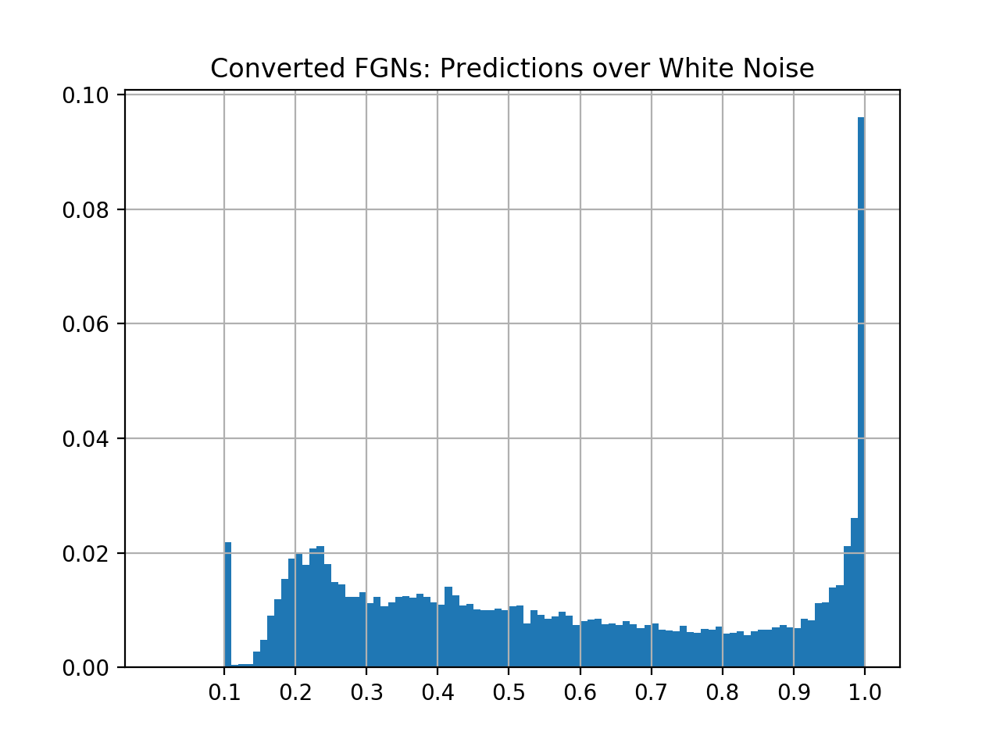

percentage of confident (>0.5) predictions: 0.5190577716431248


In [73]:
# overall histogram - white noise
bins = converted_hist_list_white_noise[0][1][1] #will be the same for all
weights=[]
for path, hist, stat in converted_hist_list_white_noise:
    #weights
    w = hist[0]
    if len(weights) == 0:
        weights=w
    else:
        weights+=w
    
s = float(np.sum(weights))
weights = [w/s for w in weights]

plt.hist(bins[:-1], weights=weights, bins=bins)
plt.xticks((np.arange(10)+1)/10.0)
plt.grid(True)
plt.title("Converted FGNs: Predictions over White Noise")
plt.show()
# % above 0.5
print("percentage of confident (>0.5) predictions:", np.sum(weights[49:]))

<IPython.core.display.Javascript object>


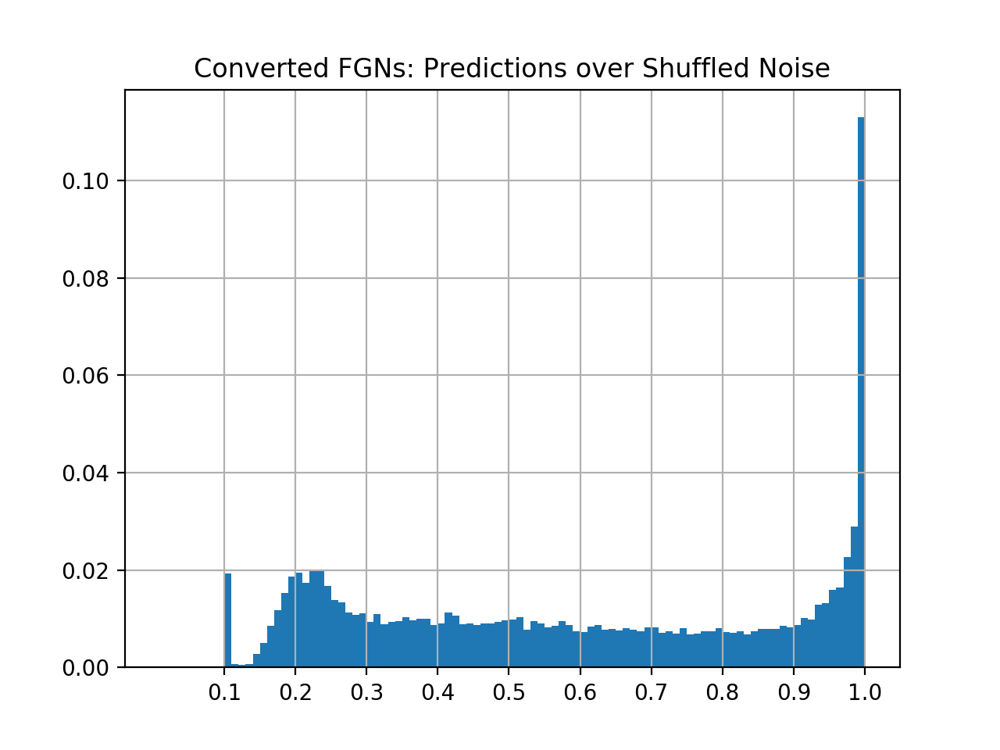

percentage of confident (>0.5) predictions: 0.5711254895937332


In [74]:
# overall histogram - white noise
weights=[]
for path, hist, stat in converted_hist_list_shuffled_noise:
    #weights
    w = hist[0]
    if len(weights) == 0:
        weights=w
    else:
        weights+=w
    
s = float(np.sum(weights))
weights = [w/s for w in weights]

plt.hist(bins[:-1], weights=weights, bins=bins)
plt.xticks((np.arange(10)+1)/10.0)
plt.grid(True)
plt.title("Converted FGNs: Predictions over Shuffled Noise")
plt.show()
# % above 0.5
print("percentage of confident (>0.5) predictions:", np.sum(weights[49:]))

<IPython.core.display.Javascript object>


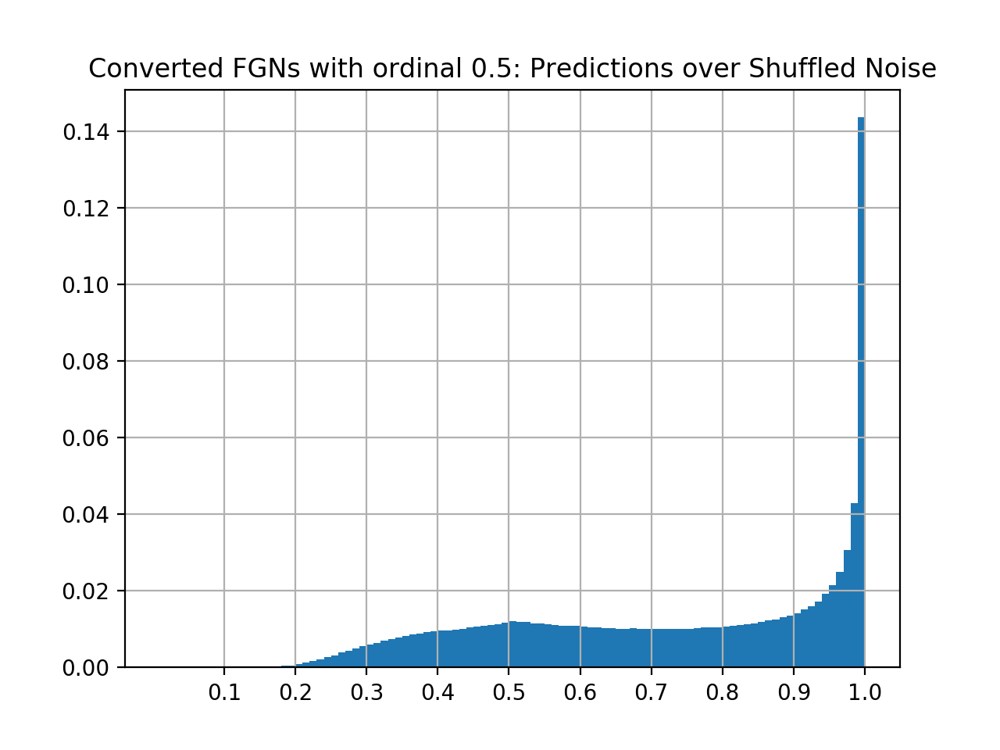

percentage of confident (>0.5) predictions: 0.7833082265587227


<IPython.core.display.Javascript object>


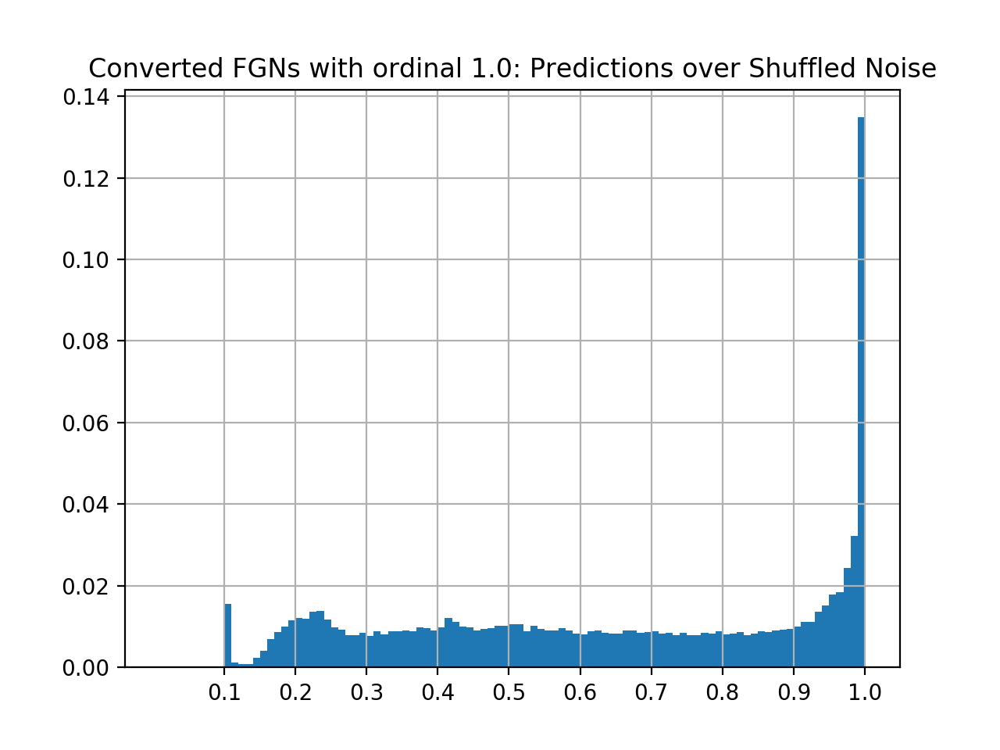

percentage of confident (>0.5) predictions: 0.6407505357243136


<IPython.core.display.Javascript object>


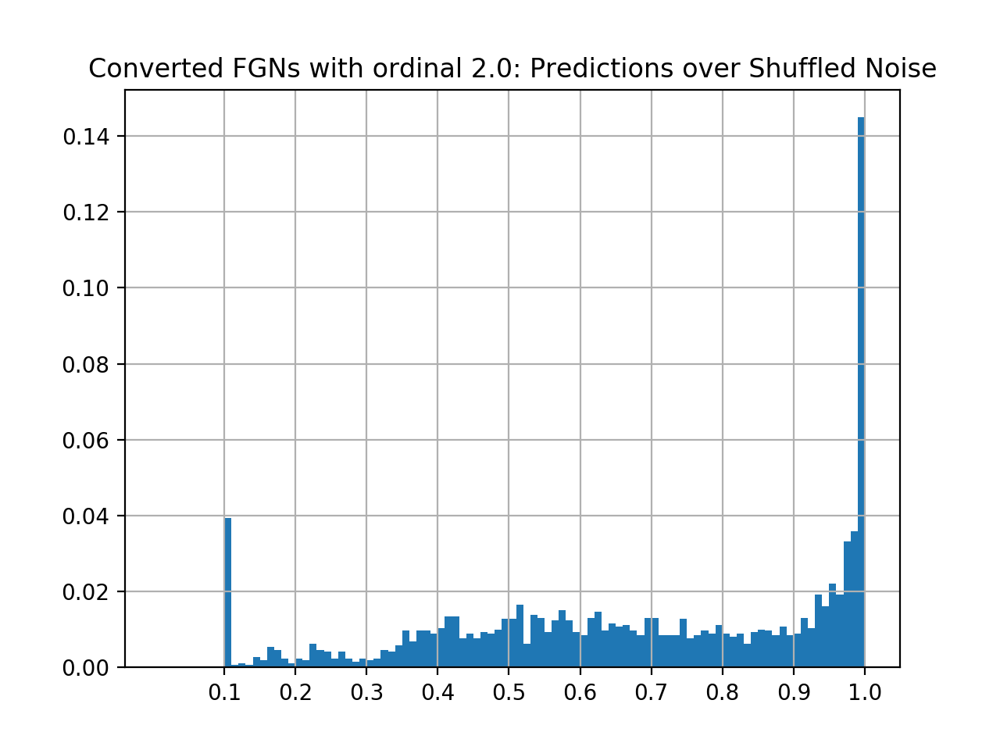

percentage of confident (>0.5) predictions: 0.7412465242018539


<IPython.core.display.Javascript object>


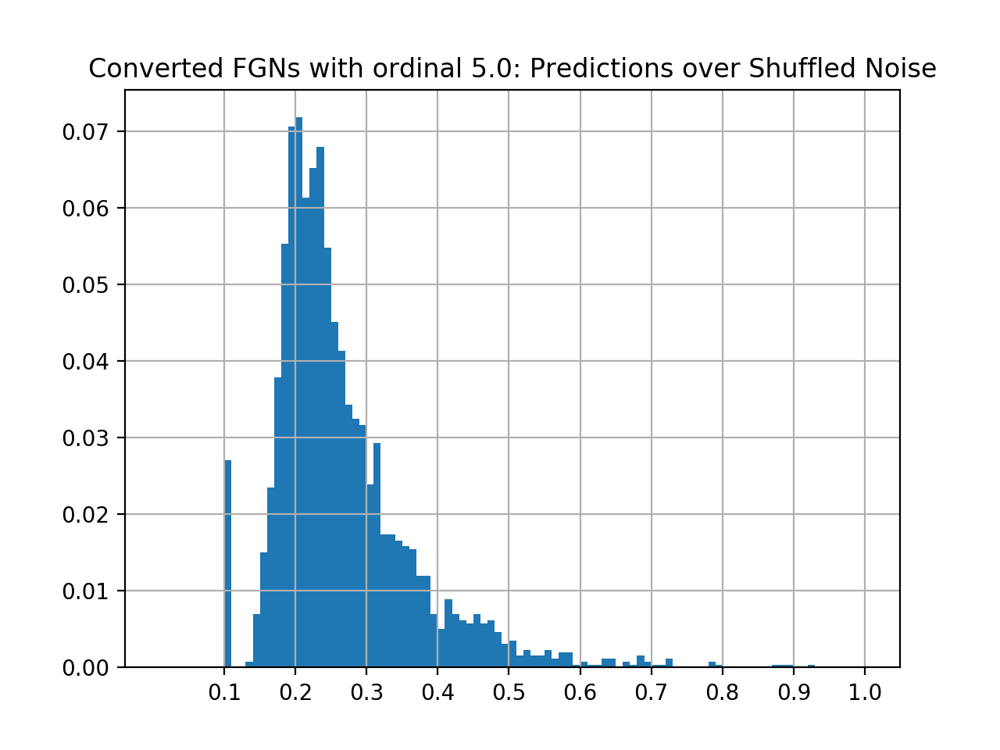

percentage of confident (>0.5) predictions: 0.030123583934088566


In [78]:
# histogram per param - shuffled noise

for ordinal in ordinals:
    weights=[]
    for path, hist, stat in converted_hist_list_shuffled_noise:
        if str(ordinal) in path:
            #weights
            w = hist[0]
            if len(weights) == 0:
                weights=w
            else:
                weights+=w

    s = float(np.sum(weights))
    weights = [w/s for w in weights]

    plt.hist(bins[:-1], weights=weights, bins=bins)
    plt.xticks((np.arange(10)+1)/10.0)
    plt.grid(True)
    plt.title("Converted FGNs with ordinal {}: Predictions over Shuffled Noise".format(ordinal))
    plt.show()
    # % above 0.5
    print("percentage of confident (>0.5) predictions:", np.sum(weights[49:]))

<IPython.core.display.Javascript object>


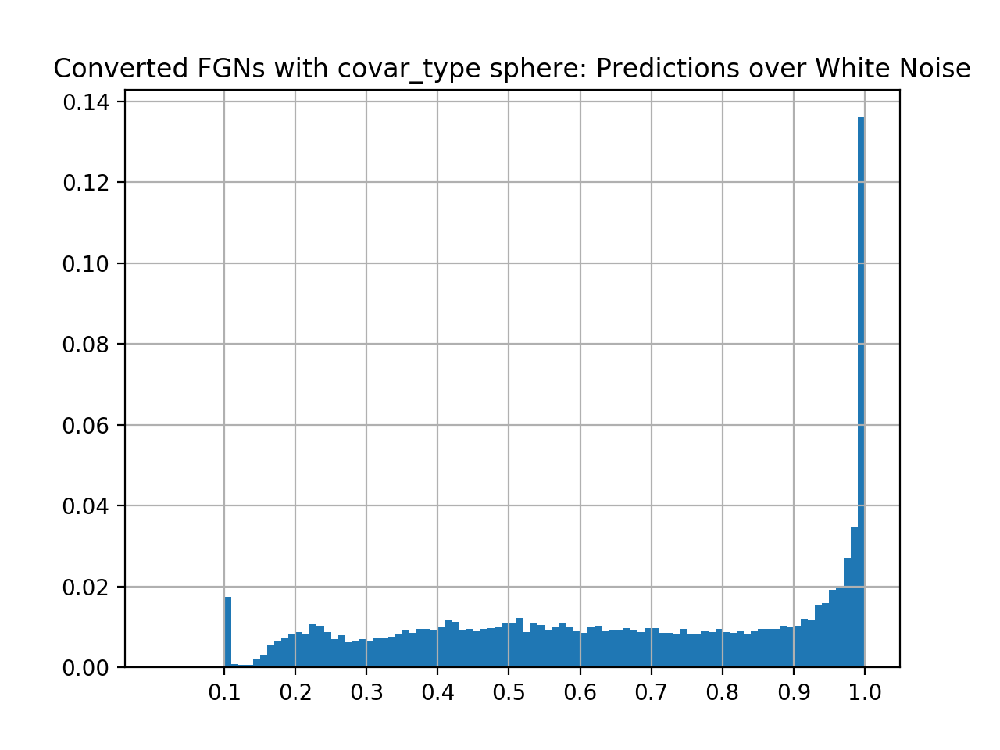

percentage of confident (>0.5) predictions: 0.6809418917751096


<IPython.core.display.Javascript object>


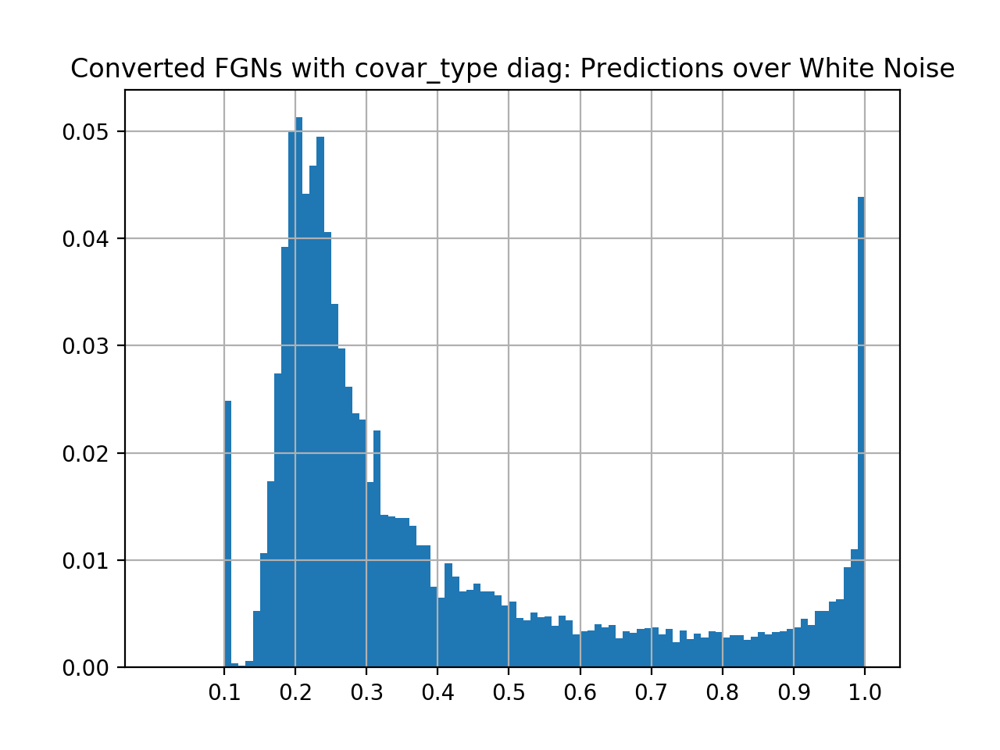

percentage of confident (>0.5) predictions: 0.24283692418823732


In [79]:
# histogram per param - shuffled noise

for covar_type in covar_types:
    weights=[]
    for path, hist, stat in converted_hist_list_shuffled_noise:
        if str(covar_type) in path:
            #weights
            w = hist[0]
            if len(weights) == 0:
                weights=w
            else:
                weights+=w

    s = float(np.sum(weights))
    weights = [w/s for w in weights]

    plt.hist(bins[:-1], weights=weights, bins=bins)
    plt.xticks((np.arange(10)+1)/10.0)
    plt.grid(True)
    plt.title("Converted FGNs with covar_type {}: Predictions over White Noise".format(covar_type))
    plt.show()
    # % above 0.5
    print("percentage of confident (>0.5) predictions:", np.sum(weights[49:]))

<IPython.core.display.Javascript object>


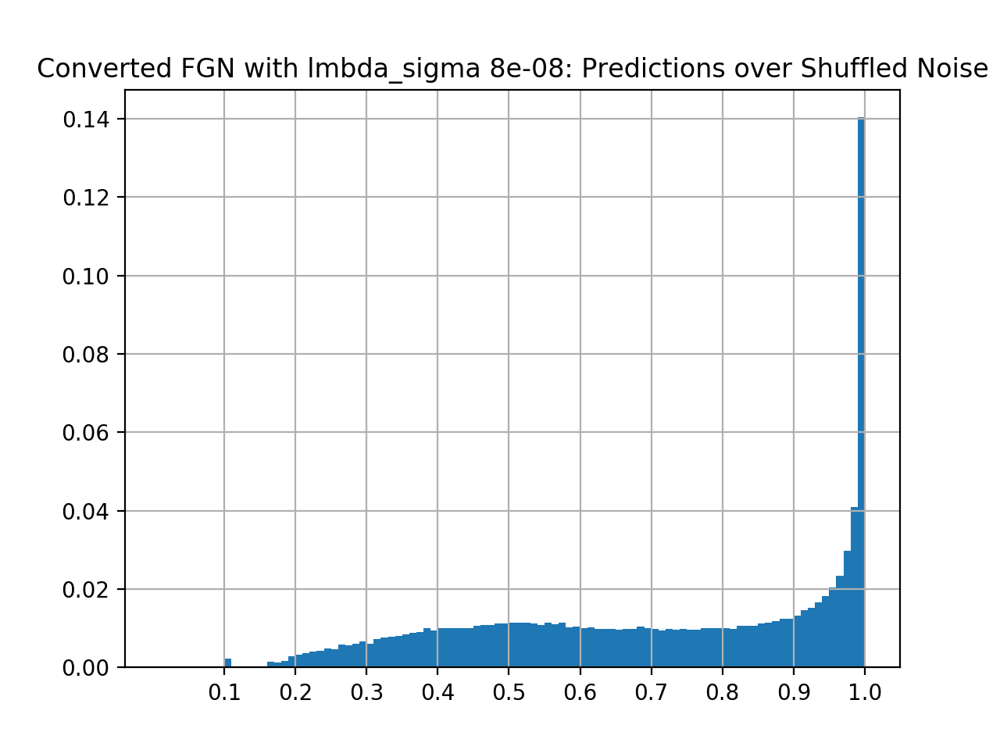

percentage of confident (>0.5) predictions: 0.7527680312275739


<IPython.core.display.Javascript object>


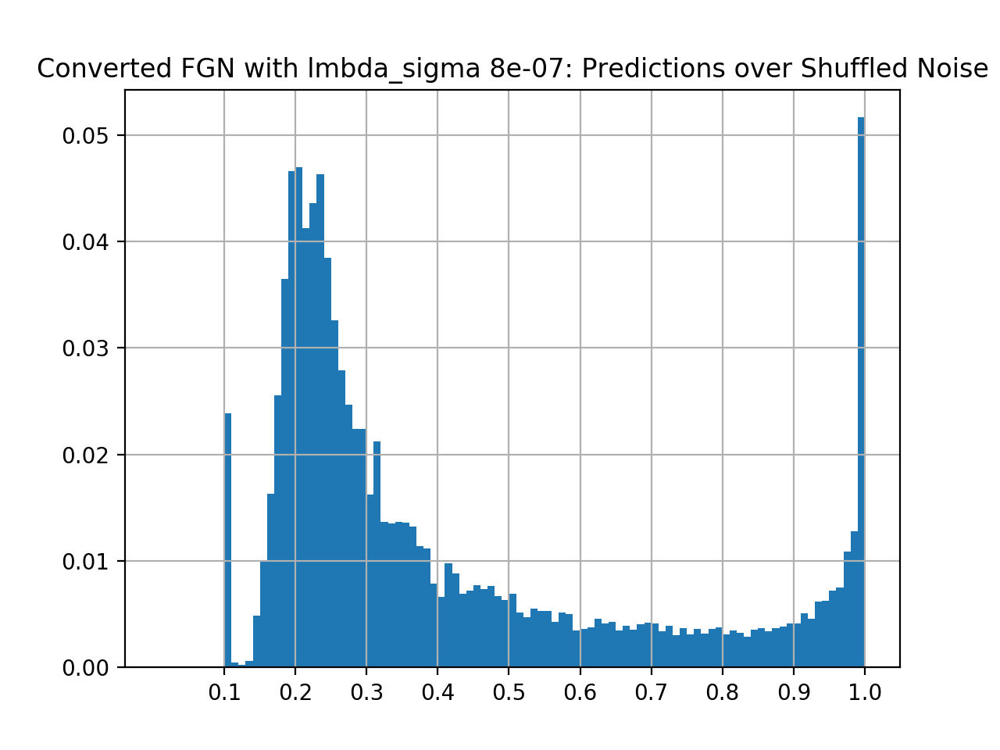

percentage of confident (>0.5) predictions: 0.2775969558650876


<IPython.core.display.Javascript object>


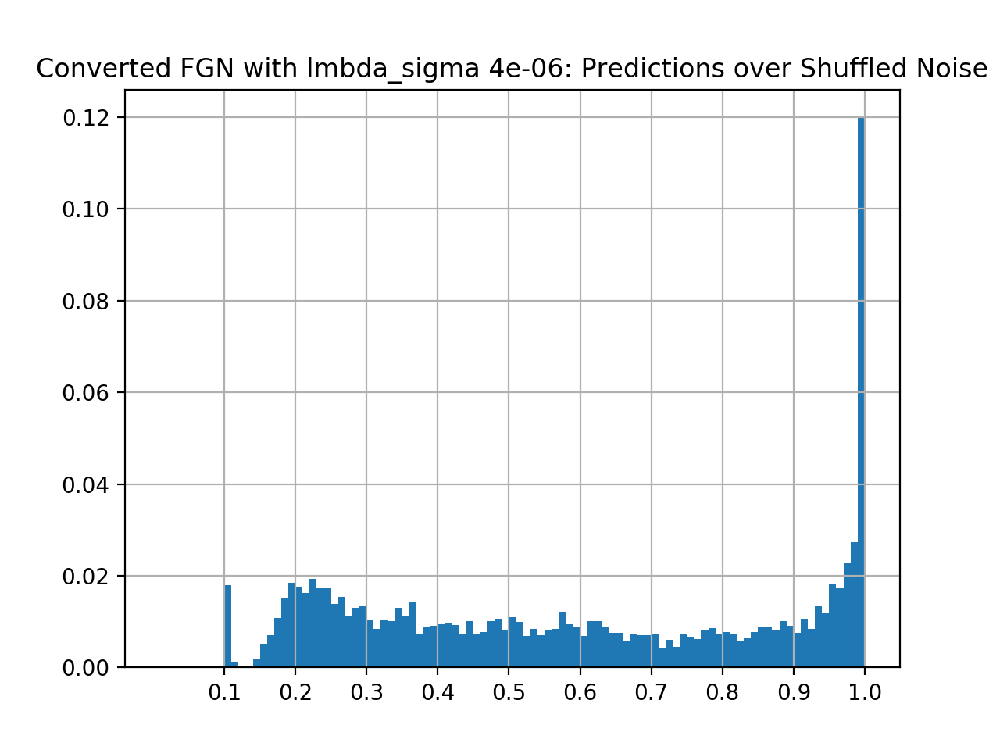

percentage of confident (>0.5) predictions: 0.5730952626634009


<IPython.core.display.Javascript object>


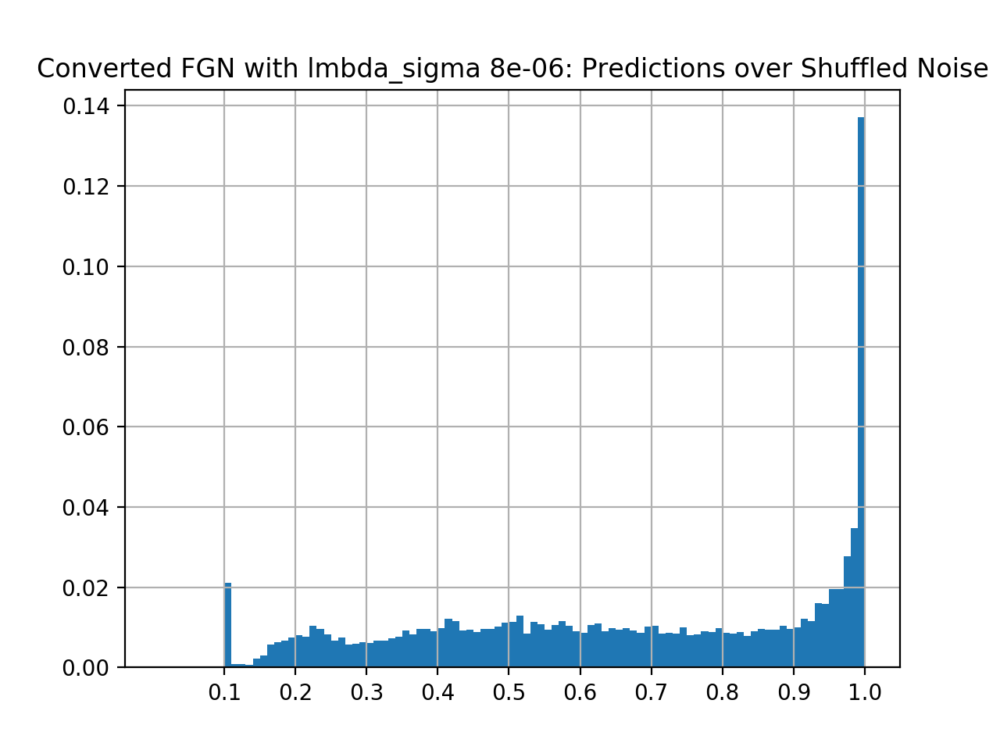

percentage of confident (>0.5) predictions: 0.687263586307962


<IPython.core.display.Javascript object>


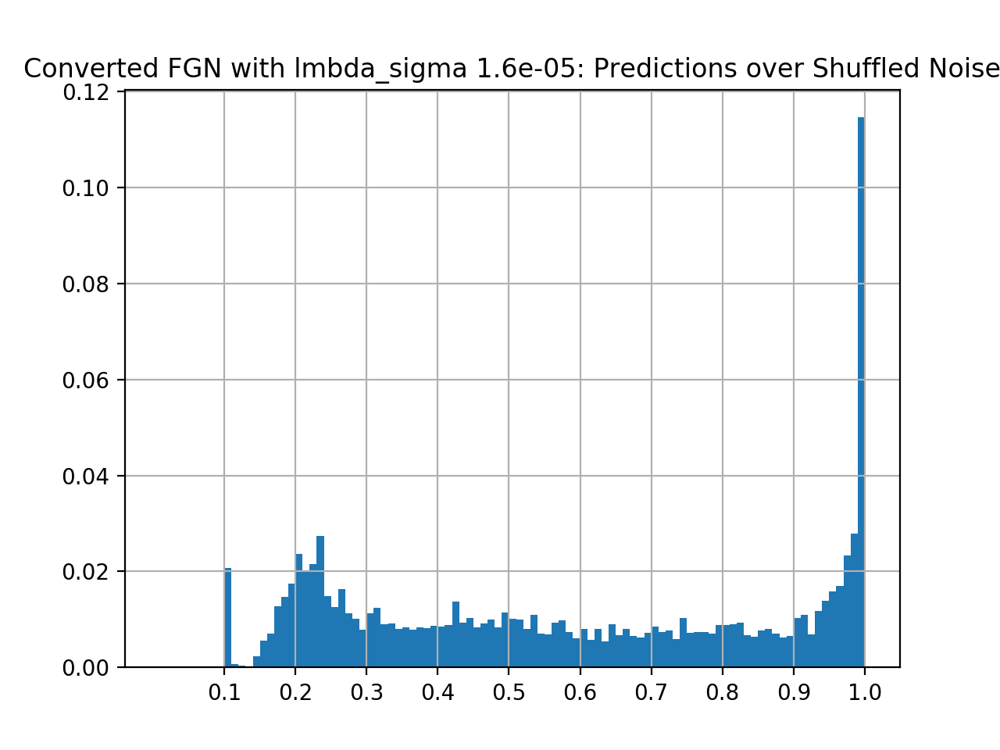

percentage of confident (>0.5) predictions: 0.5628158803136233


<IPython.core.display.Javascript object>


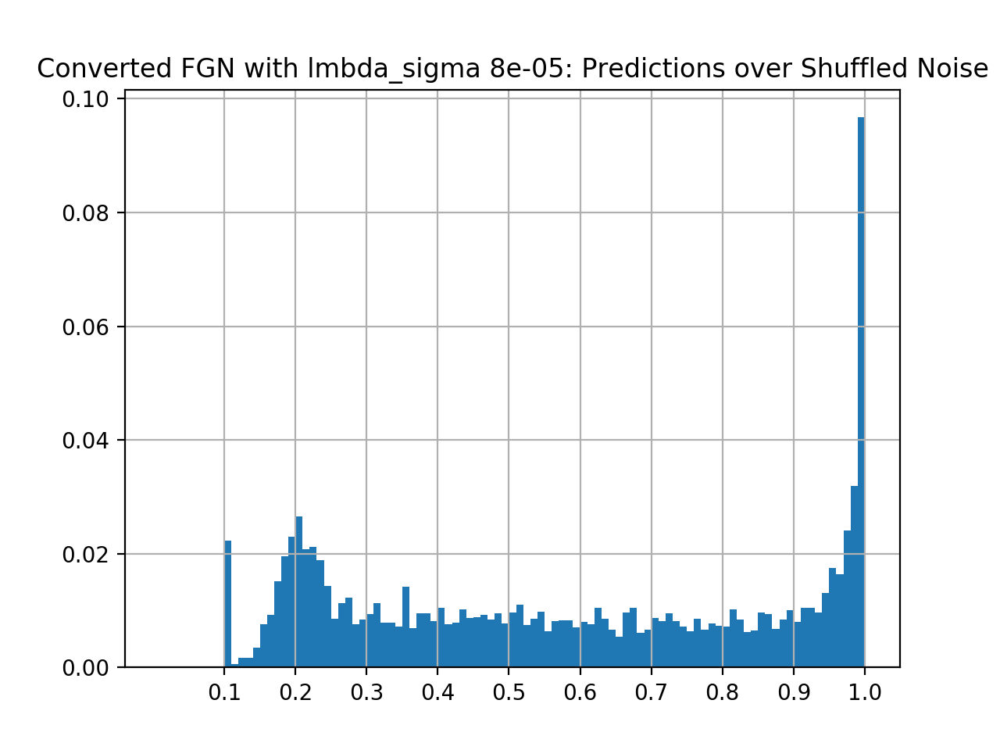

percentage of confident (>0.5) predictions: 0.5645415650945781


<IPython.core.display.Javascript object>


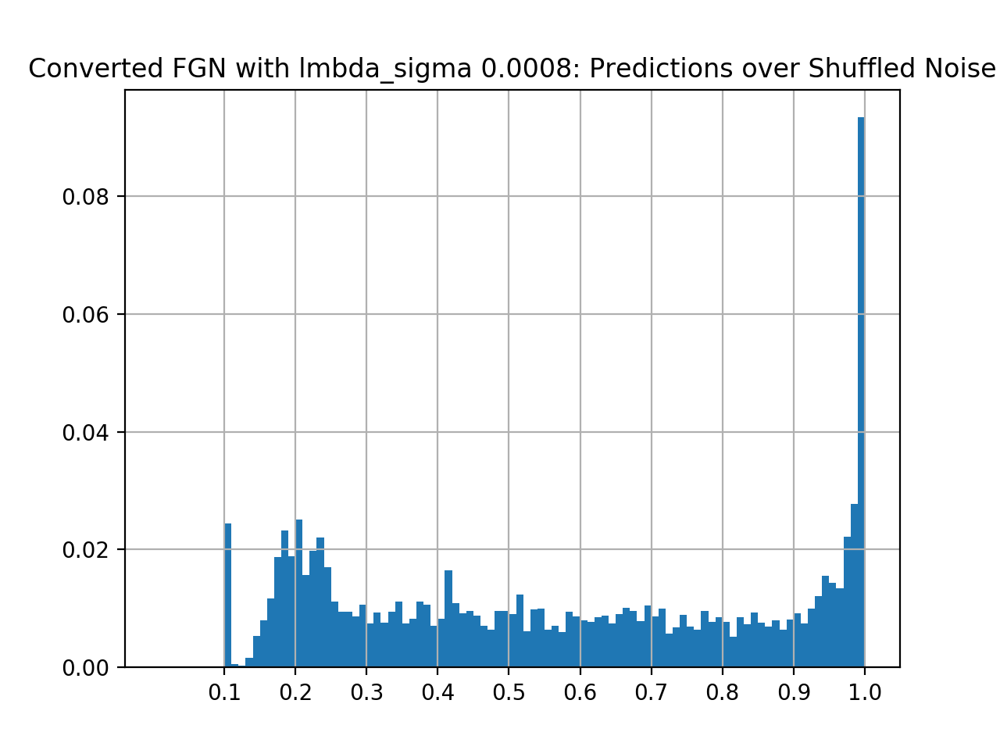

percentage of confident (>0.5) predictions: 0.5522640006335235


In [113]:
# histogram per param - shuffled noise

for ls in lmbda_sigmas:
    weights=[]
    for path, hist, stat in converted_hist_list_shuffled_noise:
        if str(ls) in path:
            #weights
            w = hist[0]
            if len(weights) == 0:
                weights=w
            else:
                weights+=w

    s = float(np.sum(weights))
    weights = [w/s for w in weights]

    plt.hist(bins[:-1], weights=weights, bins=bins)
    plt.xticks((np.arange(10)+1)/10.0)
    plt.grid(True)
    plt.title("Converted FGN with lmbda_sigma {}: Predictions over Shuffled Noise".format(ls))
    plt.show()
    # % above 0.5
    print("percentage of confident (>0.5) predictions:", np.sum(weights[49:]))